# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **1**, **3** and **5**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $2$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[102513.07919145  99311.49114414 103289.36311277 107907.47516136
  98836.78217111  98836.8632545  108210.8396583  103909.25524514
  97681.39567448 102748.19189447  97710.96299701  97699.67501518
 101216.39487923  90882.35636359  91741.80142467  97229.42162275
  95064.94010846 101582.64927056  95564.10889559  93186.14722757
 107598.51912228  98878.1631456  100338.00021993  93128.21875062
  97316.44990982 100555.8056843   94410.89003523 101895.05002056
  97043.27335419  98553.01252306  97038.09499273 109697.46842654
  99932.57873647  94851.98731243 104195.7937909   94081.93986744


Omni_P_RQi ================== 0.09754852823534868
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102513.07919145311, 'S': 10000, 'W': 10000, 'P': 0.09754852823534868, 'dP': 0}, 'j': {'R': 93171.86695583671, 'S': 10000, 'W': 10000, 'P': 0.10732853517618124}, 'k': {'R': 93171.86695583671, 'S': 10000, 'W': 10000, 'P': 0.10732853517618124}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10069328216496307
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99311.49114413881, 'S': 10000, 'W': 10000, 'P': 0.10069328216496307, 'dP': 0}, 'j': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307295}, 'k': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307295}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10069328216496307
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.09623781805006797
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103909.25524514152, 'S': 10000, 'W': 10000, 'P': 0.09623781805006797, 'dP': 0}, 'j': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}, 'k': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09623781805006797
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103909.25524514152, 'S': 10000, 'W': 10000, 'P': 0.09623781805006797, 'dP': 0}, 'j': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}, 'k': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09623781805006797
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.10284952674922163
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97229.42162274636, 'S': 10000, 'W': 10000, 'P': 0.10284952674922163, 'dP': 0}, 'j': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165841}, 'k': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165841}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10284952674922163
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97229.42162274636, 'S': 10000, 'W': 10000, 'P': 0.10284952674922163, 'dP': 0}, 'j': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165841}, 'k': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165841}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10519125124983666
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.10113456482069816
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98878.16314559751, 'S': 10000, 'W': 10000, 'P': 0.10113456482069816, 'dP': 0}, 'j': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}, 'k': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09966313837310993
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100338.0002199298, 'S': 10000, 'W': 10000, 'P': 0.09966313837310993, 'dP': 0}, 'j': {'R': 107261.10799307455, 'S': 10000, 'W': 10000, 'P': 0.09323043726758504}, 'k': {'R': 107261.10799307455, 'S': 10000, 'W': 10000, 'P': 0.09323043726758504}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09966313837310993
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10146823261906608
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98553.0125230641, 'S': 10000, 'W': 10000, 'P': 0.10146823261906608, 'dP': 0}, 'j': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}, 'k': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10146823261906608
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98553.0125230641, 'S': 10000, 'W': 10000, 'P': 0.10146823261906608, 'dP': 0}, 'j': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}, 'k': {'R': 97515.5756621723, 'S': 10000, 'W': 10000, 'P': 0.10254772052665168}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10305231157670189
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'poo

Omni_P_RQi ================== 0.09896176113921912
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101049.13135015886, 'S': 10000, 'W': 10000, 'P': 0.09896176113921912, 'dP': 0}, 'j': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}, 'k': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09896176113921912
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101049.13135015886, 'S': 10000, 'W': 10000, 'P': 0.09896176113921912, 'dP': 0}, 'j': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}, 'k': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11028771425925808
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865903, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865903, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10920940360846627
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91567.20639050141, 'S': 10000, 'W': 10000, 'P': 0.10920940360846627, 'dP': 0}, 'j': {'R': 101495.0624438623, 'S': 10000, 'W': 10000, 'P': 0.09852696041771565}, 'k': {'R': 101495.0624438623, 'S': 10000, 'W': 10000, 'P': 0.09852696041771565}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09839363346941248
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101632.5919411106, 'S': 10000, 'W': 10000, 'P': 0.09839363346941248, 'dP': 0}, 'j': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}, 'k': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09839363346941248
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.09835834117823271
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101669.05907735114, 'S': 10000, 'W': 10000, 'P': 0.09835834117823271, 'dP': 0}, 'j': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244827}, 'k': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244827}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09835834117823271
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101669.05907735114, 'S': 10000, 'W': 10000, 'P': 0.09835834117823271, 'dP': 0}, 'j': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244827}, 'k': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244827}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09835834117823271
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107011.8806288213, 'S': 10000, 'W': 10000, 'P': 0.09344756807597604, 'dP': 0}, 'j': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}, 'k': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107011.8806288213, 'S': 10000, 'W': 10000, 'P': 0.09344756807597604, 'dP': 0}, 'j': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}, 'k': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297176}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.10017917872411247
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99821.14175181459, 'S': 10000, 'W': 10000, 'P': 0.10017917872411247, 'dP': 0}, 'j': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}, 'k': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10017917872411247
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99821.14175181459, 'S': 10000, 'W': 10000, 'P': 0.10017917872411247, 'dP': 0}, 'j': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}, 'k': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10017917872411247
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.0995425320688693
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100459.57031795634, 'S': 10000, 'W': 10000, 'P': 0.0995425320688693, 'dP': 0}, 'j': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.10133124138568564}, 'k': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.10133124138568564}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11044157014721001
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90545.61599106912, 'S': 10000, 'W': 10000, 'P': 0.11044157014721001, 'dP': 0}, 'j': {'R': 114559.43301380739, 'S': 10000, 'W': 10000, 'P': 0.08729093481804105}, 'k': {'R': 114559.43301380739, 'S': 10000, 'W': 10000, 'P': 0.08729093481804105}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.11044157014721001
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset

Omni_P_RQi ================== 0.10253891442519447
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97523.95035638232, 'S': 10000, 'W': 10000, 'P': 0.10253891442519447, 'dP': 0}, 'j': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}, 'k': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09552888359179594
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104680.38172340585, 'S': 10000, 'W': 10000, 'P': 0.09552888359179594, 'dP': 0}, 'j': {'R': 102392.89224574876, 'S': 10000, 'W': 10000, 'P': 0.09766302895321513}, 'k': {'R': 102392.89224574876, 'S': 10000, 'W': 10000, 'P': 0.09766302895321513}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09552888359179594
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.A

Omni_P_RQi ================== 0.1016507651879094
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98376.04253656346, 'S': 10000, 'W': 10000, 'P': 0.1016507651879094, 'dP': 0}, 'j': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348441}, 'k': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348441}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1016507651879094
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98376.04253656346, 'S': 10000, 'W': 10000, 'P': 0.1016507651879094, 'dP': 0}, 'j': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348441}, 'k': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348441}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10197863767899706
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.10117910080273107
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98834.63996677539, 'S': 10000, 'W': 10000, 'P': 0.10117910080273107, 'dP': 0}, 'j': {'R': 94448.74823261805, 'S': 10000, 'W': 10000, 'P': 0.10587752815284515}, 'k': {'R': 94448.74823261805, 'S': 10000, 'W': 10000, 'P': 0.10587752815284515}}}
config_param a value =============  1.5
configs fourth [<cadCAD.configuration.Configuration object at 0x0000014DBCC79550>, <cadCAD.configuration.Configuration object at 0x0000014DBCC798E0>, <cadCAD.configuration.Configuration object at 0x0000014DBCC794F0>, <cadCAD.configuration.Configuration object at 0x0000014DBCE21760>, <cadCAD.configuration.Configuration object at 0x0000014DBCE21A60>, <cadCAD.configuration.Configuration object at 0x0000014DBCE21A90>, <cadCAD.configuration.Configuration object at 0x0000014DBCD98520>, <cadCAD.configuration.Configuration object at 0x0000014DBCD98A00>, <cadCAD.conf

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

POOL Class    1.5  R over W=  9.830207693960515 Q over Wq =  1.0
1 Asset  i  Class Price =  0.10304321952518354
POOL Class   A value =  1 Asset  j  Class Price =  0.10304321952518354
POOL Class   A value =  1 Asset  k  Class Price =  0.10304321952518354
 Asset  k  Class Price =  0.10419514878315111
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
1 Asset  i  Class Price =  0.10287867707995428
POOL Class   A value =  1 Asset  j  Class Price =  0.10287867707995428
POOL Class   A value =   A value =   Class Price = POOL Class   A value =  POOL Class  Asset POOL Class 1  1  0.09071011963954002  A value =  0.5 Asset  i  Class Price =  0.10206463536658184
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10206463536658184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10206463536658184
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
0.5 k A value =  A value =  POOL Class Asset  k  Class Price =  0.10287867707995428
POOL Class 

7  160000      A value = 4981.523766801187
addliq - Sq delta S 4981.523766801187
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4979.406399842936
POOL ADD LIQUIDITY Timestep ===  10 delta W  4979.406399842936
POOL Class Asset 
POOL Class     A value = 1 0.5 Asset  i  Class Price =  0.09863133575723514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09863133575723514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09863133575723514
POOL Class   A value =  0.5  R over W=  A value =  POOL Class  A value =   j   Class Price =  0.0951345403283082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0951345403283082
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
 R over W=  9.792002237289104 Q over Wq =  1.0
0.5  10.12952650144279 POOL Class  Asset  i  Class Price =  0.0857565736851371
POOL Class  1 Asset   A value =  0.5 Asset  j  Class Price =  0.0857565736851371
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0857565736851371
POOL Class   

POOL Class   A value =  1.5 Asset  POOL Class  POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.10696795964039808
POOL Class   A value =   A value =  1 Asset  i  Class Price =  A value =  0.5 Asset  k  Class Price =  0.10561429020052233
POOL Class   A value =  0.5  R over W=     kjPOOL Class 1 Asset  j  Class Price =  0.10696795964039808
POOL Class   A value =  1 Asset  k  Class Price =  0.10696795964039808
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
 0.10966821090736538  10.12952650144279 A value =  0.5
 Class Price =  Class Price =    A value =  0.08429388289342832
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08429388289342832
POOL Class   A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1 Asset  j  Class Price =  0.10966821090736538
POOL Class   A value =  1 Asset  k  Class Price =  0.10966821090736538
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
POOL Class 1.5 Q

   A value =  A value =  0.5j  Class Price =  0.10931650306247187
POOL Class   A value =  1 Asset  k  Class Price =  0.10931650306247187
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
  1.5 Asset  i  Class Price =  0.10310563097594293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10310563097594293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10310563097594293
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
POOL Class Asset j 0.5Q over Wq =    Class Price =   POOL Class Asset  Class Price = 1.0  A value =  1 Asset  j  Class Price =  0.09731029946771168
POOL Class   A value =  1 0.10085611659784027
POOL Class   A value =  0.5
POOL Class POOL Class  0.10857801839842944
POOL Class   A value =  1 Asset  k  Class Price =  0.10857801839842944
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
    i  A value =  1.5 Asset  i  Class Price =  0.10176529139302834
POOL Class   A value =  1.5 Asset  j  Cl

 i  Class Price =  0.10297344472499355
POOL Class   A value =  1 Asset  j  Class Price =  0.10297344472499355
POOL Class   A value =  1 Asset  k  Class Price =  0.10297344472499355
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq =  1.0
0.08935690836162535Asset 0.09847757252502695 POOL Class 
POOL Class Asset  k  Class Price =  0.10634933973939384
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
Q over Wq =  1.0
 POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10805127025279185
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class  A value = 
 0.10805127025279185  A value =    A value = 
k POOL Class  1POOL Class  A value = 1 POOL Class   A value =  1 Asset  i  Class Price =  0.10488380352642451
  A value =  1.5 Asset  j  Class Price =  0.09847757252502695
POOL Class   A value =  1 Asset POOL Class   A value =  1.5  A value =  0.5 Asset  0.5 Asset  k  Class Price =  0.09847757252502695
POOL Class   A value =  1.5  

POOL Class    A value =  1 Asset  i  Class Price =  0.10713634425015386
POOL Class   A value =  1 Asset  j  Class Price =  0.10713634425015386
POOL Class   A value =  1 Asset  k  Class Price =  0.10713634425015386
POOL Class   A value =  1  R over W=  9.962869380275205 Q over Wq = i0.5 A value =   Class Price =  0.11183817051383178
POOL Class   A value =  1 Asset  j  Class Price =  0.11183817051383178
POOL Class   A value =  1 Asset  k  Class Price =  0.11183817051383178
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.11356981840677503
POOL Class   A value =  1 Asset  j  Class Price =  0.11356981840677503
POOL Class   A value =  1 Asset  k  Class Price =  0.11356981840677503
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
0.5 Asset  1.0
iPOOL Class   POOL Class  Class Price =   A value =  Asset  j  Class Price =  0.09069157758018112
POOL Class   A value =  0.5 Asset  k  Class Price 

 POOL Class j  A value =  0.5 Asset  j  Class Price =  0.1010915206899119
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.09718372964740789
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09718372964740789
POOL Class   A value =  A value = Asset        Class Price = 0.5 Class Price = 0.5  1 A value =  1.5 Asset  i  Class Price =  0.09631001627155943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09631001627155943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09631001627155943
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
  Asset  k  Class Price =  0.09718372964740789
POOL Class   A value =  0.5  R over W= Asset  k  Class Price =     9.919731364865871 Q over Wq =  1.0
0.1036561390343968110.09073321317640289POOL Class 
i0.1010915206899119 Asset POOL Class POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.09893325678634436
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09893325678634436
POOL Class   A v

POOL Class    A value =  0.5 Asset  i  Class Price =  0.10537321272791293
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10537321272791293
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10537321272791293
POOL Class  POOL Class  A value = 
 POOL Class  A value =  1 Asset  i  Class Price =  0.1011694315903991
POOL Class   A value =  1 Asset  j  Class Price =  0.1011694315903991
POOL Class   A value =  1 Asset  k  Class Price =  0.1011694315903991
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
 R over W=  10.988348942634628 Q over Wq =  1.0
  POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.1028978657155458
POOL Class   A value =  1 Asset  j  Class Price =  0.1028978657155458
POOL Class   A value =  1 Asset  k  Class Price =  0.1028978657155458
POOL Class   A value =  1  R over W=  10.203951286584767 A value =  0.5  A value =  A value =  POOL Class  1 Asset  Q over Wq =  1.0
i  Class Price =  0.10015313645408992
POOL Class   A va

POOL Class   i 0.1117676235204539
POOL Class   A value =  1 Asset  k  Class Price =  0.1117676235204539
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
  R over W=  A value = 1.0 POOL Class 1.5 
 Class Price = 0.5POOL Class    Asset 9.9197313648658710.10912511429128095   Class Price = POOL Class   Q over Wq =  1.0 A value =    A value =  1 Asset  i  Class Price = j  Class Price =  0.10160688523516126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10160688523516126
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
 A value =   

 R over W=  POOL Class POOL Class  1 Asset  i   A value =  0.11353014926439052   Class Price = 0.10068398013557917 A value =  
1.51.5
POOL Class 0.10385477689981694POOL Class   POOL Class 9.317186695583672   A value =  0.5 Asset  i  Class Price =  0.10205327617507887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10205327617507887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10205327617

POOL Class   A value =  0.5 0.5 Asset  i  Class Price =  0.10050008790171819
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10050008790171819
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10050008790171819
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
 Asset  i Asset POOL Class  i  Class Price =  0.09611298807022164
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09611298807022164
  A value =  1.5 Asset  i  Class Price =  0.09921091068566801
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09921091068566801
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09921091068566801
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.100895804141097
POOL Class   A value =  1.5 Asset  j  Class Price =  0.100895804141097
POOL Class   A value =  1.5 Asset  k  Class Price =  0.100895804141097
POOL Class   A value =  1.5  R over W=  9

POOL Class POOL Class 0.099700849852144171 POOL Class  A value =   A value =   
   A value =  0.5 Asset  i  Class Price =  0.10729443415350845
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10729443415350845
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10729443415350845
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class   1 Asset  i  Class Price =  0.11398924141698634
POOL Class   A value =  1 Asset  j  Class Price =  0.11398924141698634
POOL Class   A value =  1 Asset  k  Class Price =  0.11398924141698634
POOL Class   A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
 A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
 i A value = Asset 1.5POOL Class  Asset  i  Class Price =    A value =  1 Asset  i  Class Price =  0.11247643211831072
POOL Class   A value =  1 Asset  j  Class Price =  0.11247643211831072
POOL Class   A value =  1 Asset  k  Class Price =  0.11247643211831072
POOL Class   A value =  1  R over W= 

 
POOL Class j0.5POOL Class  POOL Class  A value =  0.10678683677360264 1 Asset  j  Class Price =  0.10982803818418582
POOL Class   A value =  1 Asset  k  Class Price =  0.10982803818418582
POOL Class   A value =    A value =  1.5 Asset  j  Class Price =  0.10058163220406253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10058163220406253
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
 1 Asset  A value = 
 0.5  A value =   POOL Class POOL Class 0.5   Class Price =  R over W= i  A value =  1.5 Asset  i  Class Price =  0.1020614517080449
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1020614517080449
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1020614517080449
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
 A value =     1Asset   9.792002237289104Asset  Class Price = POOL Class   1.5  0.10000358527580865   A value =  1.5 Asset  i  Class Price =  0.10078695707724102
POOL Class   A value =  1.5 Asset  j  C

POOL Class   A value =  1.5 Asset  k  Class Price =  0.108734966858769491 Asset  j  Class Price =  0.10799962436711366
 
POOL Class  Class Price =  0.10702936186881655
POOL Class   A value =  0.5 Asset POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11041826770320352
POOL Class   A value =  1.5 j Asset  j  Class Price =  0.11041826770320352
POOL Class   A value =  1.5 Asset   A value =  1 Asset  k  Class Price =  0.10799962436711366
POOL Class   A value =  1  R over W=  10.203951286584767 k  Class Price =  0.11041826770320352
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10260596900840976
POOL Class   A value =  1 Asset   j   Class Price =  0.10260596900840976 Class Price =  0.10702936186881655
POOL Class   A value =  0.5 Asset 
POOL Class   A value =  1 Asset   A value =  k  Class Price =  0.10260596900840976
PO

  R over W=  A value = Asset  0.5POOL Class  Class Price = Asset     1 Asset  i  Class Price =  0.11208053141055445
POOL Class   A value =  1 Asset  j  Class Price =  0.11208053141055445
POOL Class   A value =  1 Asset  k  Class Price =  0.11208053141055445
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
  10.12952650144279Asset  Asset  j 0.10807827873110429
POOL Class i  Class Price =  0.10566888665436915
POOL Class   A value =  1 Asset  j  Class Price =  0.10566888665436915
POOL Class   A value =  1 POOL Class  i  A value =  1.5 Asset  k  Class Price =  0.10807827873110429
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =    Asset   A value =  1 Asset  i  Class Price =  0.11383144715208929
POOL Class   A value =  1 Asset  j  Class Price =  0.11383144715208929
POOL Class   A value =  1 Asset  k  Class Price =  0.11383144715208929
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
jQ over Wq =   Class Price = 1.0 A va

POOL Class  Q over Wq =  1.5 POOL Class  Asset  Q over Wq =   A value =   A value =  i  Class Price =  0.10262302261289018
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10262302261289018
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10262302261289018
POOL Class   A value =  1.5  R over W=  10.988348942634628 Q over Wq =  1.0
Asset  j  Class Price =  0.11713815991323946
POOL Class   A value =  0.5 Asset  k0.117253401288641441.5    Class Price =  0.11713815991323946
POOL Class   A value =  0.5  R over W=  10.12952650144279 Q over Wq =  1.0
 1.0

Asset  i1.0
POOL Class 0.5 POOL Class POOL Class   A value =  POOL Class Asset    j  Class Price =  0.10755447357398613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10755447357398613
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.11725340128864144POOL Class POOL Class  Class Price =  
0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.10412764

  0.10582196338220995  A value = 
POOL Class 1.5 Asset  i  Class Price =  0.10947942245258932
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10947942245258932
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10947942245258932
POOL Class   A value =  1.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class 0.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.11120050764364114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11120050764364114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11120050764364114
POOL Class   A value =  1.5  R over W=  9.830207693960515  POOL Class POOL Class  Q over Wq =  1.0
 A value = 1 Asset  j  Class Price =  0.10827775084351822
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10827775084351822
POOL Class   A value =  0.5  R over W=  9.919731364865871 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0971234718869637
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0971234718869637
POOL Class   A

POOL Class POOL Class Asset  k  Class Price =  0.11704681816573399
POOL Class  POOL Class 1POOL Class  A value =  1  R over W=  9.792002237289104 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09999635110076367
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09999635110076367
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09999635110076367
POOL Class   A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class    R over W=  10.203951286584767 Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09813844378622208
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09813844378622208
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09813844378622208
POOL Class   A value =  0.5  R over W=  9.317186695583672 Q over Wq =  1.0
Asset  POOL Class  A value =    POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.11916776701622744
POOL Class   A value =  1 Asset  j  Class Price =  0.11916776701622744
 A value =  1 Asset  i0.10261

POOL Class 0.5POOL Class      0.11687597495137063
POOL Class   A value =  1 Asset  j  Class Price =  0.11687597495137063
POOL Class   A value =  1 Asset  k  Class Price =  0.11687597495137063
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
  A value =  A value =   A value = Q over Wq =  1.0
POOL Class  Asset   A value =    0.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class 1POOL Class    A value =  1.5   A value =  1 Asset  i  Class Price =  0.11473754668406065
POOL Class   A value =  1 Asset  j  Class Price =  0.11473754668406065
POOL Class   A value =  1 Asset  k  Class Price =  0.11473754668406065
POOL Class   A value =  1  R over W=  10.203951286584767 Q over Wq =  1.0
POOL Class  i1.5 A value =  A value =  Asset   A value =  1 Asset  i  Class Price =  0.11265727520326195
POOL Class   A value =  1 Asset  j  Class Price =  0.11265727520326195
POOL Class   A value =  1 Asset  k  Class Price =  0.11265727520326195
POOL Class   A value =  1  R over 

Asset POOL Class   POOL Class 
POOL Class POOL Class k A value =   POOL Class 
   Class Price =  0.09097013772080487
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
 A value =  1 Asset  k POOL Class   A value =  A value =  Class Price =    A value =  POOL Class  A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
     A value =  0.5 Asset  i  Class Price =  0.08931474280635987
POOL Class   A value =  0.5 Asset  1.5 Asset  k  Class Price =  0.09544913029861066
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09868567005559316
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09868567005559316
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09868567005559316
j  Class Price =  0.08931474280635987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08931474280635987
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.09632090458

9.919731364865871  POOL Class 4430.238279553249k   5229.074818333833 
  Class Price =  0.09119421845107399
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
addliq - Sq delta S A value =  A value = 
Q over Wq =  addliq - Sq delta S 
  A value = POOL Class 1.5 Asset  k  Class Price =  0.09316665832649267
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =     A value =  0.5 Asset  i  Class Price =  0.08950021167781162addliq - Sq delta S 4430.238279553249

POOL Class   A value =  0.5 Asset  j  Class Price =  0.08950021167781162
POOL Class   Wq ADD LIQUIDITY Timestep ===  10  delta W =  4429.548794551286
POOL ADD LIQUIDITY Timestep ===  10 delta W  4429.548794551286
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08859097589102571
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08859097589102571
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08859097589102571
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over 

POOL Class   A value =  1 Asset  i  Class Price = POOL Class POOL Class   
POOL Class  A value =  0.08835034619280485      A value =  0.5 Asset  i  Class Price =  0.09301960771931536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09301960771931536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09301960771931536
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
 A value = 
0.091715312133678581.5 A value =  A value =  
POOL Class   A value =  1 Asset  j  Class Price =  0.09171531213367858
POOL Class   A value =  1 Asset  k  Class Price =  0.09171531213367858
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1.5 Asset  k  Class Price =  0.08835034619280485
 11 Asset  k  Class Price =  0.10790822074144547
POOL Class   A value =  1  R over W=  10.12952650144279   POOL Class   A value =  Asset  k  Class Price =  0.09309071178192946
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08887122623436589  POOL Class  A value =   A value =  
Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09653392501504511
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09653392501504511
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09653392501504511
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
  Asset POOL Class   A value = 1.01.511 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09812996120491779
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09812996120491779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09812996120491779
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
 i  
 0.5 Asset  Class Price =  0.08824847600841126
POOL Class   A value =  1 Asset  j  Class Price =  0.08824847600841126
POOL Class   A value =  1 Asset  k  Class Price =  0.08824847600841126
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq

POOL Class  1   A value =  1.5 Asset  i  Class Price =  0.08852674977622192
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08852674977622192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08852674977622192
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0 iAsset 
  A value = POOL Class i  Asset   A value =  1.5 Asset  i  Class Price =  0.08740985595610751
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08740985595610751
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08740985595610751
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
POOL Class   1.5 Class Price =   A value =  1.5 Asset  i  Class Price =  0.08631396649785925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08631396649785925
POOL Class   A value =  1.5i  Class Price =  0.10210149363667043
POOL Class   A value =  1 Asset  j  Class Price =  0.10210149363667043
POOL Class   A value =  1 Asset  k  Class Price =  0.10210149363667043
POOL Cl

 POOL Class  A value =  0.5POOL Class  1.50.5 1  POOL Class  Asset  Asset  A value =  1.0  A value =  1 Asset  i  Class Price =  0.09490556034042737
POOL Class   A value =  1 Asset  j  Class Price =  0.09490556034042737
POOL Class   A value =  1 Asset  k  Class Price =  0.09490556034042737
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class  R over W=  Asset 
  A value =   A value =  1 Asset  i  Class Price =  0.09661744678526608
POOL Class   A value =  1 Asset  j  Class Price =  0.09661744678526608
POOL Class   A value =  1 Asset  k  Class Price =  0.09661744678526608
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
 1.5 POOL Class  j  A value =  1.5 Asset  i  Class Price =  0.11154159253023198
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11154159253023198
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11154159253023198
k  Class Price =  0.08976972730054067
POOL Class   A value =  1.5  R over W=  9.7920022372891

1   0.5Asset 10.12952650144279Asset    R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class  1.5  POOL Class   Q over Wq = iPOOL Class  A value = j  Class Price =  0.09739575598175755
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09739575598175755
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
    Asset  j  Class Price =  0.097486639781125391.0
   A value = 
 Class Price = POOL Class   A value =  1 Asset  k  Class Price =  0.09748663978112539
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
Asset  j 0.5 Asset  i  Class Price =  0.09419755069749387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09419755069749387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09419755069749387
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
 A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.11325458818393011
POOL Class   A value =  POOL Class POOL Class   Class Price =   1.5POOL Clas

 R over W= POOL Class  9.607040996773634   POOL Class POOL Class  Class Price =  Asset  A value =     Class Price =   k  Class Price =  0.09407418685323682
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class 0.09682138323781689
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09682138323781689
0.1056379331906027
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1056379331906027
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
 POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
POOL Class   A value = Q over Wq =   0.09435594987761133  A value =  1POOL Class   A value =   A value = 
  A value =  0.5 Asset  i  Class Price =  0.1072359238269791
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1072359238269791
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1072359238269791
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
1.0
POOL Class POOL Class   A value 

 A value =  A value =  Class Price = Asset    0.09174584496616062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09174584496616062
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class 1.0POOL Class 
 1.5 Asset  i  Class Price =  0.09630018967929134
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09630018967929134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09630018967929134
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
1 Asset  i  Class Price =  0.09913026700565568
POOL Class   A value =  1 Asset  j  Class Price =  0.09913026700565568
POOL Class   A value =  1 Asset  k  Class Price =  0.09913026700565568
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09480024450178076
POOL Class   A value =  1 Asset  j  Class Price =  0.09480024450178076
POOL Class   A value =  1 Asset  k  Class Price =  0.09480024450178076
POOL Class  

POOL Class  i1.5 A value =  0.5 Asset  i  Class Price =  Asset  iPOOL Class    0.5k    A value =  1 Asset  i  Class Price =  0.10166133528408573
POOL Class   A value =  1 Asset  j  Class Price =  0.10166133528408573
POOL Class   A value =  1 Asset  k  Class Price =  0.10166133528408573
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class 10.12952650144279   A value =  1.5  R over W=  9.962869380275205 Q over Wq =  1.0
POOL Class 0.09668316549401942
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  Class Price =  Class Price = Q over Wq =  1.0
POOL Class      Class Price =     A value =  1 Asset  i  Class Price =  0.11366724441487776
POOL Class   A value =  1 Asset  j  Class Price =  0.11366724441487776
POOL Class   A value =  1 Asset  k  Class Price =  0.11366724441487776
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
0.09727708656901358
POOL Class   A value =  1 Asset 0.09583172194874226 
0.10124833761125218POOL Class 

  1Asset Q over Wq = POOL Class  j1.50.5      Class Price =  0.10268389414200073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10268389414200073
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
Asset  j  Class Price =  0.09693434178326292
POOL Class  A value =   k Asset Asset  1.0 POOL Class   A value =  0.5  A value =     Class Price = 
Asset  i  Class Price =  0.10134974074596771
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10134974074596771
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10134974074596771
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
i  Class Price =  0.09896966061480028
POOL Class   A value =  1.5 A value = k  11  Class Price =  0.097468489143238
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
0.11899486473751787  POOL Class Asset  POOL Class 
Asset   A value =  0.5 Asset  i  Class Price =  0.10004142114621661
POOL Class   A value =  0.5 Asset  j  Class Pri

POOL Class   A value =  1 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11470894334619468
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11470894334619468
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11470894334619468
POOL Class   A value =  1.5  R over W=  9.962869380275205 Q over Wq =  1.0
POOL Class    0.5  Class Price =  A value =  A value =  1.5 Asset  i  Class Price =  0.1048828926343459
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1048828926343459
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1048828926343459
POOL Class   A value =  1.5  R over W=  9.792002237289104 Asset  A value = iPOOL Class  Q over Wq =  1.0
 0.09660583347584380.5 Asset  i  Class Price =  0.10323906902362039
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10323906902362039
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10323906902362039
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
 POOL Class 
POOL Class 

 A value = POOL Class POOL Class k   POOL Class  A value =  Class Price =  A value =  1.0 A value =   1.5 A value =    POOL Class 1 
  1.50.0957499832137575  A value =  1.5 Asset  i  Class Price =  0.10584817979786229
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10584817979786229
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10584817979786229
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0

  POOL Class Asset 0.5Asset Asset 1POOL Class    POOL Class      A value =  1.5 Asset  i  Class Price =  0.10444515805406124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10444515805406124
POOL Class  i  Class Price =  0.11993403777108118
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11993403777108118
POOL Class   A value =   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
Asset  i  Class Price =  0.11469622988724457
POOL Class   A value =  1 Asset  j  Class Price =  0.11469622988724457
POOL Class   A value =  1 Asset  k  Cl

 POOL Class  A value = 0.10193600412935873 Class Price = POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.10119109383951377
POOL Class   A value =  1 Asset  j  Class Price =  0.10119109383951377
POOL Class   A value =  1  
    Asset  k  Class Price =  0.10119109383951377
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
1.01POOL Class  R over W=  0.120267412695137POOL Class 
0.09984494487907772
   A value =   A value =  1 Asset  i  Class Price =  0.10304300144047808
POOL Class   A value =  1 Asset  j  Class Price =  0.10304300144047808
POOL Class   A value =  1 Asset  k  Class Price =  0.10304300144047808
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class 9.607040996773634   1.5 Asset  i  Class Price =  0.09677237490120938
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09677237490120938
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09677237490120938
POOL Class   A value =  1.5  R over W=  10.203951

POOL Class 1  A value = POOL Class i A value =    Class Price =   A value =  0.5 Asset  k  Class Price =  0.10578502949304554
POOL Class   A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
Asset       A value = 1 0.10521217897821664 Class Price = POOL Class    i
 A value = 1.5  A value =  0.5 Asset  i  Class Price =  0.10745385379235502
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10745385379235502
POOL Class   A value =  0.5 0.095940009908993961Asset  POOL Class   Asset  k  Class Price =  0.10188307506221267
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
Asset   A value =  1.5POOL Class 
POOL Class   A value =  1.5  Class Price =  0.10451229370381022
POOL Class   A value =  1 Asset  0.5 Asset  j  Class Price =  0.09594000990899396
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09594000990899396
POOL Class   A value =  Asset  i  Class Price =  0.10613394645959369
 k  Class Price =  j1.5  R over W=  10.203951286584767  i   Q over

POOL Class 
k
 A value =  Asset 1.5 Class Price =  0.09967647393849781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09967647393849781
POOL Class   A value =  1.5  R over W=  10.203951286584767 Q over Wq =  1.0
   A value =   POOL Class  1 Asset  i  Class Price =  0.10082095122189262
POOL Class   A value =  1 Asset  j  Class Price =  0.100820951221892620.5POOL Class    Class Price = 
Asset kPOOL Class   A value =  1 Asset  k  Class Price =  0.10082095122189262
POOL Class   A value =  1  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class  A value =  A value =       0.10052137062347131 Asset  j  Class Price =  0.09977652388292169
POOL Class   A value =  1 Asset  k  Class Price =  0.09977652388292169
POOL Class   A value =  1  R over W=  9.317186695583672 Q over Wq =  1.0
 A value = 
1.5 Asset jPOOL Class POOL Class   Asset  iPOOL Class      Class Price =  A value =    A value =  1 Asset  i  Class Price =  0.09955504233254005
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class  A value =  0.5 Asset  j  Class Price =   POOL Class  
 A value = POOL Class 0.10615554295926122  A value =  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10615554295926122
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
 POOL Class  A value =  A value =  POOL Class   1.51 Asset  i  Class Price =  0.10926245117364732
POOL Class   A value =  1 Asset  j  Class Price =  0.10926245117364732
POOL Class   A value =  1 Asset  k  Class Price =  0.10926245117364732  POOL Class  A value = 
 1.5 1.5 A value =   A value =  0.5 Asset  i  Class Price =  0.10479334537909454
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10479334537909454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10479334537909454
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
POOL Class POOL Class      A value = Asset   A value =  0.5 Asset  i  Class Price =  0.10345720040902068
POOL Class   A value =  0.5 Asset  j  Class Price =  0.103

 Class Price = Asset   iPOOL Class  POOL Class 0.10062969219135352POOL Class   A value =  1.5 Asset  i  Class Price =  0.0990011389731742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0990011389731742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0990011389731742
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
  A value =  0.5 Asset  POOL Class POOL REMOVE LIQUIDITY Timestep === i Class Price =    A value =  1.5 Asset  i  Class Price =  0.09775559775991731
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09775559775991731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09775559775991731
POOL Class   A value =  1.5  R over W=  9.792002237289104 Q over Wq =  1.0
155034 1 i
  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5122.754096964873 POOL Class   A value =  1 Asset  j  Class Price =   A value =  delta S  5034
POOL REMOVE LIQUIDITY share fraction of pool = 0.20492113318787564
POOL REMOVE LIQUIDITY share fraction of reserve =

  A value =  0.5  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10266583208319018
POOL Class   A value =  0.5  Asset  j  A value =  A value =  A value = Asset  i  Class Price =  0.10052940644305833
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10052940644305833
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10052940644305833
POOL Class   A value =   Class Price =   Asset POOL Class  1 Asset  i  Class Price =  0.09898904447432737
POOL Class   A value =  1 Asset  j    A value =  0.5 Asset  i  Class Price =  0.10984953715738588
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09898904447432737
POOL Class   A value =  1 Asset  k  Class Price =  0.09898904447432737
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
0.102665832083190180.5 1 Asset  i  Class Price =  0.1009827541017032
POOL Class   A value =  1 Asset  Class Price =   0.10984953715738588
POOL Class   A value =  0.5 Asset  k  Clas

POOL Class POOL Class  POOL Class  A value =  0.5 Asset  i  Class Price =  0.09495872171571763
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09495872171571763
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09495872171571763
POOL Class   A value =  0.5POOL Class     A value =  0.5 Asset  i  Class Price =  0.11196025455875301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11196025455875301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11196025455875301
POOL Class   A value =  0.5  R over W=  10.087616025662292 Q over Wq =  1.0
   Class Price =   A value =  R over W=  9.830207693960515 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.108725372270948
POOL Class   A value =   0.09933584859781901
POOL Class   A value =  1 Asset  k  Class Price =  0.09933584859781901
POOL Class   A value =  1  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class 1POOL Class  POOL Class    A value = Asset  i  Class Price =  0.10757002056435815
POOL Class   A value

POOL Class 1.5  Asset  i  Class Price =  0.09383311425648869
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09383311425648869
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09383311425648869
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
 5474.109215420336
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5474.5304514286745
POOL ADD LIQUIDITY Timestep ===  10 delta W  5474.5304514286745
POOL Class   A value =    A value =  A value =  1.5 Asset  i 0.5 Asset  i  Class Price =  0.09578909285378415
POOL Class   A value =  0.5 A value =  0.5 Asset  i  Class Price = 0.5 Asset  i  Class Price =  0.09705856944492955
POOL Class  Asset  j  Class Price =  0.09578909285378415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09578909285378415
POOL Class   A value =    A value =  0.5 Asset  0.5  R over W=  0.10949060902857352
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10949060902857352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10

7  160000  i   A value =  1.5 Asset  i  Class Price =  0.09636279695420512
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09636279695420512
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09636279695420512
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154877    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100465  109542  140000  170000  150000    0   119542  130465  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180

POOL Class   A value =  1 Asset  i  Class Price =  0.09347075607221221
POOL Class   A value =  1 Asset  j  Class Price =  0.09347075607221221
POOL Class   A value =  1 Asset  k  Class Price =  0.09347075607221221
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09174594162509546
POOL Class   A value =  1 Asset  j  Class Price =  0.09174594162509546
POOL Class   A value =  1 Asset  k  Class Price =  0.09174594162509546
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09368604742824366
POOL Class   A value =  1 Asset  j  Class Price =  0.09368604742824366
POOL Class   A value =  1 Asset  k  Class Price =  0.09368604742824366
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09195511927044364
POOL Class   A value =  1 Asset  j  Class Price =  0.09195511927044364


POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.09855974976887598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09855974976887598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09855974976887598
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10031556548356577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10031556548356577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10031556548356577
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10206869065516302
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10206869065516302
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10206869065516302
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class P

POOL Class  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09880275641043389
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09880275641043389
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09880275641043389
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10022506205787465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10022506205787465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10022506205787465
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09893106209883379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09893106209883379
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09893106209883379
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09766196153998628
POOL Class   A value =  0.

POOL Class 0.09019281140083826 
POOL Class   A value =  1 Asset  j  Class Price =  0.09019281140083826
POOL Class   A value =  1 Asset  k  Class Price =  0.09019281140083826
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
 A value = POOL Class  POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
1 POOL Class  Asset  i  Class Price =  0.09182849309114062
POOL Class   A value =  1 Asset  j  Class Price =  0.09182849309114062
POOL Class   A value =  1 Asset  k  Class Price =  0.09182849309114062
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
 A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.09346187027613828
POOL Class   A value =  1 Asset  j  Class Price =  0.09346187027613828
POOL Class   A value =  1 Asset  k  Class Price =  0.09346187027613828
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.09228405868542867


POOL Class  A value =  1.5 Asset  k  Class Price =  0.0987831214163411
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.10048359278698354
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10048359278698354
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10048359278698354
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1021816340516655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1021816340516655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1021816340516655
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
 A value = 1POOL Class   A value =  1.5 Asset  i   Class Price =  0.10387721290585139
POOL Class   A value =  1.5 Asset  j Asset  i  Class Price =  0.08517821930228697
POOL Class   A value =  1 Asset  j  Class Price =  0.08517821930228697
POOL Class   A va

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11654646822593259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11654646822593259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11654646822593259
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11830219915243426
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11830219915243426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11830219915243426
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1200549609905311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1200549609905311
POOL Class   A value =  1.5 Asset  k  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12101751272221975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12101751272221975
POOL Class   A value =  0.5 Asset

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10145519480669844
POOL Class   A value =  1.5  0.11838837114365598
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset 0.11838837114365598
POOL Class   A value =  0.5 Asset  k j  Class Price =  0.10145519480669844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10145519480669844
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10315890999045005
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10315890999045005
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10315890999045005
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1048600421377758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1048600421377758
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1048600421377758
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over W

POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.0881497129396723
POOL Class   A value =  1 Asset  j  Class Price =  0.0881497129396723
POOL Class   A value =  1 Asset  k  Class Price =  0.0881497129396723
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  0.9999999999999999
POOL Class   A value =  A value =  A value =  0.5 Asset  j  Class Price =  0.10180244904874818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10180244904874818
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
 1.5 POOL Class  1  A value =  0.5 Asset  i  Class Price =  0.10048565267914691
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10048565267914691
 Asset  i  Class Price =  0.08708365381540692
POOL Class   A value =  1 Asset  j  Class Price =  0.08708365381540692
POOL Class   A value = POOL Class   A value =  0.5 Asset  Asset  i  Class Price =  0.1025973546102576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1025973546102576
PO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12374816249670545
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12374816249670545
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12374816249670545
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12203291409744266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12203291409744266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12203291409744266
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1203530823166513
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1203530823166513
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1203530823166513
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11870769877163395
POOL Class   A value =  1.5 Asset  j  Class Pric

 POOL Class 0.1194226369289736  A value =  1.5 Asset  i  Class Price =  0.1067490153358375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1067490153358375
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class  0.1067490153358375
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10845925016127393
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10845925016127393
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10845925016127393
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.1069981609939128
POOL Class   A value =  1.5 Asset  j 0.5  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.11781153499306979
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11781153499306979
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1178115349

POOL Class  POOL Class POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.10386136301479859
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10386136301479859
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10386136301479859
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
1POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.10558493891205348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10558493891205348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10558493891205348
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
Asset  0.5POOL Class    0.5 Asset  i  Class Price =  0.09989435770837614
POOL Class Asset   A value = i  Class Price =  0.08838442031071464
POOL Class   A value =  1 Asset  j  Class Price =  0.08838442031071464
POOL Class   A value =  1 Asset  k  Class Price =  0.08838442031071464
POOL Class    A value =  A value =  1.5 Asset  i  Class Price =  0.1041866489045

 A value =  Class Price = POOL Class   A value =   1.5 Asset  i  Class Price =  0.09971421502389705
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09971421502389705
0.08540563224587945
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  0.9999999999999999
POOL Class   A value =  POOL Class  0.5 Asset  i  Class Price =  0.1100381906407998
POOL Class   A value =  1.5  A value =  1 Asset  i  Class Price =  0.08439887250193998
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  k  Class Price =  0.09971421502389705
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
 0.1100381906407998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1100381906407998
POOL Class   A value =  0.5  R over W=  9.830207693960515POOL Class 1   A value =  1.5 Asset  i  Class Price =  0.09843543792003831
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09843543792003831
POOL Class   A value = Q over Wq =  1.0
  Asset  j  Class Price =  0.084398872

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1232099784099977
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1232099784099977
POOL Class   A value =  1.5 Asset POOL Class  k  Class Price =  0.1232099784099977
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.12155447564527593
POOL Class   A value =  A value =  1.5 Asset  j  Class Price =  0.12155447564527593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12155447564527593
POOL Class   0.5 Asset  i  Class Price =  0.12814754225319233
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12814754225319233
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12814754225319233
POOL Class   A value =  0.5  R over W=  A value =  9.085742374036137 Q over Wq =  1.0
 POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.1263874989142836
POOL Class   A value =  0.5 Asset  j  R over W=  9.317186695583672 Q over Wq =  1.0
POOL Class   

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09542361980444738
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.12466537648542708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12466537648542708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12466537648542708
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
0.09542361980444738
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09542361980444738
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.09719645218099215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09719645218099215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09719645218099215
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09597127061535267
POOL Class   A value 

POOL Class   A value =  1.5 Asset  POOL Class POOL Class i  A value =  0.5 Asset  i  Class Price =  0.11012199157921204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11012199157921204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11012199157921204
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09747965185983118
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1 Asset  i  Class Price = 0.09747965185983118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09747965185983118
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  1.0
   Class Price =  0.1030494925732239
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1030494925732239
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1030494925732239
POOL Class   A value =  1.5  R over W=  10.12952650144279 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.10868855807837

POOL Class  R over W= POOL Class      A value =  1 Asset  i  Class Price =  0.08311427215893402
POOL Class   A value =  1 Asset  j  Class Price =  0.08311427215893402
POOL Class   A value =  1 Asset  k  Class Price =  0.08311427215893402
POOL Class   A value =  1  R over W=  9.607040996773634 Q over Wq =  0.9999999999999999
 A value = 10.12952650144279 0.5 Asset  j  Class Price =   A value = 0.11147049798117947
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11147049798117947
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
POOL Class   POOL Class  Q over Wq = 0.5  A value =  1 Asset  1.0
 A value =  0.5 Asset  i  Class Price =  0.11319241277407618
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11319241277407618
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11319241277407618
POOL Class   A value =  0.5  R over W=  9.830207693960515 Q over Wq =  1.0
 Asset  i  Class Price =  0.09842696259986292
POOL Class   A value =  0.5 Asset  j  Class

154877
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5249.450987468545 delta S  4877
POOL REMOVE LIQUIDITY share fraction of pool = 0.19649214158681444
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27733446587979804
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27733446587979804
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12769893840782445
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12769893840782445
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12769893840782445
POOL Class   A value =  1.5  R over W=  9.317186695583672 Q over Wq =  1.0
154877
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12533671147412337
POOL Class   A value =  1.5 Asset  j  Class Price =  Asset  j  Class Price =  0.12169520931525274
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12169520931525274
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class 0.12533671147412337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12

POOL Class   A value =  0.5 Asset POOL REMOVE LIQUIDITY share fraction of reserve = 0.32749185852928003
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32749185852928003
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10029139510787392
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10029139510787392
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10029139510787392
POOL Class   A value =  1.5  R over W=  9.919731364865871 Q over Wq =  1.0
155058 POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.09868567005559316
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09868567005559316
POOL Class i  Class Price =  0.12817166563276494
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12817166563276494
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12817166563276494
POOL Class   A value =  0.5  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class  POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.12580125792204291
POOL Class   

POOL Class 1.5   A value =  0.5 Asset  i  Class Price =  0.09914998180520262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09914998180520262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09914998180520262
POOL Class  1.0
POOL Class  A value =  Asset   A value =  POOL Class  1   A value =  0.5 Asset  i  Class Price =  0.09344794811520159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09344794811520159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09344794811520159
POOL Class   A value =  0.5  R over W=  10.988348942634628 Q over Wq =  0.9999999999999998
 0.5iAsset  i  Class Price =  0.09472298188823698
  Class Price =  0.10629559931272704
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10629559931272704
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10629559931272704
POOL Class   A value =  1.5  R over W=  POOL Class   A value =  1 Asset  j  Class Price =  0.09472298188823698
POOL Class   A value =  1 Asset  k  Class Price =  0.094722981

POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11045992852631906
POOL Class   A value =  1 Asset  j  Class Price =  0.11045992852631906
POOL Class   A value =  1 Asset  k  Class Price =  0.11045992852631906
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
  A value = POOL Class    A value =  1 Asset  i  Class Price =  0.10906195141446026
POOL Class   A value =  1 Asset  j  Class Price =  0.10906195141446026
POOL Class   A value =  1 Asset  k  Class Price =  0.10906195141446026
POOL Class   A value =  1  R over W=  10.087616025662292 Q over Wq =  1.0
154811  A value = 
 0.5 Asset  i  Class Price =  0.09544913029861066
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09544913029861066
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09544913029861066
POOL Class   A value =  0.5  R over W= POOL REMOVE LIQUIDITY Timestep === 1 90 delta W  4980.530778738136 delta S  4811
POOL REMOVE LIQUIDITY share fraction of pool = 0.1929758

 0.09906439829743777POOL Class 0.51 Asset   A value =   A value =  1.5 Asset  i  0.5 Asset  i  Class Price =  A value = 
 0.10359599509468366
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10359599509468366
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10359599509468366
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
  Class Price = k POOL Class Asset   POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.10220753779789934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10220753779789934
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10220753779789934
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
 Class Price =  0.08747163945599862
POOL Class   A value =  1  R over W=  10.988348942634628   A value =  1 Asset  j  Class Price =  0.09906439829743777
POOL Class   A value = 0.09125444461120467Q over Wq =  1.0
POOL Class   POOL Class  R over W=  9.830207693960515 Q over Wq =  1.0
i 
   A value =  1 Ass

 POOL Class  Class Price =  0.10700476725095943
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
0.08520864215900818 POOL Class  A value =  0.5 Asset  i  Class Price =  0.10529410015160931
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10529410015160931
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10529410015160931
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.09436556017980932
POOL Class   A value =  1 Asset  j  Class Price =  0.09436556017980932
POOL Class   A value =  1 Asset  k  Class Price =  0.09436556017980932
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.08520864215900818
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08520864215900818
POOL Class   A value = 1.5POOL Class    A value =  0.5 Asset   POOL Class 1.5  A value =   A value =  0.5 Asset  i  Class Price =  0.10725581

POOL Class   A value =  1  R over W=   A value = POOL Class 10.988348942634628 1.5 Asset  i  Class Price =  0.08314222282520264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08314222282520264
POOL Class   A value =  1.5 Asset  POOL Class k R over W=      A value =  1 Asset  i  Class Price =  0.09906100499378048
  Class Price =  0.08314222282520264
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.1049338302367518
 A value = POOL Class  POOL Class   A value =  0.5 Asset  j  Class Price =  0.1049338302367518
POOL Class   A value =  0.5 Asset   k10.087616025662292 Q over Wq =  1.0
Q over Wq = POOL Class  A value =   POOL Class  1 Asset  j  Class Price =  0.09906100499378048
POOL Class   A value =  1 Asset  k  Class Price =  0.09906100499378048
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
 Class Price =  0.1049338302367518
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over

  Class Price = Asset   POOL Class   A value =  1 Asset  i  Class Price = j0.09484918364638731 Asset   Class Price =  0.08178555374249839
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08178555374249839
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class 
POOL Class  i  A value =  1.5 Asset  j  Class Price =  0.09484918364638731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09484918364638731
 POOL Class j 0.10191497393788782 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08080594986950973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08080594986950973
POOL Class   A value =  1.5 Class Price =  0.10883735297440773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10883735297440773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10883735297440773
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
  A value =   
 Class Price =  0.11421643061319961
POOL Class   A value =  0.5 Asset  k  

POOL Class POOL Class  0.10060426439480730.12237522040614815POOL Class  A value = 
  
   A value =  1 Asset  i  Class Price =  0.10294548736532984
POOL Class   A value =  1 Asset  j  Class Price =  0.10294548736532984
POOL Class   A value =  1 Asset  k  Class Price =  0.10294548736532984
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class POOL Class POOL Class  A value = 
 A value =  Class Price =    A value =  1 Asset  i  Class Price =  0.10157326219144039
POOL Class   A value =  1 Asset  j  Class Price =  0.10157326219144039
POOL Class   A value =  1 Asset  k  Class Price =  0.10157326219144039
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
   1 0.09014737138090116  A value =  POOL Class  A value = POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09014737138090116
POOL Class   A value =  1.5 Asset    A value =  1 Asset  1 Asset  i  Class Price =  0.10297689461511851
POOL Class   1.5 Asset  i  Class Price =  0

POOL Class   A value = j  1.5  1.0 Asset  Asset  j  Class Price =  0.09425423984711019
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09425423984711019
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
POOL Class i Class Price =  POOL Class  Class Price = 
   i  A value =  1.5 Asset  i  Class Price =  0.09585450830082932
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09585450830082932
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09585450830082932
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
POOL Class  Class Price = POOL Class 0.12507150065148198    A value =   A value =  1 Asset  i  Class Price =  0.1011808492190644
POOL Class   A value =  1 Asset  j  Class Price =  0.1011808492190644
POOL Class   A value =  1 Asset  k  Class Price =  0.1011808492190644
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
0.08058485223964765  
0.11631189555522205POOL Class 1 Asset  i  Class Price =  

POOL Class  A value =  1.5 i A value =    A value =   POOL Class    Class Price = 0.5 A value =  1 Asset  k  Class Price =  0.1015881584150127
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
 1Asset 1 POOL Class  Asset  j  Class Price =  0.09592040206134624
POOL Class   A value =  1 Asset  k  Class Price =  0.09592040206134624
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  A value =   A value =  1 Asset  i  Class Price =  0.1002560329682697
POOL Class   A value =  1 Asset  j  Class Price =  0.1002560329682697
POOL Class   A value =  1 Asset  k  Class Price =  0.1002560329682697
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class   Asset  i  Class Price =  0.12331390073036379
POOL Class   A value =  0.5 Asset  j  Class Price =   0.12331390073036379
POOL Class    A value =  1 Asset  i  Class Price =  0.09894993908559473
POOL Class   A value =  1   A value =  0.5 Asset  k  Class Price = 1.0
POOL Class   A valu

POOL Class 1.51 Asset    Asset k  A value =  0.5 Asset  i  Class Price =  0.0995260452712122
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0995260452712122
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0995260452712122
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
 k  Class Price =  0.11444090212129432
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
 R over W= 1  Asset i Class Price =  POOL Class POOL Class 10.087616025662292       A value =  1 Asset  i  Class Price =  0.11287906449859289
POOL Class   A value =  1 Asset  j  Class Price =  0.11287906449859289
POOL Class   A value =  1 Asset  k  Class Price =  0.11287906449859289
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
i  Class Price =  0.10336530861363823
POOL Class   A value =  1 Asset  j  Class Price =  0.10336530861363823
POOL Class   A value =  1 Class Price =  Asset  A value = 0.12977509442104365  POOL Class  
Asset Q over Wq =

Asset Asset POOL Class   Asset  i  Class Price =  0.10329787539999485
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10329787539999485
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10329787539999485
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
POOL Class  POOL Class  POOL Class j POOL Class   j   A value =  0.5 Asset  i  Class Price =  0.10499998341130477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10499998341130477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10499998341130477
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
 Class Price =  A value =  0.10703670013432466 A value =  A value = POOL Class      A value = 
   A value =  0.5 Asset  i  Class Price =  0.10362331449298369
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10362331449298369
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10362331449298369
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq

POOL Class POOL Class POOL Class  POOL Class  0.11598638034689358 A value =  Asset  A value =  POOL Class 
  j  Class Price =  0.09833782529268716
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09833782529268716
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
 POOL Class POOL Class POOL Class 0.5 A value =    A value =  1.5 Asset  i  Class Price =  0.09163430234501982
POOL Class   A value =   0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.09994709200311294
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09994709200311294
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09994709200311294
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09882151061491876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09882151061491876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09882151061491876
POOL Class   A value =  A value =    A value =  POOL Class   A value =  As

POOL Class   A value =  0.5 Asset   i  Class Price =  Asset  i j  Class Price =  0.1259746400792532
POOL Class   A value =  1 Asset  k  Class Price =  0.1259746400792532
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
 j  Class Price =  0.1060548017925362
POOL Class   A value =  1 Asset  k  Class Price =  0.1060548017925362
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
k   Class Price = 0.5   0.12986578432607346
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12986578432607346
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12986578432607346
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
 Asset  i  Class Price =  0.09604927425122763
POOL Class   A value =  1 Asset  j  Class Price =  0.09604927425122763
POOL Class   A value =  1 Class Price = POOL Class 0.09305718642206891Asset  Class Price =  Asset  
 POOL Class 0.10112457489976688POOL Class 0.12388416071744025   
POOL Class    A value =  0.5 

 Class Price =   kPOOL Class   A value = 1.0  Class Price =   0.09674717588962835
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09674717588962835
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09674717588962835
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
0.5 
  1POOL Class Asset Q over Wq = POOL Class 0.1078086712757301POOL Class     A value =   A value =  0.5 Asset  i  Class Price =  0.09161929296367866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.5 Asset  i  Class Price =  0.11733678877646964
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11733678877646964
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11733678877646964
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
 0.09161929296367866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09161929296367866
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
i A value = 
POOL Class   A value =  1 1.0  Class P

POOL Class  A value = 1.5 Asset  i  Class Price =  0.0995323208021534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0995323208021534POOL Class 
 POOL Class 1POOL Class POOL Class     0.10215242441837134  A value = Asset  A value =  A value = 
   0.5 Asset  i  Class Price =  0.09360269722927035
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09360269722927035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09360269722927035
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
POOL Class   POOL Class  0.5 Asset  i  Class Price =  0.12132533468974091
1iPOOL Class   A value =   A value =   A value =  Asset   A value =  0.5 Asset  i  Class Price =  0.13095784549819456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13095784549819456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13095784549819456
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.129205

POOL Class    i Class Price =  A value =  Class Price =  POOL Class Asset    0.5 Asset  k  Class Price =  0.12537334934846772
POOL Class   A value =  0.5  R over W=  9.792002237289104 Q over Wq =  1.0
 iAsset 0.09369190634314672 Class Price =   0.10025577598408099 A value =   
  Class Price =  0.10451784780160397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10451784780160397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10451784780160397
POOL Class   A value =  0.5  R over W=  10.203951286584767 Q over Wq =  1.0
i0.10170815020224291
  POOL Class   A value =  0.5 Asset  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10170815020224291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.5 Asset POOL Class  i  Class Price =  0.12415271663221507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12415271663221507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12415271663221507
POOL Class   A value =  0.5  R over W=  9.962869380275205 Q over Wq =  1

Asset  
 1  R over W=  10.988348942634628 Q over Wq =  1.0
 POOL Class kPOOL Class  A value =    POOL Class   A value = POOL Class  1Q over Wq =  1.0
155034   Class Price =   A value =  k
  Class Price =  0.10063093770534424
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class  A value =  A value = POOL REMOVE LIQUIDITY Timestep === Asset   A value =  1.5 Asset  i  Class Price =  0.10227159230721071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10227159230721071
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10227159230721071
POOL Class   A value =  1.5  R over W=  9.607040996773634 Q over Wq =  1.0
POOL Class 0.5      1 Asset  i  Class Price =  0.09037727697641881
POOL Class   A value =  1 Asset  j  Class Price =  0.09037727697641881
POOL Class   A value =  1 Asset  k  Class Price =  0.09037727697641881
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
 0.123906540563456781.590i0.5  Asset   POOL Class  A value =

   POOL Class POOL Class 0.10475848731376793   
 A value =  A value =  0.1333116208411934POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.10475848731376793
POOL Class   A value =  0.5 Class Price =  
POOL Class   A value =     R over W=  10.203951286584767 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.11051450386997894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11051450386997894
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11051450386997894
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
Asset  i  Class Price =  0.095193972018072
POOL Class   A value =  1 Asset  j0.50.10648858006941377
POOL Class   A value =  1 Asset  k  Class Price =  0.10648858006941377
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =  1.0
 POOL Class   Class Price =  0.095193972018072
POOL Class   A value =   0.51POOL Class    POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10848563624647516
POOL Class

1.5Asset   A value =  1 Asset  j  Class Price =  0.0970154136151881
POOL Class   A value =  1 Asset  k  Class Price =  0.0970154136151881
POOL Class  Asset POOL Class  
 1 Asset  j  Class Price =  0.12076724281906914
POOL Class   A value =  1 Asset  k  Class Price =  0.12076724281906914
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
 POOL Class POOL Class  A value = i   1  R over W=  10.988348942634628 Q over Wq =  1.0
  A value = i  Class Price = POOL Class POOL Class   A value =     Class Price =    A value =  1 Asset  i  Class Price =  0.11857483625257972
POOL Class   A value =  1 Asset  j  Class Price =  0.11857483625257972
POOL Class   A value =  1 Asset  k  Class Price =  0.11857483625257972
POOL Class   A value =  1  R over W=  9.830207693960515 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.1108731716868135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1108731716868135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1108731716868135
PO

154620  i
1 Asset  i  Class Price =  0.11579717148765564
POOL Class   A value =  1 Asset  j  Class Price =  0.11579717148765564
POOL Class   A value =  1 Asset  k  Class Price =  0.11579717148765564
POOL Class   A value =  1  R over W=  9.085742374036137 Q over Wq =     Class Price =  0.11442469054070892
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11442469054070892
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11442469054070892
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
1.5
POOL Class  A value =  1.5 Asset  i  Class Price =  0.10253468224544712
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10253468224544712
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10253468224544712
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.11281673898516693POOL Class Asset 1.0

POOL Class POOL Class   A value =  0.5 Asset  j  Class Price =  0.11281673898516693
POOL Cl

 Class Price = Asset  POOL Class Asset  A value =   A value =  0.5 Asset  j  Class Price =  0.10087104087122883
POOL Class   A value =  0.5 Asset   0.10657906028096602 i
  jPOOL Class  POOL Class j 0.10300124829702018k  A value =  1.5 Asset  i  Class Price =  0.10491702029513632
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10491702029513632
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10491702029513632
POOL Class    Class Price =  0.10438472074262209
POOL Class    Class Price =  0.10087104087122883
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 Class Price = 1
 Class Price =   A value = POOL Class   A value =     A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10285097818889061
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10285097818889061
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10285097818889061
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 1 Asset  j  Class Price

POOL Class    A value =  1 Asset  i  Class Price =  0.09755807592381649
POOL Class   A value =  1 Asset  j  Class Price =  0.09755807592381649
POOL Class   A value =  1 Asset  k  Class Price =  0.09755807592381649
POOL Class   A value =  1   A value =   R over W=  10.988348942634628 Q over Wq =  1.0
Asset POOL Class 1   A value =  1 Asset  i  Class Price =  0.09589419011543603
POOL Class   A value =  1 Asset  j  Class Price =  0.09589419011543603
POOL Class   A value =  1 Asset  k  Class Price =  0.09589419011543603
POOL Class   A value =  1  R over W=  10.988348942634628 Q over Wq =  1.0
  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class k 1.5 Asset  j  Class Price =  0.11642103410308975
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11642103410308975
POOL Class   A value =  1.5  R over W=  10.087616025662292 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09334270507040099
POOL Class   A value =  1 Asset  j  Class Price =  0.09334270507040099
POOL Class   A

POOL Class   A value =  1 Asset  i  Class Price =  0.12009192322770874
POOL Class   A value =  1 Asset  j  Class Price =  0.12009192322770874
POOL Class   A value =  1 Asset  k  Class Price =  0.12009192322770874
POOL Class   A value =  1  R over W=  11.309808141478559 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11834129927247662
POOL Class   A value =  1 Asset  j  Class Price =  0.11834129927247662
POOL Class   A value =  1 Asset  k  Class Price =  0.11834129927247662
POOL Class   A value =  1  R over W=  11.309808141478559 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11993970017217487
POOL Class   A value =  1 Asset  j  Class Price =  0.11993970017217487
POOL Class   A value =  1 Asset  k  Class Price =  0.11993970017217487
POOL Class   A value =  1  R over W=  11.309808141478559 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11819536624946864
POOL Class   A value =  1 Asset  j  Class Price =  0.118195366249468

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10294404213066775
POOL Class   A value =  1.5 Asset    A value =  j  Class Price =  0.10294404213066775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10294404213066775
POOL Class   A value =  1.5  R over W=  1.5 Asset  i  Class Price =  0.10447057902004465
9.085742374036137 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10521019121098044
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10521019121098044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10521019121098044
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
addliq - Sq delta Sq 5262.715767588315
addliq - Sq delta S 5262.715767588315
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5260.509560549021
POOL ADD LIQUIDITY Timestep ===  10 delta W  5260.509560549021
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10521019121098046
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1052101

POOL Class   A value = POOL Class  1 Asset  i  Class Price =  0.09360757473492752
POOL Class   A value =  1 Asset  j  Class Price =  0.09360757473492752
POOL Class   A value =  1 Asset  k   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
 Class Price = POOL Class     A value =  1.5 Asset  i  Class Price =  0.10633315165477698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10633315165477698
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10633315165477698
POOL Class   A value =  1.5  R over W=  0.09360757473492752
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.11023273078366605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11023273078366605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11023273078366605
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class 9.085742374036137addliq - Sq delta Sq Q over Wq =  1.0
POOL Class     A value =  1.5 A

POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.10912752810876233
POOL Class   A value =  1.5  Asset  j  Class Price =  0.10912752810876233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10912752810876233
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
0.1012802477199738
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0999396191544561
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11076804297508848
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11076804297508848
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11076804297508848
POOL Class   A value =  1.5  A value =   R over W=  10.587674788458967 Q over Wq =  1 Asset  j  Class Price =  0.0999396191544561
POOL Class   A value =  1 Asset  k  Class Price =  0.0999396191544561
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
 POOL Class   A value = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10531018030187367
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10531018030187367
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10531018030187367
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10388084014878868
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10388084014878868
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10388084014878868
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10248040378475783
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10248040378475783
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10248040378475783
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10110809711324971
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11091276241992166
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11091276241992166
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11091276241992166
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10941349252731657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10941349252731657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10941349252731657
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1110797358145053
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1110797358145053
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1110797358145053
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10958013353854794
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11062372380858548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11062372380858548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11062372380858548
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class   A value =   1 Asset  i  Class Price =  0.1064444180496949
POOL Class   A value =  1 Asset  j  Class Price =  0.1064444180496949
POOL Class   A value =  1 Asset  k  Class Price =  0.1064444180496949
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.11143961745082417
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11143961745082417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11143961745082417
POOL Class   A value =  1.5  R over W=  A value =  1.5 Asset  i POOL Class  Class Price =    A value =  1 Asset  i  Class Price =  0.10501649800274855
POOL Class   A value =  1 Asset  j  Class Price =  0

POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0 
1.5 Asset  k  Class Price =  0.11490855989694251
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11656604941625301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11656604941625301
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11656604941625301
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09937508547117961
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09937508547117961
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09937508547117961
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09807540356460481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09807540356460481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.098075403

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10914988819751562
POOL Class   A value =  1 Asset  j  Class Price =  0.10914988819751562
POOL Class   A value =  1 Asset  k  Class Price =  0.10914988819751562
POOL Class   A value =  1  R over W=  11.309808141478559 Q over Wq =  1.0000000000000002
POOL Class   A value =  0.5 Asset  j  Class Price =  0.108799568265634
POOL Class   A value =  0.5 Asset  k  Class Price =  0.108799568265634
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.1104832122841327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1104832122841327
POOL Class   A value =  0.5 Asset   A value = k  Class Price =  0.1104832122841327
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10767447815892847
POOL Class   A value =  1 Asset  j  Class Price =  0.10767447815892847
POOL Class   A value =  1 Asset  k  Class Pric

POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.12507742597888893
POOL Class   A value =  1.5 Asset  j  A value =  A value =  1.5 Asset  i  Class Price =  0.11046609852611482
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11046609852611482
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11046609852611482
POOL Class   A value =  1.5  Class Price =  0.12507742597888893
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12507742597888893
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0
POOL Class    R over W=   A value =  1.5 Asset  i  Class Price =  0.1233363867157125
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1233363867157125
POOL Class   A value =  1.5 9.904340029631108 Q over Wq =  1.0
1  Class Price =  Asset  i  Class Price =  0.10583011821235631
POOL Class   A value =  1 Asset  j  Class Price =  0.10583011821235631
POOL Class   A value =  1 Asset  k  Class Price =  0.10583011821235631
POOL Class   A value =

 A value =   1.5 Asset  i  Class Price =  0.12143157682286518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12143157682286518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12143157682286518
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08978190466643277
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08978190466643277
POOL Class   A value =  0.5 Asset 1POOL Class   A value =  0.5 Asset  i  Class Price =  0.10331451168930637
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10331451168930637
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class 0.10331451168930637
POOL Class  Asset  i  Class Price =  0.11212847725949934
POOL Class   A value =  1 Asset  j  Class Price =  0.11212847725949934
POOL Class   A value =  1 Asset  k  A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10195656817703103
POOL C

 A value =  0.5 Asset  i  Class Price =  0.12234730840945478
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12234730840945478
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12234730840945478
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
  A value = POOL Class  1.5  A value =  0.5 Asset  i  Class Price =  0.12068276113136465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12068276113136465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12068276113136465
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class  POOL Class  Asset 1.5  A value =  0.5 Asset  i  Class Price =  0.12238522455382995
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12238522455382995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12238522455382995
POOL Class   A value =  0.5  R over W=  10.030141643333314 Q over Wq =  1.0
 i   A value = POOL Class Asset   Class Price =   A value =  0.5 Asset  i  Class Price = 

   A value =  1.5POOL Class POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.12144593165201444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12144593165201444
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.10982084935740741
POOL Class   A value =  1 Asset  j  Class Price =  0.10982084935740741
POOL Class   A value =  1 Asset  k  Class Price =  0.10982084935740741
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
 Asset  i  Class Price =  0.12397141195183119 
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class 0.5  1.5 1.5 A value =  1 Asset  i  Asset  j  Class Price =  0.12270852305418906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12270852305418906
 Class Price = POOL Class 0.12397141195183119 Asset    A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  k  Class Price = Asset 0.10837269037200598 i  Class Price =  0.11762634853542293
POOL Class   A va

  A value = POOL Class POOL Class  i  Class Price =   A value =  Asset 0.09442594767860407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09442594767860407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09442594767860407
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
   POOL Class 1.5 A value =  A value = i   A value =  0.5 Asset  i  Class Price =  0.09596443597811773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09596443597811773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09596443597811773
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class     0.5  A value =  0.5 Asset  i  Class Price =  0.09750065010262925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09750065010262925
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09750065010262925
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
 Asset 1 Class Price = POOL Class    1.5Asset   A value =  0.5 

POOL Class   Q over Wq =  0.11426218234531628  A value =  
POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.09630919850808418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09630919850808418
POOL Class Asset  k  Class Price =  0.11426218234531628
POOL Class   A value =  1.5  R over W=   0.5 Asset  i  Class Price =  0.11214160584311693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11214160584311693
POOL Class   A value =  0.5   A value =  0.5 Asset  k  Class Price =  Asset  k  Class Price =  0.11214160584311693
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
1.0
Q over Wq = 
POOL Class  POOL Class 0.09630919850808418
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
 POOL Class POOL Class  1.0
 POOL Class   A value =  0.5 Asset  k   A value = POOL Class  A value =    A value =  Class Price =   A value =  1.5 1.5 Asset  i  Class Price =  0.1170649752302851
0.5 Asset  i  Class Price =  0.11396574843

  A value = i
1 Class Price =  0.11448541239140951
POOL Class   A value =  1 Asset  k  Class Price =  0.11448541239140951
POOL Class   A value =  1  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class POOL Class    A value =    A value =  1.5 Asset  0.5 Asset  i  Class Price =  0.1113205977709674
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1113205977709674
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1113205977709674
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class j Asset  Class Price =    Class Price =  0.11644678566283553
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11644678566283553
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
 POOL Class  A value = 1.5POOL Class 0.1297552160452352      A value = 1  A value =  1.5 Asset  Asset 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1297552160452352
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1297552160452352
POOL Class

POOL Class   11.3098081414785591.5 A value = POOL Class  A value =  1.5 Asset  k  Class Price =  0.12372520716706652  A value =     POOL Class  0.5 Asset  j  Class Price =  0.11047877798209907
POOL Class   A value =  0.5 Asset  A value =  1.5
0.5  A value =  0.5 Asset   k  Class Price =  0.11047877798209907
POOL Class   A value =  0.5  R over W=  9.982669981759111 Q over Wq =  1.0
 Q over Wq =  A value = iPOOL Class   Asset  R over W=    Asset  A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.0000000000000002
 i  Class Price =  0.09461378516852914 Class Price =  POOL Class 1
 1.0000000000000002  POOL Class  9.904340029631108
 A value = Asset  0.13426471411671873POOL Class  Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.12605290638585614
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12605290638585614
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12605290638585614
POOL Class   A value =  1.5  R over W=  9.085742374036137 Q over Wq =  1.000000000

 POOL Class 

POOL Class   A value =  0.5 Asset  k  Class Price =  0.09739435118566993
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
 POOL Class  A value = POOL Class   POOL Class   POOL Class  A value =  1.5 Asset  i  Class Price =  0.11039021329842301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11039021329842301
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11039021329842301
POOL Class   A value =  1.5  R over W=  10.587674788458967 Q over Wq =  1.0
   A value =  1.5POOL Class   A value =  0.5 A value =    A value = 1.51 Asset  i  Class Price =  0.10939617415195912
POOL Class   A value = POOL Class   A value =  1.5  Asset  j  Class Price =  0.09882463443483754
POOL Class   A value =  0.5 Asset   0.51.5 Asset  k  Class Price =  0.09882463443483754
POOL Class   A value =  1.5  R over W=  9.904340029631108 Q over Wq =  1.0
 Asset  i  Class Price =  0.13303848491581735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1330384849158173

  A value =  POOL Class 1POOL Class  1.50.50.5  Asset  i  Class Price =  0.10698155846530197
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10698155846530197
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10698155846530197
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
     Asset  A value =  0.5 Asset  i  Class Price =  0.1064610823692736 0.5
i Asset POOL Class  A value =   A value = POOL Class  Asset   A value = Asset  1.5    Class Price =  ik   Asset 0.5 A value =   0.10062638446526818  Class Price = j0.5  iAsset 0.5
 Class Price =     Class Price = Asset    POOL Class  0.099817833388046940.12034287462199098
   Class Price = iAsset  0.10273607557921194
 0.09885668381386482  A value = 
POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09885668381386482
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09885668381386482
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class   jPOOL Class  

 Asset  i  Class Price =  0.09836081906142458
POOL Class   A value =  1 Asset  j  Class Price =  0.09836081906142458
POOL Class   A value =  1 Asset  k  Class Price =  0.09836081906142458
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
 1.51 Asset  j  Class Price =  0.10081098528407405
POOL Class   A value =  1 Asset  k  Class Price =  0.10081098528407405
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class i  Class Price =  0.09939629076799561
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09939629076799561
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09939629076799561
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
 POOL Class 0.09991874778427152  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09991874778427152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09991874778427152
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
  R over W= addli

       POOL Class  A value = 0.106640400258613490.5 Asset  k  Class Price =  0.09977690860036138
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
0.5 
POOL Class  Class Price =  A value =  Class Price =   A value =   0.10018074244809276
POOL Class   Asset  k  Class Price =  0.0997378034899869
POOL Class   A value =  0.5  R over W= 0.5  A value =    A value =  1.5POOL Class  1 Asset  k  Class Price =  0.10080866705659987
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
0.5  10.40318494542407 Q over Wq =  1.0
0.10466228685695782  1 A value =  154646Asset  j  Class Price =  0.10664040025861349
POOL Class   A value =  Asset  j  Class Price =  0.10493657779509645
POOL Class   A value =  1 Asset  k  Class Price =  0.10493657779509645
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
 0.5POOL Class 

POOL Class  Asset   Asset POOL Class POOL REMOVE LIQUIDITY Timestep ===     Asset 0.5 A value =  90 delta W  4738.857116

POOL Class Asset  A value = 0.10275099737277377  0.5  A value =  0.5 Asset  i  Class Price =  0.10271060578589139
POOL Class i  Class Price =  0.09839921715273392
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09839921715273392
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09839921715273392
POOL Class   A value =  0.5  R over W=  10.40318494542407 Q over Wq =  1.0
 j
0.09936608924424263     Class Price =  0.10119174855266866
POOL Class   A value =  1 Asset  k  Class Price =  0.10119174855266866
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09985735314433736
POOL Class   A value =  1 Asset  j  Class Price =  0.09985735314433736
POOL Class   A value =  1 Asset  k  Class Price =  0.09985735314433736
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class 
POOL Class  A value = Asset 1.5j  A value =  1 Asset  i  Class Price =  0.09854917945493026
POOL Class   A val

   k Class Price =  0.10946825840746832
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
0.5 Class Price = Asset Asset  i  Class Price =  0.10518438142660155
POOL Class   A value =  1 Asset  j  Class Price =  0.10518438142660155
POOL Class   A value =  1 Asset  k  Class Price =  0.10518438142660155
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
  R over W=  9.986760109139713 Q over Wq =  1.0
  0.1078308746804977
POOL Class   A value =  0.5 Asset  k  Class Price = i  Class Price =  0.09880876885065569
POOL Class   A value =  1 Asset  j  Class Price =  0.09880876885065569
POOL Class   A value =  1 Asset  k  Class Price =  0.09880876885065569
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.109617719926042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.109617719926042
POOL Class   A value 

POOL Class   A value =  0.5 Asset  k  Class Price =     A value = 1POOL Class POOL Class  k  Class Price =  0.09048118683107717
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
  A value =    Asset POOL Class  A value = 0.12776621584157158 R over W= 0.5 0.5  j  Class Price =  0.11320086735353067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11320086735353067
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
 A value =  
 Asset  9.982669981759111 Q over Wq =  1.0
  A value = POOL Class POOL Class   Asset  A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
 i1   Asset  k  Class Price =  0.10569065663468968
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
i  Class Price =  0.10372195166648582
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10372195166648582
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10372195166648582
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q

 Asset POOL Class    POOL Class k Asset  i   0.11349335647109375 A value = i A value =  A value =  1 Asset  j  Class Price =  0.10321810452073148
POOL Class   A value =  1 Asset  k  Class Price =  0.10321810452073148
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
 
    Class Price =  0.09393555191190138
POOL Class   A value =  1 Asset  j  Class Price = POOL Class 1 Asset  i  Class Price =  0.09267024990742902
POOL Class   A value =  k  A value =  1 Asset  i  Class Price =  0.10488609092802714
POOL Class   A value =  1 Asset  j  Class Price =  0.10488609092802714
POOL Class   A value =  1 Asset  k  Class Price =  0.10488609092802714
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
0.5 Class Price = 1 Class Price =  POOL Class     Class Price =  Asset  j  Class Price =  0.09267024990742902
POOL Class   A value =  1 Asset  k  Class Price =  0.09267024990742902
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
0.125

POOL Class POOL Class    iPOOL Class 1.5Asset   A value =  0.5 Asset  i  Class Price =  0.1273715930434018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1273715930434018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1273715930434018
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
 A value =   0.11359123170190535 A value = Asset  i  Class Price =  0.10181301277950303
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10181301277950303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10181301277950303
POOL Class   A value =  1.5  R over W=  j  Class Price =    A value =  1 Asset  k  11.309808141478559 Q over Wq =  1.0
POOL Class   POOL Class  Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.10344725820871693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10344725820871693
POOL Class   A value =  1.5 1 Asset 0.09976500961822372  A value =  0.5 Asset  i  Class Price =  0.1291307647761389
POOL Class   A value =  0.5 A

 A value =  1.5 1 0.09840487286562977 i 
 A value =  0.11758016720821501 POOL Class Asset  0.5 Asset  i  Class Price =  0.13199388290422806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13199388290422806
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.10050875723199683
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10050875723199683
POOL Class   A value =  0.5 Asset  Class Price =  0.09933871642888242
POOL Class   A value =  1 Asset  j  Class Price =  0.09933871642888242
POOL Class   A value =  1 Asset  k  Class Price =  0.09933871642888242
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.10546576053307012
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10546576053307012
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10546576053307012
POOL Class   A value =  1.5  R over W=  11.309808141478559 Q over Wq =  1.0
  POOL Class  A value = k 

k0.128246618543575640.101281945414689951.5
POOL Class   A value =  POOL Class    
 A value = Q over Wq = 0.5  R over W=  10.382879819198632 Q over Wq =  1.0
Asset  i  Class Price =  0.11332132849537413
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11332132849537413
POOL Class   A value =  1.5 Asset  A value =  POOL Class   Class Price =   A value =    A value =  0.5 Asset  j  Class Price =  0.10128194541468995
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10128194541468995
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
1 Asset  j  Class Price =  0.1032586713484574
POOL Class   A value =  1 Asset  k  Class Price =  0.1032586713484574
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
k   1.5 POOL Class POOL Class   Class Price =  0.101419697075938241.00.5POOL Class  0.11332132849537413
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0  A value =  0.5 Asset  i  Class Price =  0.10302380329994504

POOL Class   0.5 POOL Class  POOL Class  A value = POOL Class    A value = 1 A value =     A value =  A value = 1 A value =    Asset  Asset  0.50.5   Asset   i1.511.5  j  R over W= Asset    Asset Asset  R over W=  j   Class Price =     Class Price = 9.986760109139713i 0.10319731821141079
POOL Class   A value =  1 Asset  k  Class Price =  0.10319731821141079
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
    POOL Class 9.432749870920325 Class Price = 0.10432412488946907k Class Price =   A value =  1 Asset  i  Class Price =  0.10182779507134368
POOL Class   A value =  1 Asset  j  Class Price =  0.10182779507134368
POOL Class   A value =  1 Asset  k  Class Price =  0.10182779507134368
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0

Q over Wq =  1.0
POOL Class POOL Class     0.10439410554541817i   Class Price = 0.12300372764352259Q over Wq =  A value =  0.5 Asset  j  Class Price =  0.10432412488946907
POOL Class   A value =  0.5 Asset  k 

jAsset Q over Wq = 
1POOL Class    i j  Class Price =  0.10355986338028797
POOL Class   A value =  1 Asset  k  Class Price =  0.10355986338028797
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class  POOL Class    Class Price = j1.0  A value =  1 Asset  i  Class Price =  0.10219338509230305
POOL Class   A value =  1 Asset  j  Class Price =  0.10219338509230305
POOL Class   A value =  1 Asset  k  Class Price =  0.10219338509230305
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
  A value =  
 Class Price = POOL Class   Class Price =  R over W=     1.50.107654380490606  A value = 0.125077478727910310.030141643333314 
0.12847801321683014 Q over Wq =  1.0
POOL Class 
POOL Class  
POOL Class  A value = 1  A value =  0.5 Asset  j  Class Price =  0.12847801321683014
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12847801321683014
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
   POOL Class Asset  POOL

POOL Class 1POOL Class   i  A value =  0.5 Asset  i  Class Price =  0.1266656758638039
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1266656758638039
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1266656758638039
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
 Asset  i  Class Price =  0.10040663011970793
POOL Class   A value =  1 Asset  j  Class Price =  0.10040663011970793
POOL Class   A value =  1 Asset  k  Class Price =  0.10040663011970793
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.0
 Class Price =  j 1.5POOL Class     A value =  0.5 Asset  i  Class Price =  0.12491106919058113
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12491106919058113
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12491106919058113
POOL Class   A value =  0.5  R over W=  10.382879819198632 Q over Wq =  1.0
1POOL Class  R over W=   Class Price =  Class Price =  A value = POOL Class  9.432749870920325 Q over Wq =  1.0
 

POOL Class i POOL Class    A value =   Q over Wq = Asset  k  Class Price =  0.10952093011134159
POOL Class   A value =  0.5  R over W=  10.151820504923045 Q over Wq =  1.0
 A value =  1.0
  10.40318494542407 Class Price =  R over W=  1 Asset  j  Class Price =  0.09994727478506432
POOL Class   A value =  1 Asset    11.309808141478559POOL Class k Q over Wq =  1.0
Q over Wq = 1   A value =   1.0
 Class Price = POOL Class 0.12496309345820218 POOL Class    A value = POOL Class 0.09994727478506432
POOL Class   A value =  1  R over W=  10.030141643333314 Q over Wq =  1.00.5  A value =  1 Asset  i  Class Price =  0.09511133160520374
POOL Class   A value =  1 Asset  j  Class Price =  0.09511133160520374
POOL Class   A value =  1 Asset  k  Class Price =  0.09511133160520374
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
Asset  
   A value =   
 A value = POOL Class  0.5 Asset  i  Class Price =  0.10809060215016772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1

POOL Class     Class Price =   A value =  1 Asset  i  Class Price =  0.0950040713376803
POOL Class   A value =  1 Asset  j  Class Price =  0.0950040713376803
POOL Class   A value =  1 Asset  k  Class Price =  0.0950040713376803
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
0.5 A value =  Class Price =  A value = POOL Class    0.1128902154073868
POOL Class   A value =  1 Asset  k  Class Price =  0.1128902154073868
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
0.09954885893264764POOL Class 1.5 POOL Class   
   A value =   A value =  1 Asset  i  Class Price =  0.11468571076842186
POOL Class   A value =  1 Asset  j  Class Price =  0.11468571076842186
POOL Class   A value =  1 Asset  k  Class Price =  0.11468571076842186
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.11326370905803206
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  A value = Asset POOL Class  A value =

  R over W=  POOL Class  A value = POOL Class Asset    A value =   A value =  1.5 Asset  j  Class Price =  0.10756621382269994
POOL Class   A value =  1.5    A value =  0.5 Asset  i 1.5 Asset  i  Class Price = Asset  k  Class Price = 9.986760109139713 Q over Wq =  1.0
POOL Class    Class Price = 1 0.10756621382269994
POOL Class   A value =  1.5 POOL Class    R over W=  0.11860900903800105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11860900903800105
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11860900903800105
POOL Class   A value =  0.5  R over W=  A value =  0.5 Asset  i  Class Price =   10.151820504923045 Q over Wq =    A value =  1 Asset  i  Class Price =  0.11744488774926655
POOL Class   A value =  1 Asset  j  Class Price =  0.11744488774926655
POOL Class   A value =  1 Asset  k  Class Price =   11.309808141478559 Q over Wq =  1.0
POOL Class  1.00.12569386534655277Asset 0.11744488774926655 0.5 A value =  1.5 Asset  i  Class Price =  0.10956023128512712
POOL C

POOL Class POOL Class   A value =  1.5POOL Class Q over Wq =  Asset  i  Class Price =  0.11874493506001507
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11874493506001507
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  i   k  Class Price =  0.11874493506001507
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
1.0 Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.117178637250441240.12096419029236859
POOL Class   A value = 
 0.5 Asset  j  Class Price =  0.12096419029236859
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12096419029236859
POOL Class   A value =  0.5  R over W= 
 POOL Class   A value =  1.5 Asset  j  Class Price =  0.11717863725044124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11717863725044124
POOL Class   A value =  1.5 POOL Class 9.986760109139713 R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.11906932297194273
POOL Class   A value = 

POOL Class   A value = POOL Class  1.5 Asset  j  Class Price =  0.1233179548878089
  A value =  1 Asset  i  Class Price =  0.1002804265836486
POOL Class   A value =  1 Asset  j  Class Price =  0.1002804265836486
POOL Class   A value =  1 Asset  k  Class Price =  0.1002804265836486
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09826877656436057
POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.09826877656436057
POOL Class   A value =   A value =  1.5 Asset  k  Class Price =  0.1233179548878089
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12168426922278638
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12168426922278638
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12168426922278638
POOL Class   A value =  1.5  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class i  Class Price =  0.09850357

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10961458306457914
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10961458306457914
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10961458306457914
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11144605930281
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11144605930281
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11144605930281
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10988169539486975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10988169539486975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10988169539486975
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  0.5  Class Price =  0.12285366384815959
POOL Class   A value =  1 Asset  j  Class Price =  0.1228536638

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11327311042189409
POOL Class   A value =  1 Asset  j  Class Price =  0.11327311042189409
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.10733396019571805
POOL Class   A value =  1 Asset  j  Class Price =  0.10733396019571805
POOL Class   A value =  11 Asset  k  Class Price =  0.11327311042189409
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
 POOL Class Asset  k  Class Price =  0.10733396019571805
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.11537060427105007
POOL Class   A value =  1 Asset  j  Class Price =  0.11537060427105007
POOL Class   A value =  1 Asset  k  Class Price =  0.11537060427105007
POOL Class   A value =  1  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10901144407875389
POOL Class   A value =  1 Asset  j  Class Price =  0.109011

POOL Class   A value =  1 Asset  i  Class Price =  0.09836080266253149
POOL Class   A value =  1 Asset  j  Class Price =  0.09836080266253149
POOL Class   A value =  1 Asset  k  Class Price =  0.09836080266253149
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09640533445458686
POOL Class   A value =  1 Asset  j  Class Price =  0.09640533445458686
POOL Class   A value =  1 Asset  k  Class Price =  0.09640533445458686
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09450760601264972
POOL Class   A value =  1 Asset  j  Class Price =  0.09450760601264972
POOL Class   A value =  1 Asset  k  Class Price =  0.09450760601264972
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09656826020670128
POOL Class   A value =  1 Asset  j  Class Price =  0.09656826020670128


POOL Class   A value =  1.5 Asset  i  Class Price =  0.09878734963477995
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09878734963477995
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09878734963477995
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09749772327829218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09749772327829218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09749772327829218
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09623318643146048
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09623318643146048
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09623318643146048
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09790160865211449
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10333019400766558
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10333019400766558
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10333019400766558
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10193785857245102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10193785857245102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10193785857245102
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10380022980435023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10380022980435023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10380022980435023
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1024008165157073
POOL Class   A value =  0.5 Asset  j  Class Pr

POOL Class   A value =  1.5   Class Price =  0.1193855151518583
POOL Class   A value =  1 Asset  j  Class Price =  0.1193855151518583
POOL Class   A value =  1 Asset  k  Class Price =  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10389229729007757
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10389229729007757
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10389229729007757
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class 0.1193855151518583
POOL Class   A value =  1   A value =   R over W=  1.5 Asset  i  Class Price =  0.10564415552436236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10564415552436236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10564415552436236
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
10.151820504923045 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12105778207389487
POOL Class   A v

POOL Class   A value =  1 Asset  i  Class Price =  0.08784112488098426
POOL Class   A value =  1 Asset  j  Class Price =  0.08784112488098426
POOL Class   A value =  1 Asset  k  Class Price =  0.08784112488098426
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08640164232756616
POOL Class   A value =  1 Asset  j  Class Price =  0.08640164232756616
POOL Class   A value =  1 Asset  k  Class Price =  0.08640164232756616
POOL Class   A value =  1  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09122649183440928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09122649183440928
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09122649183440928
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08956175233674091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.089561

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09824430605470116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09824430605470116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09824430605470116
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09697569701801173
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09697569701801173
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09697569701801173
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09573150229416474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09573150229416474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09573150229416474
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09451109940681389
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  1.5 Asset  i POOL Class  Class Price =  0.10862216431935601
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10862216431935601
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10862216431935601
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
 POOL Class  A value =  1 Asset  i  Class Price =  0.1130567192781392
POOL Class   A value =  1 Asset  j  Class Price =  0.1130567192781392
POOL Class   A value =  1 Asset  k  Class Price =  0.1130567192781392
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.11150398878106042
POOL Class   A value =  1 Asset  j  Class Price =  0.11150398878106042
POOL Class   A value =  1 Asset  k  Class Price =  0.11150398878106042
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
 A value = POOL Class    A value =  1 Asset  i  Class Price =  0.10998302811618704
POOL Class   A value =  1 Asset  j  Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08811291691092167
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08811291691092167
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08811291691092167
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0899087375324253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0899087375324253
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0899087375324253
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0917047844099967
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0917047844099967
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0917047844099967
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09350087625235831
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1066044637874062
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1066044637874062
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1066044637874062
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10828455698092992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10828455698092992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10828455698092992
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10996215129387304
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10996215129387304
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10996215129387304
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10846628113323402
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11543644174938167
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.08922921722395018
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08922921722395018
POOL Class   A value =  1.5 Asset  k j  Class Price =  0.11543644174938167
POOL Class   A value =  1 Asset  k  Class Price =  0.11543644174938167
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11721898481181288
POOL Class   A value =  1 Asset  j  Class Price =  0.11721898481181288
POOL Class   A value =  1 Asset  k  Class Price =  0.11721898481181288
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11561052365624899
POOL Class   A value =  1 Asset  j  Class Price =  0.11561052365624899
POOL Class   A value =  1 Asset  k  Class Price =  0.11561052365624899
POOL Class   A value =  1  R ov

POOL Class  A value = POOL Class   A value =  1.5 Asset  i   Class Price =  0.11809744340259769
POOL Class   A value =  1.5 Asset 1 Asset  i  Class Price =  0.10116006797730025
POOL Class   A value =  1 Asset  j  Class Price =  0.10116006797730025
POOL Class   A value =  1 Asset  k  Class Price =  0.10116006797730025
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10295168571782413
POOL Class   A value =  1 Asset  j  Class Price =  0.10295168571782413
POOL Class   A value =  1 Asset  k  Class Price =  0.10295168571782413
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
j  Class Price =  0.11809744340259769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11809744340259769
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11987538451616053POOL Class 
 A value =   A value =  1 Asset  i  Class Price 

POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11212899616951817
POOL Class   A value =  1 Asset  j  Class Price =  0.11212899616951817
POOL Class   A value =  1 Asset  k  Class Price =  0.11212899616951817
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11061198381051773
POOL Class   A value =  1 Asset  j  Class Price =  0.11061198381051773
POOL Class   A value =  1 Asset  k  Class Price =  0.11061198381051773
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10912555047642447
POOL Class   A value =  1 Asset  j  Class Price =  0.10912555047642447
POOL Class   A value =  1 Asset  k  Class Price =  0.10912555047642447
POOL Class   A value =  1  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1076688797943747

POOL Class   A value =  1.0
POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.1147551037693123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1147551037693123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1147551037693123
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
 Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.11667740334341095
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11667740334341095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11667740334341095
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class k  A value =  0.5 Asset  i  Class Price =  0.11510021895908307
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11510021895908307
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11510021895908307
POOL Class   A value =    Class Price = 0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.1135547992

  A value =  1.5 Asset  i  Class Price = POOL Class  A value =   A value =  1 1.5 Asset  i  Class Price =  0.11958204292263182
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11958204292263182
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11958204292263182
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
  0.5 Asset  i  Class Price =  0.10963334400883278
POOL Class   A value =  1 Asset  j  Class Price =  0.10963334400883278
POOL Class   A value =  1 Asset  k  Class Price =  0.10963334400883278
POOL Class   A value =  1  R over W=  10.151820504923045 Q over Wq =  1.0
 0.09482994109758894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09482994109758894
POOL Class   A value =  1.5 Asset  k POOL Class   A value =  1.5 Asset  i  Class Price =  0.11794312024460699
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11794312024460699
POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.11794312024460699
POOL Class   A value =  

 POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.10068336304469949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10068336304469949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10547154854868622
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10547154854868622
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10409759097606373
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10409759097606373
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10409759097606373
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10275030708843047
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10275030708843047
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10275030708843047
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  

 0.12212577119707656Asset 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12212577119707656
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
POOL Class   A value =  1 Asset  POOL Class  iPOOL Class   i  A value =  0.5 Asset  i  Class Price =  0.11966002675728149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11966002675728149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11966002675728149
POOL Class   A value =  0.5  R over W=  9.904340029631108 Q over Wq =  1.0
  Class Price =  0.10770667007762075
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10770667007762075
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10770667007762075
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
 Class Price =  0.10901880676510413
POOL Class   A value =  1 Asset  j  Class Price = POOL Class  A value =    1 Asset  i  Class Price =  0.1123121510433379
POOL Class   A value =  1 Asset  j  Class Price =  0.1123121510433

1  Asset   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.09870367817601382
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09870367817601382
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09870367817601382
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10046475148384584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10046475148384584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10046475148384584
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10421831801572036
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10421831801572036
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10421831801572036
POOL Class   A value =  1.5  R over W=  10.40318494542407 Q over Wq =  1.0
 POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.09919749658768189
POOL Class  j   Class Price =

POOL Class      Class Price =  0.11329809280430003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11329809280430003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11329809280430003
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
0.1165141849343186
POOL Class   A value =  1 Asset  k  Class Price =  0.1165141849343186
POOL Class   A value =  1  R over W=  10.382879819198632 Q over Wq = i  Class Price = 
POOL Class     Q over Wq = POOL Class  Class Price =  0.1002804265836486
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1002804265836486
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1002804265836486
POOL Class   A value =   Class Price =    A value =  1 Asset  i  Class Price =  0.1062145167610633
POOL Class   A value =  1 Asset  j  Class Price =  0.1062145167610633
POOL Class   A value =  1 Asset  k  Class Price =  0.1062145167610633
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
0.10707976076261923 0.

 A value = Asset   A value =  1.5 Asset   j A value = POOL Class  A value = 1.5    POOL Class   Class Price = k1 A value =    A value =  1 Asset  i  Class Price =  0.10553062975592273
POOL Class   A value =  1 Asset  j  Class Price =  0.10553062975592273
POOL Class   A value =  1 Asset  k  Class Price =  0.10553062975592273
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
 Asset    0.106034325734118261.5 0.5POOL Class Asset  Asset  k  Class Price =  0.1110795784055177
POOL Class   A value =  1.5  R over W=  10.030141643333314 Q over Wq =  1.0
 Asset  i  Class Price =  0.10469510168011366
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10469510168011366
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10469510168011366
POOL Class   A value =  0.5  R over W=  10.587674788458967 Q over Wq =  1.0
 Class Price = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10603432573411826
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq = 

POOL Class  POOL Class Asset 1.5 Class Price = POOL Class    POOL Class    Asset k A value =   A value =  1.5 Asset  i  Class Price =  0.10320496853308857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10320496853308857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10320496853308857
POOL Class   A value =  1.5  R over W=  9.982669981759111 Q over Wq =  1.0
 A value =  1.5 Asset  i    9.986760109139713 A value =  1.5 Asset  j  Class Price =  0.10277107414296595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10277107414296595
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
 Class Price = 0.10090321551393297 POOL Class  0.10684241901617492
POOL Class   A value =  0.5  R over W=  Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.10127976417335707
POOL Class   A value =  1.5 Asset 
 j  Class Price =  0.10127976417335707
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10127976417335707
POOL Class   A value =  1.5  R over 

Wq ADD LIQUIDITY Timestep ===  10  delta W =  5450.277868647375
POOL ADD LIQUIDITY Timestep ===  10 delta W  5450.277868647375
POOL Class POOL Class  
POOL Class   A value =  1 Asset  i  Class Price =  0.11397967300367065
POOL Class   A value =  1 Asset  j  Class Price =  0.11397967300367065
POOL Class   A value =  1 Asset  k  Class Price =  0.11397967300367065
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
 POOL Class  A value =    1.5POOL Class  A value =  1.5 Asset  i  Class Price =  0.1090055573729475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1090055573729475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1090055573729475
POOL Class   A value =  1.5  R over W= POOL Class  A value =        A value =  1 Asset  i  Class Price =  0.1123670018663971
POOL Class   A value =  1 Asset  j  Class Price =  0.1123670018663971
POOL Class   A value =  1 Asset  k  Class Price =  0.1123670018663971
POOL Class   A value =  1  R over W=  9.90434002963110

POOL Class   POOL Class 1.5Asset 0.10767888515210135   1 POOL Class   A value =  Asset  i  Class Price =  0.11103858997859262
POOL Class   A value =  1 Asset  j  Class Price =  0.11103858997859262
POOL Class   A value =  1 Asset  k  Class Price =  0.11103858997859262
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
1.5  
 A value =  Asset i0.5 Asset  i  Class Price =  0.09884252096450204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09884252096450204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09884252096450204
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10558844015096931
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10558844015096931
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10558844015096931
POOL Class  A value = POOL Class  j  Class Price =  0.1045124660020369
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1045124660020369
POOL Class   A value =  1

POOL Class POOL Class  POOL Class   Class Price =   POOL Class    A value =   A value =   A value = 0.10104755194992111  A value =  A value =  0.09104445884943135 
 A value =   1  R over W=  9.904340029631108 Q over Wq =  1.0
 1.5  R over W=  10.151820504923045 Q over Wq =  1.0
POOL Class POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.10065681707096386
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10065681707096386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10065681707096386
POOL Class   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0
11.51.5  
Asset  j  Class Price =  0.09917805270002092
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09917805270002092
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
 Asset  j  Class Price =  0.11300205082572709
POOL Class   A value =  1.5 Asset POOL Class  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.11682898577096887
POOL Class    0.5 Asset  j  Class 

Asset  1.5 A value =  1.5  A value =   0.5 POOL Class Asset  Asset  j  Class Price =  0.09140764955307722
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09140764955307722
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
1.5   Asset   k A value =  i R over W= POOL Class  1 Asset  i  Class Price =  0.11354987748372593
POOL Class   A value =  1 k  Class Price =  1Asset    A value =    0.09924562881479247
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
  Class Price = Asset 9.9867601091397130.5 Class Price =  Q over Wq =  1.0
POOL Class  POOL Class  0.10020155786581182
POOL Class   A value =  1.5 Asset  j   Asset    iAsset 0.10130925417841101  A value = j Class Price =  A value =  i  Class Price =  0.10858326624862902
POOL Class   A value = i 1.5 Asset   Class Price =  0.09748854823685174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09748854823685174
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09748854823685

POOL Class  Asset    A value =  k A value = iPOOL Class POOL Class  A value =    A value =  1.5 Asset  k  Class Price =  0.09879886374927246
POOL Class   A value = 1.5 Asset  j  Class Price =  0.1050642145096468
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1050642145096468
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
POOL Class       A value =  1 Asset  i  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09910940613464443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09910940613464443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09910940613464443
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
1.5  Class Price = 0.5 A value =  Class Price =  0.10924810001452549    1.5 POOL Class  0.09783277964398762Asset 
 Asset 0.50.11239368749132042POOL Class  A value =   
Asset 
 Asset POOL Class  POOL Class i  i   A value = 0.5   i Class Price =   A value = j  A value =   Class Price =   Class

  1 Class Price =  A value =    POOL Class Q over Wq =    1.5 Asset  0.09764855595591525 Asset  j 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09764855595591525
POOL Class   A value =  0.5 Asset  k  Class Price =  1.0
POOL Class 0.097648555955915250.09939627931258525 Class Price =  A value =   A value = 
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0

 iAsset  POOL Class POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
0.5 1  POOL Class  Asset  j  Class Price =  0.09437721552429211
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09437721552429211
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  k  Class Price =  0.100450871060270170.11424445307390775
POOL Class    A value =  0.5  
  Class Price = 1.0 A value = POOL Class  
Asset POOL Class 0.11372244062351006POOL Class Asset    
  A value = i  Class Price =  0.11181017152124413
POOL Class   A value =  1 Asset  j  Class Price =  0.1118101715212

POOL Class 1POOL Class POOL Class 1.5 R over W=  10.151820504923045   A value =  1 Asset  j  Class Price = 0.5  A value =  1.5 Asset  i  Class Price =  0.11110539783718627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11110539783718627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11110539783718627
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =    Asset  i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11283900680924266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11283900680924266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11283900680924266
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0
 0.11235079504719928Asset 0.11401414162290978 i  Class Price =  0.09693272625162472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09693272625162472
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09693272625162472
POOL Class  

POOL Class Asset POOL Class  POOL Class    10.587674788458967  A value = Asset  A value =  k A value =   A value =     A value =  Q over Wq =  1.5j  Class Price =  0.09944660293606875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09944660293606875
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
1.50.5  1Asset   0.5 POOL Class  R over W=  11.309808141478559 Q over Wq =  1.0
  Asset  Asset   i  Class Price =  0.11627500032299434
POOL Class   A value =  1 Asset  j  Class Price =  0.11627500032299434
POOL Class   A value =  1 Asset  k  Class Price =  0.11627500032299434
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
Asset  POOL Class  POOL Class  Class Price =  A value = i  A value =  0.5 Asset  i  Class Price =  0.09204118045837587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09204118045837587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09204118045837587
POOL Class   1.0  A value =  1 Asset  i  Class Price 

POOL Class   A value =  1 Asset  i POOL Class   A value =  1.5 Asset  i  Class Price =  0.1171717766564739
POOL Class  POOL Class    A value =  1.5 Asset  j  Class Price =  0.1171717766564739
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.09784790915291582
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09784790915291582
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09784790915291582
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
 Class Price =  0.11574498731589711
POOL Class   A value =  1 Asset  j  Class Price =  0.11574498731589711
POOL Class   A value =  1 Asset  k  Class Price =  0.11574498731589711
   A value =  Asset  i0.5 Asset  j  Class Price =  0.09273136520204926
POOL Class   A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.10767133617514736
POOL Class   Asset   0.09404075686115412POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0966018236724301
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.11414836408203874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11414836408203874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11414836408203874
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class    A value =   A value =  POOL Class  1.5 A value =   A value =  1.5POOL Class 0.5   A value =  POOL Class Asset POOL Class   1 Asset    A value =  1 Asset  i  Class Price =  0.10503210733919267
POOL Class   A value =  1 Asset  j  Class Price =  0.10503210733919267
POOL Class   A value =  1 Asset  k  Class Price =  0.10503210733919267
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
 i  Class Price =  0.10029830891579111
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10029830891579111
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10029830891579111
POOL Class   A value =  1.5  R over W=  10.382879819198632 Q over Wq =  1.0


POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq = 1.0
0.12029964867345014  POOL Class 0.5
POOL Class   A value =  1 Asset  j  Class Price =  0.12029964867345014
POOL Class   A value =  1 Asset  k  Class Price =  0.12029964867345014
POOL Class   A value =  1  R over W=  Asset POOL Class    1.0j 9.904340029631108  A value =  1 Asset  i  Class Price =  0.10582785221231493
POOL Class   A value =  1 Asset  j  Class Price =  0.10582785221231493
POOL Class   A value =  1 Asset  k  Class Price =  0.10582785221231493
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class  Asset  k  Class Price =  0.09382856886344679
  A value =  1 Asset  i  Class Price =  0.10442630134191366
POOL Class   A value =  1 Asset  j  Class Price =  0.10442630134191366
POOL Class   A value =  1 Asset  k  Class Price =  0.10442630134191366
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
POOL Class i1.5
POOL Class  Class Price =  A value =    A v

Q over Wq =   0.5 POOL Class POOL Class  A value =   A value =  Asset  j  Class Price =  0.11542290775036253
POOL Class   A value =  1 Asset  0.5 Asset  1.5 Asset  i  Class Price =  0.09783104112974958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11542290775036253
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
  Asset j  A value =  j  Class Price =  0.11205698949506306
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11205698949506306
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class 1.0Asset  i A value =    
 POOL Class  1 Asset  i  Class Price =  0.10521164207387294
POOL Class   A value =  1 Asset  j  Class Price =  0.10521164207387294
POOL Class   A value =  1 Asset  k  Class Price =  0.10521164207387294
POOL Class   A value =  1  R over W=  10.587674788458967 Q over Wq =  1.0
  Class Price =  0.09466733084438343
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09466733084438343
POOL Class   A value 

 A value =   A value =  1.5 Asset  i  Class Price =  0.11622699343020375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11622699343020375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11622699343020375
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   POOL Class POOL Class i1.5 
   Asset POOL Class   A value =  A value = POOL Class  A value =    Asset     A value =  1.5 Asset  i  Class Price =  0.11803623410092344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11803623410092344
POOL Class   A value =  1.5 Asset  k  Class Price = 1 Asset  i  Class Price =  0.10959217499995907
POOL Class   A value =  1 Asset  j  Class Price =  0.10959217499995907
POOL Class  Class Price =  0.1145206828821433
POOL Class   A value =  1 Asset  j  Class Price =  0.1145206828821433
POOL Class  k A value =  0.5  A value =  1 Asset  k  Class Price =  0.1145206828821433
POOL Class   A value =  1  R over W=  9.904340029631108 Q over Wq =  1.0
 A value

 A value =     A value =  POOL Class  Class Price =  A value =  Class Price = Asset   0.5 Asset  i  Class Price =  0.0968887020945433
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0968887020945433
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0968887020945433
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
    0.5 Asset  i  Class Price =  0.10139709369290147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10139709369290147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10139709369290147
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class k0.11003050163790867POOL Class 0.09921899110564303
   1.5  A value =  0.5 Asset  i  Class Price =  0.10011992028132444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10011992028132444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10011992028132444
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
 A value =  Class Pri

POOL Class  A value =  1.5 Asset  i  Class Price =  0.10257789717281246
POOL Class    A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10287164998168777
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10287164998168777
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10287164998168777
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =  0.10257789717281246
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10257789717281246
POOL Class   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0
 POOL Class 1155142POOL Class  
   A value =  1.5 Asset  i  Class Price =  0.10273071642207235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10273071642207235
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.12468230557313284
POOL Class   A value =  1  A value =  0.5 Asset  j  k POOL REMOVE LIQUIDITY Timestep ===  Class Price =  Class Price = Asset  90 delta W  5190.96899370864

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11900879263768634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11900879263768634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11900879263768634
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1174263895329397
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1174263895329397
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1174263895329397
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11926422448610269
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11926422448610269
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11926422448610269
POOL Class   A value =  1.5  R over W=  9.986760109139713 Q over Wq =  1.0
155117
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5366.356937440005 delta S  5117
POOL REMOVE LIQUIDITY share fracti

POOL Class   A value =  1 Asset  i  Class Price =  0.10556109137422072
POOL Class   A value =  1 Asset  j  Class Price =  0.10556109137422072
POOL Class   A value =  1 Asset  k  Class Price =  0.10556109137422072
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10768864538059732
POOL Class   A value =  1 Asset  j  Class Price =  0.10768864538059732
POOL Class   A value =  1 Asset  k  Class Price =  0.10768864538059732
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
addliq - Sq delta Sq 5384.275105768204
addliq - Sq delta S 5384.275105768204
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5384.432269029866
POOL ADD LIQUIDITY Timestep ===  10 delta W  5384.432269029866
POOL Class   A value =  1 Asset  i  Class Price =  0.10768864538059732
POOL Class   A value =  1 Asset  j  Class Price =  0.10768864538059732
POOL Class   A value =  1 Asset  k  Class Price =  0.10768864538059732
POOL Class   

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1074078660222497
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1074078660222497
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1074078660222497
POOL Class   A value =  1.5  R over W=  10.151820504923045 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09769619333458907
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09769619333458907
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09769619333458907
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09956344660599283
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09956344660599283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09956344660599283
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10143062820964797
POOL Class   A value =  1.5 As

 90POOL Class   A value =  1.5 Asset  i  Class Price =  0.10804384756471733
POOL Class   A value =  1.5 delta W  5056.307808406459 delta S  4922
POOL REMOVE LIQUIDITY share fraction of pool = 0.19645291394360787
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2979621764317309
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2979621764317309
POOL Class   A value =   Asset  j  Class Price =  0.108043847564717330.5 Asset  i  Class Price =  0.109176749070871
POOL Class   A value =  0.5 Asset  j  Class Price =  0.109176749070871
POOL Class   A value =  0.5 Asset  k  Class Price =  0.109176749070871
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
154922
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11127503115313558
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11127503115313558
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11127503115313558
POOL Class   A value =  0.5  R over W=  9.432749870920325 Q over Wq =  1.0
POOL Class   A val

POOL Class   i  Class Price =  0.08674765748622412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08674765748622412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08674765748622412
POOL Class   A value =  0.5  R over W=  11.309808141478559 Q over Wq =  1.0
POOL Class k  Class Price =  0.10505006500338833
POOL Class   A value =  1  R over W=  9.55575986771451  A value =  0.5 Asset  i  Class Price =  0.08881182474455963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08881182474455963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08881182474455963
POOL Class   A value =  0.5  R over W=  11.309808141478559  Q over Wq =  1.0
POOL Class Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.09087883811506262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09087883811506262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09087883811506262
POOL Class   A value =  0.5  R over W=   11.309808141478559 Q over Wq =  1.0
POOL Class 1.0  A value =  0.5 

 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.1029662584565959
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1029662584565959
POOL Class   A value =  0.5 Asset  k  Class Price =   0.1029662584565959
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
1.5POOL Class   A value =  0.5 Asset  i  Class Price =  0.10086598742850021
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10086598742850021
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10086598742850021
POOL Class   A value =  0.5  R over W=   Asset  i  Class Price =  10.04991876465191 Q over Wq =  1.0
POOL Class 0.10371643830089941  A value =  0.5 Asset  i  Class Price =  0.10292764682015354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10292764682015354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10292764682015354
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  jPOOL Class    A value =

POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.11753515878741218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11753515878741218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11753515878741218
POOL Class  Asset  i  Class Price =  0.10813260676068934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10813260676068934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10813260676068934
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  A value =  i  Class Price =  0.10969237665224163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10969237665224163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10969237665224163
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.1082002509304665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1082002509304665
POOL Class   A value =  1.5 Asset  k  Class Pri

 Class Price = POOL Class  0.10132420018091125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10132420018091125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10132420018091125
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10316345961588032
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10316345961588032
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10316345961588032
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Class Price =  0.095846451404279
POOL Class   A value =  1 Asset  j  Class Price =  0.095846451404279
POOL Class   A value =  1 Asset  k  Class Price =  0.095846451404279
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
addliq - Sq delta Sq 4792.5516777285
addliq - Sq delta S 4792.5516777285
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4792.32257021395
POOL ADD LIQUIDITY Timest

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0894714604878552
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0894714604878552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0894714604878552
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0911410546672046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0911410546672046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0911410546672046
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09280865006649754
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09280865006649754
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09280865006649754
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09160872260184766
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class   A value =  1 Asset  i  Class Price =  0.10673977503983645
POOL Class   A value =   Class Price = 0.10445610821729882
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10445610821729882
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
 0.10443927593745038
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10616003313394845
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10616003313394845
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10616003313394845
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10301199172815315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10301199172815315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10301199172815315
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  

 POOL Class  0.10662541061382644j  Class Price =  0.09977017640553727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09977017640553727
POOL Class POOL Class  
    A value =  1 Asset  i  Class Price =  0.10025484101074265
POOL Class   A value =  1 Asset  j  Class Price =  0.10025484101074265
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1.5 Asset  i  Class Price =  0.11213015202385529
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11213015202385529
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11213015202385529
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
 A value = jPOOL Class 0.10025484101074265 1.5  R over W=  9.517090564780036 Q over Wq =  1.0
   Class Price =  0.11211516386646297
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11211516386646297
POOL Class   A value =  0.5  R over W=  9.55575986771451 Q over Wq =  1.0

POOL Class POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
POO

POOL Class   A value =  0.5 Asset  i  Class Price =  0.096953200551626831 Asset  j  Class Price =  0.09629999492307663
POOL Class   A value =  1 Asset  k  Class Price =  0.09629999492307663
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
 Asset  j  Class Price =  0.10673977503983645
POOL Class   A value =  1 Asset  k  Class Price =  0.10673977503983645
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09504692723348537
POOL Class   A value =  1 Asset  j  Class Price =  0.09504692723348537
POOL Class   A value =  1 Asset  k  Class Price =  0.09504692723348537
POOL Class   A value =  1  R over W=  POOL Class   A value =  1 Asset  i11.156692199067681  Class Price =  0.10856769788364383
POOL Class   A value =  1 Asset  j  Class Price =  0.10856769788364383
POOL Class   A value =  1 Asset  k  Class Price =  0.10856769788364383
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq 

POOL Class   A value =    A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.11247716981781206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11247716981781206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11247716981781206
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11408297947788222
POOL Class   A value =  1.5 1.50.5Asset  j  Class Price =  0.11408297947788222
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11408297947788222
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class   Asset   i  Class Price =  0.10112205826074884
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10112205826074884
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10112205826074884
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class 
  A value =

 A value = Asset POOL Class   1 Asset  j   A value =  1.5 Asset  i  Class Price =  0.10776544340119176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10776544340119176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10776544340119176
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
kPOOL Class  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10630563217568813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10630563217568813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10630563217568813
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
 Class Price =   POOL Class 0.099038807989510450.09967561542286268  A value =  

POOL Class 1.5POOL Class  Asset  i  Class Price =  0.10487528371748475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10487528371748475
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10487528371748475
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq

POOL Class    A value =  1 Asset  i  Class Price =  0.11285394406291085
POOL Class   A value =  1 Asset  j  Class Price =  0.11285394406291085
POOL Class   A value =  1 Asset  k  Class Price =  0.11285394406291085
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.0901891119950171
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0916984593696402
POOL Class   A value =  1 Asset  j  Class Price =  0.0916984593696402
POOL Class   A value =  1 Asset  k  Class Price =  0.0916984593696402
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11139053650512058
POOL Class   A value =  1 Asset  j  Class Price =  0.11139053650512058
POOL Class   A value =  1 Asset  k  Class Price =  0.11139053650512058
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class PO

 A value =    POOL Class  A value = k Asset  0.5 Asset  i  Class Price =  0.10495097140485152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10495097140485152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10495097140485152
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   A value =     A value =  0.5 Asset  i  Class Price =  0.10357990756284505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10357990756284505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10357990756284505
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
 Class Price = iPOOL Class  1 0.09440388823166299
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  i  Class Price =  0.09320619601263598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09320619601263598
 A value =  0.5 Asset  i  Class Price =  0.10223553642648019
POOL Class   A value =  0.5 Asset  j  Clas

i1.5  POOL Class  1.5  Class Price =  Asset  i  Class Price =  0.11473525580431973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11473525580431973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11473525580431973
POOL Class   A value =  1.5  R over W=  10.726110799307454 Q over Wq =  1.0
 Asset  j  Class Price =  0.09156947803728321
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09156947803728321
POOL Class   A value =  1.5  R over W=  9.254411105846115 Q over Wq =  1.0
 Class Price =  A value =  POOL Class   A value =  1.5  0.1069370269973003Asset  i  Class Price =  0.11641919683611512
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11641919683611512
 POOL Class 0.10529711141766071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10529711141766071
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0

1.5 POOL Class POOL Class   A value =  Asset POOL Class      A value = 1.5 A value =  A value =    i1.51Asset      Class Price 

 A value =  1 Asset  i  Class Price =  0.10138312378907947
POOL Class   A value =  1 Asset  j  Class Price =  0.10138312378907947
POOL Class   A value =  1 Asset  k  Class Price =  0.10138312378907947
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.10564442839521676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10564442839521676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10564442839521676
POOL Class   A value =  0.5  R over W=  10.297587383560602 1 Asset  kQ over Wq =  1.0
  Class Price =  0.10637145047964938
POOL Class   A value =  1  R over W=  9.55575986771451 Q over Wq =  1.0000000000000002
POOL Class  POOL Class POOL Class  A value =  0.5 Asset  i  Class Price =  0.10733935472266605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10733935472266605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10733935472266605
POOL Class   A value =  0.5  R over W=  10.29758738356

POOL Class POOL Class  A value = POOL Class   1.5 Asset  i  Class Price =  0.09910940613464443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09910940613464443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09910940613464443
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
  A value =    A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09336128542444898
POOL Class   A value =   A value =  A value = POOL Class   POOL Class 1.5POOL Class  10.5 90   A value =  1.5 Asset  i  Class Price =  0.1281016502789157
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1281016502789157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1281016502789157
POOL Class   A value =  1.5  R over W=  9.517090564780036 Q over Wq =  1.0
 delta W  5173.082556510461 delta S  4983
POOL REMOVE LIQUIDITY share fraction of pool = 0.19741776172157866
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2916713845208751
POOL RE

Asset   j  Class Price =  0.10182985923909552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10182985923909552
POOL Class   A value =  0.5  R over W=  10.297587383560602 Q over Wq =  1.0
155137
POOL Class POOL Class  Class Price =  0.10436171659077849
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class  POOL Class k A value =    A value =  0.5 Asset  i  Class Price =  0.10616440845000505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10616440845000505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10616440845000505
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10354628153500599
POOL Class   A value =  1 Asset  j  Class Price =  0.10354628153500599
POOL Class   A value =  1 Asset  k  Class Price =  0.10354628153500599
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
 A value = POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10535408

 j Class Price = Asset Asset   1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10288770245846363
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10288770245846363
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.1052040205598305
POOL Class   A value =   POOL Class  Class Price = 0.09315937869131327jkPOOL Class   
   A value =  0.5 Asset  i  Class Price =  0.10879845768843088
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10879845768843088
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10879845768843088
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
 Class Price = 0.12344280863280785POOL Class  
 A value =  Class Price =  POOL Class   A value =  1.5 Asset   0.09772402031059939
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0 0.5 Asset  i k
 Class Price =  0.10572938936819042
POOL Class   A value =  0.5 Asset  j  Class Pr

 0.10879927860872153 A value =   
POOL Class   A value =  1 Asset  j  Class Price =  0.10879927860872153
POOL Class   A value =  1 Asset  k  Class Price =  0.10879927860872153
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
0.5POOL Class Asset POOL Class 0.0985251136915059  0.5  R over W=  10.04991876465191 Q over Wq =  1.0

 POOL Class POOL Class POOL Class   A value =   A value =  R over W=   A value =  1 Asset  i  Class Price =  0.10738608464616607
POOL Class   A value =  1 Asset  j  Class Price =  0.10738608464616607
POOL Class   A value =  1 Asset   k  Class Price =  0.10738608464616607
POOL Class   A value =  1  R over W=  9.75155756621723 Q over Wq =  1.0
 A value =  1.59.323483159859585 155073   A value =     1.5 A value = 1k
Asset Q over Wq =  0.5    1.5Asset  Class Price =    k  Class Price =  0.10298620366837889
POOL Class   A value =  1  R over W=  11.156692199067681 Q over Wq =  1.0
1.0
POOL REMOVE LIQUIDITY Timestep === Asset  0.10980001836808019
P

POOL Class    A value =  1.5 Asset  POOL Class  A value =    Class Price =  0.09665234326248787
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.11373278899236043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11373278899236043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11373278899236043
POOL Class   A value =  0.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   POOL Class 1.5 A value =  POOL Class  A value =    A value = i   A value =  0.5 Asset  i  Class Price =  0.10227806014912097
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10227806014912097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10227806014912097
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
    A value = Asset  1.5 0.5 Asset  i  Class Price =  0.11583029248383336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.115830292483833361  1 Class Price = P

 
addliq - Sq delta S 4661.718936730329
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4662.208131687504
POOL ADD LIQUIDITY Timestep ===  10 delta W  4662.208131687504
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09324416263375007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09324416263375007POOL Class  A value = 
  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09324416263375007
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154972    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    97659  112503  140000  170000  

POOL Class  k  POOL Class  Class Price = 0.09670244918724419  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09670244918724419
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09670244918724419
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class 0.11048798920943434POOL Class   A value =  1.5 
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
  i Class Price =  A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10896750902884772
 A value = Asset 1.0 A value =  POOL Class   A value =  1.5 Asset  j  Class Price =  0.10896750902884772
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10896750902884772
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
   i  Class Price =  0.10352732163191855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10352732163191855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10352732163191855
POOL Class   A value =  1.5  R over W=  

POOL Class i POOL Class  A value =       1.5 A value =  Class Price = Asset  Class Price =  A value =     1.5   0.11114012897576446
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11114012897576446
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11114012897576446
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
0.10498588635554147
POOL Class   A value =  1 Asset  j  Class Price =  0.10498588635554147
POOL Class   A value =  1 Asset  k  Class Price =  0.10498588635554147
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
 A value = 10.5 kPOOL Class   A value =  1.5 Asset  i  Class Price =  0.11290601509986598
 Asset  POOL Class   A value =  1.5 Asset  j  Class Price =  0.11290601509986598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11290601509986598
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
 Class Price =  Asset  POOL Class i 1.5 j  Class Price =  0.09835316680611633
POOL Class   A v

Asset   i  A value =  Class Price =  0.11021669984116088
POOL Class   A value =  11  Class Price =  POOL Class 1.5 0.5   A value =  0.5 Asset  i  Class Price =  0.10709820261983159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10709820261983159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10709820261983159
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
kAsset   Class Price =   Asset  k  Class Price =  0.10481343723989651
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
 Asset  j  Class Price =  0.10040463345164946
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10040463345164946
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class   Asset 0.10903265902759524 0.09588402787841903   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  18

POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =    A value = POOL Class  POOL Class  0.51.0 
 A value =  A value =     A value =  Asset  k  Class Price =  0.09981797691101398
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
 1.5  1.5POOL Class 1 0.51  A value = POOL Class   A value =  Asset      i  Class Price =  0.09460640407852315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09460640407852315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09460640407852315
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
Asset Asset  i  Class Price =  0.10994969339643709
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10994969339643709
POOL Class   A value =  0.5 Asset  k  Class Price =  Asset Asset  A value = 1.5 j  Class Price =  0.109099116650248
POOL Class   A value =  1 Asset  k  Class Price =  0.109099116650248
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
   0.5i0.1099496

POOL Class   A value =  POOL Class   1.01  Class Price =   A value =   Class Price =  0.11085037491473924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11085037491473924
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
 Asset  j  Class Price =  0.106462855188475481.5  1 
POOL Class 
  A value =  A value = Asset 0.0927122582689223Asset   A value =  0.5 Asset  i  Class Price =  0.10932872194810328
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10932872194810328
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10151527852724379
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10151527852724379
POOL Class  j  Class Price =  0.11229911295227284
POOL Class   A value =  1 Asset  k  Class Price =  0.11229911295227284
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class POOL Class  
 POOL Class k    A value =  0.5 Asset  k  A value =  1 Asset  i  Class Price =  0.11075083179700809
POOL Class   A value =  1 As

j   POOL Class    0.51.5i POOL Class  9.720994026980557   Class Price = 1  Class Price =   A value =   A value =  Q over Wq =  Asset Asset  i  Class Price =  0.11622047704686192
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11622047704686192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11622047704686192
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
1.50.10707817813690002  Asset   i  Class Price =  0.11417446036229295
POOL Class   A value =  1 Asset  j  Class Price =  0.11417446036229295
POOL Class   A value =  1 Asset  k  Class Price =  0.11417446036229295
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class   
0.09603230111196866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09603230111196866
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class  1.0POOL Class  A value = j
  Class Price =  0.08710466602557274
POOL Class   A value =  0.5 Asset   POOL Class  A value =  

i0.5   Asset  i  Class Price =  0.10162885751587183
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10162885751587183 POOL Class   Asset  i  Class Price =  0.08864078296338244
POOL Class   R over W=   A value =  1 Asset  i  Class Price =  0.11756054312229523
POOL Class   A value =  1 Asset  j  Class Price =  0.11756054312229523
POOL Class   A value =  1 Asset  k  Class Price =  0.11756054312229523
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
 
 Class Price = 9.55575986771451 Q over Wq =  1.0
jPOOL Class   A value =  1.5 Asset  k  Class Price =  0.10162885751587183
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
 0.10422841566086663
POOL Class   A value =  1 Asset  jPOOL Class   Asset  i  Class Price =  0.11290452755587138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11290452755587138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11290452755587138
POOL Class   A value =  0.5  R over W=  9.323483159859585 

POOL Class   A value =  0.5 Asset  i  Class Price = Q over Wq =  0.11523179969961748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11523179969961748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11523179969961748
POOL Class   A value =  0.5  R over W=  9.323483159859585 j    Asset Asset  A value =  1 Asset  i  Class Price =  0.11602895798236174
POOL Class   A value =  11.0
  Asset Q over Wq =   j  Class Price =  0.10255100883268074
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10255100883268074
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0 1.0

 Class Price =  A value = Asset iPOOL Class     Class Price =  0.08905318716070018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08905318716070018
POOL Class   A value =  0.5 Asset  k  A value =  1.5 Asset POOL Class 0.10129080599899343k   j  Class Price =  0.11602895798236174
POOL Class   A value =  1 Asset  k  Class Price =  0.11602895798236174
POOL Class   A value =  1  R over W

  Asset POOL Class 1POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11088264923845151
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11088264923845151
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11088264923845151
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
  POOL Class POOL Class j  A value = POOL Class  A value =  POOL Class        Class Price =   A value =  1.5 Asset  i  Class Price =  0.11272749443325986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11272749443325986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11272749443325986
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
0.5 A value =  1.5 Asset  i  Class Price =  0.10388362224336326
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10388362224336326
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10388362224336326
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
Asset  A value = P

 Q over Wq =   jPOOL Class   i0.5 POOL Class  Class Price = Asset  A value =   1.0  A value =  1 Asset  i  Class Price =  0.11789899700689331
POOL Class   A value =  1 Asset  j  Class Price =  j  Class Price =  0.10197366257914588
POOL Class   Asset  Class Price = 
POOL Class  1.5 Asset  i  Class Price =  0.09882730107285682POOL Class 0.10187912801604977 
  A value =     A value =  0.5 Asset  i  Class Price =  0.09982142508539613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09982142508539613
POOL Class   A value = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10187912801604977
POOL Class   A value =  1.5  R over W=  11.156692199067681 Q over Wq =  1.0
0.11017187384819431  A value = POOL Class 0.11789899700689331POOL Class    A value =  1.5 Asset  i  Class Price =  0.10339702433352843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10339702433352843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10339702433352843
POOL Class   A value =  1.5  R over W= 

 A value =    POOL Class  Class Price = Asset  i  Class Price =  0.11289828311066291
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11289828311066291
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11289828311066291
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
Q over Wq =  1.0
 POOL Class 0.10221857662165752    A value =  1 Asset  i  Class Price =  0.09564565471876914
POOL Class   A value =  1 Asset  j  Class Price =  1 Asset  i  Class Price =  0.11971018719591789
POOL Class   A value =  1POOL Class  A value = POOL Class   
  0.09564565471876914  A value =  0.5 Asset  i  Class Price =  0.11488878399238098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11488878399238098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11488878399238098
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0

0.5Asset  A value = POOL Class   A value =   j  Class Price =  0.11971018719591789
POOL Class   A value =  1 Asset  Asse

POOL Class Asset  A value =  A value =   A value =   0.5 Asset  j  Class Price =  0.09013091791671801
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09013091791671801
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
1 Asset  i  Class Price =  0.09613835135044167
POOL Class   A value =  1 Asset  j  Class Price =  0.09613835135044167
POOL Class   A value =  1 Asset  k  Class Price =  0.09613835135044167
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class  i  Class Price =  0.12322386255413004
POOL Class   A value =  1 Asset    A value =   j  Class Price =  0.12322386255413004
POOL Class   A value =  1 Asset  k  Class Price =  0.12322386255413004
POOL Class   A value =  1  R over W=  10.297587383560602 Q over Wq =  1.0
1POOL Class  iPOOL Class  0.5   A value =  1 Asset  i  Class Price =  0.12494241489214482
POOL Class   A value =  1 Asset  j  Class Price =  0.12494241489214482
POOL Class   A value =  1 Asset  k  Class Pric

POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10569529480790911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10569529480790911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10569529480790911
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.12558252720995056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12558252720995056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12558252720995056
POOL Class   A value =  1.5  R over W=  9.55575986771451 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10431964092862607
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10431964092862607
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10431964092862607
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.123

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12123654120069786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12123654120069786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12123654120069786
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12324510889293165
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12324510889293165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12324510889293165
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12155608431033961
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12155608431033961
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12155608431033961
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12357119175398495
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09634444951230003
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09634444951230003
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09634444951230003
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09513877833412053
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09513877833412053
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09513877833412053
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09668831094365053
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09668831094365053
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09668831094365053
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09823548623525229
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10446062928165167
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10628635904951225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10628635904951225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10628635904951225
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10810877248137307
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10810877248137307
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10810877248137307
POOL Class   A value =  1.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10671147107179887
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10671147107179887
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10671147107179887
POOL Class   A value =  1.5  R over W=  9.751557

POOL Class  POOL Class  A value =   0.5 Asset  i  Class Price =  0.09396002497101325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09396002497101325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09396002497101325
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.1202068683593947
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1202068683593947
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1202068683593947
POOL Class   A value =  0.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09582773081378554
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09582773081378554
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09582773081378554
POOL Class   A value =  0.5  R over W=  10.726110799307454POOL Class  Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0939708050210428
POOL Class   A value =  0.5 Asset  

POOL Class    A value =  0.5 Asset  i  Class Price =  0.11621991810881273
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11621991810881273
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11621991810881273
POOL Class   A value =  0.5  R over W=  9.720994026980557 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09849584251890137
POOL Class   A value =  POOL Class 0.5 Asset  j  Class Price =  0.09849584251890137
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09849584251890137
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
  A value =  0.5 Asset  i POOL Class   A value =  0.5 Asset  i  Class Price =  0.09726636612367762
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09726636612367762
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09726636612367762
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
 Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.09883026757095933
P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1061089705190779
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1061089705190779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1061089705190779
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10388114553374125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10388114553374125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10388114553374125
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1017227535466492
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1017227535466492
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1017227535466492
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10396166192084638
POOL Class   A value =  0.5 Asset  j  Class Price =

POOL Class   A value =  1 Asset  i  Class Price =  0.09532828903066258
POOL Class   A value =  1 Asset  j  Class Price =  0.09532828903066258
POOL Class   A value =  1 Asset  k  Class Price =  0.09532828903066258
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09725354949841833
POOL Class   A value =  1 Asset  j  Class Price =  0.09725354949841833
POOL Class   A value =  1 Asset  k  Class Price =  0.09725354949841833
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0991760283168085
POOL Class   A value =  1 Asset  j  Class Price =  0.0991760283168085
POOL Class   A value =  1 Asset  k  Class Price =  0.0991760283168085
POOL Class   A value =  1  R over W=  9.323483159859585 k  Class Price =  0.10247886995308841
POOL Class   A value =  1  R over W=  10.04991876465191 Q over Wq =  0.9999999999999998
POOL Class   A value =  1 Asset  i  

154557
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4712.913578499742 delta S  4557
POOL REMOVE LIQUIDITY share fraction of pool = 0.18710135216944898
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28633511007425577
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28633511007425577
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1020087888091963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1020087888091963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1020087888091963
POOL Class   A value =  0.5  R over W=  10.034318845207746 Q over Wq =  1.0
154557
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10384033575050984
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10384033575050984
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10384033575050984
POOL Class  1.5 Asset  k  Class Price =  0.09298200636778878
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
addliq - Sq delta Sq 4645.289728023085
addliq - Sq de

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10156150725329431
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10156150725329431
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10019036885205093
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10019036885205093
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10019036885205093
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09884681100245607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09884681100245607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09884681100245607
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09753009891812095
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09753009891812095
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class  POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09312394054370071
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09312394054370071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09312394054370071
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09966848102413198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09966848102413198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09966848102413198
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  A value =  0.5 Asset  i  Class Price =  0.09836311594320075
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09836311594320075
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09836311594320075
POOL Class   A value =  0.5  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.09992830941225038
POOL C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11051957075827602
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11051957075827602
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11051957075827602
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10899152504765663
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10899152504765663
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10899152504765663
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11069920800460065
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11069920800460065
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11069920800460065
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10917029974678212
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class  A value = 1    A value = 1.5Asset    0.5 Asset Asset  i  Class Price =  0.10023079690417724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10023079690417724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10023079690417724
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
 POOL Class ii  A value =  0.5 Asset  i  Class Price =  0.10210006655686642
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10210006655686642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10210006655686642
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
  Class Price =  0.08379017861115655
POOL Class   A value =  1 Asset  j  Class Price =  0.08379017861115655
POOL Class   A value =  1 Asset   Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10396646037552158
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10396646037552158
POOL Class   A value =  0.5  Asset  k  Class Price =  0.10396646037552158
PO

POOL Class POOL Class 0.5 Asset  k   A value =  1 Asset  i  Class Price =  0.10602721525975961
POOL Class   A value =  1 Asset  j  Class Price =  0.10602721525975961
POOL Class   A value =  1 Asset  k  Class Price =  0.10602721525975961
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
 Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.10795771314719053
POOL Class   A value =  1 Asset  j  Class Price =  0.10795771314719053
POOL Class   A value =  1 Asset  k  Class Price =  0.10795771314719053
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.10988491771623217
POOL Class   A value =  1 Asset  j  Class Price =  0.10988491771623217
POOL Class   A value =  1 Asset  k  Class Price =  0.10988491771623217
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class  0.10849216475827961  A value =  1 Asset  i  Class Price =  0.11180880956202034

1.5POOL Class   1  Asset  A value =  1 Asset  k  Class Price =  0.0930337047863888
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
Asset  POOL Class  i  A value =  1 Asset  i  Class Price =  0.09185266410413902
POOL Class   A value =  1 Asset  j  Class Price =  0.09185266410413902
POOL Class   A value =  1 Asset  k  Class Price =  0.09185266410413902
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
j  Class Price =  0.10261353317678283
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10261353317678283
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10261353317678283
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
 POOL Class  Class Price = POOL Class    A value =  1 Asset  i  Class Price =  0.09356258733746337
POOL Class   A value =  1 Asset  j  Class Price =  0.09356258733746337
POOL Class   A value =  1 Asset  k  Class Price =  0.09356258733746337
POOL Class   A value =   1  R over W=   A value =

   A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10732271820036493
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10732271820036493
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.10587155987299741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10587155987299741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10587155987299741
POOL Class   A value =  POOL Class  1.5  R over W=  10.297587383560602   A value =  1 Asset  i  Class Price =  0.08199469523305689
POOL Class   A value =  1 Asset  j  Class Price =  0.08199469523305689
POOL Class   A value =  1 Asset  k  Class Price =  0.08199469523305689
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
i0.5POOL Class      A value =  1 Asset  i  Class Price =  0.08353551399007225
POOL Class   A value =  1 Asset  j  Class Price =  0.08353551399007225
POOL Class   A value =  1 Asset  k  Class P

POOL Class     A value =  1 Asset  i  Class Price =  0.10785036855054689
POOL Class   A value =  1 Asset  j  Class Price =  0.10785036855054689
POOL Class   A value =  1 Asset  k  Class Price =  0.10785036855054689
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
9.517090564780036  Class Price =   0.10693811691891295
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10693811691891295
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
0.1067125613874821
POOL Class   A value =  0.5Q over Wq = Q over Wq = POOL Class      A value =  1 Asset  i  Class Price =  0.10980967756802956
POOL Class   A value =  1 Asset  j  Class Price =  0.10980967756802956
POOL Class   A value =  1 Asset  k  Class Price =  0.10980967756802956
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class 1.0  A value =  1 Asset  i  Class Price =  0.10832794500903456
POOL Class   A value =  1 Asset  j  Class Price =  0.10832794500903456
POOL 

POOL Class   A value =  0.5  R over W=  9.517090564780036 1.0 A value =  Class Price =   A value =  1.5 Asset  j  Class Price =  0.10748377258173089
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10748377258173089
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0

 Asset   1 Asset 0.10532668841857563
POOL Class   A value =  1 Asset  j  Class Price =  0.10532668841857563
POOL Class   A value =  1 Asset  k  Class Price =  0.10532668841857563
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
 Q over Wq = i  Class Price =  0.10995339421965133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10995339421965133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10995339421965133
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
 POOL Class    A value =  1 Asset  i  Class Price =  0.10394062272972013
POOL Class   A value =  1 Asset  j  Class Price =  0.10394062272972013
POOL Class   A value =  1 Asset  

 Class Price =    A value =  1 Asset  i  Class Price =  0.1044847850613527
POOL Class   A value =  1 Asset  j  Class Price =  0.1044847850613527
POOL Class   A value =  1 Asset  k  Class Price =  0.1044847850613527
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.10157382516401894
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10157382516401894
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10157382516401894
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
0.5 POOL Class 1.5 Asset  i  Class Price =  0.12638345149457103
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12638345149457103
POOL Class POOL Class POOL Class k  Class Price =  0.09366642656618171
POOL Class   A value =  1 Asset  k  Class Price =  0.09366642656618171
POOL Class   A value =  1  A value =  1 Asset    R over W=  10.034318845207746 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.11061210271330002
POOL 

 i   POOL Class POOL Class Q over Wq =  i A value = k  A value =  1 Asset  k  Class Price =  0.11625646057096674
POOL Class   A value =  1  R over W=  9.323483159859585 Q over Wq =  1.0
  Class Price =  0.1035002441318385
POOL Class   A value =   Class Price =  0.11222278399259608 1.0 A value =    
 Class Price =  A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
1 Asset  j  Class Price =  0.1035002441318385
POOL Class   A value = 0.5POOL Class   1 Asset  k  Class Price =  0.1035002441318385
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
0.5
 POOL Class  A value =    0.5 0.11010100468924236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11010100468924236
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11010100468924236
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
 R over W=  POOL Class   A value =  1.5 Asset  i POOL Class    Class Price =  0.11188381059674452
POOL Class   A value =  1.5 Asset  j  Class 

Asset     0.11086920426511516POOL Class i A value = 9.720994026980557POOL Class  Asset  k  Class Price =  0.13943547638886486
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
  
Q over Wq = POOL Class    A value = 0.5POOL Class   A value =  1 Asset  i  Class Price =  0.09511847459145513
POOL Class   A value =  1 Asset  j  Class Price =  0.09511847459145513
POOL Class   A value =  1 Asset  k  Class Price =  0.09511847459145513
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class 1.0  A value = POOL Class      
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.14133376313373625
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14133376313373625
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14133376313373625
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class Asset 1  A value =  A value =  0.5 Asset  j  Class Price =  0.11086920426511516
POOL Class   A value =  0.5 Asset  k  

POOL Class jAsset  1 Asset  j POOL Class    Q over Wq = j R over W=  i  A value =  0.5 Asset  i  Class Price =  0.1103759548786109
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1103759548786109
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1103759548786109
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
 1.0
 9.720994026980557 Q over Wq =  1.0
POOL Class   Class Price =  A value =   Class Price = POOL Class  Class Price =     A value =  0.5 Asset  i  Class Price =  0.11225846407522387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11225846407522387
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11225846407522387
POOL Class   A value =  0.5  R over W=  9.254411105846115 Q over Wq =  1.0
  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.11125794174596518
POOL Class   A value =  1 Asset  j  Class Price =  0.11125794174596518
POOL Class   A value =  1 Asset  k  Class Price =  0.11125794174596518
POOL Class   A

POOL Class   Class Price = kdelta W 0.1512038390982869 0.11526958046461512
POOL Class   A value =  1 Asset  j  Class Price =  0.11526958046461512
POOL Class   A value =  1 Asset  k  Class Price =  0.11526958046461512
POOL Class   A value =  1  R over W=   
1 POOL Class  Class Price =  0.09769619333458907
POOL Class   A value =  1  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class 5359.156721581803  9.720994026980557POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.09578690855035184
POOL Class   A value =  1 Asset  j   A value =  0.5 Asset  j  Class Price =  0.1512038390982869
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1512038390982869
POOL Class   A value =  0.5  R over W=  9.517090564780036 Q over Wq =  0.9999999999999999
POOL Class  Class Price = Q over Wq =  Asset    A value =   A value =  0.5 Asset  i  Class Price =  0.14811695998358348
POOL Class   A value =  0.5 Asset  j j  Class Price =  0.10751193799756406
POOL Class   A value =  1 Asset  k  C

POOL Class POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0

   POOL Class i  Class Price =  0.09843405367480215
POOL Class   A value =  1 Asset  j  Class Price =  0.09843405367480215
POOL Class   A value =  1 Asset  k  Class Price =  0.09843405367480215
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
delta S  5152
POOL REMOVE LIQUIDITY share fraction of pool = 0.20561612049182898
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30055128355745364
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30055128355745364
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12253315832722866
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =   A value =  1 Asset  i  Class Price =  0.11885661546557724
POOL Class   A value =  1   Class Price = POOL Class Asset POOL Class    POOL Class  A value = j POOL Class 0.11935710127336761 1      A value =  1.5 Asset  i  Class Price =  0.11361901776266355
POOL Class   A value =  1.5 Asset  

  A value =  1 Asset  i  Class Price =  0.10402636924815235  i Class Price = POOL Class   
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =    A value =  1 Asset  j  Class Price =  0.10402636924815235
POOL Class   A value =  1 Asset   Class Price =  0.11534251253498203
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11534251253498203
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11534251253498203
POOL Class   A value =  1.5  R over W=  10.297587383560602 Q over Wq =  1.0
 Asset 0.12406571058599117
POOL Class   A value =  1 Asset  j  Class Price =  0.12406571058599117
POOL Class   A value =  1 Asset  k  Class Price =  0.12406571058599117
POOL Class   A value =  1  R over W=  9.720994026980557 Q over Wq =  1.0
 i  Class Price =  0.09750246362605454
POOL Class   A value =  1 Asset  j  Class Price =  0.12421008765779591kPOOL Class  0.09750246362605454
POOL Class   A value =  1 Asset  k  Class Price =  0.09750246362605454
POOL Class   A value =  1  R over W=  1

 i  Class Price =  0.10260285383234302
POOL Class   A value =  1 Asset  j POOL Class POOL Class    A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11482282956684338
  A value =  1 Asset  j  Class Price =  0.10095002038909061
POOL Class   A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.11482282956684338
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11482282956684338
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
Asset  i  Class Price =  0.12625436182408606
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12625436182408606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12625436182408606
POOL Class   A value =  1.5  R over W=  10.04991876465191 Q over Wq =  1.0
POOL Class   Class Price =  A value =  1.5POOL Class    A value =  POOL Class POOL Class 0.10260285383234302  Asset   A value = 1  A value =  1.5 Asset  i  Class Price =  0.11319704342483361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1

POOL Class   1  kAsset  i  Class Price =  0.12303281220121272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12303281220121272
POOL Class  1  Class Price =  0.09482633862133887
POOL Class   A value =  1  R over W=   A value =  1.5 Asset  k  Class Price =  0.12303281220121272
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
 10.726110799307454 Class Price = Asset  A value =  Asset Asset     Asset  i  Class Price =  0.10325336599628145
POOL Class   A value =  1 Asset  j  Class Price =  0.10325336599628145
POOL Class   A value =  1 Asset  k  Class Price =  0.10325336599628145
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
0.10702539900490332
POOL Class   A value =  1 Asset  j  Class Price =  0.10702539900490332
POOL Class   A value =  1 Asset  k  Class Price =  0.10702539900490332 Q over Wq = 
1.5k POOL Class ii   A value =  1.5 Asset  i  Class Price =  0.12494074070092219
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12

POOL Class   A value =  0.5  i
1  1.5  A value =  0.5 Asset  i  Class Price =  0.09553286182562445
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09553286182562445
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09553286182562445
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
Asset 9.517090564780036Asset    Class Price =  0.11813456315028964
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11813456315028964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11813456315028964
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
  POOL Class  R over W=  Q over Wq =  POOL Class Asset POOL Class    ik   A value =  0.5 Asset  i  Class Price =  0.09366976956777119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09366976956777119
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09366976956777119
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
 k1.0  A value = 10.034318845207746 POO

POOL Class  A value =   A value =  1 Asset  j  Class Price =  0.08959445506647827
POOL Class   A value =  1 Class Price =  0.09290743171873467
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09290743171873467
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09290743171873467
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
 A value =    Class Price = Asset POOL Class 1    addliq - Sq delta Sq0.09380218500103016
POOL Class   A value =  1 Asset  j  Class Price =  0.09380218500103016
POOL Class   A value =  1 Asset  k  Class Price =  0.09380218500103016
POOL Class   A value =  1  R over W=  10.034318845207746 Q over Wq =  1.0
 A value =   A value = 0.5Asset   Asset  i  Class Price =  0.11047953110489232
POOL Class   A value =  1 Asset  j  Class Price =  0.11047953110489232
POOL Class   A value =  1 Asset  k  Class Price =  0.11047953110489232
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
   4645.695883315183 Asset  i k  Cla

     POOL Class Asset 1j 0.092238399340362531.0
  A value =  1 Asset  i  Class Price =  0.10986518232762459
POOL Class   A value =  1 Asset  j  Class Price =  0.10986518232762459
POOL Class   A value =  1 Asset  k  Class Price =  0.10986518232762459
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
   Asset Asset   Class Price = j i  Class Price =  0.12867409615925965
POOL Class   A value =  1.5 Asset  j  Class Price =   
POOL Class i POOL Class POOL Class  Class Price = 0.09424106989455269POOL Class   A value =  1 Asset  i  Class Price =  0.11399271746975481
POOL Class   A value =  1 Asset  j  Class Price =   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
 0.11399271746975481
POOL Class   A value =  1 Asset  k  Class Price =  0.11399271746975481
POOL Class   A value =   
 1POOL Class 0.09760849872839085  0.12867409615925965POOL Class   R over W=  9.517090564780036 Q over Wq =  1.0
 A value =   
 A value =  Class Price = 
 A value =  0.5 Asset  k  

0.09813245604611827Asset POOL Class  POOL Class i  Class Price =  0.11421339869361703
POOL Class   A value =  1 Asset  j  Class Price =  0.11421339869361703
POOL Class   A value =  1 Asset  k  Class Price =  0.11421339869361703
POOL Class   A value =  1  R over W=  9.517090564780036 POOL Class  
  A value = Q over Wq =     A value =  1.5 Asset  i  Class Price =  0.08951279856984964
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08951279856984964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08951279856984964 A value =  1 POOL Class    A value =  1.5Asset  Class Price =  0.08922808155582129
POOL Class   A value =  1 Asset  j  Class Price =  0.08922808155582129
POOL Class   A value =  1 Asset  k  Class Price =  0.08922808155582129
POOL Class   A value =  1  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class 0.51.0Asset      A value =  1 Asset  i  Class Price =  0.09081416094386886
POOL Class   A value =  1 Asset  j  Class Price =  0.09081416094386886
POOL Class   

 1 Asset  j  Class Price =  0.11470151961277025
POOL Class   A value =  1 Asset  k  Class Price =  0.11470151961277025
POOL Class   A value =   Class Price =  A value = POOL Class j 1  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class 0.12378598294693496    A value =  1 Asset  i  Class Price =  0.11310108873201914
POOL Class   A value =  1 Asset  j  Class Price =  0.11310108873201914
POOL Class   A value =  1 Asset  k  Class Price =  0.11310108873201914
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   Class Price = POOL Class    A value =    A value = 
  A value =  POOL Class  A value = 0.50.096550851759929180.10160266833256389  

1 1.5  A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
 Asset 1POOL Class   Asset Asset  POOL Class  1POOL Class    i  Asset ij Asset   A value =  Class Price =   A value =   A value =     i Class Price =  Class Price =  i 1.51.50.5 0.09168343342938179    0.09445586896118617 Class Price =  Class Price 

POOL Class j  POOL Class   A value =  0.0937665909898531111.5 Asset  
 A value =  0.5 Asset    POOL Class   A value =  1.5 Asset i  Class Price =  0.09897812125357408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09897812125357408
POOL Class  j  Class Price = 0.5 Asset  i  Class Price =  0.10898389783186477
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10898389783186477
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10898389783186477
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
POOL Class  POOL Class  A value = i  A value =  0.5 Asset  i  Class Price =  0.10748949595774517
POOL Class   A value =  0.5 Asset  j 1 Asset  i  Class Price =  0.11056040874908757
POOL Class   A value =  1 Asset  j  Class Price =  0.11056040874908757
POOL Class   A value =  1 Asset  k  Class Price =  0.11056040874908757
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
    0.09376659098985311 R over W=    Class Price =  Class Price = 

 POOL Class POOL Class   1.5 A value = POOL Class i   A value =   A value =   A value =     A value =   1.5 Asset  j  Class Price =  0.13754912635347577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13754912635347577
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
  A value =   Class Price = 0.51.50.5 Asset  i  Class Price =  0.09874823679315983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09874823679315983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09874823679315983
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
  1Asset  POOL Class 1  A value =  0.5 Asset  i  Class Price =  0.09747563256169593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09747563256169593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09747563256169593
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0Asset  i  Class Price =  0.0951655713217008
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =   0.5   R over W=   0.5Asset    Asset  A value =   A value =  A value = 0.09297631178481164 1 Asset  j  Class Price =  0.11934081714360391
POOL Class   A value =   9.323483159859585 
Asset i 1 Asset  k  Class Price =  0.11934081714360391
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
  POOL Class 1.5i POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =   Class Price =  0.10354347756836924  A value =  1 Asset  i  Class Price =  0.1212223149088047
POOL Class   A value =  1 Asset  j  Class Price =  0.1212223149088047
POOL Class   A value =  1 Asset  k  Class Price =  0.1212223149088047
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
 k Class Price = 1
Q over Wq = POOL Class  1.0    
POOL Class Asset  1.0  A value =  0.5  Class Price =  0.11509447119940609
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0

Asset  A value = Asset  i  Class Price =  0.11914955877036457
POOL Cl

POOL Class  POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.12179365557651939
POOL Class   A value =  1 Asset  j  Class Price =  0.12179365557651939
POOL Class   A value =  1 Asset  k  Class Price =  0.12179365557651939
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
  k  Class Price =   A value =  Asset  0.09986562785250315
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
POOL Class POOL Class Q over Wq =  0.5POOL Class  A value = i  Class Price =  0.1411972675494061
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1411972675494061
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1411972675494061
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
POOL Class   i   A value =  0.5 Asset  i  Class Price =  0.11875740186231735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11875740186231735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11875740186231735
POOL Class   A va

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10227918882817402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10227918882817402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10227918882817402
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.10846678985274358
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10846678985274358
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10846678985274358
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class   A value = Asset  k  Class Price =  0.09455360138621206
POOL Class   A value =   1 Asset  i  Class Price =  0.12568662016071586
POOL Class   A value =  1 Asset  j  Class Price =  0.12568662016071586
POOL Class   A value =  1 Asset  k  Class Price =  0.12568662016071586
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class 1 POOL Class    POOL Class i A value =  A value =  POOL 

  A value =  1.5 Asset  i  Class Price =  0.09788229962035398
POOL Class   A value =  1.51Asset    Asset  j  Class Price =  0.09788229962035398
POOL Class  A value =  i  Class Price =  0.09494421066423486
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09494421066423486
POOL Class   A value =  1.5 Asset  k  0.5POOL Class  Class Price =   Asset     A value =  1 Asset  i  Class Price =  0.12030847007538104
POOL Class   A value =  1 Asset  j  Class Price =  0.12030847007538104
POOL Class   A value =  1 Asset  k  Class Price =  0.12030847007538104
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
Asset 0.5 Asset  k  Class Price =   A value =  1.5 Asset  POOL Class 0.12130794275292692
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
Asset     POOL Class ik  Class Price =  0.09788229962035398
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
 0.09494421066423486POOL Class 
 A value =   A value =  POOL Class   A 

POOL Class   POOL Class  A value =  1.5 Asset  j  Class Price =  0.09721528053029753
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09721528053029753
POOL Class   A value =  1.5  R over W=  9.720994026980557 Q over Wq =  1.0
  Class Price =  0.11972561131772516
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11972561131772516
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11972561131772516
POOL Class   A value =  0.5  R over W=  9.75155756621723 Q over Wq =  1.0
 0.098487383682576130.10124708472116557POOL Class  A value = 
POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.09598255638966345
POOL Class   A value =  1.5 Asset  j1 Asset  i  Class Price =  0.12981780203112397
POOL Class   A value =  1 Asset  j  Class Price =  0.12981780203112397
POOL Class   A value =  1 Asset  k  Class Price =  0.12981780203112397
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.10124708

POOL Class  A value =    Class Price =   A value =  1 Asset  i  Class Price =  0.10409925590690722
POOL Class   A value =  1 Asset  j  Class Price =   Class Price =  0.135598658612251
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13750505096796026
POOL Class   A value =  1 Asset  j  Class Price =  0.13750505096796026
POOL Class   A value =  1 Asset  k  Class Price =  0.13750505096796026
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
 A value =   0.10409925590690722 1.5 Asset  i  Class Price =  0.1046742832270155
POOL Class   A value =  1.5 Asset  j 
POOL Class   A value =  1 Asset  k  Class Price =  0.10409925590690722
POOL Class   A value =  1  R over W=  10.726110799307454 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10275889284523575
POOL Class   A value =  1 Asset  j  Class Price =  0.10275889284523575
POOL Class   Class Price = POOL Class 0.09795345619

POOL Class   A value =  0.5 Asset  k  Class Price =  0.09987103875490311
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class  A value = POOL Class   A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.10971862488485515
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10971862488485515
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10971862488485515
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
  1.5 Asset  i  Class Price =  0.14229178611126503
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14229178611126503
POOL Class   A value =  1.5 Asset  k  Class Price =  0.14229178611126503
POOL Class   A value =  1.5  R over W=  9.323483159859585 Q over Wq =  1.0
Asset  i  Class Price =  0.10142308983246023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10142308983246023
POOL Class   A value = POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.14468817667348255
POOL Class   A valu

  1 Asset  k  Class Price =  0.12586930913459404
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
POOL Class POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.10388270544496664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10388270544496664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10388270544496664
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class  A value =   1 Asset  i  Class Price =  0.1278564115980083
POOL Class   A value =  1 Asset  j  Class Price =  0.1278564115980083
POOL Class   A value =  1 Asset  k  Class Price =  0.1278564115980083
POOL Class   A value =  1  R over W=  9.254411105846115 Q over Wq =  1.0
0.09429169980828228 POOL Class   A value =  1 Asset  i  Class Price =  0.12983971609079342
POOL Class   A value =  1 Asset  j  Class Price =  0.12983971609079342
POOL Class   A value =  1 Asset  k  Class Price =  0.12983971609079342
POOL Class   A value =  1  R over W=  9.

POOL Class   A value =  1 Asset  i  Class Price =  0.14280599684246778
POOL Class   A value =  1 Asset  j  Class Price =  0.14280599684246778
POOL Class   A value =  1 Asset  k  Class Price =  0.14280599684246778
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
155295
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5770.494744799485 delta S  5295
POOL REMOVE LIQUIDITY share fraction of pool = 0.21008814302777654
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29092888614657963
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29092888614657963
POOL Class   A value =  1 Asset  i  Class Price =  0.14280599684246778
POOL Class   A value =  1 Asset  j  Class Price =  0.14280599684246778
POOL Class   A value =  1 Asset  k  Class Price =  0.14280599684246778
POOL Class   A value =  1  R over W=  9.517090564780036 Q over Wq =  1.0
155295
POOL Class   A value =  1 Asset  i  Class Price =  0.13993508824139048
POOL Class   A value =  1 Asset  j  Class Price =  0.13993

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10071969743401119
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10071969743401119
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10071969743401119
POOL Class   A value =  1.5  R over W=  9.720994026980557 1.5 Asset  i  Class Price =  0.10871470507526007
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10871470507526007
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10871470507526007
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10730924549189257
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10730924549189257
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10730924549189257
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1059308654590951
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1059308654590951
POOL Class   

POOL Class Asset  i  Class Price =  0.10145266514891173
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10145266514891173
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10145266514891173
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09960754412313526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09960754412313526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09960754412313526
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09781230535516708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09781230535516708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09781230535516708
POOL Class   A value =  0.5  R over W=  11.156692199067681 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.12181219987546905
POOL Class   A value =  1 Asset  j  Class Price =  0.12181219987546905
P

 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12172158263475347
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12172158263475347
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12172158263475347
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1232865922259982
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1232865922259982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1232865922259982
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12164496302593804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12164496302593804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12164496302593804
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12003590577101088
POOL Class   A value =  1.5

POOL Class   A value =  0.5POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11859317826665293
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11859317826665293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11859317826665293
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1170717689893943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1170717689893943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1170717689893943
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11872497865422722
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11872497865422722
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11872497865422722
POOL Class   A value =  1.5  R over W=  10.034318845207746 Q over Wq =  1.0
154557
POOL REM

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10725419042447527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10725419042447527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10725419042447527
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10584035122671992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10584035122671992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10584035122671992
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10763459968287863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10763459968287863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10763459968287863
POOL Class   A value =  0.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10621646439070737
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.10564047926523562
POOL Class   A value =  1 Asset  j  Class Price =  0.10564047926523562
POOL Class   A value =  1 Asset  k  Class Price =  0.10564047926523562
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10741811078107313
POOL Class   A value =  1 Asset  j  Class Price =  0.10741811078107313
POOL Class   A value =  1 Asset  k  Class Price =  0.10741811078107313
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1059677446264745
POOL Class   A value =  1 Asset  j  Class Price =  0.1059677446264745
POOL Class   A value =  1 Asset  k  Class Price =  0.1059677446264745
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10774754998850053
POOL Class   A value =  1 Asset  j  Class Price =  0.10774754998850053
POO

POOL Class   A value =  1 Asset  k  Class Price =  0.11025203026976421
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11207387436248292
POOL Class   A value =  1 Asset  j  Class Price =  0.11207387436248292
POOL Class   A value =  1 Asset  k  Class Price =  0.11207387436248292
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11389252518575128
POOL Class   A value =  1 Asset  j  Class Price =  0.11389252518575128
POOL Class   A value =  1 Asset  k  Class Price =  0.11389252518575128
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11570799014827271
POOL Class   A value =  1 Asset  j  Class Price =  0.11570799014827271
POOL Class   A value =  1 Asset  k  Class Price =  0.11570799014827271
POOL Class   A value =  1  R over W=  9.483022166713369 Q over Wq =  1.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09808460912405352
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09808460912405352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09808460912405352
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10020653123404116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10020653123404116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10020653123404116
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10232832078455321
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10232832078455321
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10232832078455321
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10444975024712638
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10630126187042535
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10630126187042535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10630126187042535
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10806887422584464
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10806887422584464
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10806887422584464
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10660639390007888
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10660639390007888
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10660639390007888
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10837644841146121
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11006117374793312
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11006117374793312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11006117374793312
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11191944280677425
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11191944280677425
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11191944280677425
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11045971729623108
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11045971729623108
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11045971729623108
POOL Class   A value =  1.5  R over W=  9.483022166713369 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10902836477772057
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11082744715061922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11082744715061922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11082744715061922
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10929981926919796
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10929981926919796
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10929981926919796
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11103035265599404
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11103035265599404
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11103035265599404
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1127582454242456
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11183838121901714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11183838121901714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11183838121901714
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.110333328307967
POOL Class   A value =  0.5 Asset  j  Class Price =  0.110333328307967
POOL Class   A value =  0.5 Asset  k  Class Price =  0.110333328307967
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11211680609091226
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11211680609091226
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11211680609091226
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.12114386594506513
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12114386594506513
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12114386594506513
POOL Class   A value =  0.5  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class   A value =  POOL Class 1.5  A value =  1 Asset  i  Class Price =  0.10322762063300685
POOL Class   A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10460222577710193
POOL Class   A value =    1.5 Asset  j  Class Price =  0.10460222577710193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10460222577710193
POOL Class   A value =  1.5Asset   i  Class Price =  0.0941485061250657
POOL Class   A value =  1.5 Asset  j  R over W=  10.414880135547444 Q over Wq =  1.0
1 Asset  j  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10666450049742976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10666450049742976
POOL Class   A value =  1.5 Asset 

POOL Class POOL Class    A value =     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154957    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96005  114031  140000  170000  150000    0   124031  126005  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   A value =   A value = POOL Class   A value =  
1.5 1 Asset  4551.338486623511
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4550.904275278149
PO

addliq - Sq delta Sq     A value =  1 Asset  i  Class Price =  0.09770997307564679
POOL Class   A value =  1 Asset  j  Class Price =  0.09770997307564679
POOL Class   A value =  1 Asset  k  Class Price =  0.09770997307564679
POOL Class   A value =  1  R over W=  9.840357758753372 Q over Wq =  1.0
POOL Class  A value = POOL Class  i  A value =   A value = 4967.08850039314 A value =  A value = 
addliq - Sq delta S 4967.08850039314
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4967.1341178356715
POOL ADD LIQUIDITY Timestep ===  10 delta W  4967.1341178356715
POOL Class    Class Price =   A value =  1 Asset  i  Class Price = 1.5 Asset  i  Class Price =  0.10505248441886259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10505248441886259
POOL Class   A value =  1.5 Asset POOL Class   A value =  1 Asset  i  Class Price =  0.09638556983742294
POOL Class   A value =  1 Asset  j  Class Price =  0.09638556983742294
POOL Class   A value =  1 Asset  k  Class Price =  0.09638556983742294
PO

POOL Class   A value =  1.5 A value =   A value = 0.10784690724376356
0.5 1 Asset  i  Class Price =  0.09658047293988897
POOL Class   A value =  
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  155343    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99433  110589  140000  170000  150000    0   120589  129433  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160

 A value =  k  Asset POOL Class Asset  A value =   1.5    A value =  1 Asset  i  Class Price =  0.09583181070660744
POOL Class   A value =  1.5 Asset  i  Class Price =  1 Asset  j  Class Price =  0.09583181070660744
POOL Class   A value =  1 Asset  k  Class Price =  0.09583181070660744
POOL Class   A value =  1  R over W=  9.840357758753372 Q over Wq =  1.0
 9.616177841486628 Class Price = i0.11011096506606743  POOL Class 0.5 k Q over Wq =  1.0  Asset  j  Class Price =  0.08595625816637004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08595625816637004
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
0.11145975521234942 Class Price = 

Asset  POOL Class   A value =  0.5 Asset  i  0.10342354335418129
POOL Class   Class Price =  0.08489989240966216
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08489989240966216
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08489989240966216
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q 

1POOL Class     POOL Class POOL Class 0.09515674215307984Asset  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08546035897878326
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08546035897878326
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08546035897878326
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
POOL Class 
   A value =  i   A value =  0.5 Asset  i  Class Price =  0.08707748246279912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08707748246279912
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08707748246279912
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
POOL Class   A value = 0.10542258283980578iPOOL Class  j  A value =  0.5 Asset  i  Class Price =  0.08869261357254207
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08869261357254207
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08869261357254207
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q o

POOL Class  0.5   A value =   A value =  0.5 Asset  i  Class Price =  0.08968531592561597
POOL Class   A value =  0.5 Asset  j  A value =  0.08972670553705488 Asset   Class Price =  0.08968531592561597
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08968531592561597
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
 1.5i Class Price =   
Asset i   k  Class Price =  0.1008758847905115
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
 R over W= 0.11661862833988365 Class Price = 1.5POOL Class POOL Class  Asset  i  Class Price =  0.11151035256576453
POOL Class   A value =   
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11661862833988365
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11661862833988365
POOL Class     A value =   A value =  1 Asset  j  Class Price =  0.08972670553705488
POOL Class   A value =  1 Asset  k  Class Price =  0.08972670553705488
POOL Class   A value =  1  R over W=  10.674966679158109 Q o

 POOL Class POOL Class  POOL Class  A value =   A value = POOL Class   1.5    A value =  0.5 Asset  i  Class Price =  0.10674295992326938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10674295992326938
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10674295992326938
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class 1.51  A value =  1 Asset  i  Class Price =  0.09815475275578064
POOL Class   A value =  1 Asset  j  Class Price =  0.09815475275578064
POOL Class   A value =  1 Asset  k  Class Price =  0.09815475275578064
POOL Class   A value =  1  R over W=  9.840357758753372 Q over Wq =  1.0
 Asset  k  Class Price =  0.11831236207488158
POOL Class   A value =   Asset  i  Class Price =  0.10568496326287502
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10568496326287502
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10568496326287502
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
 POOL Class  A 

POOL Class POOL Class POOL Class POOL Class   A value =   1 Asset  i  Class Price =    A value =  1 Asset  i  Class Price =  0.1082644811908323
POOL Class   A value =  1 Asset  j  Class Price =  0.1082644811908323
POOL Class   A value =  1 Asset  k  Class Price =  0.1082644811908323
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
POOL Class  A value =  A value =   A value =  1 Asset  i  Class Price =  0.10677241059863375
POOL Class   A value =  1 Asset  j  Class Price =  0.10677241059863375
POOL Class   A value =  1 Asset  k  Class Price =  0.10677241059863375
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
 POOL Class   A value =  1 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.11991527369898877
POOL Class   A value =  1.5 Asset   0.10848589505319375
POOL Class   A value =  1 Asset 1 Asset  i  Class Price =  0.09429767116674913
POOL Class   A value =  1 Asset  j  Class Price =  0.09429767116674913
POOL Class   A value =  1 

 POOL Class  j  Class Price =  0.10754004234814402
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10754004234814402
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class  POOL Class  POOL Class    A value =  A value = Asset Asset  A value =  1.5 Asset  k  Class Price =  0.10785721603559481
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
  POOL Class POOL Class  A value = i    A value =  0.5 Asset  i  Class Price =  0.09662898517202188
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09662898517202188
POOL Class   A value =   Class Price =  0.12983961667619584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12983961667619584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12983961667619584
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
 A value =   11.5  0.5 Asset  i  Class Price =  0.1061039261034266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1061039261034266
P

 POOL Class Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.10919456217813205
POOL Class   A value =  1 Asset  j  Class Price =  0.10919456217813205
POOL Class   A value =  1 Asset  k  Class Price =  0.10919456217813205
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
   A value =  POOL Class i A value = 1.0  A value =  1.5 Asset  i  Class Price =  0.12777467017007654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12777467017007654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12777467017007654
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
 POOL Class 1.50.5 
  A value =  1 Asset  i  Class Price =  0.10770484182423623
POOL Class   A value =  1 Asset  j  Class Price =  0.11292274512579231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11292274512579231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11292274512579231
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0

Asset  i  Class Price =  0.09476043371730349
POOL Class   A value =  1 Asset  j  Class Price =  0.09476043371730349
POOL Class   A value =  1 Asset  k  Class Price =  0.09476043371730349
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
0.0906714902005427
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
 POOL Class POOL Class  R over W=  Asset   A value =  1 Asset  i  Class Price =  0.1100328051349235
POOL Class   A value =  1 Asset  j  Class Price =  0.1100328051349235
POOL Class   A value =  1 Asset  k  Class Price =  0.1100328051349235
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
 i  Class Price =  0.10755501630055568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10755501630055568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10755501630055568
POOL Class   A value =  0.5  R over W=  9.616177841486628 Q over Wq =  1.0
   R over W=  A value = POOL Class  10.414880135547444   A value =  0.

POOL Class POOL Class    A value =   1.5 Asset POOL Class  A value = POOL Class  0.5    A value =  1.5 Asset  i  Class Price =  0.11497958912428584
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11497958912428584
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11497958912428584
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class  1.5 A value =  A value =   A value =  1.5 Asset  i  Class Price =  1 Asset  i  Class Price =  0.10120468505561983
POOL Class   A value =  1 Asset  i  Class Price =   0.11342903469457093
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11342903469457093
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11342903469457093
POOL Class  0.08946194589322297
POOL Class   A value =  0.5Asset  j  Class Price =  Asset  j  Class Price =  0.08946194589322297
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08946194589322297
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
  A value 

POOL Class  Class Price = POOL Class   A value =  1 POOL Class   0.100343465009545080.10873077507156594  Class Price =    A value =  1.5 Asset  i  Class Price =  0.11406353844538615
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11406353844538615
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11406353844538615
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class Asset 

 A value =  1.5Q over Wq =   A value =  1.5 Asset  i POOL Class   A value =   Asset  k  Class Price =  0.12494810585773268
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.13013417143564157 1.0
POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13013417143564157
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13013417143564157
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =   Class Price = POOL Class 0.51.0   0.11254222561433443
POOL Class   A value =  1.5 Asset  j  Clas

 A value = POOL Class POOL Class 1.5  A value =   1 POOL Class  0.5  A value =  1 Asset  i  Class Price =  0.10945914245347042
POOL Class   A value =  1 Asset  j  Class Price =  0.10945914245347042
POOL Class   A value =  1 Asset  k  Class Price =  0.10945914245347042
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09469956865038956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09469956865038956
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09469956865038956
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
  A value =  POOL Class  A value = Asset Asset  A value =  1.5     POOL Class 1 Asset  j  Class Price =  0.0990384071537795
POOL Class   A value =  1 Asset  k  Class Price =  0.0990384071537795
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
 ji  Class Price =  0.12640498642703527
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1264049864

POOL Class   10.09676799836397183  A value = POOL Class 
POOL Class   A value =  0.5 Asset  k   A value =   A value =  1 Asset  i  Class Price =  0.10850790461021492
POOL Class   A value =  1 Asset  j  Class Price =  0.10850790461021492
POOL Class   A value =  1 Asset  k  Class Price =  0.10850790461021492
POOL Class   A value =  1  R over W=  10.239470760901737 Q over Wq =  1.0
  Class Price = 0.1184248730133049 Q over Wq =  
0.51.5 1.0
 0.09676799836397183
POOL Class   A value =  0.5  R over W=   POOL Class   A value =  1.5 Asset  k  Class Price =  0.1184248730133049
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
Asset  R over W= 10.114307354494255 Asset  j  Class Price =  0.1307274794616658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1307274794616658
POOL Class   A value =  1.5  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class   POOL Class i9.840357758753372    Q over Wq =  Class Price = POOL Class  A value =  1.5 Asset  i  Class Price =

POOL Class   A value =  POOL Class  k0.5   A value =  10.1122797778764637
POOL Class   A value =  1 Asset  j  Class Price =  0.1122797778764637
POOL Class   A value =  1 Asset  k  Class Price =  0.1122797778764637
POOL Class   A value =  1  Asset  i  Class Price =  0.09529101289429269
POOL Class   A value =  1 Asset  j  Class Price =  0.09529101289429269
POOL Class   A value =  1 Asset  k  Class Price =  0.09529101289429269
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
 Class Price =  Asset POOL Class   0.10038986009169527
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
  R over W=  Class Price = POOL Class  i  Class Price =  0.1289877690151521
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  0.5 Asset  i  Class Price =  0.09910806216150472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09910806216150472
POOL Class   A value =  0.5 Asset  0.1289877690151521
POOL Class   A value =  1.5 Asset  k  Class Price 

0.5  1 
  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class 0.12653627562681896  Class Price =  
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
 R over W=  POOL Class   POOL Class  10.674966679158109 Q over Wq =  1.0
 A value = 0.09984740339684943POOL Class Asset     A value =  1 Asset  i  Class Price =  0.09597884008873153
POOL Class   A value =  1 Asset  j  Class Price =  0.09597884008873153
POOL Class   A value =  1 Asset  k  Class Price =  0.09597884008873153
 iAsset   A value =  1.5 Asset  k  Class Price =  0.11388411661273308
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.12478252245896944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12478252245896944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12478252245896944
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class  POOL Class 1 POOL Class   A value =   
POOL Class   A val

1.5POOL Class  POOL Class POOL Class  0.12334957406297395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12334957406297395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12334957406297395
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10103291764443695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10103291764443695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10103291764443695
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
   POOL Class    Class Price = Asset  A value =   A value =  A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09975149226512198
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09975149226512198
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09975149226512198
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  1.0
Asset 0.11092469428292229
POOL Class   A value =  0.5 Asset       A va

POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.1002951789646715
POOL Class   A value =  1 Asset  j  Class Price =  0.1002951789646715
POOL Class   A value =  1 Asset  k  Class Price =  0.1002951789646715
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
 A value =    A value =  1.5 Asset  k  Class Price =  0.12907029099131392
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class  Q over Wq = 1  A value =   1.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.10189046162356644
POOL Class   A value =  1 Asset  j  Class Price =  0.10189046162356644
POOL Class   A value =  1 Asset  k  Class Price =  0.10189046162356644
POOL Class   A value =  1  R over W=  10.674966679158109 Asset  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.12355496794866194
Q over Wq =  1.0
 POOL Class   A value =  1.5   0.5 Asset  j  Class Price =  0.1112662757417401
POOL Class   A value =  0.5 Asset  k  Clas

POOL Class   A value =  1  R over W=  9.840357758753372    A value =  0.5 Asset  i  Class Price =  0.11155533609155514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11155533609155514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11155533609155514
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  0.9999999999999998
154818
POOL Class  A value = 0.5 delta S  A value = Asset    A value =  0.5 Asset  i  Class Price =  0.10948685159890169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10948685159890169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10948685159890169
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =  0.9999999999999998
 4798
POOL REMOVE LIQUIDITY share fraction of pool = 0.19542722701713922
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27859252205355334
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27859252205355334
POOL Class 1.0  Q over Wq = 
POOL Class   A value =  0.5 Asset  i  Class Pr

POOL Class   POOL Class Asset Asset 0.5  A value =   Class Price =  i  Class Price =  0.11766922450872552
POOL Class   A value =  1 Asset  j  0.5 Asset  i  Class Price =  0.1107940064267202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1107940064267202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1107940064267202
POOL Class   A value =  0.5  R over W=  10.114307354494255 Q over Wq =     A value =   Class Price =   A value =  1.50.9999999999999998  1 Asset  i  Class Price =   Asset  
 iAsset 0.105186925434670920.10391206461215365
POOL Class   A value =  1 Asset  j  Class Price =  0.10391206461215365
POOL Class   A value =  1 Asset  k  Class Price =  0.10391206461215365
POOL Class   A value =  1  R over W=  10.674966679158109 Q over Wq =  1.0
154957
 0.117669224508725521.5
POOL REMOVE LIQUIDITY Timestep === 
 Asset iPOOL Class   POOL Class  Class Price =   POOL Class    Class Price = i  A value = 0.1208870718877308590 i A value =    Class Price =  
  A value =   0.1168

 A value = Asset  0.11919718731347781POOL Class POOL Class POOL Class 0.5 1   A value =  1.5 Asset  i  Class Price =  0.13782509106920035
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13782509106920035
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13782509106920035
POOL Class   A value =  1.5  R over W=  10.414880135547444 Q over Wq =  1.0
 Asset  i  Class Price =  0.10186563234938738
POOL Class   A value =  1  Asset  j  Class Price =  0.10186563234938738
POOL Class   A value =  1 Asset  k i Class Price =   A value = POOL Class Asset   Class Price =  0.11839496152817827
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11839496152817827
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11839496152817827
POOL Class   A value =  1.5  R over W=  9.55096860968243 Q over Wq =  1.0
   A value =  
1 i0.10186563234938738   Class Price =  0.11441464854287546
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11441464854287546
POOL Class   A value =  0.5 Asset  k 

POOL Class  POOL Class   Class Price = POOL Class      A value =  0.5 Asset  j  Class Price =  0.09012387979573896
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09012387979573896
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
1.0 Class Price = i A value =  POOL Class     A value =  0.5 Asset  i  Class Price =  0.08841537819871975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08841537819871975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08841537819871975
POOL Class   A value =  0.09638944039651501
POOL Class   A value =  1 Asset  j  Class Price =  0.09638944039651501
POOL Class   A value =  1 Asset  k  Class Price =  0.09638944039651501
POOL Class   A value =  1
  Class Price =  0.09933686300312963
POOL Class   A value =  1 Asset  j  Class Price =  0.09933686300312963
POOL Class   A value =  1 Asset  k  Class Price =  0.09933686300312963
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
   A value =   A val

POOL Class   A value =  1.5 0.5 Asset  i  Class Price =  0.1003395787302512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1003395787302512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1003395787302512
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
   j
 POOL Class 1 A value = Asset POOL Class POOL Class  5161.378579270816
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5161.657975312219
POOL ADD LIQUIDITY Timestep ===  10 delta W  5161.657975312219
POOL Class       Class Price =    A value =  1.5 Asset  i  Class Price =  0.10323315950624437
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10323315950624437
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10323315950624437
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
Asset 0.5j A value =   A value =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000

 POOL Class 0.09681528576867984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09681528576867984
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09681528576867984
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
 Class Price =   Class Price = 0.08882495447061788POOL Class  0.09644628434803669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09644628434803669
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09644628434803669
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =    A value =  0.5 Asset  j  Class Price =  0.10037228565970419
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10037228565970419
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class POOL Class  1.0addliq - Sq delta Sq A value = 
   A value =  1.5 Asset  i  Class Price =  0.09868237584214941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09868237584214941
POOL Class   A value =  1.5 Asset  k  Clas

POOL Class   A value =  iPOOL Class 1  Asset  j  Class Price =  0.10459333153842358
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10459333153842358
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
POOL Class    POOL Class Asset Q over Wq = 0.50.09569178121529748 Class Price =   A value =  1.5 Asset  k  Class Price =  0.09242306795734323
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
 1.0
   
 POOL Class POOL Class 0.09743616294240916jAsset  A value =  A value = POOL Class   Class Price =  0.09432151320693465
POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.09121411282117191
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09121411282117191
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09121411282117191
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
  A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
 A value = POOL Class     jPOOL Class POOL Class 1.51.5    A 

 Asset Asset Asset 0.09013205211023932POOL Class 
 0.5      A value =  0.5 Asset  i  Class Price =  0.09858449106901289
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09858449106901289
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09858449106901289
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
k Asset  jkPOOL Class   Class Price =  A value =   Class Price =  0.10450359566865099
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10450359566865099
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class    Class Price = POOL Class i    A value =  0.5 Asset  i  Class Price =  0.10613460431212819
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10613460431212819
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10613460431212819
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
0.09979996192268191  0.5 A value =  Class Price =   A value =  Class Price =     0.090400571573349

POOL Class  A value =     0.10347250753310087Asset   A value =  1 Asset  i  Class Price =  0.10355704781625989
POOL Class   A value =  1 Asset  j  Class Price =  0.10355704781625989
POOL Class   A value =  1 Asset  k  Class Price =  0.10355704781625989
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
i1j  Class Price =  0.09646153351502466
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09646153351502466
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0

POOL Class  POOL Class  POOL Class    0.09702734077105753  A value =  1.5 Asset  i  Class Price =  0.09803477373736474
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09803477373736474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09803477373736474
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
POOL Class  Asset  A value =  Class Price = 
i0.5  A value =  1.5 Asset  i  Class Price =  0.0967631236919651
POOL Class   A value =  1.5 Asset

Asset      Class Price =  A value =  Class Price =  POOL Class  0.09668872333834821
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
POOL Class  0.095656442325650670.09164491698776274POOL Class  

  i A value =   A value =  1.5 Asset  i  Class Price =  0.09857418674967479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09857418674967479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09857418674967479
POOL Class   A value =  1.5  R over W=  9.840357758753372 0.5 Asset  j  Class Price =  0.08131459040206727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08131459040206727
 A value =  1.5 Asset  i  Class Price =  0.09654759574214525
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09654759574214525
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09654759574214525
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
POOL Class  0.5POOL Class  Class Price =  POOL Class   A value =    0.10257113029481847Q ove

POOL Class 0.09832721848312063 A value =  0.5 0.09491978169005018 Asset  
 0.5 i
 A value =  1 Asset  i  Class Price =  0.10371897249977961
POOL Class   A value =  1 Asset  j  Class Price =  0.10371897249977961
POOL Class   A value =  1 Asset  k  Class Price =  0.10371897249977961
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
   POOL Class  R over W= 1POOL Class POOL Class j  Class Price =  0.10651588780035176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10651588780035176
POOL Class   A value =  1.5  R over W=  9.840357758753372 Q over Wq =  1.0
 Class Price =  0.0819614630591864
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0819614630591864
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0819614630591864
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
POOL Class   Asset  POOL Class    A value =  10.805264221303716Asset   A value =  1.5 Asset  i  Class Price =  0.10838861628733877
POOL Class   A value =  1

1.5 Asset  k POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10125717152143754
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10125717152143754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10125717152143754
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08773175868403656
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08773175868403656
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08773175868403656
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
   A value = POOL Class   Class Price = 1.5 Asset  k  Class Price =  0.10003750213039027
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
 A value =  POOL Class  A value = Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.10283588384228577
POOL Class   A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.1017454205327349

 A value = POOL Class  POOL Class   A value =  Asset    A value =  1.5  R over W=   Class Price =  0.106641094789085
POOL Class   A value =  1 Asset  j 1.5i  Class Price =  0.08819947354639658POOL Class 1 9.840357758753372
 Class Price = POOL Class   Asset  POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.09532069009201209
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09532069009201209
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09532069009201209
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
Asset Q over Wq =   0.106641094789085 A value =    A value = 0.5
 POOL Class POOL Class 1.5 1.0 i   A value =  0.5 Asset  i  Class Price =  0.09714113554040522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09714113554040522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09714113554040522
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
  A value =  1 Asset  k  Class Price =  0.1066410947890

  Class Price =    Class Price = Q over Wq =  1.0
 Class Price = 0.5   Class Price = POOL Class  0.11465823304778434
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11465823304778434
POOL Class   A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.10010636723555899
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10010636723555899
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10010636723555899
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class 0.10083017582556195 POOL Class 0.12621501751754277  R over W= 0.09907036200822392 Class Price =  
  A value =  1 Asset  i  Class Price =  0.10800026349716982
 A value =  0.5 Asset  i  Class Price =  0.09883023971251594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09883023971251594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09883023971251594
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class Asset POOL Class  
 POOL Class  
  9.

POOL Class    Asset 0.50.099933252497587071.5 POOL Class   j A value =  A value =    
Asset   R over W=  10.239470760901737 Q over Wq =  1.0
0.5 A value =  Class Price =  i 0.1108894833162871
POOL Class   A value =  1 Asset  k  Class Price =  0.1108894833162871
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
 j  Class Price =  0.1224465872597867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1224465872597867
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class  POOL Class 1.5 POOL Class   0.5 Class Price =    A value =  1.5 Asset  i  Class Price =  0.10049388269324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10049388269324
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10049388269324
POOL Class POOL Class Asset    A value =   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
  0.11208038742366636
POOL Class   A value =  Asset i  A value =  R over W= POOL Class   A value =  1.5  1 Asset  j

   POOL Class i 0.11636778120408109  Asset   A value =  1.5 Asset  i  Class Price =  0.10832196287899959
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10832196287899959
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10832196287899959
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
 0.5 A value =  A value =   A value = POOL Class  0.5 Asset  i  Class Price =  0.09898287973211631
POOL Class   A value =  i  A value =  1.5 Asset  i  Class Price =  0.10686088371775386
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10686088371775386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10686088371775386
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.09898287973211631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09898287973211631
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  
POOL Class   A value =  1 Asse

   A value =   0.5 POOL Class  A value =  A value =  POOL Class  Asset  R over W=  Class Price =      A value =  1.5 Asset  i  Class Price =  0.1059590743440174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1059590743440174
POOL Class   A value =  1.5 Asset   9.840357758753372 Q over Wq =  1.0
10.50.5   Asset  i  Class Price =  0.10314710572618443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10314710572618443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10314710572618443
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class k 0.11496487853436546k POOL Class   Class Price =  0.1059590743440174
POOL Class   A value =  1.5  R over W=  10.239470760901737 Q over Wq =  1.0
 A value =   A value =  1.5 Asset  i  Class Price =  0.10372906475855512
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10372906475855512
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10372906475855512
Asset 
 Asset  Class Price =   POOL Class  P

POOL Class   A value = 0.10109972547086338 POOL Class   i
i  A value =  1.5 Asset  i  Class Price =  0.1105251096888865
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1105251096888865
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1105251096888865
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
Asset    Asset POOL Class  1.5  POOL Class k  Class Price =  0.09665036169518222
POOL Class   A value =  1   Class Price =   R over W=  10.114307354494255 Q over Wq =  1.0
Asset  A value =  0.5i A value =  0.5 Asset  j  Class Price =  0.10109972547086338
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10109972547086338
POOL Class   A value =  0.5  R over W=  10.092686210036145 Q over Wq =  0.9999999999999998
 kPOOL Class   Class Price =     Asset  i  Class Price =  0.12420945360551078
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12420945360551078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12420945360551078
POOL Class   A va

  R over W= 1.0Asset  1 Asset  POOL Class   A value =  1.5 
Asset  i  Class Price =  0.10518408789443101
POOL Class   A value =  1.5 Asset  j  Class Price =  0.5Asset i  0.10518408789443101
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10518408789443101
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
     A value = kPOOL Class   Class Price = Asset j  POOL Class   A value =  1.5 Asset  i  Class Price =  0.1042298666502133
POOL Class   0.12762524447468654
POOL Class   A value = 0.5 Asset  i  Class Price =   0.5  R over W= 9.6161778414866280.09678761068670184
POOL Class   A value =   Class Price =    A value =  1.5 Asset  j  Class Price =  0.1042298666502133
POOL Class   A value =  1.5 Class Price =  0.5 Asset  j  Class Price =  0.09678761068670184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09678761068670184
j  Class Price =  0.10125418958249921
POOL Class   A value =  0.5 Asset   0.10374623802187814 A value =   k  Class Price =  0.1012541

 Q over Wq = i  0.5 POOL Class POOL Class 0.5 Asset  k  Class Price =  0.1224115638886481
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
   Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.10646441941001038
POOL Class  A value =  0.5 Asset  k  Class Price =  0.1023921642594078
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
 1.0
  A value =  1.5 Asset  j  Class Price =  0.10646441941001038
POOL Class  Asset  Class Price =  Class Price = POOL Class     A value =  0.5 Asset  i  Class Price =  0.1200014454060715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1200014454060715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1200014454060715
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class 1.0 0.11703931109119020.09939237767059483POOL Class  A value = 

 i 
 A value = POOL Class   POOL Class  Class Price = POOL Class   A value =  1.5 Asset  j  Class Price =  0.09939237767059483

POOL Class   Class Price = POOL Class  A value =     i Asset 1 A value =  1 Asset  i  Class Price =  0.11423880725119563
POOL Class   A value =  1 Asset  j  Class Price =  0.11423880725119563
POOL Class   A value =  1 Asset  k  Class Price =  0.11423880725119563
POOL Class   A value =  1  R over W=  9.616177841486628 Q over Wq =  1.0
0.5  A value =   0.10049548801669997 A value =  Asset  i  Class Price =  0.1191891240498672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1191891240498672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1191891240498672
POOL Class   A value =  0.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class  Asset 
   Class Price =  0.10666450049742976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10666450049742976
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10666450049742976
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class POOL Class 1.5 Asset  i  Class Price =  0.10729413965653595
PO

POOL Class j 5190.346729499619
POOL ADD LIQUIDITY Timestep ===  10 delta W  5190.346729499619
POOL Class   A value =  0.5 Asset  i  A value =  Class Price =     Class Price =  0.10486308660565506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10486308660565506
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10486308660565506
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class   Class Price =  j A value =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10704322880221594
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10704322880221594
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10704322880221594
POOL Class   A value =  0.5  R over W=  9.403484289419879 Q over Wq =  1.0
 1  POOL Class   0.10380693458999238
POOL Class   A value =  0.5 Asset  1 A value =  0.5 Asset  i  Class Price =  0.10922074737952976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10922074737952976
POOL Class   A value =  0.5 Asset  k  

     A value =  1.5 Asset  iPOOL Class   A value =  0.5 Asset 1 Asset  i  Class Price =  0.11803819300731695
POOL Class   A value =  1 Asset  j  Class Price =  0.11803819300731695
POOL Class   A value =  A value = 
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.11058896214783147
POOL Class   A value =  0.5 Asset   POOL Class   Class Price =  0.10718382121338488
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10718382121338488
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10718382121338488
POOL Class   A value =  1.5  R over W=  10.674966679158109 Q over Wq =  1.0
POOL Class jj1 1i   A value =    Class Price =  0.11058896214783147
POOL Class   A value =  0.5 Asset   Class Price =  0.0997312303984664
POOL Class   A value =  1 Asset  j  Class Price =  0.0997312303984664
POOL Class   A value =  1 Asset  k  Class Price =  0.0997312303984664
POOL Class   A value =  1  R over W=  10.805264221

 Asset  POOL Class  Class Price = POOL Class  1 5126.824155668493
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5127.340766659802
POOL ADD LIQUIDITY Timestep ===  10 delta W  5127.340766659802
POOL Class 4781.8536532894905 A value =   A value =  0.5 Asset  i  Class Price =  0.10938884689695526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10938884689695526
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10254681533319607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10254681533319607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10254681533319607
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0

  0.10938884689695526
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
 j0.11570870284078942   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  11000

POOL Class   A value =  0.5i0.11568540860441238Q over Wq =   1.0
Asset  i  Class Price =  0.10285786135976219
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10285786135976219
POOL Class   A value =    Class Price =  
POOL Class 0.5110.414880135547444POOL Class POOL Class   0.09770270068349826 Asset  k  Class Price =  0.10320909375952873
POOL Class   A value =  0.5  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class Q over Wq =  
   A value =  0.5 Asset  i  Class Price =  0.10540075096682526
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.09453724287281867
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09453724287281867
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09453724287281867
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
POOL Class  A value =   POOL Class  Asset    A value =  1.5 Asset  i  Class Price =  0.09274945586547532
POOL Class   A value =  1.5 Asset  j  Class Price =    A value = 0.5 1.0
1Asset

POOL Class   A value =  Asset i1 A value =   A value =  1 Asset  i  Class Price =  0.10439794714502205
POOL Class   A value =  1 Asset  j  Class Price =  0.10439794714502205
POOL Class Asset  i POOL Class Asset  k  Class Price =  0.09307088083343036
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
POOL Class          A value =  1 Asset  i  Class Price =  0.09186605290409547
POOL Class   A value =  1 Asset  j  Class Price =  0.09186605290409547
POOL Class   A value =  1 Asset  k  Class Price = 1.5 Asset  k  Class Price =  0.09714793690097716
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10180905918501973
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10180905918501973
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10180905918501973
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class jAsset    A value =  Class Price =  Class Price =   POOL Clas

 0.5POOL Class 1POOL Class    A value =  Asset  A value =     i  Class Price =  0.10636617033209217
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.10146836094059894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10146836094059894
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10146836094059894
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
addliq - Sq delta SqAsset  A value = 1   j  Class Price =  0.09485964539089756
POOL Class   A value =  1 Asset  k  Class Price =  0.09485964539089756
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.10636617033209217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10636617033209217
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.10495806785618984
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10495806785618984
POOL Class   A value =  

POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  POOL Class 1.0  A value = j    Class Price =  0.09904487273029886
POOL Class  1 Asset  i POOL Class  
 Class Price =  A value =  A value =   A value =  0.5 Asset   A value = 1.5 Asset  i  Class Price =  0.09628428011015731
POOL Class   A value =  1.5 Asset   1.5 Asset  i  Class Price =  0.10283741732834817
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10283741732834817
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10283741732834817
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class j i  POOL Class  1 0.50.11291949938233939   A value =  1 Asset  i  Class Price =  0.09889512664657728
POOL Class   A value =  1 Asset  j  Class Price =  0.09889512664657728
POOL Class   A value =  1 Asset  k  Class Price =  0.09889512664657728
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09759519553082073
POO

POOL Class  Class Price =  Class Price =  POOL Class POOL Class 1.0 1.5    A value =  0.5  R over W=  9.55096860968243
  0.10025195750101609
POOL Class   A value =  1 Asset  j  Class Price =  0.10025195750101609
POOL Class   A value =  1 Asset  k  Class Price =  0.10025195750101609
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
 A value = 0.10994724991216935Asset  POOL Class  A value =  
 POOL Class  0.5POOL Class iQ over Wq =    A value =  1 Asset  i  Class Price =  0.09892769358918634
POOL Class   A value =  1 Asset  j  Class Price =  0.09892769358918634
POOL Class   A value =  1 Asset  k  Class Price =  0.09892769358918634
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
  1.0
POOL Class POOL Class   A value = 1  Class Price =    A value =  1 Asset  i  Class Price =  0.09762949652665796
POOL Class   A value =  1 Asset  j  Class Price =  0.09762949652665796
POOL Class   A value =  1 Asset  k  Class Price =  0.09762949652665796
POOL 

  Asset  i  Class Price =  0.09268410835369553
POOL Class   A value =  1 Asset  j  Class Price =  0.09268410835369553
POOL Class   A value =  1 Asset  k  Class Price =  0.09268410835369553
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
POOL Class POOL Class POOL Class 
 Class Price =   POOL Class   A value =  0.5 Asset  k  Class Price =  0.10040869598139057
POOL Class   A value =  0.5  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class  A value =  A value =     A value =  0.5 Asset  i  Class Price =  0.09909528529598136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09909528529598136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09909528529598136
POOL Class   A value =  0.5  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class 0.11577477078582404 A value =     A value =  0.5 Asset  i  Class Price =  0.10095066854626472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10095066854626472
POOL Class   A value =  0.5 Asset  k  Clas

Asset   POOL Class     A value =  1.5 Asset  i  Class Price =  0.09677806398961379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09677806398961379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09677806398961379
POOL Class   A value =  1.5  R over W=  10.114307354494255  Class Price =  0.08729091706113742
POOL Class   A value =  1 Asset  j  Class Price =  0.08729091706113742
POOL Class   A value =  1 Asset  k  Class Price =  0.08729091706113742
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
 Class Price =  Q over Wq = 0.5   Class Price =   POOL Class Asset  0.1032678854877878i1.0 A value =   A value =  1 Asset  i  Class Price =  0.08621700022651985
POOL Class   A value =  1 Asset  j  Class Price =  0.08621700022651985
POOL Class   A value =  1 Asset  k  Class Price =  0.08621700022651985
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
0.1127281252910444 
  j  Class Price =  0.11030227560399417
POOL Class   A value = 

  Class Price =  Class Price = POOL Class 0.099403125303774   0.10884602105282869
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class 0.0885641847704361
 A value = POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.11169399118898758
POOL Class   A value =  0.5 Asset  j  Class Price = 
  A value =   0.11169399118898758
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11169399118898758
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class 1.5 0.099403125303774POOL Class   A value =  0.5 Asset  i  Class Price =  0.11344774170461838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11344774170461838
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11344774170461838
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.0885641847704361
POOL Class   A value =  1 Asset  k  Class Price =  0.08

 POOL Class  A value = POOL Class  A value = 1      0.5 Asset  j  Class Price =  0.12086479687991684
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12086479687991684
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
Asset  i  Class Price =  0.11418373958772444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11418373958772444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11418373958772444
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
 A value =  A value = 1.5 R over W= POOL Class   POOL Class    Asset   A value =  0.5 Asset  i  Class Price =  0.11922233559004965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11922233559004965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11922233559004965
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
0.5 9.4034842894198791POOL Class  Asset  i  Class Price =  0.11022040062056705
POOL Class   A value =  1 Asset  j  Class Price =  0.11

POOL Class   A value =  1.5i  0.5 Asset  i  A value = Asset  1.5   Class Price =   A value =  1 Asset  j  Class Price =  0.11105331064231924
POOL Class   A value =  1 Asset  k  Class Price =  0.11105331064231924
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
 0.11805572081942509
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11805572081942509
POOL Class   Class Price = POOL Class   R over W=  A value =  1  A value =  1 Asset  i  Class Price =  0.11271920901303134
POOL Class   A value =  1 Asset  j  Class Price =  0.11271920901303134
POOL Class   A value =  1 Asset  k  Class Price =  0.11271920901303134
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
  i  POOL Class 0.5Asset  Asset 10.1143073544942550.10087071551536915  A value =  1 Asset  i  Class Price =  0.11438253841390424
POOL Class   A value =  1 Asset  j  Class Price =  0.11438253841390424
POOL Class   A value =   Class Price =  0.08645584884706269
POOL Class   A value 

j    POOL Class  10.114307354494255 A value =  A value =  A value =  Asset  i  Class Price =   0.5 Asset  i  Class Price =  0.12008288361300112
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12008288361300112
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12008288361300112
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
 Class Price =  0.08609585236555917
POOL Class   A value =  1 Asset  k  Class Price =  0.08609585236555917
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
POOL Class POOL Class 0.11339150320147953       A value =  0.5 Asset  i  Class Price =  0.12183104757492737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12183104757492737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12183104757492737
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class 
10.5 A value =  A value = Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.12357618961227211
POOL Class   A 

 A value =  POOL Class 1.5    Asset   Asset   A value =  1.5 Asset  i  Class Price =  Asset  i  Class Price =  0.12093065106790973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12093065106790973
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12093065106790973
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class i0.10120563724615231 10.5 k  Class Price =  0.12099074110142168
POOL Class   A value =  1 Asset  j  Class Price =  0.12099074110142168
POOL Class   A value =  1 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10120563724615231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10120563724615231
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
  Class Price =  0.12541395145959316
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class  POOL Class j i   Class Price =  0.09245322295818258
POOL Class   A value =  1 Asset  k  Class Price =  0.09245322295818258
POOL Cl

POOL Class Asset  k  POOL Class  Class Price =     0.12104521287107313 A value = i
 A value =  1.5 Asset  j  Class Price =  0.12107363251973005
POOL Class   A value =  1.5 Asset   A value =  A value = POOL Class   POOL Class k     A value =  1 Asset  i  Class Price =  0.11166789562400142
POOL Class   A value =  1 Asset  j  Class Price =  0.11166789562400142
POOL Class   A value =  1 Asset  k  Class Price =  0.11166789562400142
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
0.50.5  0.10023570293188472POOL Class   Class Price =  A value =  Class Price = 
0.5   A value =  1 Asset  i  Class Price =  0.11335112929036219
POOL Class   A value =  1 Asset  j  Class Price =  0.11335112929036219
POOL Class   A value =  1 Asset  k  Class Price =  0.11335112929036219
POOL Class   A value =  1  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class   POOL Class    R over W= Asset   A value =  1 Asset  i  Class Price =  0.11503168744329631
POOL Class   A value =  1 Asset

POOL Class POOL Class 1     A value =   A value = 1  A value =  0.5 Asset  k  Class Price =  0.11051665795278519
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class   A value =  A value = Asset  0.10719501470755899   A value =  0.5 Asset  i  Class Price =  0.10905367937355327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10905367937355327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10905367937355327
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class    0.5
Asset 0.51 Asset  i  Class Price =  0.10037161970423207
POOL Class   A value =  1 Asset  j  Class Price =  0.10037161970423207
POOL Class   A value =  1 Asset  k  Class Price =  0.10037161970423207
POOL Class   A value =  1  R over W=  10.092686210036145 Q over Wq =  1.0
k1.5 POOL Class   POOL Class Asset   Asset   i  A value =  1 Asset  i  Class Price =  0.09908199722454869
POOL Class   A value =  1 Asset  j  Class Price =  0.09908199722454869

0.5  1 POOL Class  j  Class Price =  0.11756120907080639
POOL Class   A value =  0.10607350566923404
POOL Class   A value =  1.5 A value = 1.5 Asset  k  Class Price =  0.11756120907080639
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class       Class Price = 1  A value =  1.5 Asset  i  Class Price =  0.11939744813779463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11939744813779463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11939744813779463
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class Asset  R over W= 0.5Asset    A value =   A value =  1.5 Asset  i  Class Price =  0.12123030776557676
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12123030776557676
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12123030776557676
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
POOL Class   0.09750360904118366Asset     A value =  1.5 Asset  i  Class Price =  0.11961

kPOOL Class 1 Class Price = POOL Class Asset  i  Class Price =  0.1465470168640564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1465470168640564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1465470168640564
POOL Class   A value =  0.5  R over W=  9.55096860968243 Q over Wq =  0.9999999999999999
POOL Class   A value =  0.11243217132668439
POOL Class   A value =  0.5  R over W=  10.414880135547444 Q over Wq =  1.0
   0.5 Asset  i  Class Price =  0.14381160734301837
POOL Class   A value =  0.5 Asset  j  Class Price =  0.14381160734301837
POOL Class   A value =  0.5 Asset  k  Class Price =  0.14381160734301837
  A value =  1.5 Asset  j  Class Price =  0.11598748239769778
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11598748239769778
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
 A value =  1.5  Asset i  Class Price =  0.1184558196123793
POOL Class   A value =  1.5 Asset  155343 POOL Class Asset 
POOL Class jPOOL Class     Class Pr

  POOL Class Asset   A value =  1 Asset  i  Class Price =  0.11963706302892246
POOL Class   A value =  1 Asset  j  Class Price =  0.11963706302892246
POOL Class   A value =  1 Asset  k  Class Price =  0.11963706302892246
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class  A value = POOL Class Asset    
  A value =  1 Asset  i  Class Price =  0.12173959360631963
POOL Class   A value =  1 Asset  j  Class Price =  0.12173959360631963
POOL Class   A value =  1 Asset  k  Class Price =  0.12173959360631963
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
 j1.5POOL Class   POOL Class 1 A value =  A value = i    A value =  1 Asset  i  Class Price =  0.11942889512560707
POOL Class   A value =  1 Asset  j  Class Price =  0.11942889512560707
POOL Class   A value =  1 Asset  k  Class Price =  0.11942889512560707
POOL Class   A value =  1  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class    Asset  A value =     A value =  1 Asset  i  

  0.12317345787345049
1 Asset  j  Class Price =  0.09439606063092852  A value = 
  POOL Class POOL Class Asset  k  Class Price =  0.11763804632403181
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.09741309188696967
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09741309188696967
POOL Class   A value =  0.5 Asset  k  POOL Class   A value =  1.5 Asset  i  Class Price =  0.11543920305966003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11543920305966003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11543920305966003
POOL Class   A value =  1.5  R over W=  10.114307354494255 Q over Wq =  1.0
  A value =  A value =   POOL Class  A value = 
 Class Price =  0.09741309188696967 1 A value =  1.5 Asset  j  Class Price =  0.12317345787345049
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12317345787345049
POOL Class   A value =  1.5  R over W=  9.616177841486628 Q over Wq =  1.0
 POOL Class  
POOL

POOL Class   A value =  1 k   Class Price =  0.08793872833162067
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
 R over W= 0.09919690984193118
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0Asset  i  Class Price =  0.10425700097928217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10425700097928217POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154798    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    94295  114927  140000  170000  150000    0   124927  124295  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000  

POOL Class k     A value =    A value =  1.5 Asset  k  Class Price =  0.09383251601006735
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09523452500081855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09523452500081855
POOL Class   A value =  0.5 Asset   A value =   Class Price = Asset Asset  0.10954442654703549
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
 A value = 1 Asset k  j    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154951    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    96235  113347  140000  170000  1500

POOL Class   A value =   0.5 0.1002857545813507211
i  Class Price =  0.09783405400935807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09783405400935807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09783405400935807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09487114805937964
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
  
 R over W= POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09365056767221283
POOL Class   A value =  1 Asset  j  Class Price =  0.09365056767221283
POOL Class   A value =  1 Asset  k  Class Price =  0.09365056767221283
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class  POOL Class i  Asset   A value =  1 Asset  i  Class Price =  0.09533496504381052
POOL Class   A value =   j  Class Price =  0.096952190663901
POOL Class   A value =  0.5 Asset Asset 1 Asset  j  Class Price =  0.09533496504381052
POOL Class   A value =  1 Asset  k  Class Price =  0.09533496504381052

POOL Class   A value =  1.5 Asset 4599.577044410969   A value =  Class Price =  A value =  k  Class Price =  0.09510814200640058
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
Asset  i  Class Price =  0.10816409450006723
POOL Class   A value =  1.5 Asset   1 Asset    j  Class Price =  0.10816409450006723
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10816409450006723
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class 
 A value =  1 Asset  i  Class Price =  0.0938211706936977
POOL Class   A value =  1 Asset  j  Class Price =  0.0938211706936977
POOL Class   A value =  1 Asset  k  Class Price =  0.0938211706936977
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class  addliq - Sq delta SiPOOL Class   A value =   0.10041790855898762 1.5 Asset  i  Class Price =  0.10667911809042979
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10667911809042979
POOL Class   A value =  1.5 Asset  

POOL Class   Q over Wq =  Asset   Class Price =   R over W=  9.840357758753372 Q over Wq =  1.0 A value =  1.5 Asset  i  Class Price =  0.09763945225707649
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09763945225707649
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09763945225707649
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class  Asset   A value =  
Asset 1.0
 POOL Class  i i  Class Price =  0.11524600605753944
POOL Class   A value =  1 Asset  j  Class Price =  0.11524600605753944
POOL Class   A value =  1 Asset  k  Class Price =  0.11524600605753944
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class  1i0.10227016934659047POOL Class    Asset  j  Class Price =  0.09125190042162293
 
 A value =   A value =  1 Asset  iPOOL Class   A value =  0.5 Asset  k  Class Price =  0.10227016934659047
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
POOL Class   A value =   A value = 

 1.0POOL Class 10.674966679158109    Q over Wq =   Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.09406987963340357
POOL Class   A value =  1   
1.01.0j10.092686210036145 Q over Wq =  1.0
Asset 

  0.11637362614167608POOL Class   Class Price = POOL Class  j 
  A value =  1.5 Asset  i A value =  A value = POOL Class   Class Price =  1 Asset    A value =  0.5 Asset  k  Class Price =  0.11637362614167608
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
POOL Class  i POOL Class    A value =  0.5 Asset  i  Class Price =  0.11473150059614551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11473150059614551
POOL Class   A value =  0.5 Asset  k POOL Class  Class Price =  Class Price = 0.5 0.10759802235617574     Asset  i  Class Price =  0.10130780036846569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10130780036846569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10130780036846569
POOL Class   A value =  0.5  R over W=  10

POOL Class  A value =  0.5 Asset  j  Class Price =  0.10609212850040266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10609212850040266
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
 A value = jPOOL Class   A value =  1.5 Asset  j  Class Price =  0.09115658349646887
POOL Class   A value =  1.5 Asset  k  Class Price =  1.5 Asset  i  Class Price =  0.10179168370221776
   POOL Class 0.09115658349646887   Class Price = 1POOL Class   A value =  0.5 Asset  i   POOL Class Asset 
  Class Price =  0.10764981763505617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10764981763505617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10764981763505617
POOL Class   A value =  0.5  R over W=  10.674966679158109 Q over Wq =  1.0
  A value =  1.5 0.12429853338685493Asset  A value = Asset  
 POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
POOL Class  A value = i POOL Class    1.5  i Class Price =  0.11931400040678362
POOL Cl

 
 A value =   0.11149233747218643 1.5 1.0

i0.09444707453911262POOL Class POOL Class Asset   Class Price =  0.08562088405387769
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08562088405387769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08562088405387769
POOL Class   A value =  1.5POOL Class   A value = POOL Class  Asset  
     A value =  0.5 Asset  i  Class Price =  0.12126494360718142
POOL Class   A value =  0.5 POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.1298482930429674
 i  Class Price =  0.10435375313370351
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10435375313370351
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10435375313370351
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class  R over W=  A value = POOL Class i 1.5Asset   A value =  1.5Asset  Asset  i  Class Price =  0.10297690751407049
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10297690751407049
POOL Class   A value = 

Asset POOL Class POOL Class    Asset POOL Class    Class Price = i1 Asset  i  Class Price =  0.09727884449012913
POOL Class   A value =  1 Asset  j  Class Price =  0.09727884449012913
POOL Class   A value =  1 Asset  k  Class Price =  0.09727884449012913
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
    A value =   A value =  A value =  ij  Class Price =  0.09139000544651223
POOL Class   A value =  1.5 Asset 1.5 0.11037268160087274  Class Price =  0.12606202868138322
POOL Class   A value =  1 Asset  j  Class Price =  0.12606202868138322
POOL Class   A value =  1 Asset  k  Class Price =  0.12606202868138322
POOL Class   A value =  1  R over W=   Asset  k  Class Price =  0.10831859749517485
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
0.5POOL Class   
POOL Class POOL Class    Class Price = 1 10.414880135547444 Asset   A value =  1.5 Asset  i  Class Price =  0.10687199375366102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1

0.10309488933719113 A value =  Class Price = k Class Price =  0.09893240671677181
POOL Class   A value =  1 Asset  j  Class Price =  0.09893240671677181
POOL Class   A value =  1 Asset  k  Class Price =  0.09893240671677181
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
Asset 
  POOL Class  POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =   A value =  1 Asset  j  Class Price =  0.12777578533446948
POOL Class  1.5 Asset  i  Class Price =  0.11393843776277116
POOL Class   A value =  POOL Class  1.5 A value = 1.0  Class Price =  0.11851870950438007
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09767646246943622
POOL Class 0.09365112994178082i  A value =  1 Asset  j  Class Price =  0.09767646246943622
POOL Class   A value =  1 Asset  k  Class Price =  0.09767646246943622
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
 
     A value = POOL Cl

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11087700891804102
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11087700891804102
POOL Class   A value =  i  Class Price =  0.09239130238703595
POOL Class     Class Price =   A value =  1 Asset  i  Class Price =  0.10566216803753557
POOL Class   A value =  1 Asset  j  Class Price =  0.10566216803753557
POOL Class   A value =  1 Asset  k  Class Price =  0.10566216803753557
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class 0.11323924570601981  POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.10749056397941055
POOL Class   A value =  1 Asset  j  Class Price =  0.10749056397941055
POOL Class   A value =  1 Asset  k  Class Price =  0.10749056397941055

POOL Class 1.5 Asset    A value =  1 Asset  i  Class Price =  0.12258361947240057
POOL Class   A value =  1 Asset  j  Class Price =  0.12258361947240057
POOL Class   A value =  1 Asset  k  Class Price =  0.1225836194

 j  Class Price =  0.09455517154808463
POOL Class   A value =  1 Asset  k  Class Price =  0.09455517154808463
POOL Class   A value =  1  R over W=  9.55096860968243 Q over Wq =  1.0
POOL Class 10.674966679158109  POOL Class  Class Price =     POOL Class    Class Price =  A value = 1.5Q over Wq =  A value =   A value =  1 Asset  i  Class Price =  0.10830689410564326
POOL Class   A value =  1 Asset  j  Class Price =  0.10830689410564326
POOL Class   A value =  1 Asset  k  Class Price =  0.10830689410564326
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
  Asset  i  Class Price =  0.11228853425958009
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11228853425958009
POOL Class   A value =  1.5 Asset   1.0
0.12988964321071161  A value =  k1 
0.09223997523175582POOL Class   POOL Class 1.5
0.5POOL Class  Class Price =   Asset   POOL Class   A value =  0.5 Asset  i  Class Price =  0.10463977741231996
POOL Class   A value =  0.5 Asset  j  Class Price = Asset  i  

  POOL Class   POOL Class  A value =  1.5 Asset  i  Class Price =  0.11257463049577185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11257463049577185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11257463049577185
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class 1 A value =  Class Price =  Asset  i  Class Price =  0.13347348659867114
POOL Class   A value =  1 Asset  j  Class Price =  0.13347348659867114
POOL Class   A value =  1 Asset  k  Class Price =  0.13347348659867114
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
  POOL Class    A value =  1.5 Asset  i  Class Price =  0.11438915309526052
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11438915309526052
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11438915309526052
POOL Class   A value =  1.5  R over W=  9.403484289419879POOL Class   A value =  1 Asset  i  Class Price =  0.13159861878277168
POOL Class   A value =  1 Asset  j  Class 

   A value =  1 Asset  i  Class Price =  0.1074599432190606
POOL Class   A value =  1 Asset  j  Class Price =  0.1074599432190606
POOL Class   A value =  1 Asset  k  Class Price =  0.1074599432190606
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class   A value =  1  R over W=  10.414880135547444 Q over Wq =  1.0
POOL Class  A value =  1.5 Asset  i  Class Price =  0.08788591637798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08788591637798
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08788591637798
POOL Class   A value =  1.5  R over W=  10.092686210036145 Q over Wq =  1.0
 POOL Class  POOL Class  A value =  1 Asset   i  Class Price =  0.12620507455167296
POOL Class   A value =  1 Asset  j  Class Price =  0.12620507455167296
POOL Class   A value =  1 Asset  k  Class Price =  0.12620507455167296
POOL Class   A value =   A value =  1 Asset  1  R over W=  10.414880135547444 Q over Wq = i  Class Price =  0.10931666759276003
POOL Class   A

POOL Class    A value =  1.5 Asset  i  Class Price =  0.1136673666678389
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1136673666678389
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11613121536455202
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
k  Class Price =  0.1136673666678389
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.11814178932119643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11814178932119643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11814178932119643
POOL Class   A value =  0.5  R over W=  9.840357758753372 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.11655054122610856
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11655054122610856
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11655054122610856
POOL Class   A value =  0.5  R over W=  9.840357758753372 

POOL Class   A value =  1.5 Asset  j  Class Price =  0.1225237010411194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1225237010411194
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  POOL Class 0.10988777794696142
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10988777794696142
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10988777794696142
POOL Class   A value =  1.5  R over W=  10.805264221303716 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.12086326755917635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12086326755917635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12086326755917635
POOL Class   A value =  1.5  R over W=  9.403484289419879 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12268628780895416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12268628780895416
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12268628780895

POOL Class   A value =  0.51  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1130200264191494
POOL Class   A value =  1 Asset  j  Class Price =  0.1130200264191494
POOL Class   A value =  1 Asset  k  Class Price =  0.1130200264191494
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11150177673157212
POOL Class   A value =  1 Asset  j  Class Price =  0.11150177673157212
POOL Class   A value =  1 Asset  k  Class Price =  0.11150177673157212
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11335587240949392
POOL Class   A value =  1 Asset  j  Class Price =  0.11335587240949392
POOL Class   A value =  1 Asset  k  Class Price =  0.11335587240949392
POOL Class   A value =  1  R over W=  9.228173090248562 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1152065921846998

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10025544154196492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10025544154196492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10025544154196492
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09824479402104946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09824479402104946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09824479402104946
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10043393710898024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10043393710898024
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10043393710898024
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09841738532426332
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class  0.10451742296968183
POOL Class   A value =  1 Asset  k  Class Price =  0.10451742296968183
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10230662740454204
POOL Class   A value =  1 Asset  j  Class Price =  0.10230662740454204
POOL Class   A value =  1 Asset  k  Class Price =  0.10230662740454204
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10016524321749314
POOL Class   A value =  1 Asset  j  Class Price =  0.10016524321749314
POOL Class   A value =  1 Asset  k  Class Price =  0.10016524321749314
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09809039479852387
POOL Class   A value =  1 Asset  j  Class Price =  0.09809039479852387
POOL Class   A value =  1 Asset  k  Class Price =  0.09809039479852387
POOL Class   A value =  1  R over W=

POOL Class   A value =  1 Asset  i  Class Price =  0.09893039594258764
POOL Class   A value =  1 Asset  j  Class Price =  0.09893039594258764
POOL Class   A value =  1 Asset  k  Class Price =  0.09893039594258764
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09701087032637204
POOL Class   A value =  1 Asset  j  Class Price =  0.09701087032637204
POOL Class   A value =  1 Asset  k  Class Price =  0.09701087032637204
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09514667416358893
POOL Class   A value =  1 Asset  j  Class Price =  0.09514667416358893
POOL Class   A value =  1 Asset  k  Class Price =  0.09514667416358893
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class   A value =  1 Asset  A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Pri

POOL Class  i  Class Price =  0.09607935392639821
POOL Class   A value =  1 Asset  j  Class Price =  0.09607935392639821
POOL Class   A value =  1 Asset  k  Class Price =  0.09607935392639821
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class   A value =  1  A value =  0.5 Asset  i  Class Price =  0.10532012145712953
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10532012145712953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10532012145712953
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
 Asset  i  Class Price =  0.09824106025158015
POOL Class   A value =  1 Asset  j  Class Price =  0.09824106025158015
POOL Class   A value =  1 Asset  k  Class Price =  0.09824106025158015
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
addliq - Sq delta SqPOOL Class   A value =  0.5 Asset  i  Class Price =  0.10390835547031002
POOL Class   A value =  0.5 Asset  j   Class Price =  0.10390835547031

POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0POOL Class 
  A value =  1.5 Asset  i   Class Price =  POOL Class  A value = 0.093715162120671
POOL Class   A value =  1.5 Asset  j  Class Price =  0.093715162120671
POOL Class   A value =  1 Asset  i  Class Price =  0.10994786513881083
POOL Class   A value =  1 Asset  j  Class Price =  0.10994786513881083
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.11239301019153672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11239301019153672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11239301019153672
POOL Class   A value =  0.5  R over W=    10.264238695563709 Q over Wq =  1.0
POOL Class 11.5 Asset  k  Class Price =  0.093715162120671
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
  Asset  A value =  k  Class Price =  0.10994786513881083
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class  POOL Class 0.5  Asset  i  Clas

POOL Class    A value =  0.5 Asset  i  Class Price =  0.10162187979665335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10162187979665335
POOL Class  A value =   A value =  0.5 Asset  k  Class Price =  0.10162187979665335
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.11174578559661245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11174578559661245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11174578559661245
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10025456686032695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10025456686032695
POOL Class   A value =  0.5POOL Class  Asset  k  Class Price =  0.10025456686032695
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.11350896567637625
POOL Class   A value =  0.5 Asset  j POOL Class  Class 

 POOL Class   A value =  Class Price =  0.11281910370586047
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11281910370586047
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11281910370586047
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09129474867650376
POOL Class   A value =  0.5 Asset  j 1 Asset  i  Class Price =  0.09159361664309404
POOL Class   A value =  1 Asset  j  Class Price =  0.09159361664309404
POOL Class   A value =  1 Asset  k  Class Price =  0.09159361664309404
POOL Class   A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.11459932339673332
POOL Class  1 A value =  0.5 Asset  j  Class Price =  0.11459932339673332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11459932339673332
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =   1.0 R over W=  10.116730410958315 Q over Wq =  1.0

POOL Class POOL Class   A value =  0.5 Asset  i  C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1025294140473188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1025294140473188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1025294140473188
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1011725490551947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1011725490551947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1011725490551947
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class    Class Price =  0.11560180203728125
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  i  Class Price =  0.10301208444581787
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10301208444581787
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10301208444581787
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class k  Class Price =  0.11560180203728125
POO

POOL Class    A value =  1.5 Asset  i  Class Price =  0.0870968019682185
POOL Class   A value =   A value = 1.5 Asset  j  Class Price =  0.0870968019682185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0870968019682185
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08602787524521999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08602787524521999
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08602787524521999
POOL Class   A value =   1.5  R over W=  10.12595488517099 Q over Wq =  1.0
1POOL Class    A value =  1.5 Asset  i  Class Price =  0.08768636388010474
POOL Class   A value =  1.5 Asset Asset   i  Class Price =  0.11617980400469803
POOL Class   A value = j  Class Price =  0.08768636388010474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08768636388010474
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  

POOL Class   A value =  1 Asset  i  Class Price =  0.0996980498686136
POOL Class   A value =  1 Asset  j  Class Price =  0.0996980498686136
POOL Class   A value =  1 Asset  k  Class Price =  0.0996980498686136
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10132558081925905
POOL Class   A value =  1 Asset  j  Class Price =  0.10132558081925905
POOL Class   A value =  1 Asset  k  Class Price =  0.10132558081925905
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10295063396017551
POOL Class   A value =  1POOL Class   A value =  1 Asset  i  Class Price =  0.10096276260069208
POOL Class   A value =  1 Asset  j  Class Price =  0.10096276260069208
POOL Class   A value =  1 Asset  k  Class Price =  0.10096276260069208
POOL Class   A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Pric

POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.09046410318790903
POOL Class   A value =  1.5  1 Asset  k  Class Price =  0.11148269790214262
 Asset  j  Class Price =  0.09046410318790903
POOL Class   A value =  0.11302853293996577
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
 A value = POOL Class   A value =  1.5 1.5  1POOL Class Asset    A value =  0.5 Asset   k  Class Price =  0.09046410318790903
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class i R over W=   A value =  1.5 Asset  i  Class Price =  0.08933906937973164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08933906937973164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08933906937973164
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
 POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.0909962088287234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0909962088287234
POOL 

POOL Class   A value =  0.5 Class Price =    A value =  1.5 Asset  i  Class Price =  0.09966324692647169
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09966324692647169
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09966324692647169
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over Wq =  1.0
0.5 A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
 0.12087948135935113POOL Class  Asset  i  Class Price =  0.11526424319122322
POOL Class   A value =  0.5
 Asset  j  Class Price =  0.11526424319122322
POOL Class   A value =  0.5 Asset   Asset  i  Class Price =  0.09305264081234345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09305264081234345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09305264081234345
  A value =  1.5POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class kPOOL Class POOL Class   Class Price =  0.11526424319122322
POOL Class   A value =  0.5  R over W=  10.264238695563709  Q over Wq

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10007567001854924
POOL Class   A value =  1 Asset  j  Class Price =  0.10007567001854924
POOL Class   A value =  1 Asset  k  Class Price =  0.10007567001854924
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.10477391770475043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10477391770475043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10477391770475043
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
 A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class   A value =  POOL Class   A value =  1 Asset  i 1POOL Class POOL Class    Class Price =   A value =  0.5 Asset  i  Class Price =  0.10338834321186939
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10338834321186939
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10338834321186939
POOL Class   A value =  0.5  R over W=  9.665908

POOL Class  
 Class Price =  POOL Class  POOL Class POOL Class  A value =  0.10709370967006833  A value =  1.5 Asset  i  Class Price =  0.1148502519811891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1148502519811891
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1148502519811891
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.11981564912707526
POOL Class   A value =  1 Asset  j  Class Price =  0.11981564912707526
POOL Class   A value =  1 Asset  k  Class Price =  0.11981564912707526
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  A value =   A value = POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.113309713306151330.5 1.5 Asset  j  Class Price =  0.10295443353693062
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10295443353693062
POOL Class   A value =  1.5  R over W=  10.12595488517099 Q over 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.13755991310305335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13755991310305335
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
0.11895015310408649 
 1.5POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
 Class Price =  0.10569246252123123
POOL Class   A value =  1 Asset  k  Class Price =  0.10569246252123123
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class  POOL Class  R over W= POOL Class     A value =  0.5 Asset  i  Class Price =  0.11637098302722633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11637098302722633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11637098302722633
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class  A value =  A value =  1 Asset  i  Class Price =  0.12079436523379891
POOL Class   A value =  1 Asset  j  Class Price =  0.12079436523379891
POOL Class   A 

POOL Class   A value =  1  R over W=  POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.11509948250645048
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11509948250645048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11509948250645048
POOL Class   A value =  0.5  R over W=  10.264238695563709 Q over Wq =  1.0
  POOL Class  R over W= 10.1167304109583151.5  R over W=  9.400624844659506 Q over Wq =  1.0
 A value =    Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10225731040343446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10225731040343446
POOL Class   A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10703090689112608
10.398398850868777  Q over Wq =  1.0
POOL Class POOL Class 0.5  A value =  1.5 Asset  j  Class Price =  0.10703090689112608
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10703090689112608
POOL Class   A value =  1.5  R over W=  9.400624844659506 Q over Wq =  1.0
 Asset  i  Class Price =  0.1

    A value =  R over W= j 10.12595488517099 Q over Wq =  1.0
i  Class Price =  0.10960205106977608
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10960205106977608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10960205106977608
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
  POOL Class  Class Price =  0.10378039608573793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10378039608573793
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10378039608573793
POOL Class   A value =  0.5  R over W=  10.264238695563709   A value =  0.5 Asset  k  Class Price =  POOL Class 0.1336247767726314Q over Wq = 1 Class Price =  
POOL Class   A value =  0.5  R over W=  10.130707140089024 Q over Wq =  1.0
 0.10265773724486463
POOL Class   A value =  1 Asset  k  Class Price =  0.10265773724486463
POOL Class   A value =  1  R over W=  10.398398850868777 Q over Wq =  1.0
0.10739043618953852
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1073904

 A value =  Class Price = Asset  POOL Class   A value =  1 Asset  k  Class Price =  0.12338663885308399
POOL Class   A value =  1  R over W=  10.149506244386231 Q over Wq =  1.0
155460 POOL Class   A value =   
POOL REMOVE LIQUIDITY Timestep ===  90 delta W 0.11076596732150858
POOL Class   A value =  1 Asset  k  Class Price =  0.11076596732150858
POOL Class  0.5 Asset  i  Class Price =  0.13732780414337165
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13732780414337165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13732780414337165
POOL Class   A value =  0.5  R over W=  10.130707140089024    A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class  1.5 A value = i1.5Q over Wq =   A value =  1 Asset  i  Class Price =  0.11243140779395691
POOL Class   A value =  1 Asset  j  Class Price =  0.11243140779395691
POOL Class   A value =  1 Asset  k  Class Price =  0.11243140779395691
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
   

  R over W= POOL Class 
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.11788018304503134
POOL Class   A value =  1 Asset  j  Class Price =     A value =  1 Asset  i  Class Price =  0.10580593053448242
POOL Class   A value =  1 Asset  j  Class Price =  0.10580593053448242
POOL Class   A value =  1 Asset  k  Class Price =  0.10580593053448242
POOL Class   A value =  1  R over W=  10.116730410958315 Q over Wq =  1.0
Asset  A value =  POOL Class 1548499.400624844659506 1 
 Asset   0.5 Asset  i  Class Price =  0.10678087477270387
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10678087477270387
i  Class Price =  0.10353902377231891
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10353902377231891
POOL Class   A value =  1.5 Asset  k POOL Class   A value =  0.5 Asset  k  Class Price =  0.10678087477270387
POOL Class   A value =  0.5  R over W=  9.665908226946872 Q over Wq =  1.0
 Class Price =  POOL REMOVE LIQUIDITY Timestep ===  A value =  1.5 Asset  jj  Clas

POOL Class POOL Class POOL Class 1.0POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.10113555371107569
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10113555371107569
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10113555371107569
POOL Class    A value =  A value = POOL Class  A value =  A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09510982758932247
POOL Class   A value =  0.5 Asset  j  Class Price =   1 Asset POOL Class  i  Class Price =  0.10023377503547093
POOL Class   A value =  1 Asset  j  Class Price =   0.09510982758932247  A value =  1 Asset  i  Class Price =  0.12044243805075566
POOL Class   A value =  1 Asset  j  Class Price =  0.12044243805075566
POOL Class   A value =  1 Asset  k  Class Price =  0.12044243805075566
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.09988534795227313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09988534795227313
POOL Class   A valu

 1 Asset  POOL Class  1.0 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.10036319558727443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10036319558727443

  A value =  1 Asset  i  Class Price =  0.10132228244672398
POOL Class   A value =  1 Asset  j  Class Price =  0.10132228244672398
POOL Class   A value =  1 POOL Class   A value =  1.5 Asset  kAsset  jPOOL Class   A value =  0.5 Asset  j  Class Price =  0.09925698910397966
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09925698910397966
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
5001.523563310535 POOL Class  
addliq - Sq delta S 5001.523563310535
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4999.546682460632
POOL ADD LIQUIDITY Timestep ===  10 delta W  4999.546682460632
POOL Class   A value =  1 Asset  i  Class Price =  0.09999093364921265
POOL Class   A value =  1 Asset  j  Class Price =  0.09999093364921265
POOL Class   A value =  1   Class Price =  0.10036319558

POOL Class   A value =  1.51 i   Class Price = 

 j  Class Price =  0.09770771294368952
POOL Class   A value =  1 Asset  k  Class Price =  0.09770771294368952
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class   A value =  R over W=  R over W=  POOL Class    0.104338715069993381 Asset  i  Class Price =  0.12238962758295058
POOL Class   A value =  1 Asset  jPOOL Class   Class Price =  
10.11673041095831510.264238695563709   A value =  1 Asset  i  Class Price =  0.09576046199023501
POOL Class   A value =  1 Asset  j  Class Price =  0.09576046199023501
POOL Class   A value =  1 Asset  k  Class Price =  0.09576046199023501
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.10142411732450365
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10142411732450365
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
 POOL Class    Class Price =    m  r_i_out  r_i_in       h

 A value = 1.50.5Asset  POOL Class k   Asset   0.11899454711531816   i  Class Price =  0.1051986899846284
POOL Class   A value =  1 Asset  j  Class Price =  0.1051986899846284
POOL Class   A value =  1 Asset  k  Class Price =  0.1051986899846284
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
 A value = 1.5 Asset  j  Class Price =  0.10290091658434244
POOL Class   A value =  1.5 Asset  1 Asset i
 Class Price =  0.10896149344012704
POOL Class   A value =  POOL Class   A value =  1 1.5 Asset  Asset POOL Class   Class Price =  j  k R over W=  10.149506244386231 Q over Wq =  1.0
 i Asset   i 0.10216354888781494 A value =  Class Price =  POOL Class 
 1 Asset  i  Class Price =  0.10680224402758724
 Class Price =   Class Price =  0.09660900218068165
POOL Class   A value =  1 Asset  k  Class Price =  0.09660900218068165
j  Class Price =  0.11899454711531816
POOL Class   A value =  1 Asset  k  Class Price =  0.11899454711531816
POOL Class   A value =  1  R over W=  10.

1.5Asset  i  Class Price =  0.09505210112675219 0.09973982865436559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09973982865436559
POOL Class   A value =  1.5 Asset  k  Asset  i  Class Price =  0.11334563566780852
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11334563566780852
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11334563566780852
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class POOL Class 
 Class Price = POOL Class 0.11575848129286861 POOL Class 0.1058678273535236
POOL Class   A value =  0.5
  A value =  0.5 Asset  i  Class Price =  0.10571894491910325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10571894491910325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10571894491910325
POOL Class   A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
  A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
  A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class   A 

 Class Price = POOL Class  A value =     Class Price =  0.0955999579090472
POOL Class   A value =  1 Asset  k  Class Price =  0.0955999579090472
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class  A value =  POOL Class  0.10952432704608812
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.10178971542112208
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10178971542112208
POOL Class   A value = j  Class Price =  0.10952432704608812
POOL Class   A value =  1 Asset  k  Class Price =  0.10952432704608812
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
 1.5 A value =  0.5 Asset  i  Class Price =  0.10646358091269079
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10646358091269079
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10646358091269079
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
 POOL Class POOL Class   POOL Class  A value = Asset  POOL Class 1.5

 1 Asset  j  Class Price =  0.10378055022948929
POOL Class   A value =  1 Asset  k  Class Price =  0.10378055022948929
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =  1.0
 j  Class Price =  0.11900959969241907
POOL Class   A value =  1.5 k  Class Price =  0.10174137694309937
POOL Class  POOL Class POOL Class Asset  POOL Class      A value =  1.5 Asset  i  Class Price =  0.10848970981759445
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10848970981759445
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
k A value =   A value = POOL Class  0.10848970981759445 A value =  kPOOL Class   A value =  1 Asset  0.5 Asset  i  Class Price = 1   
 0.11010348952569757
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11010348952569757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11010348952569757
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
 POOL Class   R over W

 A value = POOL Class POOL Class 0.5 1.5  A value =  1.5 Asset  i  Class Price =  0.10770531705039013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10770531705039013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10770531705039013
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
 1  Asset    R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class   A value = POOL Class  A value =  Asset   A value =  1 Asset  i  Class Price =  0.110642184576135
POOL Class   A value =  1 Asset  j  Class Price =  0.110642184576135
POOL Class  1 Asset  i  Class Price =  0.10271255088895079
POOL Class   A value =  1 Asset  j  Class Price =  0.10271255088895079
POOL Class   A value =  1 Asset  k  Class Price =  0.10271255088895079
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class 1.50.10460879637115346   POOL Class   A value =  1 Asset  i  Class Price =  0.10259115734941916
POOL Class   A value =  1 Asset  j  Class Price =  0.102

 POOL Class  A value =   1 Asset  k  Class Price =  0.10843858020102042
POOL Class   A value =  1  R over W=  10.130707140089024   0.51 Class Price =  Class Price =  0.10779762447720134
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10779762447720134
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10779762447720134
POOL Class   A value =  0.5  A value = POOL Class   Q over Wq =  1.5  A value =  1.5 Asset  i  Class Price =  0.12269230216660448
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12269230216660448
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12269230216660448
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
   1 Asset Asset    R over W= 1.0 Asset  i  Class Price =  0.10276239083194105
POOL Class   A value =  1 Asset  j  Class Price =  0.10276239083194105
Asset  POOL Class  i  Class Price =  0.10773977143825632
POOL Class   A value =  1 Asset  j  Class Price =  0.10773977143825632
POOL Class   A value =  1 Asset  k  Cl

POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  0.103821318555824
Asset 1.0 
 POOL Class  
iPOOL Class    A value =  POOL Class 1k  Asset POOL Class  1.5 A value =  0.5 Asset  k  Class Price =  0.103821318555824
 Class Price =  0.10802806495217701
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
 Asset  i  Class Price =  0.1084220059957115
POOL Class   A value =  1 Asset  j  Class Price =  0.1084220059957115
POOL Class   A value =  1 Asset  k  Class Price =  0.1084220059957115
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
    Asset  Class Price =  A value =  0.5 Asset  i  Class Price =  0.1066591311435115
POOL Class   A value =  1 Asset  j  Class Price =  0.1066591311435115
POOL Class   A value =  1 Asset  k  Class Price =  0.1066591311435115
POOL Class   A value =  1POOL Class POOL Class   A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
POOL Class  i   A value =  0.5 Asset  i  Class Price =  0

POOL Class POOL Class  k      A value =  1 Asset  j  Class Price =  0.10718809832671801
POOL Class   A value =  1 Asset  k  Class Price =  0.10718809832671801
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
Asset Asset Asset   Asset POOL Class     Class Price =  A value =   A value = i  Class Price =  0.10552993016436024
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10552993016436024
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10552993016436024
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
  1.5 Asset i  Class Price =  0.10583458999634027
POOL Class   A value =  1 Asset  j  Class Price =  0.10583458999634027
POOL Class   A value =  1 Asset  kj  i i  Class Price =  0.12149241287150067
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12149241287150067
POOL Class   A value = POOL Class   Class Price =  0.10583458999634027
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
   A value =  

POOL Class  A value =     R over W=  A value =   0.112747758490872080.10615139039875521 1.5 Asset  k  Class Price =  0.10448517874460643
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
 10.149506244386231POOL Class 

POOL Class  POOL Class  POOL Class 0.51 A value =  0.5 Asset  i  Class Price =  0.10881412370635915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10881412370635915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10881412370635915
POOL Class   A value =  0.5  R over W=  10.174623127726498 Q over Wq =  1.0
  A value =  1 Asset  k  Class Price =  0.10615139039875521
POOL Class   A value =  1  R over W=  10.130707140089024 Q over Wq =    A value =    A value =  1.5 Asset  k  Class Price =  0.11274775849087208
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
 A value = Q over Wq =  1 Asset  i  Class Price =  0.10675376957018445
POOL Class   A value =  1 Asset  j  Class Price =  0.10675376957018445
POOL Class

POOL Class   A value =  1 Asset  j A value =  0.5 Asset   i 1.5  R over W=  10.116730410958315 Q over Wq =  1.0
1 Asset  i  Class Price =  0.10470394691704475
POOL Class   A value =  1 Asset  j  Class Price =   k  Class Price =  0.11091305405206008
POOL Class   A value =  Class Price =  0.12031991941039262
POOL Class  A value =  A value =  POOL Class  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class    Class Price =     A value =  0.5 Asset  i  Class Price =  0.10947848771106347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10947848771106347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10947848771106347
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10415683846260315
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10415683846260315
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10415683846260315
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
  A value 

 1.5  R over W=  10.398398850868777 Q over Wq =  1.0
POOL Class  1.5  A value =  1.5 Asset  i  Class Price =  0.1065935648659719
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1065935648659719
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1065935648659719
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
POOL Class 
Asset   A value =  1 Asset  i  Class Price =  0.09933021493828502
POOL Class   A value =  1 Asset  j  Class Price =  0.09933021493828502
POOL Class   A value =  1 Asset  k  Class Price =  0.09933021493828502
POOL Class   A value =  1  R over W=  9.665908226946872  R over W= POOL Class  POOL Class  Asset  10.116730410958315 POOL Class POOL Class  Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.09998654400377618
POOL Class   A value =  1 Asset  j  Class Price =  0.09998654400377618
POOL Class   A value =  1 Asset  k  A value =  0.5 Asset  j  Class Price =  0.10986757129025623
POOL Class   A value =  0.5 Asset  k  Class Pric

POOL Class   0.09857360473551911 A value = 0.1032638655216478
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1032638655216478
POOL Class   A value =  1.5 i  Class Price =  0.11384952838547978
POOL Class   A value =  1.5 Asset  1 Asset  i  Class Price =  0.09895552495062411
POOL Class   A value =  1 Asset  j  Class Price =  0.09895552495062411
POOL Class   A value =  1 Asset  k  Class Price =  0.09895552495062411
POOL Class   0.11700502471904362
 A value =  0.5  Asset  k  Class Price =  0.1032638655216478
POOL Class   A value =  1.5  R over W=  10.398398850868777 Q over Wq =  1.0
Asset  i  Class Price =  0.11416898312650693
POOL Class   A value = 
POOL Class   A value =  1 POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.12457847701582175
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12457847701582175
POOL Class   A value =  1.5 Asset  A value =   1  R over W=  10.130707140089024 Q over Wq =  1.0
 R over W=  10.264238695563709 Q over Wq =  1.0
 A value

POOL Class  POOL Class POOL Class 0.09664684140746783   A value =   A value =     A value =  1 Asset  i  Class Price =  0.10134208122160483

POOL Class   A value =  1 Asset  j  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.10134208122160483
 0.09664684140746783
POOL Class  A value = 1.5POOL Class 0.5 A value =  1.5 Asset  i  Class Price =  0.12659635816718473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12659635816718473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12659635816718473
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
   Asset  i  POOL Class 1 Asset  1.5   A value =  1.5 Asset  i  Class Price =  0.1248346394574172
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1248346394574172
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1248346394574172
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =   Class Price =  0.11163772421107739
POOL Class   A value =  0.5 Asset  j  Class P

 POOL Class 1  Asset  i  Class Price =  0.09977524198331886
POOL Class   Class Price = POOL Class  A value =   A value = POOL Class      A value =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.12418888382045945
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12418888382045945
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12418888382045945
POOL Class  0.5 Asset  j 1 Asset  j  Class Price =  0.09977524198331886
POOL Class   A value =  1 Asset  k  Class Price =  0.09977524198331886
POOL Class   A value =  1  R over W=  10.1307071400890240.10411399515232826
POOL Class   A value =  1.5  R over W=  10.116730410958315  Class Price =  0.11256961902315049
POOL Class   A value =  0.5 Asset  k  0.11247449752774216Q over Wq =  1.0
 
POOL Class   Class Price =  POOL Class  Q over Wq =  A value =  A value =  A value =  A value = 1  A value =  1.5 Asset  i  Class Price =  0.12254014681448559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12254014681448559
POOL Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.0947609298187106
POOL Class   A value =  1 Asset  A value = 9.665908226946872  0.5 Asset  i  Class Price =  0.11827946370614784
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11827946370614784
POOL Class   A value =  0.5 Asset  k  Class Price =  j  Class Price =  0.0947609298187106
POOL Class   A value =  1 Asset  k  Class Price =  Q over Wq =  1.0
Asset  k  Class Price =  0.11130647011948613
POOL Class   A value =  0.0947609298187106
POOL Class   A value =  1  0.5 Asset  i  Class Price =  0.09824479402104946
POOL Class   A value =    R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class 0.11827946370614784POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09196821579619366
POOL Class   A value =  1 Asset  
 j  Class Price =  0.09196821579619366
POOL Class   A value =  1 Asset  k  Class Price =  0.09196821579619366
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
   A value =  1 Asset 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12452239999050477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12452239999050477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12452239999050477
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
155460
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5698.312612475806 delta S  5460
POOL REMOVE LIQUIDITY share fraction of pool = 0.21397630798305853
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3137425147946845
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3137425147946845
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12452239999050477
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12452239999050477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12452239999050477
POOL Class   A value =  1.5  R over W=  10.149506244386231 Q over Wq =  1.0
155460
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12205892772702587
POOL Class   A value =  1.5 Asset  j  Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.1220376989753669
POOL Class   A value =  1 Asset  j  Class Price =  0.1220376989753669
POOL Class   A value =  1 Asset  k  Class Price =  0.1220376989753669
POOL Class   A value =  1  R over W=  10.264238695563709 Q over Wq =  1.0
 1549140.11745634961941925
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11952250702261413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11952250702261413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11952250702261413
POOL Class   A value =  0.5  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11742626038829518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11742626038829518
POOL Class   A value =  0.5 Asset  k  Class Price = 
 0.11742626038829518
POOL Class   A value =  0.5  R over W= POOL REMOVE LIQUIDITY Timestep ===   90 delta W  5192.1284076

  A value =  1.5 Asset  i  Class Price =  0.10318875731482277
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10318875731482277
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10318875731482277
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.1210817566462232
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1210817566462232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1210817566462232
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.12282077795620523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12282077795620523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12282077795620523
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.12120792414598223
POO

POOL Class   A value =  1.5 Asset  k  Class Price =  0.11975697574988216
POOL Class   A value =  1.5  R over W=  10.116730410958315 Q over Wq = 
 1.0
POOL Class   A value =  0.5  R over W= POOL Class   A value =  1.5 Asset  POOL Class  1  R over W= i 9.665908226946872 Q over Wq =  1.0
 POOL Class     A value =  1 Asset  i  Class Price =  0.09766835369587289
POOL Class   A value =  1 Asset  j  Class Price =  0.09766835369587289
POOL Class   A value =  1 Asset  k  Class Price =  0.09766835369587289
POOL Class   A value =  1  R over W=  9.665908226946872 Q over Wq =  1.0
9.400624844659506 Class Price =  A value =  155172 1.5 Asset  i  Class Price =  0.12172559003090329
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12172559003090329
POOL Class   A value =  1.5 Asset  k  Class Price =   
0.12172559003090329
POOL Class   A value =  0.10007941148529771Q over Wq =  1.0
1.5
POOL Class POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5222.291341894349 delta S  5172
POOL REMOVE LIQUIDITY 

POOL Class   A value =  1.5  Class Price =  0.09461434810106559
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09280584185371359
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09280584185371359
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09280584185371359
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0910486977725487
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0910486977725487
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0910486977725487
POOL Class   A value =  0.5  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09300181884146999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09300181884146999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09300181884146999
POOL Class   A value =  0.5  R over W=  10.12595488517099

POOL Class   A value =  1.5 Asset  i  Class Price =  0.1039227357714071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1039227357714071
POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.1039227357714071
POOL Class   A value =  1.5  R over W=   A value =  1 Asset  i  Class Price =  0.09571807492862605
POOL Class   A value =  1 10.264238695563709 Q over Wq =  1.0
 POOL Class Asset  j  Class Price =  0.09571807492862605
POOL Class   A value =  1 Asset  k  Class Price =  0.09571807492862605
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0  A value =  1.5 Asset  i  Class Price =  0.10184356052894684
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10184356052894684
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10184356052894684
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09391063144277735
POOL Class   A value =  1 Asset  j  Class Pri

POOL Class   A value =  POOL Class 1.5  POOL Class Asset   A value =   A value =  0.5 1 Asset  i  Class Price =  0.09209550213036186
 Asset  i  Class Price = j  Class Price =  0.09434855423781746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09434855423781746
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class  POOL Class 0.09164662040554399   A value =  1.5 Asset  i  Class Price =  0.09311077490849669
POOL Class   A value =  1.5 Asset  A value = 
 j  Class Price =  0.09311077490849669
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09311077490849669
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09164662040554399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09164662040554399
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09189719488798852
POOL Class   A value

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10735208357269983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10735208357269983
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
 POOL Class POOL Class   A value =   A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =  0.09184558081109333
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09184558081109333
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09184558081109333
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
 POOL Class   A value =  1.5 Asset  i  Class Price = iPOOL Class  1.5 Asset  i  0.09399651058105266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09399651058105266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09399651058105266
POOL Class   A value =  1.5  R over W=  9.665908226946872   A value =  0.5 Asset    Class Price =  0.09069139525320868
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09069139525320868iQ

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09084767320192509
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09084767320192509
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09084767320192509
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09263107920938023
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09263107920938023
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09263107920938023
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09142631984369448
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09142631984369448
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09142631984369448
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09320990267071202
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.10212103772669774
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09200569703280831
POOL Class   A value =  1 Asset  j  Class Price =  0.09200569703280831
POOL Class   A value =  1 Asset  k  Class Price =  0.09200569703280831
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
 Asset POOL Class  j  Class Price =  0.10212103772669774
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.09372706015556143
POOL Class   A value =  1 Asset  j  Class Price =  0.09372706015556143
POOL Class   A value =  1 Asset  k  Class Price =  0.09372706015556143
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
0.10212103772669774
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09544582877987114
POOL Class   A value =  1 Asset  j  Class Price =  0.095445828

POOL Class  1.5 Asset  i  Class Price =  0.09197178252705374
  A value =  0.5 Asset  i  Class Price =  0.0914130872259099
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0914130872259099
POOL Class   A value = i  Class Price =  0.10233602115870051
POOL Class   A value =  1.5 Asset  POOL Class   A value =  1.5 Asset  j  Class Price =  0.09197178252705374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09197178252705374
POOL Class   A value =  1.5  R over W=   j  Class Price = 10.130707140089024 Q over Wq =  1.0
POOL Class 0.5  Asset  k  Class Price =  0.0914130872259099
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
0.10233602115870051
POOL Class   A value =  1.5 Asset  k POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.09298410948556567
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09298410948556567
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09298410948556567
POOL Class   A value =  0.5  R over W=  10.147

POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09151423362038028
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09151423362038028
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09151423362038028
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10858249365692255
POOL Class   A value =  0.5 Asset  j  Class Price =   POOL Class 0.10858249365692255  A value =  1.5 Asset  i  Class Price =  0.08805493029855503
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08805493029855503
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08805493029855503
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0

 A value = POOL Class   A value =  0.5 Asset  k  Class Price =  0.10858249365692255
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class POOL Class   A val

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.0963350843535063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0963350843535063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0963350843535063
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10847954586784779
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10847954586784779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10847954586784779
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09812234068452139
POOL Class   A value =  1.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.11034029980618709
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11034029980618709
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11034029980618709
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
Asset POOL Class    

 R over W= POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.11155146050890849
POOL Class   A value =  1 Asset  j  Class Price =  0.11155146050890849
POOL Class   A value =  1 Asset  k  Class Price =  0.11155146050890849
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
POOL Class 10.264238695563709 Q over Wq =  1.0
 A value =   A value =  POOL Class  1 Asset  i  Class Price =  0.1132916577724318
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.10158548269652802
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10158548269652802
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10158548269652802
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
1 POOL Class   A value =  1.5 Asset  i  Class Price =  0.10323188192558588
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10323188192558588
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10323188192558588
POOL Class   A value 

POOL Class POOL Class    A value = j Class Price =   A value =  1.5 Asset  i  Class Price =  0.08074216775882377
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08074216775882377
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08074216775882377
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
 A value =    1.5 Asset  i  Class Price =  0.10482321053216581
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10482321053216581
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10482321053216581
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class 0.50.10726423753402736 POOL Class  
  Class Price =   A value =  1.5 Asset  i  Class Price =  0.07977231193059804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07977231193059804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07977231193059804
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
 0.11440041508837004
POOL Class  

 A value = POOL Class  POOL Class  0.5 POOL Class  1.5  A value =   A value =  0.5 Asset  i  Class Price =  0.11319367347100268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11319367347100268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11319367347100268
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
 A value =    Asset  i  Class Price =  0.0775731426676959
1.5 Asset  i  Class Price =  0.10415921889956574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10415921889956574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10415921889956574
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
Asset  i  Class Price =  0.09960297676416034
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09960297676416034
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09960297676416034
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
 POOL Class 1  R over W=  9.361480685036815 Q over Wq =

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.105861253726645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.105861253726645
POOL Class   A value =  0.5 Asset  k  Class Price =  0.105861253726645
POOL Class   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
  POOL Class  A value =  A value =   A value =  0.5 Asset  i  Class Price =   1.5 Asset  i  Class Price =  0.10456807666780074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10456807666780074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10456807666780074
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10635772832624557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10635772832624557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10635772832624557
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
 POOL Class   A value =  0.51.5 Asset  i  Class Price =  0.

 POOL Class  A value =  1 Asset  i  Class Price =  0.11779908594289025
POOL Class   A value =  1 Asset  j  Class Price =  0.11779908594289025
POOL Class   A value =  1 Asset  k  Class Price =  0.11779908594289025
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.1195225975047285
POOL Class   A value =  1 Asset  j A value =  1.5 Asset  i  Class Price =  0.10700563292495856
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10700563292495856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10700563292495856
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10562468796773442
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10562468796773442
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10562468796773442
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
 Class Price =  0.119522597504

POOL Class  R over W=   POOL Class  POOL Class  Class Price =   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.11191022304171021
POOL Class   A value =  1 Asset  j  Class Price =  0.11191022304171021
POOL Class   A value =  1 Asset  k  Class Price =  0.11191022304171021
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class   A value =   0.5 A value =  1POOL Class   A value =  1.5 Asset  i  Class Price =  0.10557083412863297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10557083412863297
POOL Class   A value =  10.130707140089024 Q over Wq =  0.10970395560921452Asset  i  Class Price =  0.1104541164837313
POOL Class   A value =  1 Asset  j  Class Price =  0.1104541164837313
POOL Class   A value =  1 Asset  k  Class Price =  0.1104541164837313
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11366230725485743
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11366230725485743
POOL Cl

 Class Price = 0.5k   Class Price =  0.0837302064042962
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
Asset  k  Class Price =  0.10517396508416159

POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.10646441768272884
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
  A value =  0.5 POOL Class Asset POOL Class    POOL Class   A value =  1.5 Asset  i  Class Price =  0.08271741135391522
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08271741135391522
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08271741135391522
POOL Class   A value =  1.5  R over W=  10.130707140089024 Q over Wq =  1.0
155383
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5314.966612120048 delta S  0.1184387818427983
POOL Class   A value =   A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10827637023546471
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10827637023546471
POOL Clas

  POOL Class  A value = j  A value =  0.5  R over W=  9.400624844659506 Q over Wq =  1.0
155116 A value =    1 Asset  i  Class Price =  0.13288732772541872
POOL Class   A value =  1 Asset  j  Class Price =  0.13288732772541872
POOL Class   A value =  1 Asset  k  Class Price =  0.13288732772541872
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0

POOL REMOVE LIQUIDITY Timestep ===  Class Price = POOL Class  1.5   A value =  1 Asset  i  Class Price =  0.1346358535916984
POOL Class   A value =  1 Asset  j  Class Price =  0.1346358535916984
POOL Class   A value =  1 Asset  k  Class Price =  0.1346358535916984
POOL Class   A value =  1  R over W=  10.174623127726498 Q over Wq =  1.0
 Asset  i  Class Price =  0.10540331037067285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10540331037067285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10540331037067285
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0
900.11695214840034623

1.5POOL Class POOL Class  A value = POOL Class    1549191.5 A value =  POOL Class  Asset  j  Class Price =  0.07799564422844177 Asset  
POOL REMOVE LIQUIDITY Timestep ===  
 A value = 1.5  A value =  90 delta W  5169.368667185206 delta S  4919
POOL REMOVE LIQUIDITY share fraction of pool = 0.19789203527649613
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29009831577188433
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29009831577188433
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11875711991457358
POOL Class   A value =  0.5 Asset  j 1 Asset  i  Class Price =  0.11069679087726343
POOL Class   A value =  kPOOL Class   Class Price =  0.11875711991457358
POOL Class   A value =  0.5 Asset  1 Asset  j  Class Price =  0.11069679087726343
POOL Class   A value =  1 Asset  k  Class Price =  0.11069679087726343
POOL Class   A value =  1  R over W=  9.361480685036815 Q over Wq =    A value =  1.5 Asset  k  Class Price =  0.07799564422844177
POOL Class   A value =  1.5  R over W

POOL Class   A value =  1 Asset  j  Class Price =  1.5 Asset  k   POOL Class   Class Price =  A value = 0.11231597506035446  1.0
0.5 Asset  i  Class Price =  0.099665693702879
POOL Class   A value =  0.5 Asset  j  Class Price =  0.099665693702879
POOL Class  
 1.0  A value = POOL Class  A value =  1 Asset  i  Class Price =  0.10244443848248584
POOL Class   A value =  1 Asset  j  Class Price =  0.10244443848248584
POOL Class   A value =  1 Asset  k  Class Price =  0.10244443848248584
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
  
0.11062026014682405
154914
1.5POOL Class POOL Class    A value =  1 0.5 Asset  k  Class Price =  0.099665693702879
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
Asset  k  Class Price =  0.11231597506035446
POOL Class   A value =  1  R over W=  9.361480685036815  R over W=  10.130707140089024  POOL Class   A value =  1 Asset  i  Class Price =  0.10036758042889804
POOL Class   A value =  1 Asset  j  Class

  0.09402510615803124
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09402510615803124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09402510615803124
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  iPOOL Class 1.0POOL Class   A value =  1 
Asset 0.10348073032619014Asset  i  Class Price =  0.10211904242681126
POOL Class   A value =  1 Asset  j   A value =  1.5 Class Price =   
POOL Class POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.09241133498505494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09241133498505494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09241133498505494
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
Asset   Asset 0.10211904242681126
POOL Class   A value =  1 Asset  k  Class Price =  0.10211904242681126
POOL Class   A value =  1  R over W=  POOL Class i Class Price =  0.12065920115981799
POOL Class   A value =   i  Class Price =  0.11124787328362122
PO

 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.10189936602969454
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10189936602969454
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10189936602969454
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
 POOL Class  0.5 Asset  i  Class Price =  0.09561256728970946
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09561256728970946
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09561256728970946
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09392830415707394
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09392830415707394
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09392830415707394
POOL Class   A value =  0.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class 155172  1 POOL Class   A value =  A value =  A value = 
POOL Class    1.5 Asset  i  Class Price =  0.099

0.5  0.10009235410478141Asset POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09510982758932247
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09510982758932247
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09510982758932247
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class   Asset 1.0000000000000002
 i  Class Price =  0.09764289258585478
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09764289258585478
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
 A value = 
 kPOOL Class  A value =  1.5 Asset  i  Class Price =  0.09714731015836343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09714731015836343
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09714731015836343
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
  Class Price =  0.09339581504646056
POOL Class   A value =  1.5  R over W=  10.264238695563709 Q over Wq =  1.0
  A value =  0.5 Asset

 Asset  i  Class Price =  0.09588679398835684
POOL Class   A value =  1.5 Asset  jPOOL Class  POOL Class  
  A value =  1 Asset  i  Class Price =  0.10718891045212797
POOL Class   A value =  1 Asset  j  Class Price =  0.10718891045212797
POOL Class   A value =  1 Asset  k  Class Price =  0.10718891045212797
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
  Class Price =  R over W=  A value =  A value =   POOL Class 9.665908226946872 Q over Wq =  1.0000000000000002
0.09588679398835684 1 Asset  
 POOL Class i  Class Price =  0.09507290771247126
POOL Class   A value =  1 Asset  j  Class Price =  0.09507290771247126
POOL Class   A value =  0.5 Asset  1 Asset  k  Class Price =  0.09507290771247126
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.09695425629700873
POOL Class   A value =  1 Asset  j  Class Price =  0.09695425629700873
POOL Class   A value =  1 Asset  k  Class Pr

 Class Price =  A value = i Class Price =   Q over Wq = POOL Class   0.099248238789084
POOL Class   A value =  1.5 Asset  j  Class Price =  0.099248238789084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.099248238789084
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
 Class Price =   0.10940010610506193
POOL Class   A value =  1.5  R over W=  9.665908226946872 Q over Wq =  1.0000000000000002
   A value = 0.51.0
POOL Class   Asset  k  Class Price =  0.1065442827070106
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
POOL Class POOL Class  1.5  A value =   Asset  1 Asset  i  Class Price =  0.11495105451728613
POOL Class   A value =  1 Asset  j  Class Price =  0.11495105451728613
POOL Class   A value =  1 Asset  k  Class Price =  0.11495105451728613
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.10870776337834527
POOL Class   A value =  POOL Class  A value

   
POOL Class   A value =  1 Asset  k  Class Price =  0.11720648009266597
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
 A value = 0.5   A value =  1.5 Asset  k  Class Price =  0.10385882793217226
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
 Class Price =  0.09937856223618695 0.09530348145151872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09530348145151872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09530348145151872
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
POOL Class   A value = POOL Class   A value =  0.5
 Asset  1POOL Class POOL Class  Asset  POOL Class    A value =  1.5 Asset  i1.5Asset  i  Class Price =  0.1190232299380669
POOL Class   A value =  k  Class Price =  0.09845388613073112
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
POOL Class  1    i Asset   A value =  A value =  Class Price = 1 Asset  j  Class Price =  0.09937856223618695


  9.4006248446595061 POOL Class  A value = 0.10944788583886814   Class Price =  0.5 Asset  j  Class Price =  0.11447237260194855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11447237260194855
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
Asset    
POOL Class 0.10048266955408942  A value =  1 Asset  i  Class Price =  0.10040583558522233
POOL Class   A value =  1 Asset  j  Class Price =  0.10040583558522233
POOL Class   A value =  1 Asset  k  Class Price =  0.10040583558522233
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10205542022349441
POOL Class   A value =  1 Asset  j  Class Price =  0.10205542022349441
POOL Class   A value =  1 Asset  k  Class Price =  0.10205542022349441
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
Q over Wq =  A value =  Class Price =  0.09719300946189681
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0971930

POOL Class Asset    1.0POOL Class   A value = i  Class Price =  0.09492886043181065
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09492886043181065
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09492886043181065
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
1.0Asset Asset   A value = POOL Class    1
 
  A value =  0.5 Asset  i  Class Price =  0.09662023907084066
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09662023907084066
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09662023907084066
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
1.5 A value =  jPOOL Class k Asset    0.5 Asset  i  Class Price =   Asset  A value =   Class Price = 0.11469138669709672 iPOOL Class  Class Price =  0.11696964923262257
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
 0.5  Class Price =  0.09255750134805908
POOL Class   A value =    A value =  0.5 Asset  i  Class Price =  0.10963267290304

POOL Class  A value = 1 A value = Asset  0.09903595410016161POOL Class Asset   
    A value =  0.5 Asset  i  Class Price =  0.10856059284614156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10856059284614156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10856059284614156
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
1 Asset  j  Class Price =  0.10744762790178566
POOL Class   A value =  1 Asset  k  Class Price =  0.10744762790178566
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09910945485473656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09910945485473656
POOL Class   A value =  1.5 Asset  kPOOL Class POOL Class POOL Class  Asset    i   A value =  1 Asset  i  Class Price =  0.10909662535471867
POOL Class   A value =  1 Asset  j  Class Price =  0.10909662535471867
POOL Class   A value =  1 Asset  k  Class Price =  0.10909662535471867
POOL Class   A value =  1  R over W=  

1.0
POOL Class     A value = POOL Class POOL Class  
POOL Class   A value =  1 Asset  k  Class Price =  0.12319217305053108
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
i 0.10237756419441937POOL Class  A value =   A value =   
   A value =   Class Price = 1.5POOL Class  A value = 1 0.5     Asset  i  Class Price =  0.10007212856024865
POOL Class   A value =  1 Asset  j  Class Price =  0.10007212856024865
POOL Class   A value =  1 Asset  k  Class Price =  0.10007212856024865
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
 A value = 0.11676370226408581Asset 1POOL Class 
      POOL Class Asset  i  Class Price =  0.11255459675382345
POOL Class   A value =  1   kAsset Asset 1.5 A value = Asset  j  Class Price =  0.11255459675382345
POOL Class   A value =  1 Asset  k  Class Price =  0.11255459675382345
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
 Q over Wq =   A value =    i  Class Price =  0.5i 1.01POOL Class

POOL Class   A value =  1.5 Asset  j
POOL Class   A value =  1.5 Asset  j  1.0    Class Price =  0.0960714535930421
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0960714535930421
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
 Class Price = 
k A value = Asset   Class Price =  0.10334600036516359
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
10.398398850868777 Q over Wq =  1.0
 0.1187453137499634
POOL Class   A value =  0.5 Asset  POOL Class POOL Class   POOL Class i1POOL Class  kPOOL Class        A value =   A value =  1 Asset  i  Class Price =  0.1252207832612982
POOL Class   A value =  1 Asset  j  Class Price =  0.1252207832612982
POOL Class   A value =  1 Asset  k  Class Price =  0.1252207832612982
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class Asset  Class Price =  A value =  A value =   A value =  Class Price =   A value =  1 Asset  i  Class Price =  0.12347430094308551
POOL Cla

POOL Class  1 POOL Class POOL Class   Class Price = Asset 
 POOL Class  A value =  POOL Class     A value =  0.5 Asset  i  Class Price =  0.10967876417462834
POOL Class  i  Class Price =  0.11746627679471126
POOL Class  Asset  i  Class Price =  0.11278760799439458
POOL Class   A value =  1 Asset  j  Class Price =  0.11278760799439458
POOL Class   A value =  1 Asset  k  Class Price =  0.11278760799439458
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
 A value =  A value =  A value = 0.10475176778883746  A value =  1 Asset  j  Class Price =  0.11684140685591739
POOL Class   A value =  1 Asset  k  Class Price =  0.11684140685591739
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class   
 A value =   POOL Class POOL Class 0.50.50.51.5    A value =  1 Asset  i  Class Price =  0.11874883970901184
POOL Class   A value =  1 Asset  1 Asset  i  Class Price =  Asset  i  Class Price =  0.10276730002573774
POOL Class   A value =  Asset  k  Cl

POOL Class   Asset   Class Price = POOL Class i   A value =    A value =  1.5 Asset  i  Class Price =  0.10180609550573443
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10180609550573443
POOL Class   A value =  1.5 A value =  0.5 Asset POOL Class 0.10210184244095932  A value =   k1 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10210184244095932
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10210184244095932
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
 i  Asset  Class Price =  Class Price =   Asset  i k  Class Price =  0.10180609550573443
POOL Class  0.5  Class Price =  0.11770559325388276
POOL Class   A value =  1 Asset  j  Class Price =  0.11770559325388276
POOL Class   A value =  1 Asset  k  Class Price =  0.11770559325388276
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
POOL Class  A value =   Class Price = 1  POOL Class 0.08939033294964005Asset    0.10375114766298199   A value =  0.5 Asset  i  Cl

POOL Class   A value =    Class Price = 1.5  A value =  kAsset  i  Class Price =  0.10373420668251723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10373420668251723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10373420668251723
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
 A value =   0.5 0.5  Asset  i  Class Price =  0.10935082119278912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10935082119278912
POOL Class   A value =  0.5 Asset  1 Asset  i  Class Price =  0.10295173033304468
POOL Class   A value =  1 Asset  j  Class Price =  0.10295173033304468
POOL Class   A value =  1 Asset  kPOOL Class   Asset  Class Price = k0.11065839939396065   A value =  0.5 Asset  i  Class Price =  0.10544579094002193
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10544579094002193
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10544579094002193
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
 
  Class 

POOL Class   A value = i  Class Price =  0.09025852621995407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09025852621995407
POOL Class   A value =  1.5 Asset  0.10817259535968136
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10817259535968136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10817259535968136
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
    Asset 11 Asset  kk  Class Price =  0.09025852621995407
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
  POOL Class i A value =   Class Price = POOL Class 10.149506244386231  A value =  1.5 Asset  i  Class Price =  0.08914660919538427
POOL Class   A value =  1.5 0.5 Asset  Asset  j  Class Price =  0.08914660919538427
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08914660919538427
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
 Asset  POOL Class   A value =  1.5 Asset  i    0.11714420242359798 Class Price =  0.1049

 A value = POOL Class   A value =  1 Asset  i  POOL Class   A value = POOL Class POOL Class 1 A value =   A value =  0.5 Asset  i  Class Price =  0.11736551148525769
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11736551148525769
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11736551148525769
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
j      0.5 Asset  j  Class Price =  0.10702049393479637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10702049393479637
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
 Class Price = 1.5 Asset  Asset  i  Class Price =  0.10468302035512334
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10468302035512334
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10468302035512334
POOL Class   A value =  1.5  R over W=  9.361480685036815 Q over Wq =  1.0
POOL Class  A value =    A value = POOL Class 1 Class Price =  POOL Class  i   0.11761651013671068   A value =  0.5

POOL Class   A value =  POOL Class   Class Price = POOL Class POOL Class  0.5  0.5  R over W=  10.116730410958315 Q over Wq =  Asset  i  Class Price =  0.10997490005245569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10997490005245569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10997490005245569
POOL Class   A value =  0.5  R over W=  10.149506244386231   A value =  0.128988219483635060.10571838848190354POOL Class 1.0

 A value =   A value =  0.5 Asset  i  Class Price =  0.11126155589895957
POOL Class    A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.12898821948363506
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class 1.5  A value =  0.5 Asset  j  Class Price =  0.11126155589895957
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11126155589895957
POOL Class   A value =  0.5  R over W=  10.398398850868777 Q over Wq =  1.0
 Asset  i  Class Price =  0.08912204604635661
POOL Class   A value =  1.5 Asset  j  Class

Asset k A value = 0.114017303015179440.11608490103720887
POOL Class   A value =  1 Asset  j i  Class Price =  0.11470949325633395
POOL Class   A value =  1 Asset  j  Class Price =  0.11470949325633395
POOL Class   A value =  1 Asset  k  Class Price =  0.11470949325633395
POOL Class   A value =  1  R over W=  9.400624844659506 Q over Wq =  1.0
155116POOL Class POOL Class  
  
 A value =    A value =  1 Asset  i  Class Price =  0.12547822768963038
POOL Class   A value =  1 Asset  j  Class Price =  0.12547822768963038
POOL Class   A value =  1 Asset  k  Class Price =  0.12547822768963038
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class  Class Price = 1.5POOL Class  Class Price =  A value = POOL REMOVE LIQUIDITY Timestep ===         90 delta W  5306.8818004962295 delta S  5116
POOL REMOVE LIQUIDITY share fraction of pool = 0.2026919015236191
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3008425162107164
POOL REMOVE LIQUIDITY weight fraction of pool 

POOL Class  POOL Class  A value =  1 POOL Class   0.5 Asset  i  Class Price =  0.1167084851291778
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1167084851291778  A value =  1 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1167084851291778
POOL Class   A value =  0.5  R over W=  10.149506244386231 Q over Wq =  1.0
  Asset POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.10686249386439911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10686249386439911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10686249386439911
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
 R over W= i  Class Price =  0.1221784773536972
POOL Class   A value =  1 Asset  j  Class Price =  0.1221784773536972
POOL Class   A value =   10.174623127726498 Q over Wq =  1.0
 A value = Asset 1 Asset  k  Class Price =  0.1221784773536972
POOL Class   A value =  1  R over W=  10.12595488517099 Q over Wq =  1.0
POOL Class  A value =  1 Asset  i  Cl

POOL Class   A value =  1 Asset  i  Class Price =  0.11480479045679766
POOL Class   A value =  1 Asset  j  Class Price =  0.11480479045679766
POOL Class   A value =  1 Asset  k  Class Price =  0.11480479045679766
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11668417519387395
POOL Class   A value =  1 Asset  j  Class Price =  0.11668417519387395
POOL Class   A value =  1 Asset  k  Class Price =  0.11668417519387395
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11856085783770264
POOL Class   A value =  1 Asset  j  Class Price =  0.11856085783770264
POOL Class   A value =  1 Asset  k  Class Price =  0.11856085783770264
POOL Class   A value =  1  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1204348132989423
POOL Class   A value =  1 Asset  j  Class Price =  0.1204348132989423

 10.149506244386231POOL Class    A value =  0.5 Asset  i  Class Price =  0.10403903466631552
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10403903466631552
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10403903466631552
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.10594790137116837
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10594790137116837
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10594790137116837
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
 POOL Class 1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.12072977047237714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12072977047237714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12072977047237714
POOL Class   A value =  0.5  R over W=  10.149506244386231  A value =  0.5 Asset  i  Class Price =  0.10785655464374563
POOL Class   A value =

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09287589400169784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09287589400169784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09287589400169784
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09169107575652609
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09169107575652609
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09169107575652609
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09052878591232828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09052878591232828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09052878591232828
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08938845691948945
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.09548300644234177
POOL Class   A value =  1 Asset  j  Class Price =  0.09548300644234177
POOL Class   A value =  1 Asset  k  A value =  0.5 Asset  i  Class Price =  0.10732650802350177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10732650802350177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10732650802350177
POOL Class   A value =  0.5  R over W=  10.116730410958315 Q over Wq =  1.0
   Class Price =  0.09548300644234177
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
POOL Class addliq - Sq delta Sq 4774.015028595925
  A value =  A value =  1.5 Asset  i  Class Price =  0.09206051729983239
POOL Class   A value =  1.5 Asset  j  addliq - Sq delta S 4774.015028595925
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4774.150322117089
POOL ADD LIQUIDITY Timestep ===  10 delta W  4774.150322117089
POOL Class   A value =  1 Asset  i  Class Price =  0.09548300644234177
POOL Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10291753487686238
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10291753487686238
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10291753487686238
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10086690151900529
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10086690151900529
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10086690151900529
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09887695194707598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09887695194707598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09887695194707598
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10097668555292037
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10008285316074632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10008285316074632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10008285316074632
POOL Class   A value =  0.5  R over W=  9.524633352612632 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09874953223998179
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09874953223998179
POOL Class   A value =  0.5 Asset  k  Class Price =   0.09446881092732573
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09446881092732573
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09446881092732573
POOL Class   A value =  1.5  R over W=  10.174623127726498 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09655958693149813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09655958693149813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09655958693149813
POOL Class   A value =  1.5  R over W=  10.17

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10308367486854884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10308367486854884
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10308367486854884
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
 Class Price =   A value =  1.5 Asset  i  Class Price =  0.10864821408919106
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10864821408919106POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.10171706195200682
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10171706195200682
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10171706195200682
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class  0.09206051729983239POOL Class   A value =  0.5 Asset  i  Class Price =  0.10334288253898397
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10334288253898397
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10334288253898397

POOL Class POOL Class  POOL Class   A value =  1  Asset  i  Class Price =  0.10149630345613402
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.08899388673065804
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08899388673065804
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08899388673065804
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
 Class Price =  A value =  0.10149630345613402
POOL Class   A value =  1 Asset  k  Class Price =  0.10149630345613402
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.10013634525017881
POOL Class   A value =  1 Asset  j0.5 Asset  i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.09058533806593953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09058533806593953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09058533806593953
POOL Class   A value =  1.5  R over W=  10

POOL Class  1.5 Asset  i  Class Price =  0.09979111083831586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09979111083831586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09979111083831586
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
  A value =  0.5 Asset   A value =  i1 Asset  i  Class Price =  0.11049873160321746
POOL Class   A value =  1 Asset  j  Class Price =  0.11049873160321746
POOL Class   A value =  1 Asset  k  Class Price =  0.11049873160321746
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
 POOL Class  Class Price =  0.09833001495715711
POOL Class   A value =  0.5  Asset  j  Class Price =  0.09833001495715711
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09833001495715711
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
 A value = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09705298290572284
POOL Class   A value =  0.5 Asset  j  Class Price =  

POOL Class   A value =  1 Asset  i  Class Price =  0.1017652127878772
POOL Class   A value =  1 Asset  j  Class Price =  0.1017652127878772
POOL Class   A value =  1 Asset  k  Class Price =  0.1017652127878772
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10339793595742075
POOL Class   A value =  1 Asset  j  Class Price =  0.10339793595742075
POOL Class   A value =  1 Asset  k  Class Price =  0.10339793595742075
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10201785038152779
POOL Class   A value =  1 Asset  j  Class Price =  0.10201785038152779
POOL Class   A value =  1 Asset  k  Class Price =  0.10201785038152779
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10365219948241548
POOL Class   A value =  1 Asset  j  Class Price =  0.10365219948241548


POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09341634414871626
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09341634414871626
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09341634414871626
POOL Class   A value =  1.5  R over W=  10.147522332587771 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09500613279315552
POOL Class   A value = POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.10328927540848412
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10328927540848412
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10328927540848412
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1.5 1.5 Asset  j  Class Price =  0.09500613279315552
POOL Class   A value =  POOL Class  1.5  A value =  0.5 Asset  i  Class Price =  0.10194142076918963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10194142076918963
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10194142

POOL Class Q over Wq = POOL Class   1.0
  A value = POOL Class   A value = 0.5 Asset  i  Class Price =  0.10167837644808587
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10167837644808587
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10167837644808587
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.10334207419450994
POOL Class   A value =  1 Asset  j  Class Price =  0.10334207419450994
POOL Class   1.5 A value =  1 Asset  k  Class Price =  0.10334207419450994
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
POOL Class  POOL Class Asset  i  Class Price =  0.09403525331565839
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09403525331565839
POOL Class   A value =  1.5 Asset  k  A value =  0.5 Asset  i  Class Price =  0.1003422064954746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1003422064954746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.100342206

POOL Class Asset 0.1044090594389837
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
 i   Class Price =  0.10394672535263219
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10394672535263219
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10394672535263219
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
 A value = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10257750283949696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10257750283949696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10257750283949696   A value =  1 Asset  i  Class Price =  0.10302532394113455
POOL Class   A value =  1 Asset  j  Class Price =  0.10302532394113455
POOL Class   A value =  1 Asset  k  Class Price =  0.10302532394113455
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1047097872325729
POOL Class   A value =  1 Asset  j  Class

POOL Class   A value =  1 Asset  i  Class Price =  0.10382994560409867
POOL Class   A value =  1 Asset  j  Class Price =  0.10382994560409867
POOL Class   A value =  1 Asset  k  Class Price =  0.10382994560409867
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10547673214386827
POOL Class   A value =  1 Asset  j  Class Price =  0.10547673214386827
POOL Class   A value =  1 Asset  k  Class Price =  0.10547673214386827
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10407468800020496
POOL Class   A value =  1 Asset  j  Class Price =  0.10407468800020496
POOL Class   A value =  1 Asset  k  Class Price =  0.10407468800020496
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1057235764300087
POOL Class   A value =  1 Asset  j  Class Price =  0.1057235764300087

POOL Class   A value = 1.5 Asset  i  Class Price =  0.11290406243916928
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11290406243916928
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11290406243916928
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
  1.0 A value =  R over W=  10.147522332587771 Q over Wq =  1.0
 0.5 Asset  i1  R over W=  10.239593809449964 Q over Wq =  1.0

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09521931948908692
POOL Class   A value =  0.5 Asset  j  Class Price =  POOL Class POOL Class 0.09521931948908692  Class Price =   A value =  1.5 Asset  i  Class Price =  0.11135883078517128
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11135883078517128
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11135883078517128
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  A value =  0.11160587185484172
POOL Class 
POOL Class POOL Class    1.0
 A value =  1 jPOOL Class  A value =  0.5 

POOL Class i R over W=  1.5 Asset  k  Class Price =  0.09378309852654972
POOL Class   A value =  1.5  R over W=  10.147522332587771    Class Price =  0.08764898545979413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08764898545979413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08764898545979413
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
 A value = POOL Class   9.42209154235229  A value =  0.5 Asset  i  Class Price =  0.08924113761913657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08924113761913657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08924113761913657
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
Q over Wq = 0.5 POOL Class Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =   Asset  1.0POOL Class 
 0.08815632949417501  A value =  1.5 Asset  i  Class Price =  0.11260275062803973
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11260275062803973
POOL Class   A value

0.5 POOL Class  A value =   1 Asset  i  Class Price =  0.1187186705073207
POOL Class   A value =  1 Asset  j  Class Price =  0.1187186705073207
POOL Class   A value =  1 Asset  k  Class Price =  0.1187186705073207
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
  A value = POOL Class Asset    A value =  1 Asset  i  Class Price =  0.11709914348746413
POOL Class   A value =  1 Asset  j  Class Price =  0.11709914348746413
POOL Class   A value =  1 Asset  k  Class Price =  0.11709914348746413
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
 i  Class Price =  0.11337687755673057
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11337687755673057
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11337687755673057
POOL Class   A value =  0.5  R over W=  10.977147281760647 Q over Wq =  1.0
1.5POOL Class   POOL Class Asset  A value =  0.5 Asset  i  Class Price =  0.11186975688915304
POOL Class   A value =  0.5 Asset  j  Class Price =

 A value =  A value =   A value =  1 Asset  j  Class Price =  0.10462524189889556
POOL Class   A value =  1 Asset  k  Class Price =  0.10462524189889556
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
  POOL Class  0.5POOL Class   1.5  A value =  1.5 Asset  i  Class Price =  0.12211831844230074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12211831844230074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12211831844230074
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
Asset  Asset POOL Class Asset  i  Class Price =  0.09505738001748291
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09505738001748291
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09505738001748291
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.10327305874555255
POOL Class   A value =  1 Asset  j  Class Price =  0.10327305874555255
POOL Class   A value =  1 POOL Class   A value = Asset   i  i 0.5 Asset  i  Class Price

  1.0
POOL Class   A value = POOL Class POOL Class    Class Price =   A value =  1 Asset  i  Class Price =  0.10703533828228026
POOL Class   A value =  1 Asset  j  Class Price =  0.10703533828228026
POOL Class   A value =  1 Asset  k  Class Price =  0.10703533828228026
POOL Class   A value =  1  R over W=  10.239593809449964 Q over Wq =  1.0
1.50.5 Asset   POOL Class i POOL Class  Asset  i  Class Price =   A value =  0.5 Asset  i   A value =  1.5 Asset  i  Class Price =    Class Price =  0.11551980368889965
POOL Class   A value =  0.5 Asset   Class Price =  0.1182500631854433
POOL Class   A value = j  Class Price =  0.11551980368889965
POOL Class   A value =  0.5 Asset  k 0.08206645131526197 
0.1254430054452916 0.0919589245337924 Class Price =  A value = POOL Class POOL Class 
 
1.5  Asset  j  Class Price =  0.1182500631854433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1182500631854433
POOL Class   A value =  POOL Class 1.5  R over W=  9.42209154235229 Q over Wq =  1.0
0.11

POOL Class   A value =  0.5 Asset  k  Class Price =  0.08148720693824422POOL Class  A value = 
  A value =  0.5 Asset  i  0.5 Asset  i Class Price =  0.09364809052870272
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
   0.11719065862608519POOL Class 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11719065862608519
POOL Class   A value =  1.5  R over W=  9.42209154235229 Class Price = 0.09364809052870272  A value =   0.11602540008637174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11602540008637174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11602540008637174
POOL Class   A value =  0.5  R over W=  9.524633352612632 Q over Wq =  1.0
 
Q over Wq =  1.0
POOL Class POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11564891996794396  A value =  0.5 Asset  i  Class Price =  0.11447278847176931
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11447278847176931
PO

POOL Class    A value =  0.5 Asset  k  Class Price =  0.08471871682806154
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
  kPOOL Class  A value =  1.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.08372660240070169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08372660240070169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08372660240070169
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
  0.5iPOOL Class  Class Price =  0.10506043493908379
POOL Class      A value =  0.5 Asset  Class Price =  Class Price = POOL Class   A value =   R over W=    A value =  0.5 Asset  i  Class Price =  0.08890535924933617
POOL Class   A value = i  Class Price =  0.08534135655368288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08534135655368288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08534135655368288
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
  0.12855086590049028 1 Ass

  i  Class Price =  0.12847226372670476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12847226372670476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12847226372670476
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
0.5POOL Class  0.12164206862925295 POOL Class  R over W= 
  R over W= Asset   A value =  1.5 Asset  i  Class Price =  0.11310300873447711
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11310300873447711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11310300873447711
POOL Class   A value =  1.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class  POOL Class   A value =  0.5 Asset  k  Class Price =  0.12164206862925295
POOL Class   A value =  10.493162290986087 Q over Wq =  1.0
  POOL Class   A value =  0.510.239593809449964 0.5 Asset  i  Class Price =  0.09067898162443243
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09067898162443243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0906789816

  POOL Class  POOL Class POOL Class  A value =  Asset   A value =  A value =   A value =  POOL Class  1.5i  1  A value =  0.5 Asset  i  Class Price =  0.10971015925969628
POOL Class 1 Asset  i  Class Price =  0.12233459298919017
POOL Class   A value =  1 Asset  j  Class Price =  0.12233459298919017
POOL Class   A value =  1 Asset  k  Class Price =  0.12233459298919017
POOL Class   A value =  1  R over W=  10.401133182204333 Q over Wq =  1.0
155046   1  
Asset  i  Class Price =  0.12832882659618264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12832882659618264
POOL Class   A value = POOL REMOVE LIQUIDITY Timestep ===  A value = Asset   Class Price =  0.09349875559906815
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12832882659618264 0.5  0.5 Asset  j  Class Price =  0.09349875559906815
 Asset  j POOL Class  
POOL Class   A value =  1.5  R over W=  10.596022711167675 A value = i  Class Price =  0.10386168485327434
POOL Class   A value =  1 Asset  j  Class Price =  0.10

POOL Class 0.1265377101918729 0.5 A value =  Wq ADD LIQUIDITY Timestep ===  
1 Asset  i  Class Price =  0.11223747721347332
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11223747721347332
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11223747721347332
POOL Class   A value =  0.5  R over W=  9.524633352612632 Q over Wq =  1.0
 10  delta W =  5464.924176670125
POOL ADD LIQUIDITY Timestep ===  10 delta W  5464.924176670125
POOL Class  A value = POOL Class  0.5  A value =  1 Asset  i  Class Price =  0.10929848353340252
POOL Class   A value =  1 Asset  j  Class Price =  0.10929848353340252
POOL Class   A value =  1 Asset  k  Class Price =  0.10929848353340252
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
Asset   Asset  i  Class Price =  0.09193560711548898
POOL Class   A value =   0.5 Asset  j  Class Price =  0.09193560711548898 A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
155284
POOL Class    m  r_i_out  r_i_in       h     q_i

POOL Class  k 10.977147281760647POOL Class  POOL Class delta W   4829.764233979906 delta S  4801
POOL REMOVE LIQUIDITY share fraction of pool = 0.19277377730293094
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31016125571426284
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31016125571426284
POOL Class  Asset  Class Price =   i  A value =  0.5 Asset  i  Class Price =  0.09511082310291992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09511082310291992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09511082310291992
POOL Class   A value =  0.5  R over W=  10.493162290986087 Q over Wq =  1.0
154801
   A value =   A value =    Q over Wq =  A value = 0.09069934898336263POOL Class 0.5 Asset  i  Class Price =  0.09190022757645809
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09190022757645809
POOL Class   A value =  0.5  Class Price = 1.5  A value =  0.5 Asset  i  Class Price =  0.09344136490450938
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09344

POOL Class   A value =  1 Asset  k POOL Class 1.0  POOL Class  A value =  A value = 
 Asset    A value =  1 Asset  i  Class Price =  0.10951561524105925
POOL Class   A value =  1 Asset  j  Class Price =  0.10951561524105925
POOL Class   A value =  1 Asset  k  Class Price =  0.10951561524105925
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class  1.5 Asset  k   Class Price =  A value =  0.5 Asset  k  Class Price =  0.09408008400520546
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class  POOL Class   0.5  A value =  0.5 Asset j  Class Price =  0.12844933406396206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12844933406396206
POOL Class   A value =  1.5  R over W=  10.596022711167675 Q over Wq =  1.0
  i  Class Price =  0.09287934667819976
POOL Class   A value =  0.5   A value = Asset  j  Class Price =  0.09287934667819976
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09287934667819976
POOL Class   A va

POOL Class   A value =   A value =  0.5 Asset  k  Class Price =  0.09464807257820337
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.1081591897215899
POOL Class   A value =  1 Asset  j  Class Price =  0.1081591897215899
 A value = POOL Class    iPOOL Class   A value =  0.5 Asset  k  Class Price =  0.08986367292507096
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class  1 11Asset   A value =  0.5 Asset  i  Class Price =  0.08874399287429723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08874399287429723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08874399287429723
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
      Class Price = POOL Class  Asset 1.5Asset Asset  A value =  0.5 i  Class Price =  0.09853119042862246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09853119042862246
POOL Class   A value =  1.5 Asset  k  Class Price =

  0.1019570993906226Q over Wq =  1.0
0.10291436910860044
POOL Class   A value =  1  R over W=  9.524633352612632 POOL Class  A value = 0.10124429044453764jPOOL Class  
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.09439781990778998
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09439781990778998
POOL Class   A value = 1 Asset  i  Class Price =  0.08901743289696858
POOL Class   A value =  1   A value =  1.5 Asset  i  Class Price =  0.5 Asset  k  Class Price =  0.09439781990778998
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.108256232099206
 Class Price =  0.08707906545735888
POOL Class POOL Class   A value =  1 Asset  Asset  j  Class Price =  0.08901743289696858
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1019570993906226
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1019570993906226
POOL Class   POOL Class POOL Class POOL Class    A value =  j  A value =  0.5 Asset  i  Class Pr

POOL Class   A value =  POOL Class  i POOL Class  0.09857472155696448Asset   0.5i  A value =  0.5 Asset  i  Class Price =  0.1089637684073937
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1089637684073937
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1089637684073937
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
POOL Class  A value =    
 Class Price =  Class Price =   A value =  0.5 Asset  i  Class Price =  0.11080204916234439
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11080204916234439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11080204916234439
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
 Class Price =  0.10999539063217813
 Asset i k  Class Price =  0.09829133792478438
POOL Class    POOL Class  POOL Class 0.08802237722617733 0.0950301553563492POOL Class 1 Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.10925380617714353
POOL Class   A value =  0.5 Asset  j  Clas

iPOOL Class 0.0992028778884223POOL Class  1i A value = 
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
  Asset  i  Class Price =  0.10781441141639661
POOL Class   A value =  1 Asset  j  Class Price =  0.10781441141639661
POOL Class   A value =  1 Asset  k  Class Price =  0.10781441141639661
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
 Class Price =   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09794080781786628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09794080781786628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09794080781786628
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
POOL Class 0.5 A value =   A value =  A value =   R over W=  9.598209673400783 Q over Wq =  1.0
  POOL Class     A value =  0.5 Asset  i  Class Price =  0.09670266980831556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09670266980831556
POOL Class   A value =  0.5 Asset  k  Class Price 

POOL Class  1.5 1  R over W=  POOL Class POOL Class   9.524633352612632Asset  A value =   Class Price =  
  A value =  1 Asset  k  Class Price =  0.10868386425574944
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class    A value = POOL Class Q over Wq =     A value =  1 Asset  i  Class Price =  0.10721570830693802
POOL Class   A value =  1 Asset  j  Class Price =  0.10721570830693802
POOL Class   A value =  1 Asset  k  Class Price =  0.10721570830693802
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
0.5j   A value = POOL Class 1   0.09791357315640564  A value =   A value =  1 Asset  i  Class Price =  0.10883619655028626
POOL Class   A value =  1 Asset  j  Class Price =  0.10883619655028626
POOL Class   A value =  1 Asset  k0.5 Asset  i  Class Price =  0.10516444729120672
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10516444729120672
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10516444729120672
POOL Class  

POOL Class  Asset Asset   POOL Class    R over W=   A value =  0.5 Asset  i  Class Price =  0.07951834360962734
POOL Class   A value =  0.5 Asset  jPOOL Class   A value = ijPOOL Class  Class Price =  0.07951834360962734
POOL Class   A value =  0.5 Asset    Class Price =  0.10879136825134436
POOL Class   A value =  0.5 Asset  j  Class Price = k  Class Price =  0.07951834360962734
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.11228904458201439
POOL Class   A value =  1 Asset  j  Class Price =  0.11228904458201439
POOL Class   A value =  1 Asset  k  Class Price =  0.11228904458201439
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
   POOL Class   A value =  0.5 1.5 Asset  i  Class Price =  0.10431851388770699
POOL Class   A value =  1.5 Asset  j  Class Price = 10.401133182204333 Q over Wq =  1.0
POOL Class 0.10879136825134436   A value =  1.5 Asset  i  Class Price =  0.10123876476228906
POOL 

POOL Class   A value =  k A value = 
   1 Asset  j  Class Price =  0.08619001953442243
POOL Class   A value =  1 Asset  k  Class Price =  0.08619001953442243
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
0.5  A value = POOL Class 0.07493623670473264POOL Class   A value =  
1.5 1 Asset  i  Class Price =  0.08773240416254527
POOL Class   A value =  1 Asset  1.5 Asset  k  Class Price =  0.10476764613072487
POOL Class   A value = j  Class Price =  Asset  k  Class Price =  0.11911849124889526
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
POOL Class     POOL Class 0.11282441081749098  A value =  0.5 Asset  i  Class Price =  0.12097706935553007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12097706935553007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12097706935553007
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
0.08773240416254527
Asset 1.5  Class Price =  POOL Class   A value =   A val

POOL Class   A value =   A value =   Asset i
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10358629885141993
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10358629885141993
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
 Class Price =   POOL Class   Class Price =  1 A value = 0.5POOL Class  0.1148670449534875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1148670449534875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1148670449534875
POOL Class  0.07725685045296221    i  A value =  1.5 Asset  i  Class Price =  0.10869604879546346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10869604879546346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10869604879546346
POOL Class   A value =  1.5  R over W=  10.239593809449964 Q over Wq =  1.0
 R over W=  9.598209673400783 A value = Asset  A value = 
 POOL Class  1.5 0.5  R over W= 1 POOL Class  Class Price =      Asset  i  Class Price =  0.10523101918768209
POOL Class

  A value =   POOL Class Asset  POOL Class  0.11246373570235671 Asset  j  Class Price =  0.08959332904260811
POOL Class   A value =  1 Asset  k  Class Price =  0.08959332904260811
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
i  1.5 A value =  
  POOL Class k  A value = POOL Class 1.5 Asset  i  Class Price =  0.11707289691924662
POOL Class   A value =  1.5 Asset  j  Class Price =   A value = Asset   A value =  1 Asset  i  Class Price =  0.09113460180132953
POOL Class   A value =  1 Asset  j  Class Price =  0.09113460180132953
POOL Class   A value =  1 Asset  k  Class Price =  0.09113460180132953
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
 Class Price = 0.11707289691924662    1 Asset  j  Class Price =  0.10913729789604429
POOL Class   A value =  1 Asset  k  Class Price =  0.10913729789604429
POOL Class   A value = 1  R over W=  9.524633352612632 i  Class Price =  0.11504746987543013
POOL Class  
POOL Class   A value =  1.5 A val

POOL Class  A value = 

POOL Class POOL Class POOL Class   
    A value =  0.5 Asset  i  Class Price =  0.11997453906477082
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11997453906477082
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11997453906477082
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
 1POOL Class  A value =  POOL Class  A value =    A value =  j A value =   A value =  0.5 Asset  i  Class Price =  0.12187039417280483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12187039417280483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12187039417280483
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.08442903880440845
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08442903880440845
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
   A value =   Class Price =  POOL Class 0.51.5 0.09037976462019583POOL Class Asset    1
1.5  A valu

0.5Asset  1.50.11512131152862778
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
 iPOOL Class i  Class Price =  0.12151033964107945
POOL Class   A value =  1 Asset  j  Class Price =  0.12151033964107945
POOL Class   A value =  1 Asset  k  Class Price =  0.12151033964107945
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
POOL Class POOL Class   A value =  1     A value =  0.5 Asset  i  Class Price =  0.11445239803333396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11445239803333396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11445239803333396
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
 Asset POOL Class  POOL Class  R over W=  A value = Asset   A value =  1.5 Asset  i  Class Price =  0.11355067299783958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11355067299783958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11355067299783958
POOL Class  POOL Class   A value =  0

 A value =   A value =  Class Price =  POOL Class  10.333512804696502   A value =   Q over Wq =  1.0
POOL Class POOL Class  1 Asset  i  Class Price =  0.11883242450796298
POOL Class   A value =  1 Asset  j  Class Price =  0.11883242450796298
POOL Class   A value =  1 Asset  k  Class Price =  0.11883242450796298
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
  A value =    A value = 0.5Asset 0.110504312532378  POOL Class  
0.5  A value =  1 Asset  i  Class Price =  0.1172354134037165
POOL Class   A value =  1 Asset  j  Class Price =  0.1172354134037165
POOL Class   A value =  1 Asset  k  Class Price =  0.1172354134037165
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
POOL Class   A value = 1 1.5 Asset  i  Class Price =  0.11118158618615653
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11118158618615653
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11118158618615653
POOL Class   A value =  1.5  R over W=  10.2395938094

POOL Class   A value =  0.5   POOL Class  A value = Asset    A value = 0.5Q over Wq = Asset  Class Price =  0.10593665476965684
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
 A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
   1.0 1 1.5 
POOL Class  R over W= i  A value =  1 Asset  i  Class Price =  0.08640827022112557
POOL Class   A value =  1   Class Price = i POOL Class Asset  0.1314410473095686
POOL Class   A value =  0.5 Asset  j  Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.11236776291378069
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11236776291378069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11236776291378069
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
 10.333512804696502    POOL Class POOL Class  j Class Price =  Asset 0.1314410473095686i  A value =  1 Asset  i  Class Price =  0.1045696911739245
POOL Class   A value =  1 Asset  j  Class Price =  0.10456969117392

 POOL Class POOL Class 0.5 Asset  i  Class Price =  0.13153726898479218
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13153726898479218
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13153726898479218
POOL Class   A value =  0.5  R over W=  9.598209673400783 Q over Wq =  1.0
  A value =  1.5 Class Price =  0.12066028753593958
POOL Class   A value =  1.5  R over W=      A value =  1 Asset  i  A value =  0.5 Asset  jAsset  i  Class Price =  0.11382057381712975
POOL Class  POOL Class 10.401133182204333 Class Price =  0.10404309158390544
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10404309158390544
POOL Class   A value =  0.5  R over W=  9.649342857807321 Q over Wq =  1.0
POOL Class  Asset  Q over Wq =  1.0
 Class Price =  0.10399820368400212
POOL Class   A value =  1 Asset  j  Class Price =  0.10399820368400212
POOL Class   A value =  1 Asset  k  Class Price =  0.10399820368400212
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Cl

POOL Class POOL Class   1.51 Asset  i POOL Class   A value =  1 Asset  i POOL Class i  Class Price =  0.08278655792489178
POOL Class   A value =  1 Asset  j  Class Price =  0.08278655792489178
POOL Class   A value =  1 Asset  k  Class Price =  0.08278655792489178
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =     Class Price =   A value = 0.08180093631284499
POOL Class   A value =  1 Asset  j  Class Price =  0.08180093631284499
POOL Class   A value =  1 Asset  k  Class Price =  0.08180093631284499
POOL Class   A value =  1  R over W=  10.493162290986087 Q over Wq =  1.0
  Class Price =  A value =  A value =  Asset   0.08691677608421812 A value = 0.5  1.5 Asset  i  Class Price =  0.12213989288148186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12213989288148186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12213989288148186
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq 

POOL Class  R over W=  9.598209673400783 Q over Wq =  1.0
  Class Price =  0.09487438690780363
POOL Class   A value =  1 Asset  j  Class Price =  0.09487438690780363
POOL Class   A value =  1 Asset  k  Class Price =  0.09487438690780363
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
  R over W= Asset POOL Class  10.977147281760647 Q over Wq =  1.0
  A value =  addliq - Sq delta SqPOOL Class  iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.12996866617444758
POOL Class   A value =  0.5 Asset  j  Class Price =  4745.79946520593
addliq - Sq delta S 4745.79946520593
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4743.719345390182
POOL ADD LIQUIDITY Timestep ===  10 delta W  4743.719345390182
POOL Class   A value =  1 Asset  i 1.5   Class Price =  0.11327878786656073
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11327878786656073
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11327878786656073
POOL Class   A value =  1.5  R over W=  10.239593

0.08196180822610317Asset POOL Class    A value =  POOL Class 
 A value =  1.5 Asset  i  Class Price =  0.11603190606822997
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11603190606822997
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11603190606822997
POOL Class   A value =   A value =  1.5 Asset  i  Class Price = POOL Class jQ over Wq =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.10598020242964094
POOL Class   A value =  1 Asset  j  Class Price =  0.10598020242964094
POOL Class   A value =  1 Asset  1  R over W=  9.649342857807321   k  Class Price =  0.10598020242964094
POOL Class   A value =  1  R over W=  10.977147281760647 Q over Wq =  1.0
155214POOL Class Q over Wq =  1.0  Class Price = POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.11774010087720917
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11774010087720917
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11774010087720917
POOL Class 

POOL Class   A value =  POOL Class i Class Price =   A value =     Class Price =  0.11985220904956569
POOL Class   A value =  1 Asset  j  Class Price =  0.11985220904956569
POOL Class   A value =  1 Asset  k  Class Price =  0.11985220904956569
POOL Class   A value =  1  R over W=  9.524633352612632 Q over Wq =  1.0
 1 A value =  iiPOOL Class   A value =  1 Asset      Class Price =  0.10997850239266142
POOL Class   A value =  1 Asset  j 1 Asset  i  Class Price =  0.09667561533367135  Class Price =  0.09742321164691398
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09742321164691398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09742321164691398
POOL Class   A value =  0.5  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class 
i0.12130125773621157Asset   Class Price = 1.5  A value =  0.5 Asset  i  Class Price =  0.0992878901754378
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0992878901754378
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0992878901

POOL Class  i
   A value =  1.5 Asset  i  Class Price =  0.0983321376092357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0983321376092357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0983321376092357
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
  A value =   A value = POOL Class  Class Price = 0.09834331229164481  Class Price = POOL Class    A value =  1.5 Asset  i  Class Price =  0.10049462264224254
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10049462264224254
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10049462264224254
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
  1.5 
POOL Class 0.12300607085029272 0.12712053925752712POOL Class  A value = 1  A value =  1.5 Asset  i  Class Price =  0.10265721443244746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10265721443244746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10265721443244746
POOL Class   A value =  1.5  R over W

POOL Class POOL Class  Class Price =    A value =   A value =   1 Asset  i  Class Price =  0.09720409128255329
POOL Class   A value =  1 Asset  j  Class Price =  0.09720409128255329
POOL Class   A value =  1 Asset  k  Class Price =  0.09720409128255329
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
 A value = 10.0977796676509755
 
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
 Asset POOL Class POOL Class   A value =  1   A value =  1.5 Asset  k  Class Price =  0.10403903466631552
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class Asset   1.5 i  Class Price =  0.09652129011355189
POOL Class   A value =  1 Asset  j  Class Price =  0.09652129011355189
POOL Class   A value =  1 Asset  k  Class Price =  0.09652129011355189
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
 A value =   1 Asset  i  Class Price =  0.09535086148298771
POOL Class   A value =  1 Asset  j  Class Price =

 1POOL Class i  Class Price =  0.08897408392480965
POOL Class   A value =  1 Asset  j  Class Price =  0.08897408392480965
POOL Class   A value =  1 Asset  k  Class Price =    A value =  1 Asset  i  Class Price = 0.08897408392480965
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
POOL Class   0.09967447098153741
POOL Class   A value =  1 Asset  j  Class Price =  0.09967447098153741
POOL Class   A value =  1 Asset  k  Class Price =  0.09967447098153741
POOL Class   A value =  1  R over W=  9.598209673400783 Q over Wq =  1.0
POOL Class  R over W=   A value =  1 Asset  i  Class Price =  0.09764439624137464
POOL Class   A value =  1 Asset  j  Class Price =  0.09764439624137464
POOL Class   A value =  1 Asset  k  Class Price =  0.09764439624137464
POOL Class   A value =  1  R over W=  9.598209673400783 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.08788295991180395
POOL Class   A value =  1 Asset  j  Class Price =  0.08788295991180395
POOL Class   A val

0.09768275205876525

POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.09768275205876525
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08345242362371341
POOL Class POOL Class  POOL Class    A value =  1.5 Asset  i  Class Price =  0.10684442082852552
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10684442082852552
POOL Class 1 Asset  k  Class Price =  0.09768275205876525
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
  POOL Class  A value =  A value =   A value =  1 Asset  i  Class Price =  0.09923226689387495
POOL Class   A value =  1 Asset  j  Class Price =  0.09923226689387495 1.5 A value =  1 Asset  j  Class Price =  0.08345242362371341
POOL Class   A value =  1 Asset  k  Class Price =  0.08345242362371341
  1.5 Asset  j  Class Price =  0.13137708559921005
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13137708559921005
POOL Class   A value =  1.5  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class 
A

POOL Class  R over W=  
 i  Class Price =  0.10072714165812201
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10072714165812201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10072714165812201
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
POOL Class   A value = POOL Class   A value =  0.5 Asset  j  Class Price =  0.09882538770137912
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.0993850386105571
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0993850386105571
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0993850386105571
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
10.493162290986087 Q over Wq =  1.0
   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class 1.5POOL Class  Asset  i  Class Price =  0.11502008719273028
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11502008719273028
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1150200871927

  Class Price =  0.0952642247794916
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09403217250302892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09403217250302892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09403217250302892
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
 POOL Class  A value =  1.5  POOL Class   A value =  1.5 Asset  i  Class Price =  0.0941947471129215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0941947471129215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0941947471129215
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09241989286313414
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09241989286313414
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09241989286313414
POOL Class   A value =  1.5  R over W=  10.493

POOL Class   A value =  0.5  R over W= POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.11974072497728795
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11974072497728795
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11974072497728795
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
 10.596022711167675 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.12130987148676924
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12130987148676924
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12130987148676924
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class  jPOOL Class   A value =  Class Price =   A value =  0.5 Asset  1 Asset  i  Class Price =  0.10278764370520588
POOL Class   A value =  1 Asset  j  Class Price =  0.10278764370520588
POOL Class   A value =  1 Asset  k  Class Price =  0.10278764370520588
POOL Class   A value =  1  R over W=  9.598209673400783 Q 

  0.59.524633352612632  A value =  0.50.12342771851650058 R over W=  
 10.596022711167675 Q over Wq =  1.0
POOL Class Asset  1POOL Class   Asset  k  Class Price =  0.10142417936521424
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
  POOL Class Q over Wq = i A value =  1.0
 1.5   A value =  Class Price =  0.09625818235475396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09625818235475396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09625818235475396
POOL Class   A value =   0.5  R over W=  9.42209154235229 Q over Wq =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.0982774136821902
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0982774136821902
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0982774136821902
POOL Class   A value =  1.5 POOL Class  R over W=    R over W=  A value =   A value =  1  9.524633352612632 Q over Wq =  1.0
POOL Class Asset     1.51.0i  Class Price =  0.10011147447623557
POOL Class   A value =  

1Asset   A value =  1 Asset  i  Class Price =  0.08839572977941058
POOL Class   A value =  1 Asset  j  Class Price =  0.08839572977941058
POOL Class   A value =  1 Asset  k  Class Price =  0.08839572977941058
POOL Class   A value =  1  R over W=  9.649342857807321 Q over Wq =  1.0
   i  Class Price =  0.10037941705072623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10037941705072623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10037941705072623
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  1.0
Asset POOL Class  A value = POOL Class   POOL Class  1.5 Asset  i  Class Price =  0.10223993259962479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10223993259962479
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.0901112107213437
POOL Class   A value =  1 Asset  j  Class Price =  0.0901112107213437
POOL Class   A value =  1 Asset  k  Class Price =  0.0901112107213437
POOL Class   A value =  1  R over W=  9.649342857807321 Q o

POOL Class   A value =  0.5  R over W=    POOL Class   A value =  1 Asset  iPOOL Class   A value =  1.5  R over W= Asset   A value =     A value = POOL Class 19.524633352612632  Class Price =   A value =  1 Asset  i  Class Price =  0.1011772808991468
POOL Class   A value =  1 Asset  j  Class Price =  0.1011772808991468
POOL Class   A value =  1 Asset  k  Class Price =  0.1011772808991468
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class k   0.5  A value =  1 Asset  i  Class Price =  0.09987896800859282
POOL Class   A value =  1 Asset  j  Class Price =  0.09987896800859282
POOL Class   A value =  1 Asset  k  Class Price =  0.09987896800859282
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
  Class Price =  0.12633299359821817
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class Q over Wq = Asset  Asset  i   A value =  1.5 Asset  i  Class Price =  0.1245244563759497
POOL Class   A value =   Cla

  Asset POOL Class   A value =  1.5 Asset  k  Class Price =  0.1256998343025682
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
0.10928780298584202Asset  i POOL Class i POOL Class     Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.09544201857689762
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09544201857689762
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09544201857689762
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
 Class Price = 
 A value = j POOL Class   A value =  0.5 Asset  j  Class Price =  0.10928780298584202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10928780298584202
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class   0.099799033600099151.5 Asset  k  Class Price =  0.1009663935179448
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  0.9999999999999999
   
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0

  
POOL Class   A value =  1 Asset  j  Class Price =  0.10608300986242948
POOL Class   A value =  1 Asset  k  Class Price =  0.10608300986242948
POOL Class   A value =  1  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class   A value =  POOL Class   A value =  1.5 Asset  i  Class Price =  0.10307242415257084
POOL Class   A value = 1.0  0.09591206605952441POOL Class  Class Price = 
   0.11177946922408986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.111779469224089861.5 Asset  j  Class Price =  0.10307242415257084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10307242415257084
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  0.9999999999999999
 Asset 
POOL Class  
Asset  A value =  R over W= POOL Class iPOOL Class    POOL Class  i10.493162290986087   1  A value =  1.5 Asset  i  Class Price =  0.10490747066941057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10490747066941057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.104

   k1.5iPOOL Class    Asset  i  Class Price =  0.09701836180581597
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09701836180581597
POOL Class   A value =  Asset   Class Price = 1.5 Class Price =  Class Price = POOL Class i  Class Price =  0.1231899598506675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1231899598506675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1231899598506675
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
POOL Class         A value =  1.5 Asset  i  Class Price =  0.12483757301228925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12483757301228925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12483757301228925
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
Asset 0.1016500776076606 A value =  A value = 0.10597413102748532POOL Class 
  0.5 Asset  i  Class Price =  0.09321072224888796
0.10679985989798806POOL Class   A value =  0.5 Asset  j  Class Price =  0.0932107222

 POOL Class   1 iPOOL Class 0.11147411854419192
 Asset  i  Class Price =  0.10343143526348085
POOL Class   A value =  1 Asset  j  Class Price =  0.10343143526348085
POOL Class   A value =  1 Asset  k  Class Price =  0.10343143526348085
POOL Class   A value =  1  R over W=  10.333512804696502   Class Price =   A value =  R over W=  A value = POOL Class Q over Wq =  1.0
 1  POOL Class   0.1027515325501486310.977147281760647    A value =  0.5 Asset  i  Class Price =  0.09622898820584781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09622898820584781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09622898820584781
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0

 A value =  Asset 1.5 kPOOL Class  0.5 Asset   k  Class Price =  0.11147411854419192
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0POOL Class Q over Wq =  
POOL Class Asset  Class Price = iPOOL Class   A value =  0.5  0.09930758901659312
POOL Class   A value = 

POOL Class  POOL Class  A value = POOL Class  A value =  1 0.5 Asset  i  Class Price =  0.1212150364217701
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1212150364217701
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1212150364217701
POOL Class   A value =  1.5  R over W=  10.977147281760647 Q over Wq =  1.0
 POOL Class     Asset  A value = 1.5 Asset POOL Class  1 Asset  i  Class Price =  0.11149223927987006
POOL Class   A value =  1 Asset  j  Class Price =  0.11149223927987006
 1 i  Class Price =  0.12075013304066953
POOL Class   A value =   Asset  j  Class Price =  0.1042053290599979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1042053290599979
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  0.9999999999999999
0.5 Asset  j  Class Price =  0.12075013304066953
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12075013304066953
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class k A value =   A value

POOL Class POOL Class   A value =  A value = POOL Class   POOL Class     A value =  1.5 A value =  1.5 Asset  i  Class Price =  0.09364809052870272
POOL Class  k Asset  i  Class Price =  0.10924212196496116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10924212196496116
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10924212196496116
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  0.9999999999999999
POOL Class  1 A value = 10.4931622909860870.5    A value =  1.5 Asset  i  Class Price =  0.11110792738652406
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11110792738652406
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11110792738652406
POOL Class   A value =  1.5  R over W=  9.524633352612632 Q over Wq =  0.9999999999999999
    A value =  A value =  Class Price = Asset    R over W= Q over Wq =  POOL Class 1.51.5  1    A value =  1.5 Asset  i  Class Price =  0.10965038444210329
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1

 Asset 1.5POOL Class   A value =  1 Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.11591089918084634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11591089918084634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11591089918084634
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.09904251771352911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09904251771352911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09904251771352911
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.01.0
Asset 
POOL Class  i1POOL Class   k  A value =  0.5 Asset  i  Class Price =  0.09776260119100123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09776260119100123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09776260119100123
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
  Class Price =  0.12028449285873136
POOL Cl

   delta W = 0.13511513777367484POOL Class  A value =  POOL Class 
0.100632299451671171  A value =  1.5 Asset  i  Class Price =  0.12069010164645863
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12069010164645863
  POOL Class   A value =  0.5 Asset  j  Class Price =  0.13511513777367484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13511513777367484
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class 
 A value =   4722.069158030519j  A value =  0.5 Asset  i  Class Price =  0.13249235331495743
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13249235331495743
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13249235331495743
POOL Class   A value =  0.5  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class POOL Class 1
POOL Class   Asset   A value =  0.5 Asset  i  Class Price =  0.12994520295376566
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12994520295376566
POOL Class   A value =  0.5 Asset  k  Class Price =  

0.5POOL Class i
  Class Price =  0.10624729743541989
POOL Class   A value =  1 Asset  j  Class Price =  0.10624729743541989
POOL Class   A value =  1 Asset  k  Class Price =  0.10624729743541989POOL Class   A value =  1 Asset  i  Class Price =  0.1247588729519999
POOL Class   A value =  1 Asset  j   POOL Class  A value =  Class Price =  
POOL Class j  Class Price =  0.10094332140238964
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09816277869383226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09816277869383226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09816277869383226
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  POOL Class  0.10094332140238964
POOL Class   A value = Asset    A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
0.1247588729519999
POOL Class   A value =  1 Asset  k  Class Price =  0.1247588729519999
  1.0    A value = POOL Class  A value = 1.5
1.5POOL 

 1.5POOL Class  jPOOL Class Asset   j POOL REMOVE LIQUIDITY Timestep ===  A value =  Q over Wq = Asset   i  Class Price =  0.12319012812246512
POOL Class   A value =   A value =   Class Price =   1.5 Asset  i k  Class Price =  0.10254865991412994
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
POOL Class   Class Price =   Class Price = 1.5 1.0  A value =  1.5 Asset  i  Class Price =  0.10120005408258373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10120005408258373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10120005408258373
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
 1.5 
0.10399262469273868POOL Class  900.0870310357889589  POOL Class 
0.10280936345760858

POOL Class   A value = Asset   A value =  0.5 Asset  i  Class Price =  0.12221387874536568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12221387874536568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12221387874536568
POOL Class   A v

POOL Class   A value =  1.5 Asset  j 1   Class Price =  0.11368071003531979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11368071003531979
POOL Class   A value =  1.5  R over W=  10.493162290986087 Q over Wq =  1.0
0.09937709504029099 POOL Class Q over Wq = 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09937709504029099
POOL Class   A value =  0.5 Asset  POOL Class k  A value =     0.5  R over W=  10.596022711167675 Q over Wq =  1.0
addliq - Sq delta Sq  5133.3285688507891.0POOL Class   A value =  

  A value =  Class Price = 0.5Asset POOL Class 5430.507596921287
addliq - Sq delta S 5430.507596921287
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5428.096184434056
POOL ADD LIQUIDITY Timestep ===  10 delta W  5428.096184434056
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10856192368868114
POOL Class   A value =  1.5   A value =    Asset  1.5 Asset  i  Class Price =  0.11221187638718959
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11221187638718959


  Class Price =   i  0.09547983830782180.10424665342742916 POOL Class  A value = 
 Class Price = POOL Class  
0.10387043715113731   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.1068056485018646
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1068056485018646
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1068056485018646
POOL Class   A value =  0.5  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class  A value = 
 0.11223208720989343POOL Class   A value =  1.5 Asset  j  Class Price =  0.10387043715113731
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10387043715113731
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
  
1 POOL Class 1.5 A value =  0.5 Asset  j  Class Price =  0.0954798383078218
POOL Class   A value =  0.5 POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.10881203514897514
POOL Class   A value =  0.5 Asset   1.5 Asset  j  Class Price =  0.11223208720989343
POOL Class   A value =  1

 A value = 0.11065389672014102POOL Class  Class Price = POOL Class 0.101469763793620660.5
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11065389672014102
POOL Class   POOL Class 
  A value =  1.5 Asset  k  Class Price =  0.11065389672014102
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0877125376892941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0877125376892941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0877125376892941
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
 0.5  A value = POOL Class Asset  A value =  1.5 A value =  1 Asset  i  Class Price =  0.09397735518470514
POOL Class   A value =  1 Asset  j  Class Price =  0.09397735518470514
POOL Class   A value =  1 Asset  k  Class Price =  0.09397735518470514
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class    POOL Class Asset   Asset  ii  j  Class Price =  0.10011242675665333
POOL Class   A value =  0.5 Asset  k  Class Price =  0

 A value =  A value =   Asset 1.5 Asset  i  Class Price =  0.08641700322059465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08641700322059465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08641700322059465
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
  Class Price =  0.1011255583701067
POOL Class   A value =   Class Price = POOL Class POOL Class   0.5POOL Class  Asset  i  Class Price =  0.10344196995713163
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10344196995713163
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10344196995713163
POOL Class   A value =  0.5  R over W=  10.239593809449964  A value =   A value =  1.5 Asset  i  Class Price =  0.08535437360444964
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class   Q over Wq =  i1  Asset  j  Class Price =  0.1011255583701067
POOL Class   A value =  1 Asset  k  Class Price =  0.1011255583701067
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq

 A value =  1.5 Asset  i  Class Price =  0.1071815317825953
POOL Class   A value =  1.5  A value =  0.5 Asset   POOL Class  1.5i  A value = 1   A value =  1.5 Asset  i  Class Price =  0.10065047275007362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10065047275007362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10065047275007362
POOL Class   A value =  1.5  R over W=  9.649342857807321 Q over Wq =  1.0
  Asset  i  Class Price =  0.08736989677013683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08736989677013683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08736989677013683
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class POOL Class  A value = Asset  Class Price = Asset     A value =  1.5 0.5 Asset  i  Class Price =  0.1013528071267926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1013528071267926
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1013528071267926
POOL Class   A value =  0.5  R over

POOL Class     POOL Class i  A value = 0.5Asset   A value =  1.5 Asset  i  Class Price =  0.10056590908444149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10056590908444149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10056590908444149
POOL Class   A value =  1.5  R over W=   A value =    i  Class Price =  0.09038213100938922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09038213100938922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09038213100938922
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class 0.098970320370094761.5Asset POOL Class     A value =  0.5 Asset  i  Class Price =  0.09222278641753658
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09222278641753658
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09222278641753658
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
 j  Class Price =  0.10445981566031678
POOL Class   A value =  0.5 Asset  k  Class Price =  0.

j1POOL Class POOL Class Asset POOL Class  POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.09937899813936757
POOL Class   A value =  0.5 Asset  j  A value =  1 Asset  i  Class Price =  0.10249914793054307
POOL Class   A value =  1 Asset  j  Class Price =  0.10249914793054307
POOL Class   A value =  1 Asset  k  Class Price =  0.10249914793054307
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
 Class Price =      0.10138732633434898
POOL Class   A value =  1.5 Asset  k  Class Price =   Asset k  Class Price =  0.10507028732429786
POOL Class   A value =  POOL Class  0.50.10138732633434898 A value =  A value = 1.5  R over W=  9.598209673400783 Q over Wq =  1.0
POOL Class  Class Price =  
  i   A value =  1.5 Asset  i  Class Price =  0.1069449155984391
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1069449155984391
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1069449155984391
POOL Class   A value =  1.5  R over W=  9.5982096734007

  POOL Class 0.50.5Asset 0.5POOL Class  A value =     Asset  i  Class Price =  0.10252846013145461
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10252846013145461
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10252846013145461
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
     A value = Asset  A value =  1 Asset  i  Class Price =  0.10461045408394172
POOL Class   A value =  1 Asset  j  Class Price =  0.10461045408394172
POOL Class   A value =  1 Asset  k  Class Price =  0.10461045408394172
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
 A value = 1.5 Asset POOL Class   1 Asset  i  Class Price =  0.09338461050036509
POOL Class   A value =  1 Asset  j  Class Price =  0.09338461050036509
POOL Class   A value =  1 Asset  k  Class Price =  0.09338461050036509
POOL Class 1.5 Asset  i  Class Price =  0.10384146881453178
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10384146881453178
POOL Class   A value =  1.5

0.08697547483077601 A value =  1.5 Asset  i  Class Price =  0.11681335289395775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11681335289395775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11681335289395775
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
POOL Class   A value =  0.09124393488617007POOL Class   A value =  1.5 Asset  i  Class Price =   
 1.5POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.09124393488617007
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =    A value =  1 Asset  j1.0
POOL Class   0.5
  A value =  0.5 Asset  i  Class Price =  0.0901065829975797
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0901065829975797
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0901065829975797
POOL Class Asset  i  Class Price =  0.11519434107670057
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11519434107670057
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11519434

POOL Class  POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.1065435754448716
POOL Class   A value =  1.5 POOL Class  A value =   A value =  
   A value =  0.5 Asset  i  Class Price =  0.10460611351155476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10460611351155476
POOL Class   A value =  0.5 Asset  k  Class Price =  POOL Class   A value =  1 Asset  j  Class Price =  0.1004650498574306
POOL Class   A value =  1 Asset  k  Class Price =  0.1004650498574306
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class 0.08832465209104465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08832465209104465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08832465209104465
POOL Class   A value =  0.5 Asset    A value =  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   11.5 A value =   A value =  0.5 Asset  i  Class Price =  0.08724284680339334
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08724284680339334
POOL 

POOL Class   A value =  1 Asset  i  Class Price =  0.11318470606889433
POOL Class   A value =  1 Asset  j  Class Price =  0.11318470606889433
POOL Class   A value =  1 Asset  k  Class Price =  0.11318470606889433
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.111602255681242
POOL Class   A value =  1 Asset  j  Class Price =  0.111602255681242
POOL Class   A value =  1 Asset  k  Class Price =  0.111602255681242
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1100527615835928POOL Class   A value =  1.5 Asset  j  Class Price =  0.09293479809442426
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09293479809442426
POOL Class   A value =  1.5  R over W=  10.333512804696502 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09176983252424627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0917698325242

POOL Class   A value =  1 Asset  i  Class Price =  0.1091626136658273
POOL Class   A value =  1 Asset  j  Class Price =  0.1091626136658273
POOL Class   A value =  1 Asset  k  Class Price =  0.1091626136658273
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11084231038722188
POOL Class   A value =  1 Asset  j  Class Price =  0.11084231038722188
POOL Class   A value =  1 Asset  k  Class Price =  0.11084231038722188
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10932253181701265
POOL Class   A value =  1 Asset  j  Class Price =  0.10932253181701265
POOL Class   A value =  1 Asset  k  Class Price =  0.10932253181701265
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
POOL Class   A value =  1 Class Price =  Asset  i  Class Price =  0.107833797351345
POOL Class   A value =  1 Asset  j  Class Price =  0.10783

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11898812973830124
POOL Class   A value =  1.5 Asset  j0.5 Asset  k  Class Price =  0.11489553121060854
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
 POOL Class  Class Price =  0.11898812973830124
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11898812973830124
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.11334263627061401
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11334263627061401
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11334263627061401
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.11500198120522376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11500198120522376
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.12091093295512784 0.5 Asset  k  Class Price =  0.1150019812052

0.5POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.10442103345931054
POOL Class   A value =  1 Asset  j  Class Price =  0.10442103345931054
POOL Class   A value =  1 Asset  k  Class Price =  0.10442103345931054
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
Asset  i POOL Class   Class Price =  0.10519295100099602
POOL Class   A value =  0.5 A value =  0.5 Asset  i  Class Price =  0.08465051574716147 Asset  j  Class Price =  0.10519295100099602
POOL Class   A value =  0.5 Asset  k  A value =  1 Asset  i  Class Price =  0.10620785592923432
POOL Class   A value =  1 Asset    Class Price =  0.10519295100099602
POOL Class   A value =  0.5  R over W=  10.239593809449964 
POOL Class   A value =  0.5 Asset  j Q over Wq = j Class Price =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.10687271036082521
POOL Class  0.08465051574716147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08465051574716147
POOL Class   A value =  0.5  R ove

POOL Class   A value =  0.5POOL Class  Asset  i  Class Price =  0.11402809005282663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11402809005282663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11402809005282663
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08133247622158815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08133247622158815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08133247622158815
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value = POOL Class  0.5 Asset  i  Class Price =  0.11570530475971473
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11570530475971473
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11570530475971473
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11737981777285345
POOL Class   A value =  0.5 As

POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.11420206415109743
POOL Class   A value =  1 Asset  j  Class Price =  0.11420206415109743
POOL Class   A value =  1 Asset    k  Class Price =  0.11420206415109743
POOL Class   A value =  1  R over W=  10.596022711167675 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.09187466866903053
POOL Class   A value =  1 Asset  j  Class Price = 0.1285672473372332 0.09187466866903053
POOL Class   A value =  1 Asset  k  Class Price =  0.09187466866903053
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class  
 A value =  0.5 Asset  i  Class Price =  0.11248901424231345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11248901424231345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11248901424231345
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =   1.0
POOL Class POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  POOL Class   0.111004427

POOL Class 0.13801787829185289 POOL Class    A value =  1 Asset  i  Class Price =  0.1106990389081753
POOL Class   A value =  1 Asset  j  Class Price =  0.1106990389081753
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.1170923533639629
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
 A value = 
0.5POOL Class POOL Class      A value =  0.5 Asset  i  Class Price =  0.11741447122370481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11741447122370481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11741447122370481
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
1.5Asset  POOL Class   A value = 0.5   A value =  0.5 Asset  i  Class Price =  0.11581084296434087
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11581084296434087
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11581084296434087
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
POOL Class   iAsset   A

POOL Class    A value =  1 Asset  i  Class Price =  0.10727065438612148
POOL Class   Class Price =  0.10851251390290599
POOL Class   A value =  1 Asset  j  Class Price =  0.10851251390290599
POOL Class   A value =  1 Asset  k  Class Price =  0.10851251390290599
POOL Class   A value =  1  R over W=  9.42209154235229 Q over Wq =  1.0
POOL Class  A value =    A value =  1POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.08076432888036872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08076432888036872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08076432888036872
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
 POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.08235210110429905
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08235210110429905
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08235210110429905
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class Asset   A value =

POOL Class   A value =  1 Asset  i  Class Price =  0.09038619636750023
POOL Class   A value =  1 Asset  j  Class Price =  0.09038619636750023
POOL Class   A value =  1 Asset  k  Class Price =  0.09038619636750023
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09222671199285717
POOL Class   A value =  1 Asset  j  Class Price =  0.09222671199285717
POOL Class   A value =  1 Asset  k  Class Price =  0.09222671199285717
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09052872501065104
POOL Class   A value =  1 Asset  j  Class Price =  0.09052872501065104
POOL Class   A value =  1 Asset  k  Class Price =  0.09052872501065104
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class    A value =  Q over Wq =  1.0
1POOL Class   A value =  1 Asset  i  Class Price =   0.11608110062318788
POOL Class   A value =  

POOL Class   Q over Wq =  A value =  A value =  1.5 Asset  i  Class Price =  0.13564493679998227
POOL Class   A value =  1.5 Asset       Class Price =  0.11355759834909551
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11355759834909551
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11355759834909551
POOL Class   A value =  0.5  R over W=  10.401133182204333 Q over Wq =  1.0000000000000002
1.0j0.5 Asset  
 k  Class Price =  0.10830048722418155
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  1.0
 A value = POOL Class  Class Price = POOL Class  0.13564493679998227
POOL Class   A value =  1.5 Asset  k  Class Price =  0.13564493679998227
POOL Class   A value =  1.5  R over W=  9.598209673400783 Q over Wq =  1.0
  POOL Class   A value =  1.5  A value =  0.5 Asset  i  POOL Class  A value = Asset 1 Class Price =       A value =  0.5 Asset  i  Class Price =  0.07854255249396051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07854255249396051
POOL

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11808894429718125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11808894429718125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11808894429718125
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  0.9999999999999998
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1200998617185975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1200998617185975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1200998617185975
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  0.9999999999999998
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12210812440192535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12210812440192535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12210812440192535
POOL Class   A value =  0.5  R over W=  10.239593809449964 Q over Wq =  0.9999999999999998
 1 Asset  k  Class Price =  0.09295020471263789
POOL Class   A value =  1

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09691623075170376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09691623075170376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09691623075170376
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
154672
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4736.648401354529 delta S  4672
POOL REMOVE LIQUIDITY share fraction of pool = 0.18981885817275485
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30244665765539525
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30244665765539525
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09691623075170376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09691623075170376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09691623075170376
POOL Class   A value =  0.5  R over W=  10.208403538107584 Q over Wq =  1.0
154672
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09875175222060625
POOL Class   A value =  0.5 Asset  j  

POOL Class   A value =  1 Asset  i  Class Price =  0.10173134048182292
POOL Class   A value =  1 Asset  j  Class Price =  0.10173134048182292
POOL Class   A value =  1 Asset  k  Class Price =  0.10173134048182292
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10043638414644578
POOL Class   A value =  1 Asset  j  Class Price =  0.10043638414644578
POOL Class   A value =  1 Asset  k  Class Price =  0.10043638414644578
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09916599703250503
POOL Class   A value =  1 Asset  j  Class Price =  0.09916599703250503
POOL Class   A value =  1 Asset  k  Class Price =  0.09916599703250503
POOL Class   A value =  1  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0979195615099405
POOL Class   A value =  1 Asset  j  Class Price =  0.0979195615099405

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09028609219916946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09028609219916946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09028609219916946
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08864184639320591
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08864184639320591
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08864184639320591
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09048230866240668
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09048230866240668
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09048230866240668
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08883220086163407
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10001908528339809
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10001908528339809
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10001908528339809
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10158097517949509
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10158097517949509
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10158097517949509
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10028216862972153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10028216862972153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10028216862972153
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10184629084923365
POOL Class   A value =  1.5 Asset  j  Clas

POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11372081267650239
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11372081267650239
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11372081267650239
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11552913529369337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11552913529369337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11552913529369337
POOL Class   A value =  1.5  R over W=  10.208403538107584 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0983660452630948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0983660452630948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0983660452630948
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Clas

POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10599016374802031
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10599016374802031
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10599016374802031
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10763227196433203
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10763227196433203
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10763227196433203
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10927181918219815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10927181918219815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10927181918219815
POOL Class   A value =  0.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  C

POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10206458746132142
POOL Class   A value =  1 Asset  j  Class Price =  0.10206458746132142
POOL Class   A value =  1 Asset  k  Class Price =  0.10206458746132142
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10400044316521508
POOL Class   A value =  1 Asset  j  Class Price =  0.10400044316521508
POOL Class   A value =  1 Asset  k  Class Price =  0.10400044316521508
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10593589163524876
POOL Class   A value =  1 Asset  j  Class Price =  0.10593589163524876
POOL Class   A value =  1 Asset  k  Class Price =  0.10593589163524876
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.103773844755

POOL Class   A value =  1 Asset  i  Class Price =  0.10106211456757137
POOL Class   A value =  1 Asset  j  Class Price =  0.10106211456757137
POOL Class   A value =  1 Asset  k  Class Price =  0.10106211456757137
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09975957459347677
POOL Class   A value =  1 Asset  j  Class Price =  0.09975957459347677
POOL Class   A value =  1 Asset  k  Class Price =  0.09975957459347677
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1014148832834242
POOL Class   A value =  1 Asset  j  Class Price =  0.1014148832834242
POOL Class   A value =  1 Asset  k  Class Price =  0.1014148832834242
POOL Class   A value =  1  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10010796794998657
POOL Class   A value =  1 Asset  j  Class Price =  0.10010796794998657


POOL Class  POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09629892960340708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09629892960340708
POOL Class   A value =  0.5 Asset  k  Class Price =    A value = POOL Class  0.5 Asset  i  Class Price =  0.09819191341480428
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09819191341480428
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09819191341480428
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
0.09629892960340708 A value = 
POOL Class  POOL Class  A value =  0.5 Asset  i  Class Price =  0.09760285010366972
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09760285010366972
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09760285010366972
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class   POOL Class  A value =  0.5 Asset  i  Class Price =  0.09626319975621767
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0962631

 POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  154978    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    98234  111696  140000  170000  150000    0   121696  128234  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000  Asset POOL Class  A value =   
POOL Class POOL Class i 1 Asset  k  Class Price =  0.09911574186694357
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq = 

 0.09356082119290594  0.5 Asset  i  Class Price =  0.093355354900751
POOL Class   A value =  0.5 Asset  j  Class Price =  0.093355354900751
POOL Class   A value =  0.5 Asset  k  Class Price =  0.093355354900751
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class   A value = 
POOL Class POOL Class   Class Price =  POOL Class   A value =  1 Asset  i A value =  R over W=   1.51.5  0.5 Asset  i  Class Price =  0.0921480226868327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0921480226868327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0921480226868327
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
0.10078249888342354 A value =  A value =     0.5  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class 
POOL Class    R over W=  Class Price =   A value =  0.5 Asset  i  Class Price = Asset   A value =  0.5 Asset  i  Class Price =  0.09383189410911515
POOL Class   A value =  0.5 Asset  j  Class Price =  0.093831

POOL Class  A value = 0.5 POOL Class POOL Class  Asset  i  Class Price =  0.09701637482644315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09701637482644315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09701637482644315
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.08936077604790403
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08936077604790403
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08936077604790403
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
  A value = POOL Class  A value = POOL Class     A value =  0.5 Asset  i  Class Price =  0.08823442305295381
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08823442305295381
POOL Class 4845.504868421314   A value =  1 Asset  i  Class Price =  0.08327263647907762
POOL Class   A value =  1 Asset  j  Class Price =  0.08327263647907762
POOL Class   A value =  1 Asset  k  Class Price =  0.08327

 Class Price =  0.08712923245745319
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08712923245745319
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class   A value = i0.09428378636585524 0.11620401997348843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11620401997348843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11620401997348843
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  0.09428378636585524
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
POOL Class POOL Class   Class Price =    Class Price =  0.10200836947346709
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10200836947346709
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10200836947346709
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
 A value =  POOL Class     0.08870790584787241POOL Class   A value =  0.5 Asset  i  Clas

 Class Price =  A value = POOL Class  A value = POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.0969544638394237
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0969544638394237
POOL Class   
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08663235192630915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08663235192630915
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09477287123405273
POOL Class   A value =  1 Asset  j  Class Price =  0.09477287123405273
POOL Class   A value =  1 Asset  k  Class Price =  0.09477287123405273
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
 k  Class Price =  0.0943997638397005
POOL Class   A value =  A value = 0.11661364083036754
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08831445035471515
POOL Class   A value = POOL Class POOL Class  0.5  A value = 1.5 Asset  k  Class Price =  0.0969544638394237
POOL Class   A value =

1.00.090572660156584541.5 Class Price =  0.09841069761327396
POOL Class 
 POOL Class 0.5  A value =  0.5
  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class i POOL Class  R over W= POOL Class   Asset   A value =  1.5 Asset  i  Class Price =  0.10625757329102221
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10625757329102221
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1.5  0.10625757329102221
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class   A value =   Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.10789000724110276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10789000724110276
POOL Class   A value =  0.09522347951067144
POOL Class   A value =  1 Asset  j    A value =  k  Class Price =  0.09991162689841529
POOL Class   Class Price =  0.09522347951067144
POOL Class   A value =  1 Asset  k  Class Price =  0.09522347951067144
POOL Class   A value =  1  R over W=  9.63037154584188 Q over 

 A value =  POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10096858881611664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10096858881611664
POOL Class   A value =  1.50.5 Asset  k  Class Price =  0.10096858881611664
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10270306582295899
POOL Class   A value =  1.5 Asset  j  Asset  i  Class Price =  0.10127615038124502
POOL Class   A value =  0.5  Asset  j  Class Price =  0.10127615038124502
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10127615038124502
POOL Class   A value =   Class Price =  0.10270306582295899
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10270306582295899
POOL Class  0.5 A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09513047957364024
POOL Class   A value =  0.5 As

 1POOL Class  R over W=   A value = Asset    POOL Class  A value = 10.139219249038094   Class Price = Asset  0.5 j  j  Class Price =  0.09984487412739607
POOL Class   A value =  1 Asset  k  Class Price =  0.09984487412739607
POOL Class   A value =  1  R over W=  9.63037154584188 Q over Wq =  1.0
   0.090090436613635 A value =  Class Price =  0.10098736401327049
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10098736401327049
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =  0.09852691461811426POOL Class 
 
Asset  i  Class Price =  0.11443796296847789
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11443796296847789
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11443796296847789
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.11031305387524859
POOL Class   A value =  1.5 Ass

POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  POOL Class 0.09773948375590201 A value = POOL Class  
1.5 R over W=  10.006498999275642 Q over Wq =  1.0
    POOL Class POOL Class k POOL Class    A value = Asset 0.1101991498988304 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.09110736434132177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09110736434132177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09110736434132177
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
   
  A value = iPOOL Class 0.5 1 Class Price = POOL Class   A value =  1.5 Asset  j  Class Price =  0.1101991498988304
POOL Class   A value =  1.5 Asset  Asset  j  Class Price =   k  Class Price =  0.1101991498988304
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
10.50.09773948375590201POOL Class 
     0.09854165694336278
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class  Cl

0.5   POOL Class i  POOL Class  A value = Asset  Asset 10.139219249038094   A value =  0.5 j  Class Price =  0.09447796593074481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09447796593074481
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
i  Class Price =  0.11476629432935466
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11476629432935466
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11476629432935466
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
   Class Price =     A value = i1.5 Asset  j  Class Price =  0.10799871914660433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10799871914660433
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.1096644417543095
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1096644417543095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1096644417543095
1 Asset  i  Cla

POOL Class   A value =  1.5  Asset  i  Class Price =  Asset  i  Class Price =  0.11500127347769742
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11500127347769742
POOL Class   A value =  0.5 Asset  k 0.10136263895899898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10136263895899898
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10136263895899898
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
 POOL Class Asset  Class Price =   A value =  0.5 Asset  i  Class Price =  0.10004258621045402
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10004258621045402
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10004258621045402
POOL Class   A value =  i  Class Price =   0.5  R over W=  9.961547327475175 Q over Wq =  1.0
0.091822154822644
POOL Class   A value =  0.5 Asset  j  Class Price =  0.091822154822644
POOL Class   A value =  0.5 Asset  k  Class Price =  0.091822154822644
POOL Class   A value =  0.5  R over W=  10.006498999275

iPOOL Class   A value =   0.107212797659154780.09816820901647459
POOL Class   Class Price =  0.5
 A value =  Asset  i  Class Price =  0.09450555666774527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09450555666774527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09450555666774527
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
  Class Price =  POOL Class 1.5POOL Class   0.10209792156528741 0.12174437931520422
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.09331216664114801
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12174437931520422
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12174437931520422
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1   A value =  0.5 Asset  i   A value =  1.5 Asset  i  Class Price =  0.10858146482075236
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10858146482075236
POOL Class   A value =  1.5 Asset  

 0.5 Asset    i  Class Price =  0.08673764504178794
POOL Class   A value =  1 Asset  j  Class Price =  0.08673764504178794
POOL Class   A value =  1 Asset  k  Class Price =  0.08673764504178794
POOL Class   A value =  1  R over W=  10.171930806103669 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0992007011301264
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0992007011301264
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0992007011301264
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class  POOL Class POOL Class  Class Price =  iPOOL Class   0.11151748013520583    A value =  Class Price =  0.12012428258698907
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12012428258698907
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12012428258698907
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class   A value =  0.5   A value =  A value = 
i0.09099221496629813Asset  i  Class Price =  0.

POOL Class POOL Class  POOL Class   1.5 Asset  i  Class Price =  0.12207940437161192
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12207940437161192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12207940437161192
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12033508005734772
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12033508005734772
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12033508005734772
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class     A value =  A value = i  A value =  1.5 Asset  i  Class Price =  0.12222887150402167
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12222887150402167
POOL Class   A value =  1.5 Asset  k  A value =  1 Asset  j  Class Price =  0.08778283907366365
POOL Class   A value =  1 Asset  k  Class Price =  0.08778283907366365
POOL Class   A value =  1  R over W=  10.171930806103669 Q 

POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
Q over Wq =  POOL Class 1.0
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.11024990611639338
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11024990611639338
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11024990611639338
POOL Class   A value =  0.5  1.0Asset  i  Class Price =  0.12217513891481724
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12217513891481724
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12217513891481724
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0

 A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.08857372204533302
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08857372204533302
POOL Class   A value =  0.5 Asset  k  Class Price =   A value =  0.5 Asset  i  Class Price =  0.11196011320479266
POOL Class   A value =  0.5 Asse

POOL Class     A value = 1j POOL Class    Asset   Class Price =    A value =  1.5 Asset  j  Class Price =  0.09560730001560729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09560730001560729
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
  A value = 1.50.11750642880002346 A value =  0.5POOL Class   
 j   A value =  1.5 Asset  i  Class Price =  0.09742411972145923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09742411972145923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09742411972145923
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
Asset 1Asset  Asset 0.5   POOL Class    Class Price = POOL Class  iAsset i Asset k  A value =  1.5 Asset  i  Class Price =  0.0962205195531811
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0962205195531811
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0962205195531811
POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class    

POOL Class kQ over Wq = 0.5 1.0 R over W=   A value =  0.5 Asset  i  Class Price =  0.1176907264628564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1176907264628564
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1176907264628564
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
 Class Price =     1.0Asset POOL Class 10.006498999275642
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11611114121518333
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11611114121518333
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11611114121518333
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
 Q over Wq =  1.0

 0.11831209684023705
POOL Class   A value =  1.5  R over W=  10.139219249038094 Q over Wq =  1.0
9.565253747200773 Q over Wq =  1.0
POOL Class  j  Class Price =  0.11324319326214613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11324319326214613
POOL Class   A value =  0.5  R over W=  9.8781312112

 R over W=  10.419326994120665 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09010388666301015
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09010388666301015
POOL Class   A value =    A value = 0.5  Asset  k  Class Price =  0.09010388666301015
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1.5POOL Class   Asset  A value =  0.5 Asset  i  Class Price =  0.08900849849100212
POOL Class   A value =  0.5 Asset   j  Class Price =  0.08900849849100212
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08900849849100212
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class i  A value =  0.5 Asset  i  Class Price =   0.0879329644997617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0879329644997617
POOL Class  Class Price =   A value =  0.5 Asset  k  Class Price =  0.0879329644997617
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
 POOL Class 0.1188

 A value = 0.5
 POOL Class    A value =  0.5 Asset  i  Class Price =  0.11170994333059192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11170994333059192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11170994333059192
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
 Asset  i  Class Price =  0.0842719258125648
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0842719258125648
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0842719258125648
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08637938650466725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08637938650466725
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08637938650466725
POOL Class   A value =  0.5  R over W=  10.006498999275642 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.12148839414949165
POOL Class   A value =  1.5POOL Class 1.5 Asset  i  Class Price =  0.11146564012

POOL Class 0.5 Asset  i  Class Price =  0.10765574136423378
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10765574136423378
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10765574136423378
POOL Class   A value =  0.5  R over W=  9.961547327475175 Q over Wq =  1.0
 A value = 
Q over Wq =   1.5 Asset  i  Class Price =  0.11903275586196863
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11903275586196863
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11903275586196863
POOL Class   A value =  1.5  R over W=  10.419326994120665 Q over Wq =  1.0
 POOL Class POOL Class 1.0 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.10966508881603339
POOL Class    A value =  0.5 Asset  i  Class Price =  0.11657326808417325
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11657326808417325
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11657326808417325
POOL Class   A value =  0.5  R over W=  9.878131211207522 Q over Wq =  1.0
 0.5 Asset  A va

POOL Class   A value =  1.5 Asset  k 0.09679348724039316 Class Price =  

  Class Price =  0.10747514077217986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10747514077217986
POOL Class  POOL Class   A value =  Asset  k  Class Price =  0.09460724918088309
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
1.5  A value = POOL Class  0.10606735589136902 1POOL Class  A value =  0.5 Asset  j  Class Price =  0.09679348724039316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09679348724039316
POOL Class   A value =  0.5  R over W=  10.994174564565137   A value =  1 Asset  i  Class Price =  0.0928000992704799Q over Wq =  1.0

 POOL Class  Asset 1.5POOL Class   A value =  1.5  R over W=  9.565253747200773 Q over Wq =  1.0
Asset  k  Class Price =  0.0978478107412726
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
POOL Class    POOL Class  Asset  A value = i  A value =  1.5 Asset  i  Class Price =  0.10819646054879162
POOL Class   

POOL Class i  Class Price =  0.10790253623834331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10790253623834331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10790253623834331
POOL Class   A value =  1.5  R over W=  9.63037154584188 Q over Wq =  1.0
  A value =  
  POOL Class  R over W=  9.878131211207522 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  154910    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    94073  115401  140000  170000  150000    0   125401  124073  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  14

7  160000  Asset  A value =  POOL Class  1.5i  Class Price =  0.10836395931294901
POOL Class   A value =  1 Asset  j  Class Price =  0.10836395931294901
POOL Class   A value =  1 Asset  k  Class Price =  0.10836395931294901
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class POOL Class 0.09317570234538143    A value =  0.5 Asset  i  Class Price =  0.08951424716487805
POOL Class   A value =  0.5 Asset  Asset  i  Class Price =  0.08960875382469266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08960875382469266
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08960875382469266
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
 j  Class Price =  0.09597171616893475
POOL Class   A value =  1 Asset  k  Class Price =  0.09597171616893475
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0

1.5POOL Class j  Asset  i  Class Price =  0.11198802026205419
POOL Class   A value =  1.5 Asset  j  Class Price 

  Class Price =  0.1102803161056817
POOL Class   A value =  1 Asset  k  Class Price =  0.1102803161056817
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class  A value = POOL Class 1.0POOL Class  
0.0997365903651692  POOL Class    A value =  1 Asset  i  Class Price =  0.09979407900346077
POOL Class   A value =  1 Asset  j  Class Price =  0.09979407900346077
POOL Class   A value =  1 Asset  k  Class Price =  0.09979407900346077
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0
 A value = 
0.09802745087901128  A value = 1.5 0.5 Asset  j  Class Price =  0.09001174942488739
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09001174942488739
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10877818529463337
POOL Class   A value =  1 Asset  j  Class Price =  0.10877818529463337
POOL Class   A value =  1 Asset  k  Class Price =  0.10877818529463337
POOL Class  
POOL Class POOL Cl

 Asset   A value =  1 Asset   A value = iPOOL Class POOL Class POOL Class k POOL Class   A value =     Class Price =  0.11577558410006998
POOL Class   A value =  1 Asset  j  Class Price =  0.11577558410006998
POOL Class   A value =  1 Asset  k  Class Price =  1.5 Asset  i  Class Price =  0.09231451319908641
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09231451319908641
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09231451319908641
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0 Class Price =  0.0910905829718571
POOL Class   A value = 
   POOL Class  A value =  A value = POOL Class  A value =    0.5   A value =  1.5 Asset  i  Class Price =  0.09385160326902438
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09385160326902438
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09385160326902438
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
0.11577558410006998  R over W=  9.60054663839286 Q over Wq =  

POOL Class   Class Price = POOL Class  Class Price = POOL Class   0.10883636547915163 POOL Class  A value = 
 A value = POOL Class  0.11292717940993487
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5     Asset  i  Class Price =  0.11438901650638925
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11438901650638925
POOL Class   A value =    A value = 1POOL Class  A value =  A value =  0.5 Asset  k  Class Price =  0.11438901650638925
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
   A value =  1.5   Asset 0.5 Asset  j  Class Price =  0.0959980259482595
POOL Class   A value =  0.5 1.5 Asset  j  Class Price =  0.09632861802336046
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09632861802336046
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
0.5 1 Asset  i A value =   POOL Class  Class Price = Asset  POOL Class Asset Asset   A value =  0.5 Asset  i  Class

 POOL Class  jPOOL Class  k A value =  Class Price =  1 Asset  i  Class Price =  0.12094335547855362
POOL Class   A value =  1 Asset  j  Class Price =  0.12094335547855362
POOL Class   A value =  1 Asset  k  Class Price =  0.12094335547855362
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class POOL Class   Class Price =  0.1112930360339297
   A value =  1 Asset  j  Class Price =  0.10172542761453289
POOL Class      A value =  0.5 Asset  i  Class Price =  0.10098344885842764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10098344885842764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10098344885842764
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.112656195544625
POOL Class   A value =  1 Asset  j0.09697870367906881POOL Class  0.12212602453988568 A value = POOL Class   A value =  1  Class Price =  
 A value = POOL Class   A value =  0.5 Asset   A value = 1  
i  Class Pric

0.10322845485731819POOL Class  POOL Class   0.09458927513817152iPOOL Class  
  A value =  1 Asset  i  Class Price =  0.09807683246716573
POOL Class   A value =  1 Asset  j  Class Price =  0.09807683246716573
POOL Class   A value =  1 Asset  k  Class Price =  0.09807683246716573
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0000000000000002
i
0.1276833861742703 A value = POOL Class  Class Price =   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
 0.5   Class Price =  0.11287348686225429
POOL Class   A value =  1 Asset  j  Class Price =  0.11287348686225429
POOL Class  POOL Class  0.11282765904525907POOL Class POOL Class 
 A value = 
 A value =    POOL Class   A value =  1.5 Asset  i  Class Price =  0.5 Asset  i  Class Price =  0.11718618101499136POOL Class   A value =  1 Asset  j  Class Price =  0.11282765904525907
POOL Class   A value =  1 Asset  k  Class Price =  0.11282765904525907
POOL Class   A value =  1  R over W=  9.878131211207522 Q over

 Class Price = 1 POOL Class    A value =  1 Asset  i  Class Price =  0.10706364928197751
POOL Class   A value =  1 Asset  j  Class Price =  0.10706364928197751
POOL Class   A value =  1 Asset  k  Class Price =  0.10706364928197751
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0

1.0POOL Class Asset  0.09151214595333021
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09151214595333021
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09151214595333021
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
 A value =  POOL Class   POOL Class i  A value = 
 A value = POOL Class     A value =  1.5 Asset  i  Class Price =  0.09307601632912946
POOL Class   A value =  1 Asset  i  Class Price =  0.10564016937661233
POOL Class    0.5 Asset  i  Class Price =  A value =  1 Asset  j  Class Price =  0.10564016937661233
POOL Class   A value =  1 Asset  k  Class Price =  0.10564016937661233
POOL Class   A value =  1  R over W=  9.8781312112075

  Class Price = POOL Class  Class Price = POOL Class POOL Class  POOL Class     A value =  1 Asset  i  Class Price = i    A value =  1.5 Asset  i  Class Price =  0.09732624061527449
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09732624061527449
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09732624061527449
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
 A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
 A value =  A value = POOL Class POOL Class    0.51.50.10082882600494852  0.1243605150917408 0.10335070172478925
 A value =  A value =  1.5 Asset  i  Class Price =  0.09888725058515375
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09888725058515375
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09888725058515375
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0

POOL Class   A value =  1 Asset  k  Class Price =  0.10082882600494852
POOL Class   A value =  1  R over W=  9.878131211207522 

POOL Class  A value =  0.5 POOL Class  POOL Class  i1   A value =  1 Asset   Class Price =  0.10076988391938732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10076988391938732
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10076988391938732
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
    A value =  R over W= 1.0
POOL Class  kPOOL Class  Asset  A value = 0.5 0.5   A value =  1.5 Asset  i  Class Price =  0.10232792371257984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10232792371257984
POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  0.1238862052329372
POOL Class   k  Class Price =   Asset  i  Class Price =  0.11287740435383534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11287740435383534
POOL Class   A value =  0.5 i  Class Price =  0.1140082788819307
POOL Class   A value =  1 Asset  j  Class Price =  0.1140082788819307
POOL Class   A value =  1  Class Price = 0.10232792371257984
POOL Class   A value =  1.5

 POOL Class     Class Price =  0.11609223204578206
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =   A value =  1.5 Asset  j  Class Price =  0.10132168050147294
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10132168050147294
POOL Class   A value =  1.5  R over W= Q over Wq =  1.0
POOL Class POOL Class 1.0POOL Class  0.1003891002945086   A value =  0.5 Asset  i  Class Price =  0.11726890218718965
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11726890218718965
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11726890218718965
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0

 A value = Asset 
10.171930806103669  A value =  1 Asset  k  Class Price =  0.10087317266649237
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
   A value =  1.5 Asset  k  Class Price =  0.13776864025594535
POOL Class   A value =  1.5  R over W=  9.63037154584188 Q over Wq =  1.0
 k  Class Price =  0.09359574442364375
POOL

    Class Price =  A value = 9.60054663839286POOL Class    POOL Class   A value =  1.5 Asset  i  Class Price =  0.10494503265780376
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10494503265780376
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10494503265780376
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
 1.5 0.5 Class Price =   A value =  1 Asset  i   A value =   Q over Wq =   Class Price =  0.10850556919551763
POOL Class   A value =  1 Asset  j  Class Price =  0.10850556919551763
POOL Class   A value =  1 Asset  k  Class Price =  0.10850556919551763
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class  1.0
POOL Class Asset   0.11301690798035799Asset POOL Class 0.50.09909156652101465  A value =  1.5 Asset  i  Class Price =  0.10650870977820681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10650870977820681
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10650870977820681
POOL Class   A value

POOL Class POOL Class POOL Class     A value =  Class Price =  0.1038131003483999
POOL Class   A value =  1.5 Asset  k   A value =  A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0000000000000002
 1.5 Asset   Class Price =  A value = POOL Class    1 i   A value =  0.5 Asset  i  Class Price =  0.09532399076764611
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09532399076764611
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09532399076764611
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =  0.1278625399608158
POOL Class   A value =  0.5 Asset  j 1 Asset  i  Class Price =  0.10606763387686276
POOL Class  0.1038131003483999
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =    Asset  i  Class Price = 1.0
   A value = 1 Asset  i  Class Price =  0.09414509808870498
POOL Class   A value =  1 Asset  j  Class Price =  0.09414509808870498
POOL Class   A value =  1 Asset  k  Class Price =  0.09414509808870498
POOL Class   A value =  

 POOL Class j  Class Price =  0.11206271499841323
POOL Class 9.878131211207522POOL Class     A value =  1 Asset  k  Class Price =  0.11206271499841323
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
 0.5kPOOL Class   A value =  1.5 Asset  i  Class Price =  0.1031204807936056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1031204807936056
POOL Class   POOL Class  A value =   Asset Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =    A value =  0.5 Asset  j  Class Price =  0.111495770605707491.5 Asset  0.09346444124910112
POOL Class   A value =  1 Asset  j  Class Price =  0.09346444124910112
POOL Class   A value =  1 Asset  k  Class Price =  0.09346444124910112
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0000000000000002
 Class Price =  k   A value = 
POOL Class i  Class Price =  0.12916271162601872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12916271162601872
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class  R over W= POOL Class j   Class Price =  0.0971630813080063
POOL Class   A value =  0.5 Asset  k  Class Price =   POOL Class  0.0971630813080063 9.961547327475175  R over W=  0.11125599978195291
POOL Class   A value =  1 Asset  k  Class Price =  0.11125599978195291
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
  A value = 
 A value =   1.5POOL Class  0.5 Asset  i  Class Price =  0.12845705908708596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12845705908708596
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.11297940402876872
POOL Class   A value =  1 Asset  j  Class Price =  0.11297940402876872
POOL Class   A value =  1 Asset  k  Class Price =  0.11297940402876872
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
  A value = 10.006498999275642Q over Wq =   POOL Class k  Class Price =  0.12845705908708596
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
  Asset 1

 10.006498999275642 Q over Wq =  Asset  k  Class Price =  0.12165902647549669
POOL Class   A value =  0.5  R over W=  9.60054663839286 Q over Wq =  1.0
 A value = 1.0000000000000002 POOL Class k0.11155158789103958POOL Class 
 POOL Class 0.5
    POOL Class  A value =  0.5 Asset  i  Class Price =  0.0903062113192272
POOL Class   A value =  0.5   A value =  1 Asset  i  Class Price =  0.11507936267951528
POOL Class   A value =  1 Asset  jAsset  j  Class Price =  0.0903062113192272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0903062113192272
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0000000000000002
1.5 A value =   Class Price = POOL Class  A value =   1  R over W=  9.961547327475175 Q over Wq =  1.0
   POOL Class  0.098110514857314630.5Asset  Class Price =  POOL Class  A value = 
   Asset    A value =  1 Asset  i  Class Price = POOL Class   A value =  1.5  R over W=  10.171930806103669Asset  i  Class Price =  0.12334264273571838
POOL Class   A val

   A value = POOL Class   POOL Class 0.51  Class Price =  0.09386869981339734
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09386869981339734
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09386869981339734
POOL Class   A value =  0.5  R over W=  10.421994626709985 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09631382755974753
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09631382755974753
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09631382755974753
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  1POOL Class   A value =   Asset Asset  0.1419706376919463POOL Class  A value =  0.5 Asset  j  Class Price =  0.12749143242488192
POOL Class  Asset    A value =  1.5 Asset  i  Class Price =  0.09467471052498
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09467471052498
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09467471052498
POOL Class   A value =  1.5  R over W= 

POOL Class Asset    A value =  1 i  1.5 Asset  i  Class Price =  0.11200019043221114
POOL Class   A value =  1 Asset  j  Class Price =  0.11200019043221114
POOL Class   A value =  1 Asset  k  Class Price =  0.11200019043221114
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  1.0
 A value =    A value = POOL Class  Asset  i  Class Price =  0.14184190155197246
POOL Class   A value =  1.5 Asset  j  Class Price =  0.14184190155197246
POOL Class   A value = delta W i 1 Asset  i  Class Price =  0.11462581869758427
POOL Class   A value =  1 Asset  j  Class Price =  0.11462581869758427
POOL Class   A value =  1 Asset  k  Class Price =  0.11462581869758427
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =   5072.301671513765 delta S  4755
POOL REMOVE LIQUIDITY share fraction of pool = 0.18890302623943603
POOL REMOVE LIQUIDITY share fraction of reserve = 0.26639543517073305
POOL REMOVE LIQUIDITY weight fraction of pool = 0.26639543517073305
POOL Class    Cla

  POOL Class   A value =  1.5 Asset 1Asset POOL Class POOL Class   POOL Class  j A value =     A value =  1 Asset  i  Class Price =  0.11606441969771226
POOL Class   A value =  1 Asset  j  Class Price =  0.11606441969771226
POOL Class   A value =  1 Asset  k  Class Price =  0.11606441969771226
POOL Class   A value =  1  R over W=  9.878131211207522 Q over Wq =  1.0
Asset  i  Class Price =  0.08999533852671575
POOL Class   A value =  1 Asset  j  Class Price =  0.08999533852671575
POOL Class   A value =  1 Asset  k  Class Price =  0.08999533852671575 i A value =    Class Price =  0.09709709082500492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09709709082500492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09709709082500492
POOL Class   A value =  1.5  R over W=  10.171930806103669 Q over Wq =  1.0
1POOL Class   Asset  i  Class Price =  0.10825265992940815
POOL Class   A value =  1 Asset  j  Class Price =  0.10825265992940815
POOL Class   A value =  1 Asset  k  Class P

POOL Class POOL Class  A value = 0.5   A value =  1 Asset   Asset  k  Class Price =  0.13224872839514967
POOL Class   A value = 0.5  i 0.5  R over W=  9.60054663839286 Q over Wq =  1.0
  Class Price =  0.08894967290636162
POOL Class   A value =  1 Asset  j  Class Price =  0.08894967290636162
POOL Class   A value =  1 Asset  1.5 A value = POOL Class k    POOL Class Asset  Class Price =  0.08894967290636162
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0000000000000002
  A value =  i  Class Price =  0.11330068184398781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11330068184398781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11330068184398781
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09439370044029635
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09439370044029635
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09439370044029635
POOL Class   A value 

POOL Class   A value =  0.5  R over W=  A value =  1 Asset  i  Class Price =  0.09785317593199491
POOL Class   A value =  1 Asset  j  Class Price =  0.09785317593199491
POOL Class   A value =  1 Asset  k  Class Price =  0.09785317593199491
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
  10.994174564565137 Q over Wq =  1.0
 A value =  POOL Class 1.5  addliq - Sq delta Sq Asset POOL Class  R over W=  A value =   A value =  0.5 Asset  i  Class Price =  0.12435304972665595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12435304972665595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12435304972665595
POOL Class   A value =  0.5  R over W=  10.994174564565137 Q over Wq =  1.0
 5741.391555813253
addliq - Sq delta S 5741.391555813254
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5738.5069831445135
POOL ADD LIQUIDITY Timestep ===  10 delta W  5738.5069831445135
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11477013966289028
POOL Class   A va

POOL Class   A value =  1 Asset  j  Class Price = i1  0.09896025252351325 POOL Class  Class Price = addliq - Sq delta Sqk  0.0915411946834259
 0.12341599063594316
POOL Class   A value = 
POOL Class   A value =  1 Asset  k  Class Price =  0.0915411946834259
POOL Class   A value =  1  R over W=  10.006498999275642 Q over Wq =  1.0000000000000002
POOL Class    A value = Asset POOL Class  0.5 Class Price =     A value =  1 Asset  i  Class Price =  0.09363586059881636
POOL Class   A value =  1 Asset  j  Class Price =  0.09363586059881636
POOL Class   A value =  1 Asset  k  Class Price =  0.09363586059881636
POOL Class   A value =  10.5 4847.0572747713295 A value =  Asset  0.10863373673650546
POOL Class   A value =  1  R over W=  9.961547327475175 Q over Wq =  i  Class Price =  0.09420187658315267
POOL Class   A value =  1  j  Class Price =  0.12341599063594316
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12341599063594316
POOL Class   A value =  0.5  R over W=  10.994174564565137 

POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.09679024280561149
POOL Class   A value =  1 Asset  j  Class Price =  k  Class Price =  0.09310477447503779
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0

POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
11  R over W=  POOL Class 10.421994626709985 Asset  j  Class Price =  0.09929080356299494
POOL Class   A value =  1 Asset  k  Class Price =  0.09929080356299494
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
addliq - Sq delta Sq    Q over Wq = POOL Class 0.09679024280561149
POOL Class   A value =  1   4655.669238795409Asset  k  Class Price =  0.09679024280561149
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0

addliq - Sq delta S POOL Class POOL Class   A value = 4655.669238795409  A value =  1.5 Asset  i  Class Price =  0.09819191341480428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09819191341480428
POO

 A value =  A value = POOL Class     A value = 11.5 Asset  j  Class Price =  0.10519932801455888
POOL Class   A value =  1 Asset  k  Class Price =  0.10519932801455888
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
 1.5POOL Class  Asset  i  Class Price =  0.10634166111503159
POOL Class   A value =  1.5 Asset  j  A value =  1 Asset  i  Class Price =  0.10665630315592728
POOL Class   A value =  1 Asset  j  Class Price =  0.10665630315592728
POOL Class   A value =  1 Asset  k  Class Price =  0.10665630315592728
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
  Class Price =  0.10634166111503159
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10634166111503159
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
 Asset addliq - Sq delta Sq j  Class Price =  0.0960247217000443
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0960247217000443
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q ov

POOL Class  POOL Class  i A value =  0.5 Asset  i  Class Price =  0.12405850093450138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12405850093450138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12405850093450138
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.1259203677629289
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1259203677629289
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1259203677629289
POOL Class   A value =  0.5 A value =  1 Asset  i  Class Price =  0.09631342999745018
POOL Class   A value =  1 Asset  j  Class Price =  0.09631342999745018
POOL Class   A value =  1 Asset  k  Class Price =  0.09631342999745018
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09273089038116776
POOL Class   A value =  1.5 Asset  j Class Price =  0.1015167121410465
POOL Class   A value =  1 Asset  j  Clas

POOL Class i Asset    A value =  1 Asset  i  Class Price =  0.10394077729766336
POOL Class   A value =  1 Asset  j  Class Price =  0.10394077729766336
POOL Class   A value =  1 Asset  k  Class Price =  0.10394077729766336
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset    A value =  1 Asset i  Class Price =  0.09509096298142562
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09509096298142562
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09509096298142562
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
 Asset  k  Class Price =  0.10006986792594079
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0
 A value =  jPOOL Class   A value =  1.5 Asset      Class Price = POOL Class 1.5 ii Class Price =   A value =  0.5 Asset  i  Class Price =  0.09386259257091804
POOL Class   A value =  0.5 Asset  j  0.10527584360478331
POOL Class   A value =  1 Asset  k  Class Price =  

POOL Class  A value = Asset      0.5 Asset  j  Class Price =  0.10010235302567608
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10010235302567608
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
 Class Price =  A value =   A value =  POOL Class i1.5 0.10366888313615806  A value =  0.5 Asset  i1 Asset  i  Class Price =  0.11055624909472447
POOL Class   A value =  1 Asset  j  Class Price =  0.11055624909472447
POOL Class   A value =  1 Asset  k  Class Price =  0.11055624909472447
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
  Class Price =  0.1016886247511492
POOL Class   A value =  1 Asset  j  Class Price =  0.1016886247511492
POOL Class   A value =  1 Asset  k  Class Price =  0.1016886247511492
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
POOL Class  
POOL Class   Class Price = POOL Class    A value =  1 Asset  i  Class Price =  0.11208863106141875
POOL Class   A value =  1 Asset  j  Class Pric

 9.60054663839286POOL Class   A value =   0.5 Asset  i  Class Price =  0.1256620889668838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1256620889668838
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1256620889668838
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.09483345293173387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09483345293173387
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09483345293173387
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09652108904355398
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09652108904355398
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09652108904355398
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12754301820943173
POOL Class   A value =  0.5 A

 POOL Class  k R over W=  POOL Class  10.994174564565137 Q over Wq =  1.0
POOL Class i 0.10634216800247961    A value =  1 Asset  i  Class Price =  0.10373267076370495
POOL Class   A value =  1 Asset  j  Class Price =  0.10373267076370495
POOL Class   A value =  1 Asset  k  Class Price =  0.10373267076370495
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
 
 A value =  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.10239310030727322
POOL Class   A value =  1 Asset  j  Class Price =  0.10239310030727322
POOL Class   A value =  1 Asset  k  Class Price =  0.10239310030727322
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
  POOL Class  A value =  Class Price =  1 Asset  i  Class Price =  0.11099960963094119
POOL Class   A value =  1 Asset  j  Class Price =  0.11099960963094119
POOL Class   A value =  1 Asset  k  Class Price =  0.11099960963094119
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0


POOL Class  A value =  0.5 Asset  j  Class Price =  0.12413541088691969
POOL Class   A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.11465508286155701
POOL Class   A value =  0.5 Asset    Asset POOL Class j  A value =  Class Price = POOL Class  1.5  k  A value =  1 Asset  i  Class Price =  0.10579645491243224
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.11758121973004994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11758121973004994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11758121973004994
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
POOL Class   1   A value =  1.5 Asset  i  Class Price =  0.11596448688459791
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11596448688459791
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11596448688459791
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
 Class Price =  0.12413541088691969
POOL Class   A value =  0.5  R over W= 

 0.11981213610855446j kPOOL Class   A value =   Class Price =   Class Price = Asset 
  A value =  1 Asset  i  Class Price =  0.12085983486231047
POOL Class   A value =  1 Asset  j  Class Price =  0.12085983486231047
POOL Class   A value =  1 Asset  k  Class Price =  0.12085983486231047
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
POOL Class      A value =  1.5 Asset  j  Class Price =  0.11981213610855446
POOL Class   A value = POOL Class 0.11489483391131178i0.50.10728773375064532  A value =  1 Asset  i  Class Price =  0.12252696506197099
POOL Class   A value =  
POOL Class   A value =  1 Asset  k  Class Price =  0.10728773375064532
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
POOL Class 1 Asset  j  A value =  1 Asset  i  Class Price =  Asset  i  Class Price =  0.12625356273452618
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12625356273452618
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12625356273452618
POOL Cl

POOL Class    R over W= POOL Class  0.12254620198913366POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.11986028501094013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11986028501094013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11986028501094013
POOL Class   A value =   1.5 Asset  k  Class Price =  0.10887412820846118
POOL Class   A value =  1.5  R over W=  10.006498999275642 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  iPOOL Class  Class Price =   10.994174564565137  1.5   A value =  A value = POOL Class  1 Asset  j  Class Price =  0.12254620198913366
POOL Class   A value =  1 Asset  k  Class Price =  0.12254620198913366
POOL Class   A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
 Q over Wq = POOL Class   A value =  1 Asset  i  Class Price =  0.12423310696182525
POOL Class   A value =  1 Asset  j  Class Price =  0.12423310696182525
POOL Class   A value =  1 Asset  k  A value =  Class Price =   A value =  0.5 Asset  i  Class P

 A value =  Class Price = 0.10967961893684777 A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0

Q over Wq = 1.5 POOL Class   1POOL Class POOL Class  1.0  R over W=     A value =  0.5 Asset  i  Class Price =  0.11331712786614692
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11331712786614692
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11331712786614692
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class Asset  i  Class Price =  0.10883060231275966
POOL Class   A value =  A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0

 0.10851923713552909  A value = POOL Class 10.006498999275642 Q over Wq =  1.0
    A value =  1 Asset  i  Class Price =  0.10826273340027148
POOL Class   A value =  1 Asset  j  Class Price =  0.10826273340027148
POOL Class 1 Asset  j  Class Price =  0.10883060231275966
POOL Class   A value =  1 Asset  k  Class Price =  0.10883060231275966
POOL Class   A value =  1  R over W=  10.42199462670998

0.5i  POOL Class   0.11331388269310934 A value = 0.11102144948299547  A value =  1 Asset  k  Class Price =  0.11434619246432096
POOL Class   A value =  1  R over W=  10.994174564565137 Q over Wq =  1.0
 Asset  Asset  Class Price = 
POOL Class   A value =  1.5  POOL Class 
1 Asset  i  Class Price =  0.11586038638115409
POOL Class   A value = j  Class Price =  0.11423736161677292
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11423736161677292
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
  A value = 0.10352571386757171 POOL Class    A value =  i Asset POOL Class  1 Asset  j  Class Price =  0.11331388269310934
POOL Class   A value =  1 Asset  k  Class Price =  0.11331388269310934
 A value =   Class Price = 
1.5  A value =  0.5 Asset  i  Class Price =  0.11272316636183559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11272316636183559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11272316636183559
POOL Class   A value =  0.5  R over W

POOL Class   A value = Asset  Class Price =  Asset  POOL Class  j   1.5 Asset  k  Class Price =  0.11635287892546363
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class    A value =  A value = Asset  k  A value =  0.1200151526938293
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1200151526938293
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1200151526938293
POOL Class   A value =  0.5  R over W=  9.565253747200773 Q over Wq =  1.0
  1.5 Asset  j  Class Price =  0.12310721181199769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12310721181199769
POOL Class   A value =  1.5  R over W=  9.961547327475175 Q over Wq =  1.0
i  Class Price = POOL Class   Class Price =  1.51 POOL Class 0.11252914146415008
POOL Class   A value =  1 Asset  k   Class Price =   A value =  0.5 Asset  i  Class Price =  0.12180236160761666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12180236160761666
POOL Class   A value =  0.5 Asset  k  Class Pric

POOL Class   POOL Class 1.5  A value = 1.5Asset    A value =  0.5 Asset  i  Class Price =  0.12307863176106047
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12307863176106047
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12307863176106047
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class Asset    1.5    A value =  0.5 Asset  i  Class Price =  0.12512099118477915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12512099118477915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12512099118477915
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
k  Class Price =  0.10381375782536544
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
POOL Class Asset 1   R over W=  10.006498999275642 Q over Wq =  1.0
 Asset  jAsset POOL Class  POOL Class  A value = k    A value =  1.5 Asset  i  Class Price =  0.11586820949356605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.115868209

  Class Price =   A value = i  Class Price =  0.11864891444617473
POOL Class   A value =  0.1143143773371438110.421994626709985 Asset  A value =  1.5 Asset  j  Class Price =  0.11864891444617473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11864891444617473
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
POOL Class   
1.5POOL Class  Asset   A value =  1.5 Asset  i  Class Price =  0.12058230326670041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12058230326670041
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12058230326670041
POOL Class   A value =  1.5  R over W=  9.878131211207522 Q over Wq =  1.0
 Q over Wq = POOL Class  i POOL Class j  Class Price =   A value =  1 Asset  j  Class Price =  0.11431437733714381
POOL Class   A value =  1 Asset  k 0.12367257719967736
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12367257719967736
POOL Class   A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.1183389088443249
POOL Cla

POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.13486382065420982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13486382065420982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13486382065420982
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class    A value =  1.51.5POOL Class POOL Class  A value =  1 Asset  i  Class Price =  0.11834890542096455
POOL Class   A value =  1 Asset  j  Class Price =  0.11834890542096455
POOL Class   A value =  1 Asset  k  Class Price =  0.11834890542096455
POOL Class    A value =  0.5 Asset  i  Class Price =  0.13724112185568046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.13724112185568046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.13724112185568046
POOL Class   A value =  0.5  R over W=  10.139219249038094 Q over Wq =  1.0
0.5  A value =  1  R over W=  9.60054663839286 Q over Wq =  1.0
 Asset  i  Class Price =  0.12698616980658034
POOL Class   A value =  1.5 Asset  j  Class

POOL Class POOL Class   A value = 0.11155928071076965  Class Price =  0.1099664062686107
POOL Class   A value =  1  R over W=  10.421994626709985 Q over Wq =  1.0
   Asset  
POOL Class 0.5iPOOL Class i  A value =    A value =  Asset  i  Class Price =  0.09930175868274183
POOL Class   A value =  0.5 Asset  j  Class Price =  A value =  1 Asset  i  Class Price =  0.09630006376910644
  Class Price =  0.12497081014469397
POOL Class   A value =  1j  Class Price =  0.11704019570621314
POOL Class   A value =  1 Asset  0.09930175868274183
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09930175868274183
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0
 1 Asset  j  Class Price =  0.12497081014469397
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class   Asset  i  Class Price =  0.10799006351267841  A value =  1.5 Asset  j  Class Price =  0.11155928071076965
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11155928071076965
POOL Class   A value =  1.

   iAsset Asset   i
POOL Class  A value =  0.5 Asset  i  Class Price =  0.1018448903011373
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1018448903011373
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1018448903011373
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0
  Class Price =  A value =  POOL Class  POOL Class  A value =    Class Price = j    A value =  0.5 Asset  i  Class Price =  0.10363142205240934
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10363142205240934
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09748628641038999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09748628641038999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09748628641038999
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class 0.10363142205240934 A value = 1.5 Asset  i  Class Price =  0.09331343873683698
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09331343873683698
POOL Class   A va

 POOL Class   A value =  1 Asset  i  Class Price =  0.10260794050153628
POOL Class   A value =  1 Asset  j  Class Price =  0.10260794050153628
POOL Class   A value =  1 Asset  k  Class Price =  0.10260794050153628
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class POOL Class   jPOOL Class POOL Class   A value =  1 0.09302227356577941   A value = Asset  i  Class Price =  0.10467185660652949
POOL Class   A value =  1 Asset  j  Class Price =  0.10467185660652949
POOL Class   A value =  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09302227356577941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09302227356577941
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
POOL Class 1  Class Price = POOL Class POOL Class 0.5  A value =   A value =  0.5 Asset  i  Class Price =  0.09730860284984372
POOL Class   A value = 0.12246510385255796
POOL Class   A value =  1 Asset  k  Class Price =  0.12246510385255796
POOL Class   A va

Wq ADD LIQUIDITY Timestep === 0.0891360166293314 10  delta W =   A value = 0.5
 POOL Class   A value =  0.5 Asset  i  Class Price =  0.09568343879142371
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09568343879142371
POOL Class   A value =  0.5 Asset 4657.9749529504911.5   POOL Class  1.5   R over W=  1Asset kPOOL Class 
POOL ADD LIQUIDITY Timestep ===  A value =  Asset      A value =  0.5 Asset  k  Class Price =  0.0891360166293314
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
9.60054663839286Asset k Class Price =    POOL Class     Class Price = 0.09568343879142371101  Q over Wq = j  
  i A value =  1.0 Class Price = 0.1030149101402451POOL Class delta W Asset   0.5
 
    Class Price =   0.0924024210247177POOL Class 4657.974952950491i A value =  Asset addliq - Sq delta Sq 
  Class Price = 0.5 0.12622560846633102
  A value = POOL Class    i
POOL Class 4950.0870727086385 
 A value = 0.10665589940070605  R over W= POOL Class  0.5 addliq - Sq delta S 

addliq - Sq delta SqPOOL Class POOL Class 
1.5   A value =  1.5 Asset  i  Class Price =  0.10420637912431578
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10420637912431578
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10420637912431578
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
1.5  Asset  j POOL Class  Asset  k  Class Price =  0.08922123628768776
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
POOL Class POOL Class   Class Price =   4084.315074362854   A value =  1.5 Asset  i  Class Price =  0.10284157155124962
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10284157155124962
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10284157155124962
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
POOL Class 1
  A value =  Class Price =  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.10150340218953181
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10150

1.5   A value =  1 Asset  k  Class Price =  0.10487530353432471
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
  Class Price =  0.09764194561981127
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09764194561981127
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09764194561981127
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
0.5
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
 POOL Class   Class Price = POOL Class POOL Class Asset  POOL Class  Asset   A value =  1 Asset  i  Class Price =  0.10661988863951248
POOL Class   A value =  1 Asset  j  Class Price =  0.10661988863951248 A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.08235603653563707
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08235603653563707
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08235603653563707
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
  
 j  Class Price =  

POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0  A value =    0.50.108655665647582141.5POOL Class 0.5 
  A value =  1 Asset  i  Class Price =  0.1224874250013357
POOL Class   A value =  1 Asset  j  Class Price =  0.1224874250013357
POOL Class   A value =  1 Asset  k  Class Price =  0.1224874250013357
POOL Class   A value =  1Asset  j  Class Price =   POOL Class  
   A value =  0.5 Asset  i  Class Price =  0.0860041606906936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0860041606906936
POOL Class   A value =  0.5POOL Class   A value =  1 Asset  j  Class Price =  0.10865566564758214
POOL Class   A value =  1 Asset  k  Class Price =  0.10865566564758214
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
Asset Asset POOL Class   POOL Class    iAsset  R over W= 0.10331575420927816  A value =  1 Asset  i  Class Price =  0.10720237259435364
POOL Class   A value =  1 Asset  j  Class Price =  0.10720237259435364
POOL Class   A value = 

i  A value = 1.0
 A value =   0.12269415143901938 1POOL Class   Class Price =   R over W=  9.565253747200773 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.09385454285853756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09385454285853756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09385454285853756
POOL Class  Class Price = POOL Class POOL Class    A value =  1.5
   A value =  1 Asset  i  Class Price =  0.10928003336470446
POOL Class   A value =  1 Asset  j  Class Price =  0.10928003336470446
POOL Class   A value =  1 Asset  k  Class Price =  0.10928003336470446
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
  POOL Class 0.10390313100446964 A value = POOL Class  0.50.10520964972970084  A value = 
Asset   A value =  1 Asset  i  Class Price =  0.11102669879035798
POOL Class   A value =  1 Asset  j  Class Price =  0.11102669879035798
POOL Class   A value =  1 Asset  k  Class Price =  0.11102669879035798
POOL Class   A value =  1  R over W=  

POOL Class POOL Class   A value =  POOL Class  A value =   1 Asset  i  Class Price =  0.1267471380237102
POOL Class   A value =  1 Asset  j  Class Price =  0.1267471380237102
POOL Class   A value =  1 Asset  k  Class Price =  0.1267471380237102
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
 Asset  k  Class Price =  0.08867184013017011
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0

 A value =  POOL Class iPOOL Class  A value =  POOL Class    A value =  1 Asset  i  Class Price =  0.12492374030298062
POOL Class   A value =  1 Asset  j  Class Price =  0.12492374030298062  A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.08757266682087775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08757266682087775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08757266682087775
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
  Asset  k  Class Price =  0.081017162900321
POOL Class   A value =  

POOL Class  POOL Class  A value =    A value = POOL Class Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.1099431577411947
POOL Class   A value =  1 Asset  j  Class Price =  0.1099431577411947
POOL Class   A value =  1 Asset  k  Class Price =  0.1099431577411947
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.1250858502588937
POOL Class   A value =  1 Asset  j  Class Price =  0.1250858502588937
POOL Class   A value =  1 Asset  k  Class Price =  0.1250858502588937
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class Asset    0.5   A value =  1 Asset  i  Class Price =  0.12330222583316357
POOL Class   A value =  1 Asset  j  Class Price =  0.12330222583316357
POOL Class   A value =  1 Asset  k  Class Price =  0.12330222583316357
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
 A value = i A value =  1.5POOL Class       j R over W=  9.63037154584188 Q ove

 Asset  i  POOL Class 0.5 Class Price =    A value =  A value =  1.5 Asset  i  Class Price =  0.10163054531519244
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10163054531519244
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10163054531519244
POOL Class   A value =  1.5  POOL Class  R over W= k0.5 Asset  POOL Class   Class Price =  0.07510872096023184
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
   0.10434353343664943 0.10885765667707328i  A value =  Asset 
 1.5 Asset  i  Class Price =  0.08835729894295163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08835729894295163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08835729894295163
POOL Class   A value =  1.5  R over W=  10.421994626709985 Q over Wq =  1.0
  Class Price =  A value =  1 Asset  i  Class Price =  0.13118756287385852
POOL Class   A value =  1 Asset POOL Class  9.60054663839286 Q over Wq =  1.0
POOL Class    A value =   j  Class Price =  0.13118756287385852
P

 0.11085685236289357
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11085685236289357
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11085685236289357
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09579522865828881
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09579522865828881
POOL Class   A value =  1.5 Asset   A value =  1 A value =  k  Class Price =  0.09579522865828881
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
0.07535064859426852
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07535064859426852
 POOL Class Asset  i  Class Price =  0.1077549400838304
POOL Class   A value =  1 Asset  j  Class Price =  0.1077549400838304
POOL Class   A value =  1 Asset  k  Class Price =  0.1077549400838304
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
   POOL Class   A value =  1.5 Asset  i  Class Price =  0.0930450145655283
POOL Clas

10.07603985934049615Asset  POOL Class  
 A value = POOL Class   A value =  1 Asset  k  Class Price =  0.1390869666897936
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class  POOL Class   0.5  R over W=  9.63037154584188 Q over Wq =  1.0
Asset  i  Class Price =  0.1102775729356193
POOL Class   A value =  1 Asset  j  Class Price =  0.1102775729356193
POOL Class   A value =  1 Asset  k  Class Price =  0.1102775729356193
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
i  Class Price =  0.09412198958726005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09412198958726005
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09412198958726005
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09567641230910735
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09567641230910735
POOL Class   A value =  1.5 Asset  k  Class Price = iPOOL Class  POOL Class    

POOL Class  0.14491142845101565 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09732122331124941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09732122331124941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09732122331124941
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
 A value = 
 A value = 0.09758752829720574 POOL Class Asset POOL Class 
POOL Class        A value =  1.5 Asset  i  Class Price =  0.09903038631446662
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09903038631446662
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09903038631446662
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10959709987779663
POOL Class   A value =  1 Asset  j  Class Price =  0.10959709987779663
  A value =  1 Asset  j  Class Price =  0.14491142845101565
POOL Class   A value =  1 Asset  k  Class Price =  0.14491142845101565
POOL Class   A value =  1  R over W=  10.139

  POOL Class  A value = POOL Class   A value =  0.5 Asset  j  Class Price =  0.07961497634864831
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07961497634864831
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
   A value = POOL Class   1.5  A value =  0.5 Asset  i  Class Price =  0.08116121695777154
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08116121695777154
POOL Class   A value =  0.5 Asset  k  Class Price =  1 Asset  i  Class Price =  0.11035629468030808
POOL Class   A value =  1 Asset  j  Class Price =  0.11035629468030808
POOL Class   A value =  1 Asset  k  Class Price =   Asset  i  Class Price =  0.09680408902540885
POOL Class   A value =  0.081161216957771540.11035629468030808
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  
POOL Class   A value =  0.5  R over W=  1.5 Asset  j  Class Price =  0.09680408902540885
POOL Class   A value =  1.5 Asset  k  A value =  1.5 Asset  i  Class Price =  0.09440824923980523
PO

POOL Class   A value =  POOL Class 1.5Asset   A value =  1 Asset  i  Class Price =  0.11468828579737762
POOL Class   A value =  1 Asset  j  Class Price =  0.11468828579737762
POOL Class   A value =  1 Asset   Asset  i  Class Price =  0.09420147290002909
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09420147290002909
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09420147290002909
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
 k  Class Price =  0.08436269964207169
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09571625637553369
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09571625637553369
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09571625637553369
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08335390440727052
POOL Class   A value =  0.5 A

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09738853815588525
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09738853815588525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09738853815588525
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09615539847416923
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09615539847416923
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09615539847416923
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.097779550186559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.097779550186559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.097779550186559
POOL Class   A value =  0.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09654120460764058
POOL Class   A value =  0.5 Asset  j  Class Price =

 A value =  1 POOL Class Asset  i  Class Price =  0.11564317506216251
POOL Class   A value =  1 Asset  j  Class Price =  0.11564317506216251
POOL Class   A value =  1 Asset  k  Class Price =  0.11564317506216251
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.12321501018394745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12321501018394745
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12321501018394745
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12151737787324206
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12151737787324206
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12151737787324206
POOL Class   A value =  0.5  R over W=  9.63037154584188 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12335849332306444
POOL Class   A value =  0.5 Asset  j  Class Price =  0.123358493323

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09048632566200168
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09048632566200168
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09048632566200168
POOL Class   A value =  0.5  R over W=   10.171930806103669 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09202356766775172
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09202356766775172
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09202356766775172
POOL Class   A value =  0.5  R over W=  10.171930806103669 Q over Wq =  1.0
POOL Class  1.5 Asset  i  Class Price =  0.10113877364988326
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10113877364988326
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10113877364988326
POOL Class   A value =  1.5  R over W=  10.994174564565137 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0908868631509311
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  1 Asset  i  Class Price =  0.13923626384698387
POOL Class   A value =  1 Asset  j  Class Price =  0.13923626384698387
POOL Class   A value =  1 Asset  k  Class Price =  0.13923626384698387
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.13650726907986077
POOL Class   A value =  1 Asset  j  Class Price =  0.13650726907986077
POOL Class   A value =  1 Asset  k  Class Price =  0.13650726907986077
POOL Class   A value =  1  R over W=  10.139219249038094 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09946536177221867
POOL Class   A value =  1 Asset  j  Class Price =  0.09946536177221867
POOL Class   A value =  1 Asset  k  Class Price =  0.09946536177221867
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10136229591590505
POOL Class   A value =  1 Asset  j  Class Price =  0.1013622959159050

POOL Class   A value =   10.09602685575449516
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
 Asset  j  Class Price =  0.11910156182155314
POOL Class   A value =  1 Asset  k  Class Price =  0.11910156182155314
POOL Class   A value =  1  R over W=  9.565253747200773 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.12122916458110168
POOL Class   A value =  1 Asset  j  Class Price =  0.12122916458110168
POOL Class   A value =  1 Asset  k  Class Price =  0.12122916458110168
POOL Class   A value =  1  R over W=  POOL Class   A value =  1.5 Asset  i  Class Price =  0.09416584090654784
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09416584090654784
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09416584090654784
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
9.565253747200773 POOL Class Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11901059482269909
POOL Class   A value =  1 A

POOL Class   A value =  1 Asset  i  Class Price =  0.09691958009130026
POOL Class   A value =  1 Asset  j  Class Price =  0.09691958009130026
POOL Class   A value =  1 Asset  k  Class Price =  0.09691958009130026
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class   A value =  1 Asset POOL Class   A value =  1.5 Asset  j  Class Price =  0.10520812929547942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10520812929547942
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  0.9999999999999998
154630
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10342394492166164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10342394492166164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10342394492166164
POOL Class   A value =  1.5  R over W=  9.60054663839286 Q over Wq =  0.9999999999999998
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10168476489140645
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10168

POOL Class   A value =  1 Asset  i  Class Price =  0.09273448146082007
POOL Class   A value =  1 Asset  j  Class Price =  0.09273448146082007
POOL Class   A value =  1 Asset  k  Class Price =  0.09273448146082007
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09472259143539048
POOL Class   A value =  1 Asset  j  Class Price =  0.09472259143539048
POOL Class   A value =  1 Asset  k  Class Price =  0.09472259143539048
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09287232966456871
POOL Class   A value =  1 Asset  j  Class Price =  0.09287232966456871
POOL Class   A value =  1 Asset  k  Class Price =  0.09287232966456871
POOL Class   A value =  1  R over W=  10.363218300399446  0.09667098477443975
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09667098477443975
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0966709

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09207859128547759
POOL Class    A value =  1 Asset  A value =  1.5 Asset  j  Class Price =  0.09207859128547759
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09207859128547759
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
 i  Class Price =  0.10883742354021655
POOL Class   A value =  1 Asset  j  Class Price =  0.10883742354021655
POOL Class   A value =  1 Asset  k  Class Price =  0.10883742354021655
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.09395419260229794
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09395419260229794
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09395419260229794
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
  A value = POOL Class  1 Asset  i  Class Price =  0.10735524822339924
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.09847590946461465
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09847590946461465
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09847590946461465
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
i  A value =  1.5 Asset  i  Class Price =  0.09382217374243673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09382217374243673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09382217374243673
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class POOL Class    Class Price =  0.09504503135443358
 A value =  0.5 Asset  i POOL Class   A value =  1 Asset  j  Class Price =  0.09504503135443358
POOL Class   A value =  Class Price =  0.09718203025596095
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09718203025596095
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09718203025596095
POOL Class   A value =  0.5  R over W=  10.317576

POOL Class   A value =  1 Asset  i  Class Price =  0.10134557124264391
POOL Class   A value =  1 Asset  j  Class Price =  0.10134557124264391
POOL Class   A value =  1 Asset  k  Class Price =  0.10134557124264391
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10000156631960556
POOL Class   A value =  1 Asset  j  Class Price =  0.10000156631960556
POOL Class   A value =  1 Asset  k  Class Price =  0.10000156631960556
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10171528238979055
POOL Class   A value =  1 Asset  j  Class Price =  0.10171528238979055
POOL Class   A value =  1 Asset  k  Class Price =  0.10171528238979055
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10342640101660466
POOL Class   A value =  1 Asset  j  Class Price =  0.10342640101660466
POO

0.09842470711481212POOL Class   A value =  0.5 Asset  i  Class Price =  0.10595247920236749
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10595247920236749
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10595247920236749
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
POOL Class 
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
 POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09710706975380579
POOL Class   A value =  1 Asset   j  Class Price =  0.09710706975380579
POOL Class   A value =  1 Asset  k  Class Price =  0.09710706975380579
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
0.5POOL Class  Asset  i  Class Price =    A value =  1 Asset 0.10771633838035971
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10771633838035971
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10771633838035971 i 
POOL Class   A value =  Class Price =  0.0987405544775023
POOL Class   

POOL Class   A value =  1 Asset  i  Class Price =  0.10654008004760324
POOL Class   A value =  1 Asset  j  Class Price =  0.10654008004760324
POOL Class   A value =  1 Asset  k  Class Price =  0.10654008004760324
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.10511435569777983
POOL Class   A value =  1 Asset  j  Class Price =  0.10511435569777983
POOL Class   A value =  1 Asset  k  Class Price =  0.10511435569777983
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.09469828539589664
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09469828539589664
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09469828539589664
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =   0.09627451371658602
POOL Class   A value =  1.5 Asset  j  Class Pric

POOL Class   A value =  0.5 Asset  i  Class Price =  POOL Class   A value =  1 Asset  i 
 Class Price =  0.11021261382628712
POOL Class 0.10291733993585916POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
 
POOL Class  A value =  1 Asset  j  Class Price =  0.11021261382628712
POOL Class   A value =  1 Asset  k  Class Price =  0.11021261382628712
POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.0999859927701756
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0999859927701756
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0999859927701756
POOL Class   A value =  1.5  R over W=  9.868624782694738POOL Class  A value =  Q over Wq =  1.0
 1  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10291733993585916
POOL Class    A value =  1.5 Asset  A value =   A value =  1  i  Class Price =  0.10167777570858624
POOL Class Asset  0.5  A value =  POOL Class k  A value =  1   Class Price =  

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09233082357229365
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09233082357229365
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09233082357229365
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0939959131330548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0939959131330548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0939959131330548
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0956584544474345
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0956584544474345
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0956584544474345
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09731841593217298
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class    A value = 0.09380018677108212POOL Class   1
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
 A value =    1 Asset  i R over W=  10.75334033687374 Q over Wq =  1.0
  Class Price = POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.10585956894292646
POOL Class   A value =  1 Asset  j  Class Price =  0.10585956894292646
POOL Class   A value =  1 Asset  k  Class Price =  0.10585956894292646
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.00.1000757408671128
POOL Class  
POOL Class POOL Class  0.5   A value =  1 Asset  i  Class Price =  0.10748574098459725
POOL Class   A value =  1 Asset  j  Class Price =  0.10748574098459725
POOL Class   A value =  1 Asset  k  Class Price =  0.10748574098459725
POOL Class   A value =  1  R over W=   A value =   A value =  1.5 1 Asset  j  Class Price =  0.1000757408671128
POOL Class   A value =  1 Asset  k  Class Price =  0.1000757408671128
POOL Class   A value =  1  R over W=  1

 A value =  POOL Class  1.5  1 Asset  jAsset   A value =  1 Asset  i  Class Price =  0.108381382949786
POOL Class   A value =  1 Asset  j  Class Price =  0.108381382949786
POOL Class   A value =  1 Asset  k  Class Price =  0.108381382949786
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
 POOL Class   Asset Asset   A value =  1 Asset  i  Class Price =  0.11001490071132153
POOL Class   A value =  1 Asset  j  Class Price =  0.11001490071132153
POOL Class   A value =  1 Asset  k  Class Price =  0.11001490071132153
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
   Class Price = jPOOL Class kj   0.11161793630787527 A value =  Class Price =   
POOL Class   A value =  1 Asset  k  Class Price =  0.11161793630787527
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
  Class Price =  Class Price = POOL Class 1     Asset  i  Class Price =  0.1116458738239779
POOL Class   A value = 0.094022879052311960.1169551357665502 A value

POOL Class      Class Price = Asset 0.51.0 Asset  i  Class Price =  0.11017616297761311
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11017616297761311
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11017616297761311
POOL Class   A value =  0.5  R over W=  9.888959447384593 Q over Wq =  1.0
 0.1173940367300233
POOL Class   A value =  1 Asset  j 
 Class Price =  0.1173940367300233
POOL Class   A value =  1 Asset  k  Class Price =  0.1173940367300233
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.11736560465870668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11736560465870668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11736560465870668
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
 POOL Class i  Class Price =  0.10155383274622551
POOL Class   A value =  1 Asset  j  Class Price =  0.10155383274622551
POOL Class   A value =  1 Asset  k  Class Price =  0.10

 A value = 0.09861462420700678  A value = 1
POOL Class   A value =  1 Asset  k  Class Price =  0.09861462420700678
POOL Class   A value =  1  R over W=  10.363218300399446 Q over Wq =  1.0
Asset  j  1.5 Asset  j  Class Price =  0.10076568250962084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10076568250962084
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class Asset 0.5    A value =  1.5 Asset  i  Class Price =  0.10250010903204941
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10250010903204941
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10250010903204941
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class  Class Price =  jPOOL Class POOL Class     i   A value =  1 Asset  i  Class Price =  0.097325154712964
POOL Class   A value =  1 Asset  j  Class Price =  0.097325154712964
POOL Class   A value =  1 Asset  k  Class Price =  0.097325154712964
POOL Class   A value =  1  R over W=  10.363218

Asset   POOL Class  POOL Class POOL Class  Asset POOL Class 1.5  i A value =    j A value =  A value = Asset    A value = 1      Class Price =  0.5 Asset  i  Class Price =  0.11504298790604153
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11504298790604153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11504298790604153
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
Asset  i  Class Price =  0.11647156590864348
POOL Class   A value =  1 Asset  j  Class Price =  0.11647156590864348
POOL Class   A value =  1 Asset  k  Class Price =  0.11647156590864348
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
 Class Price = k1 POOL Class 1.5 Asset  k  Class Price =  0.09952429323333332
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset   Class Price =  0.08912323664910898
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
 0.10855736527795218
POOL C

  POOL Class  j1POOL Class Asset  Class Price =  1.5    A value =    A value = 0.11389725045180903i  Class Price = Asset  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11389725045180903
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11389725045180903
POOL Class   A value =  1.5  R over W=  9.868624782694738  j  Class Price =  0.12000869092647172
POOL Class   A value =  1 Asset  k  Class Price =  0.12000869092647172
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
 Asset   1 Class Price =  0.10079809665809862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10079809665809862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10079809665809862
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =  1.0
0.10691139910725454 1POOL Class Asset 
  POOL Class jPOOL Class  Asset    A value =  1.5 Asset  i  Class Price =  0.10248932698691428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10248932698691428
POOL Class   A va

1.5 POOL Class  A value =  Asset  i  Class Price =  0.11941510872271846
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11941510872271846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11941510872271846
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
0.12718857753092006POOL Class  0.09238938011703159
POOL Class  
   A value = i  Class Price =  0.11560363560543563
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11560363560543563
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11560363560543563
POOL Class   A value =   POOL Class  A value =  POOL Class  A value = POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.1211459339768383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1211459339768383
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1211459339768383
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class  0.5   1   A value =  1.5 Asset  i  Class Price =  0.11951001628915657


POOL Class 1 10.363218300399446  0.12270789453510753 POOL Class   Asset 
Q over Wq = POOL Class  A value =  A value = POOL Class   i 1.5 Asset  i  Class Price =  0.08954719434033674
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08954719434033674
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08954719434033674
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.10599795628414313
POOL Class   A value =  1 Asset  j  Class Price =  0.10599795628414313
POOL Class   A value =  1 Asset  k  Class Price =  0.10599795628414313
POOL Class   A value =  1  R over W=  10.75334033687374 Q over Wq =  1.0
  A value =  0.5 Asset  k  Class Price =  0.12270789453510753
POOL Class   A value =  0.5  R over W=  10.31757688697142 Q over Wq =  1.0
1.0 
 A value =  0.5 Asset  i  Class Price =  iPOOL Class  0.11249150654502954  Class Price =  POOL Class  Class Price = POOL Class  
POOL Class   0.12390014651150695  A value = POOL Class   A val

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.11825028664258487
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11825028664258487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11825028664258487
POOL Class   A value =  1.5  R over W=  9.868624782694738 Q over Wq =  1.0
Asset  k  Class Price =  0.10463001291591174
POOL Class   A value =  1.5  R over W=  9.478953200103339 Q over Wq =    1 A value =  1 Class Price =  0.092007745346129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.092007745346129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.092007745346129
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
1.0 A value =  Asset  j  Class Price =  0.12605714697421164
POOL Class   A value =  1 Asset  k  Class Price =  0.12605714697421164
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class   Class Price = POOL Class   A value =   0.12126738443375579
POOL Class   A value =  0.5  R over 

Asset   POOL Class Asset Asset  POOL Class  90 delta W  5376.321981108306 delta S  5206
POOL REMOVE LIQUIDITY share fraction of pool = 0.20567646793594252
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3078995999539541
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3078995999539541
POOL Class   0.10501656687456679 j0.10920630353887813  A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class ij A value = 
    A value =  1.5 Asset  i  Class Price =  0.0950865362079705
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0950865362079705
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0950865362079705
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  1.0
  
POOL Class  Class Price =  A value = POOL Class   Class Price = 1POOL Class      A value =  1.5 Asset  i  Class Price =  0.09671661615898133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09671661615898133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09671661615

 POOL Class 10.31757688697142 0.5  1.5   POOL Class 1 Asset  i  Class Price =  0.11212063729647448
POOL Class   A value =  1 Asset  j  Class Price =  0.11212063729647448
POOL Class   A value =  1 Asset  k  Class Price =  0.11212063729647448
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class 4776
POOL REMOVE LIQUIDITY share fraction of pool = 0.19331900103878383
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30846649071801047
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30846649071801047
POOL Class   Q over Wq =  Class Price = Asset    A value =  1 Asset  i  Class Price =  0.11421442039414131
POOL Class   A value =  1 Asset  j  Class Price =  0.11421442039414131
POOL Class   A value =  1 Asset  k  Class Price =  0.11421442039414131
POOL Class   A value =  1  R over W=  9.58073168273703 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.10651408599722574
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
 A value

Asset  POOL Class POOL Class  POOL Class 0.10117961553962943    A value =  1.5 Asset  i  Class Price =  0.09653316401340287
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09653316401340287
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09653316401340287
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  0.9999999999999998
0.1081018377138475  A value = j  Class Price =  0.09632027093490357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09632027093490357
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =   A value = 

POOL Class   POOL Class 0.09838189580139638POOL Class   A value =  1.5 Asset  i  Class Price =  0.09844412744508946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09844412744508946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09844412744508946
POOL Class   A value =  1.5  R over W=  10.239289224574877 Q over Wq =  0.9999999999999998
0.51.

POOL Class  Class Price = 
  A value =  0.5 Asset  i  Class Price =  0.11271731417916173
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11271731417916173
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11271731417916173
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0

 addliq - Sq delta Sq POOL Class POOL Class   A value =   0.11783357797231468POOL Class  5016.138761316978
addliq - Sq delta S 5016.138761316978
Wq ADD LIQUIDITY Timestep ===  10  delta W =  5014.2096640974
POOL ADD LIQUIDITY Timestep ===  10 delta W   A value = POOL Class POOL Class  1.5 Asset  i  Class Price =  0.09474293806998917
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09474293806998917
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09474293806998917
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0

 A value =  POOL Class   A value =  1 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09293170319530254
POOL Class   A value 

POOL Class   Class Price =   POOL Class Asset   i  0.5  Asset 10.75334033687374 Q over Wq =  1.0
  A value =  i A value =  Asset  i  Class Price =  0.0985051881444181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0985051881444181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0985051881444181
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
i0.08946164510222027POOL Class   POOL Class 
 Class Price =    A value =  1.5 Asset  i  Class Price =  0.10622691501353702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.51.5 Asset  i  Class Price =  0.09924837271282692
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09924837271282692
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09924837271282692 Class Price =  0.10053863591130126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10053863591130126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10053863591130126
POOL Class   A value =  0.5  R over W=  10.244015248602668 

 Asset      A value = POOL Class 0.5POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.10061583549417641
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10061583549417641
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10061583549417641
POOL Class   A value =   i  A value =  1 Asset  i  Class Price =  0.10116922998131393
POOL Class   A value =  1 Asset  j  Class Price =  0.10116922998131393
POOL Class   A value =  1 Asset  k  Class Price =  0.10116922998131393
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
1.5 0.5    Class Price =  0.09663684179934778
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09663684179934778
POOL Class   A value =  1.5 Asset  k A value =  1.5 Asset  i  Class Price =  0.0934352634612493
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0934352634612493
POOL Class   A value =  1.5 Asset  k  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class 1Asset    Class Price =  i  Class Price =  0.096704

POOL Class  Class Price =  0.09276069118367013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09276069118367013
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09276069118367013
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
  POOL Class  A value =    A value = 14889.713826607492Asset   POOL Class 0.5 1.5 
 A value =   A value =  1.5 Asset  i  Class Price =  0.09156899671794269
POOL Class   A value =  1.5 Asset  Asset  j  Class Price =  0.10048925604858551
POOL Class   A value =  1 Asset  k  Class Price =  0.10048925604858551
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
 j  POOL Class 0.5 Asset addliq - Sq delta S0.5 Asset   A value =  1 Asset  i  Class Price =  0.09916409837921425
POOL Class   A value =  1 Asset  j  Class Price =  0.09916409837921425
POOL Class   A value =  1 Asset  k  Class Price =  0.09916409837921425
POOL Class   A value =  1  R over W=  Class Price =    i   10.31757688697142 Q over Wq =  1.0
iAs

POOL Class  Class Price = POOL Class  POOL Class     Class Price =  R over W=  POOL Class   A value =  A value =  A value =   Asset   A value =  1.5 Asset  i  Class Price =  0.10166297586497217
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10166297586497217
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10166297586497217
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class 10.2440152486026680.09859672688139048   0.09607523239508041  A value =  1.5 Asset  i  Class Price =  0.10325455110864144
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10325455110864144
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10325455110864144
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
1.50.5
 POOL Class   POOL Class Q over Wq = 
 0.5  A value =  1.5 Asset  i  Class Price =  0.10484392880469875
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10484392880469875
POOL Class   A value =  1.5 Asset  k  Class Pric

 Asset Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.09842806149390224
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09842806149390224
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09842806149390224
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
Asset   A value =   j A value =  i  Class Price =  0.1004993068797117
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1004993068797117
POOL Class   A value =   0.5 Asset  j  Class Price =  0.10169673885959557
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10169673885959557
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10335316970708147
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10335316970708147
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10335316970708147
i1.5  POOL Class 0.5POOL Class   10.5  A value =  1.5 Asset   A value =  0.5  R over W=  9.963674409579475 Q ov

POOL Class POOL Class 1.0    1.5POOL Class   A value =  1 Asset  i  Class Price =  0.09602447840919495
POOL Class   A value =  1 Asset  j  Class Price =  0.09602447840919495
POOL Class   A value =  1 Asset  k  Class Price =  0.09602447840919495
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
POOL Class  A value = 1.51.0 
 Q over Wq =   A value =  1 Asset  i  Class Price =  0.09769516239353217
POOL Class   A value =  1 Asset  j  Class Price =  0.09769516239353217
POOL Class   A value =  1 Asset  k  Class Price =  0.09769516239353217
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
 
Asset POOL Class POOL Class   1  A value =    A value =  1 Asset  i  Class Price =  0.09936341671675336
POOL Class   A value =  1 Asset  j  Class Price =  0.09936341671675336
POOL Class   A value =  1 Asset  k  Class Price =  0.09936341671675336
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
POOL Class  i POOL Class  Asset Asset  0.51

 A value =  1.5 Asset  i  Class Price =  0.11078294154108562
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11078294154108562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11078294154108562
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class     A value =    A value =  0.5 POOL Class    A value =  1.5 Asset  i  Class Price =  0.11243877256554863
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11243877256554863
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11243877256554863
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class  Asset  A value = 1.5 A value = 1.51  A value =  1.5 Asset  i  Class Price =  0.11089436140490821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11089436140490821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11089436140490821
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class       Asset   A value =  1.5 Asset  

POOL Class 0.10002566580165861k R over W=    A value =  1.5 Asset  i  Class Price =  0.11282888925924155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11282888925924155
POOL Class   A value =  Asset  
j  Class Price =  0.10287204273860961
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10287204273860961
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  k  Class Price =  0.10002566580165861
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
POOL Class 0.5   10.317576886971421.5j  Class Price =  0.09345166265853477
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09345166265853477
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class  POOL Class Asset    Class Price =     A value =  0.5 Asset  i  Class Price =  0.10455729347755155
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10455729347755155
POOL Class   A value =  0.5 Asset  k  Class Price =  

POOL Class  POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10843770181165148
POOL Class   A value =  0.5   POOL Class   A value =  1.5 Asset  i  Class Price =  0.09426810061687149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09426810061687149
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09426810061687149
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =   Class Price =  0.10565655472339007
POOL Class    A value = 1.0
Asset Asset   Asset  A value = POOL Class    A value =  0.5  A value =   A value =  1.5 Asset  i  Class Price =  0.0958985549630241
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0958985549630241
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0958985549630241
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
1.5 k kPOOL Class   A value =  1.5 Asset  i  Class Price =  0.09468498063852619
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09468498063852619
POOL 

POOL Class   A value =  0.5 Asset  j Asset  ki  Class Price = POOL Class    Class Price = POOL Class   A value =   Asset  i  Class Price =  0.100238835841241
POOL Class   A value =  1.50.1149178730898309
POOL Class   A value =   Class Price =  0.09863807337600909
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
POOL Class 111.455943301380739  k1.5   A value =  1 Asset  i  Class Price =  0.1004114997703928
POOL Class   A value =  1 Asset  j  Class Price =  0.1004114997703928
POOL Class   A value =  1 Asset  k  Class Price =  0.1004114997703928
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
 0.11367273702987289Asset    A value =   Class Price =  Asset  Asset Q over Wq =  1.0
 
 POOL Class  0.5i  Class Price =  0.09993005605766679
POOL Class   A value =  1 Asset  j  Class Price =  0.09993005605766679
POOL Class   A value =  1 Asset  k Asset  i  Class Price =  0.11216270853594892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.112162

 1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10367434157572276
POOL Class   A value =  1 Asset  j  Class Price =  0.10367434157572276
POOL Class   A value =  1 Asset  k  Class Price =  0.10367434157572276
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.11519847134469104
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11519847134469104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11519847134469104
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class   R over W= POOL Class  Asset POOL Class  1.5   A value =  19.963674409579475POOL Class   A value =  1 Asset  i  A value =  1.5i   Class Price =  0.10535543294010932
POOL Class   A value =  1 Asset  j  Class Price =  0.10535543294010932
POOL Class   A value =  1 Asset  k  Class Price =  0.10535543294010932
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
POOL Class Asset   A value =  1 Asset  Asset

iPOOL Class  POOL Class  Class Price =    A value =  1.5 Asset   Class Price =  1.0
 A value =  0.5 Asset  i  Class Price =  0.10799722919217189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10799722919217189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10799722919217189
POOL Class   A value =  0.5  R over W=  11.455943301380739 Q over Wq =  1.0
  A value =    0.1098700169181687210.09576392408126584POOL Class 
jPOOL Class  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10987001691816872
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class POOL Class     POOL Class  A value =  Class Price = POOL Class  A value =   A value =  R over W=   A value =  0.5 Asset  i  Class Price =  0.11157208129442746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11157208129442746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11157208129442746
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
   A value =

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.11978032071284396
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11978032071284396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11978032071284396
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
 A value = 
 A value =  0.5 Asset   1.5 Asset  i  Class Price =  0.10304691178331338
POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class   A value =  1.5 Asset  k  Class Price =  0.11020369870829197
POOL Class   A value =  1.5  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class  A value =  A value =   0.5 Asset  i  Class Price =  0.11057004047749948
POOL Class   A value =    1 Asset  i  Class Price =  0.09685388512961132
POOL Class   A value =  1 Asset  j  Class Price =  0.09685388512961132
POOL Class   A value =  1 Asset  k  Class Price =  0.09685388512961132
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
 A value = 0.10304691178331338POOL Cl

Asset  i  Class Price =  0.12452731745296129
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12452731745296129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12452731745296129
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
 Asset  i  Class Price =  0.1132036477242854
POOL Class   A value =  1 POOL Class  Asset  j  Class Price =  0.1132036477242854
POOL Class   A value =  1 Asset  k  Class Price =  0.1132036477242854
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
 A value =    POOL Class Asset  A value = j  A value =  1 Asset  i  Class Price =  0.11489410131049273
POOL Class   A value =  1 Asset  j  Class Price =  0.11489410131049273
POOL Class   A value =  1 Asset  k  Class Price =  0.11489410131049273
POOL Class   A value =  1  R over W=  10.31757688697142 Q over Wq =  1.0
 POOL Class   Class Price = i   0.1058980843818683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1058980843818683
POOL Class   A value =

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09885788203437922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09885788203437922
POOL Class   A value =   0.5 Asset    A value =  0.5 Asset  i  Class Price =  0.11978667319632162
k  Class Price =  0.09885788203437922
POOL Class   A value =  0.5  R over W=   A value = 10.244015248602668 Q over Wq =  1.5 Asset  i  Class Price =  0.1080457277791124
POOL Class   A value =  1.5 Asset  j  Class Price =   0.1080457277791124
POOL Class   A value =  1.5 Asset  k  Class Price =  1.0
0.1080457277791124
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10062966311399858
POOL Class   A value =  POOL Class 0.5 Asset  j  Class Price =  0.10062966311399858
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10062966311399858
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10239839743891717
POOL Class   A value =  0.5 Asset  j  Class Pri

Asset POOL Class    A value =  1 Asset  i  Class Price =  0.11020872011746943
POOL Class   A value =  1 Asset  j  Class Price =  0.11020872011746943
POOL Class   A value =  1 Asset  k  Class Price =  0.11020872011746943
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
iPOOL Class    A value =  1 Asset  i  Class Price =  0.11200000087403622
POOL Class   A value =  1 Asset  j  Class Price =  0.11200000087403622
POOL Class   A value =  1 Asset  k  Class Price =  0.11200000087403622
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
 Class Price = POOL Class    A value =  1 Asset  i  Class Price =  0.11378819005773727
POOL Class   A value =  1 Asset  j  Class Price =  0.11378819005773727
POOL Class   A value =  1 Asset  k  Class Price =  0.11378819005773727
POOL Class   A value =  1  R over W=  9.888959447384593 Q over Wq =  1.0
0.09984198436196846POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  1 Asset  i  Class Pri

POOL Class    A value =  0.5 Asset  i  Class Price =  0.1186300045643071
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1186300045643071
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1186300045643071
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.1203822266593343
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1203822266593343
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1203822266593343
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
 POOL Class i  Class Price =  0.11548841405818433
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.11878142826899818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11878142826899818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11878142826899818
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class  1 Asset  j  Class Price =  0.11548841405818

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12622240164005047
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12622240164005047
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12622240164005047
POOL Class   A value =  1.5  R over W=  10.363218300399446 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12794597235205035
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10547981480457855
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10547981480457855
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10547981480457855
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10352638013783866
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10352638013783866
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10352638013783866
POOL Class   A value =  1.5  R over W=  10.75334033687374 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10976673517885323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10976673517885323
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10976673517885323
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10767337718858236
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10767337718858236
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10767337718858236
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10563933712080437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10563933712080437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10563933712080437
POOL Class   A value =  0.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10771127790417015
POOL Class   A value =  0.5 Asset  j  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.09995063934431134
POOL Class   A value =  1 Asset  j  Class Price =  0.09995063934431134
POOL Class   A value =  1 Asset  k  Class Price =  0.09995063934431134
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.10154139596696857
POOL Class   A value =  1 Asset  j  Class Price =  0.10154139596696857
POOL Class   A value =  1 Asset  k  Class Price =  0.10154139596696857
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10014796552165767
POOL Class   A value =  1 Asset  j  Class Price =  0.10014796552165767
POOL Class   A value =  1 Asset  k  Class Price =  0.10014796552165767
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.1017396324429916
POOL Class   A value =  1 Asset  j  Class Pric

Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.11916360550436786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11916360550436786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11916360550436786
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over Wq =  1.0
k  Class Price =  0.096985361688009
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq = POOL Class    A value =  0.5 Asset  1.0
POOL Class i  A value =  1.5 Asset  i  Class Price =  0.09861699891099596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09861699891099596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09861699891099596
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
  Class Price = POOL Class  0.11697713370467737
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11697713370467737
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11697713370467737
POOL Class   A value =  0.5  R over W=  9.963674409579475 Q over

POOL Class  POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09749303019662049
POOL Class   A value =  0.5  0.5 Asset  i  Class Price =  0.10320614942769303
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10320614942769303
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10320614942769303
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
Asset  j  Class Price =  0.09749303019662049
POOL Class   A value =  0.5 Asset  POOL Class k  Class Price =  0.09749303019662049
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10488005536690216
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10488005536690216
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10488005536690216
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09562887778606892
POOL Class   A value =  0.5 Asset  j  Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.0977284777891286
POOL Class   A value =  1 Asset  j  Class Price =  0.0977284777891286
POOL Class   A value =  1 Asset  k  Class Price =  0.0977284777891286
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09643776941725969
POOL Class   A value =  1 Asset  j  Class Price =  0.09643776941725969
POOL Class   A value =  1 Asset  k  Class Price =  0.09643776941725969
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09517246304612258
POOL Class   A value =  1 Asset  j  Class Price =  0.09517246304612258
POOL Class   A value =  1 Asset  k  Class Price =  0.09517246304612258
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09685319289147115
POOL Class   A value =  1 Asset  j  Class Price =  0.09685319289147115


 POOL Class  A value =  1.5 Asset  i  Class Price =  0.10024034614365913
POOL Class   A value =  1.5 Asset  j   Class Price =  A value =  0.10024034614365913
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10024034614365913
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09477960562353901
POOL Class   A value =  1 Asset  j  Class Price =  0.09477960562353901
POOL Class   A value =  1 Asset  k  Class Price =  0.09477960562353901
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.09891284856187675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09891284856187675
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09891284856187675
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0

POOL Class POOL Class    A value =  A value =  1 Asset  i  Class Price =  0.09642958107112139
POOL Class   A value =  1 Asset  j  Class P

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10770566177429534
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10770566177429534
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10770566177429534
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.10624533209798415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10624533209798415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10624533209798415
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
 0.5POOL Class    A value =  0.5 Asset  i  Class Price =  0.104814502304186
POOL Class   A value =  0.5 Asset  j  Class Price =  0.104814502304186
POOL Class   A value =  0.5 Asset  k  Class Price =  0.104814502304186
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.10341238314428404
POOL Class   A va

POOL Class   A value =  1 Asset  i  Class Price =  0.10709896046287347
POOL Class   A value =  1 Asset  j  Class Price =  0.10709896046287347
POOL Class   A value =  1 Asset  k  Class Price =  0.10709896046287347
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10877025939097655
POOL Class   A value =  1 Asset  j  Class Price =  0.10877025939097655
POOL Class   A value =  1 Asset  k  Class Price =  0.10877025939097655
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11043907451904181
POOL Class   A value =  1 Asset  j  Class Price =  0.11043907451904181
POOL Class   A value =  1 Asset  k  Class Price =  0.11043907451904181
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11210539535622051
POOL Class   A value =  1 Asset  j  Class Price =  0.112105395356220

POOL Class   A value =  1 Asset  i  Class Price =  0.09620681239789186
POOL Class   A value =  1 Asset  j  Class Price =  0.09620681239789186
POOL Class   A value =  1 Asset  k  Class Price =  0.09620681239789186
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.09580337348530145
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09580337348530145
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09580337348530145
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
1 Asset  i  Class Price =  0.0978706591515113
POOL Class   A value =  1 Asset  j  Class Price =  0.0978706591515113
POOL Class   A value =  1 Asset  k  Class Price =  0.0978706591515113
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class  POOL Class  A value = 
 1.5 Asset  i  Class Price =  0.09454428544805628
POOL Class   A value =  1.5 Asset  j  Class Price = 

POOL Class   A value =  0.5 Asset  k POOL Class   A value =  Asset 0.5 Asset  i  Class Price =  0.09486432171862454
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09486432171862454
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09486432171862454
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class   Class Price =   A value =  0.5 Asset  i  Class Price =  0.09366498755223612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09366498755223612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09366498755223612
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
k  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0953987227341596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0953987227341596
POOL Class   A value =  0.09367183302119798 0.5 Asset  k  Class Price =  0.0953987227341596
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class 
  A value = 

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.10617298778578482
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10617298778578482
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10617298778578482
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.10480167893125197
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10480167893125197
POOL Class   A value =  1 Asset  i A value =   0.5 Asset  k  Class Price =  Class Price =  0.10480167893125197
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10345676693057541
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10345676693057541
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10345676693057541
POOL Class   A value =  0.5  R over W=  0.10910588983822495
POOL Class   A value =  1 Asset  j  Class Price =   9.478953200103339 Q over Wq =  

POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.10787484949047266
POOL Class   A value =  1 Asset  j  Class Price =  0.10787484949047266
POOL Class   A value =  1 Asset  k  Class Price =  0.10787484949047266
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class     A value =  1 Asset  i  Class Price =  0.10640128316676796
POOL Class   A value =  1 Asset  j  Class Price =  0.10640128316676796
POOL Class   A value =  1 Asset  k  Class Price =  0.10640128316676796
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
0.095808106329224541 A value = 
  POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09748025324726975
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09748025324726975
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09748025324726975
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
 R ove

POOL Class  j  Class Price =  0.10827100346557117
POOL Class   A value =  1 Asset  k  Class Price =  0.10827100346557117
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
    A value =  1 Asset  i  Class Price =  0.10488690816234175
POOL Class   A value =  1 Asset  j  Class Price =  0.10488690816234175
POOL Class   A value =  1 Asset  k  Class Price =  0.10488690816234175
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class 1.5POOL Class  A value = POOL Class       A value =  1 Asset  i  Class Price =  0.10679688611827413
POOL Class   A value =  1 Asset  j  Class Price =  0.10679688611827413
POOL Class   A value =  1 Asset  k  Class Price =  0.10679688611827413
POOL Class   A value =  1  R over W=  11.455943301380739 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.10032484001938333
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10032484001938333
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10032484001938333
POOL C

 A value =  0.5 Asset  i  Class Price =  0.11017863937921954
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11017863937921954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11017863937921954
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.10871991143342971
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10871991143342971
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10871991143342971
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.09939531787549372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09939531787549372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09939531787549372
POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10101955528867645
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1

POOL Class POOL Class  A value = POOL Class 1 Asset    A value =  1.5 Asset  i  Class Price =  0.10648774597058802 i  Class Price =  0.12655205849049886
POOL Class   A value =  1 Asset  j  Class Price =  0.12655205849049886
POOL Class   A value =  1 Asset  k  Class Price =  0.12655205849049886
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
 A value = 
  POOL Class POOL Class 1 Asset  i  Class Price =  0.09811153164593538
POOL Class   A value =  1 Asset  j  Class Price =  0.09811153164593538
POOL Class   A value =  1 Asset  k  Class Price =  0.09811153164593538 A value =    A value =  
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.10648774597058802
POOL Class   A value =  1.5 Asset  k  Class Price =   1 A value = POOL Class   A value =  1 Asset  i  Class Price =  0.09686385043868184
POOL Class   A value =  1 Asset  j 0.10648774597058802
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over W

POOL Class   A value =  0.5 1.0
0.10115790317668102
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
 1.5  R over W=  9.888959447384593 Q over Wq =  1.0
 Class Price =   0.1008296740002261POOL Class POOL Class 
  A value = POOL Class POOL Class  Asset  POOL Class    A value =  1 Asset  i  Class Price =  0.09475524869712172
POOL Class   A value =  1 Asset  j  Class Price =  0.09475524869712172
POOL Class   A value =  1 Asset  k  Class Price =  0.09475524869712172
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
 A value =  1 A value = POOL Class     j  A value =  1 Asset  i  Class Price =  0.09357748726968296
POOL Class   A value =  1 Asset  j  Class Price =  0.09357748726968296
POOL Class   A value =  1 Asset  k  Class Price =  1.5 Asset  i  Class Price =  0.11747136061711953
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11747136061711953
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11747136061711953
POOL Class   A va

POOL Class   A value =  0.5  R over W=  10.239289224574877 Q over Wq =  1.0 Class Price =  0.10122836947186413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10122836947186413
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  1.0
 POOL Class Asset  k  Class Price =  0.12459922303907847
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.099981052499144
POOL Class   A value =  0.5 Asset  j  Class Price =  0.099981052499144
POOL Class   A value =  0.5 Asset  k  Class Price =  0.099981052499144
POOL Class   A value =  0.5  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.1263082892707366
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10174406062541295
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10174406062541295
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10174406062541295
POOL Class   A value =  0.5  R ov

1.0POOL Class POOL REMOVE LIQUIDITY Timestep === 
   A value =  0.5 Asset  i  Class Price =  0.1158068716055786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1158068716055786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1158068716055786
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
 90 delta W  4785.35467615247711 
 Asset  i  Class Price =  0.09796144162508147
POOL Class   A value =  1 Asset  j  Class Price =  0.09796144162508147
POOL Class   A value =  1 Asset  k  Class Price =  0.09796144162508147
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class  Asset POOL Class POOL Class   Asset delta S  4644 A value =  1 Asset  i  Class Price =  0.09673810416209819
POOL Class   A value =  1 Asset  j  Class Price =  0.09673810416209819
POOL Class   A value =  1 Asset  k  Class Price =  0.09673810416209819
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
 
 POOL REMOVE LIQUIDITY share fraction

  A value = 1 POOL Class 
POOL Class   A value =   A value = POOL Class  0.5 Asset  k  Class Price =  0.10745993031944448
POOL Class   A value =  0.5  R over W=  10.239289224574877 A value =     A value =  1.5 Asset  i  Class Price =  0.10962395669112043
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10962395669112043
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10962395669112043
POOL Class   A value =  1.5  R over W=  10.31757688697142 Q over Wq =  1.0
1.5  A value =  Asset POOL Class Q over Wq = 1.5 Asset  i  Class Price =  0.11913618505954138
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11913618505954138
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11913618505954138
POOL Class   A value =  1.5  R over W=  9.888959447384593 Q over Wq =  1.0
  POOL Class 1.00.5  A value =  1.5 Asset  i  Class Price =  0.12091866240809522
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12091866240809522
POOL Class   A value =  1.5 Asset  k  Class Price =  0.

POOL Class 0.0936537612987739POOL Class   A value =  1 Asset  j  Class Price =  0.0996082060315222
POOL Class   A value =  1 Asset  k  Class Price =  0.0996082060315222
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
   A value =  0.5 Asset POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.0936537612987739
POOL Class   A value =  1  R over W=  9.963674409579475 Q over Wq =  1.0
11.455943301380739 Q over Wq =  1.0
POOL Class 154918
   POOL REMOVE LIQUIDITY Timestep === iPOOL Class   Class Price =  0.09646611936247239
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09646611936247239
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09646611936247239
POOL Class    A value =  1.5 Asset  i  Class Price =  0.10918293799024069
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10918293799024069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10918293799024069
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  

0.5  POOL Class   A value =  Asset  k  Class Price =  0.11902835678802595
POOL Class   A value =  1  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 1 Asset  i  Class Price =  0.0921312280112696
POOL Class   A value =  1 Asset  j  Class Price =  0.0921312280112696
POOL Class   A value =  1 Asset  k  Class Price =  0.0921312280112696
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class Asset Asset   A value =  1 Asset  i  Class Price =  0.09400685521381576
POOL Class   A value =  1 Asset  j  Class Price =  0.09400685521381576
POOL Class   A value =  1 Asset  k  Class Price =  0.09400685521381576
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
 i  Class Price =  0.10101458672930454
POOL Class   A value =  0.5  POOL Class Asset i  A value =  1 Asset  i  Class Price =  0.09224080390175173
POOL Class   A value =  1 Asset  j  Class Price =  0.09224080390175173
POOL Class   A value =  1 Asset  k  Class Price = 

0.0913957995233914i Asset  i  Class Price =    Class Price =  0.10294544233717601
0.11976401651680724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11976401651680724
POOL Class  iPOOL Class   A value =  1 Asset  k  Class Price =  0.0913957995233914
POOL Class   A value =  1.5 Asset  A value =  1.5 Asset  k  Class Price =  0.11976401651680724
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class POOL Class   A value =  1    A value =   j  Class Price = 0.08950898483010905 1.5 Asset  i  Class Price =  0.12134974708380163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12134974708380163
POOL Class   A value =  1.5 Asset   Class Price =  0.09383731350339425
POOL Class   A value =  1 Asset  j  Class Price =  0.09383731350339425
POOL Class   A value =  1 Asset  k  Class Price =  0.09383731350339425
POOL Class   A value =  1  R over W=  9.868624782694738i  Class Price =  0.10053863591130126
POOL Class   A value =  1.5 Asset  j  Class Price =  0

POOL Class POOL Class  10Asset  k  Class Price =  0.11261575678859032
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =   delta W  4533.905826963445
POOL Class   A value =  1 Asset  i  Class Price =  0.09067811653926891
POOL Class   A value =  1 Asset  j A value =  1.5 Asset  i  Class Price =  0.09645418391478242
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09645418391478242
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09645418391478242
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
1.5     A value =   A value = 1.0Q over Wq =  Class Price =  POOL Class   1   A value = 
  A value =  1.5 Asset  i  Class Price =  0.09459314532673976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09459314532673976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09459314532673976
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
0.09067811653926891Asset  0.5 i  Class Price =  0.12072394400119049
POO

10.244015248602668 Q over Wq =  1.0
POOL Class  POOL Class 
 A value = POOL Class  POOL Class     A value =  1.5 Asset  i  Class Price =  0.11663587542339311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11663587542339311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11663587542339311
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
 A value =  A value = 1 A value = addliq - Sq delta Sq 0.5  R over W=  9.58073168273703 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.09312309211620268
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09312309211620268
POOL Class   A value =  1.5  R over W=  9.963674409579475  Asset  j  Class Price =  0.08919754182882111
POOL Class   A value =  1 Asset  k  Class Price =  0.08919754182882111
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class  POOL Class Q over Wq =  1.0
   A value =  0.5 5821.525358914008
addliq - Sq delta S 5821.525358914008
Wq ADD LIQUIDITY 

   A value =  0.5 Asset  j  Class Price =  0.1077636801033193
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1077636801033193
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
  Class Price = POOL Class  R over W= 0.09086249073874969POOL Class  
1.50.09128822430387595 
  A value =  0.5 Asset  i  Class Price =  0.10940904525947677
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10940904525947677
POOL Class   A value =  0.5 Asset 9.58073168273703 Q over Wq =  1.0
0.12005296952508199
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12005296952508199
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12005296952508199
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class  POOL Class  k  Class Price =  0.10940904525947677
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
 A value = 
POOL Class POOL Class     POOL Class Asset  i  Class Price =  0.12014013033772289
POOL Class   A valu

 A value =   Class Price = 1.5  R over W=   Q over Wq =  A value =  11.455943301380739 Q over Wq =  1.0
POOL Class  1.5POOL Class  R over W=     A value =  1.5 Asset  i  Class Price =  0.11820212454962273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11820212454962273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11820212454962273
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
POOL Class 1 Asset  i  Class Price =  0.08950182744608755
POOL Class   A value =  1.5 Asset   0.09987745421006694
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
 Asset  i  Class Price =  0.09523573757231918
POOL Class   A value =  1 Asset  j  Class Price =  0.09523573757231918
POOL Class   A value =  1 Asset  k  Class Price =  0.09523573757231918
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
j   A value = 1.0 A value =  1.5 Asset  i  Class Price =  0.11983342896328852
POOL Class   A value =  1.5 Asset  
10.36321830

 POOL Class    0.11648058077873949POOL Class 0.5  A value =  1.5 Asset  i  Class Price =  0.09050324747233039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09050324747233039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09050324747233039
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
 Class Price = Asset  
 
POOL Class   A value =  1.5 Asset  A value =  1.5 R over W=  9.58073168273703  A value = POOL Class    Q over Wq = POOL Class      R over W= j0.0940835671068955  A value =  1 Asset  i  Class Price =  0.08708227744872493
POOL Class   A value =  1 Asset  j  Class Price =  0.08708227744872493
POOL Class   A value =  1 Asset  k  Class Price =  0.08708227744872493
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.11648058077873949
POOL Class   Class Price =  0.10119444054763398
POOL Class   A value =  1 Asset  k  Class Price =  0.10119444054763398
POOL Class   A value =  
 1.

POOL Class  0.5 1.0POOL Class    POOL Class 
 0.11849314594520245 A value =  1 j A value =  1.5 Asset  i  Class Price = Asset  i  Class Price =  0.09630582472594927
POOL Class   A value =  1 Asset  j  Class Price =  0.09630582472594927
POOL Class   A value =  1 Asset  k  Class Price =  0.09630582472594927
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
  A value = POOL Class 
    Class Price =  Asset 0.09199829772617728
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09199829772617728
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09199829772617728
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
POOL Class  1 POOL Class  A value =  A value = POOL Class 0.09183610291369182
POOL Class  k  Class Price =  0.10227605695154143
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.09801138113982086
POOL Class   A value =  1 Asset  j  Class Price =  0.09801138113982086
POOL Clas

i9.478953200103339 A value =  1.5 Asset  i  Class Price =  0.11804027668409542
POOL Class   A value =  1.5 Asset    Class Price =  0.12198701386663627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12198701386663627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12198701386663627
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
 i  Class Price =  0.09619575573588836
POOL Class   A value =  1 Asset  j  Class Price =  0.09619575573588836
POOL Class   A value =  1 Asset  k  Class Price =  0.09619575573588836
POOL Class   A value =  1  R over W=  10.239289224574877 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.12371523271755483
POOL Class   A value =   A value =  0.5 Asset  j  Class Price =  0.10797957525866421
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10797957525866421
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
 Asset  i  Class Price =  0.09265269935347317
POOL Cla

Asset Asset POOL Class   10.5j A value =     A value = POOL Class kAsset     A value =   A value =  1.5 Asset  i  Class Price =  0.09313541060821987
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09313541060821987
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09313541060821987
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.11209915379081219
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11209915379081219
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11209915379081219
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
 Class Price =  1.5 Asset  j  Class Price =  0.1271481077930435 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09364444581222404
POOL Class   A value =  1 Asset  j  Class Price =  0.09364444581222404
POOL Class   A value =  1 Asset  k  Class Price =  0.09364444581222404
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
POOL 

1  Class Price =   R over W= POOL Class jPOOL Class   R over W=     Asset   0.1065705243465602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11075200260696089
POOL Class   A value =  0.5  R over W=  9.868624782694738 Q over Wq =  1.0
11.455943301380739Asset   Class Price =  A value = 10.363218300399446i  Class Price =  0.1041135638087372
POOL Class   A value =  1 Asset   POOL Class   jj    A value =  1 Asset  i  Class Price =  0.09702031915817103
POOL Class   A value =  1 Asset  j  Class Price =  0.09702031915817103
POOL Class   A value =  1 Asset  k  Class Price =  0.09702031915817103
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
 1.50.12532826851840728Q over Wq =  A value = Q over Wq = POOL Class 
   Class Price =      A value =  1 Asset  i  Class Price =  0.09874527878846394
POOL Class   A value =  1 Asset  j  Class Price =  0.09874527878846394
1.0
 Class Price =  0.12041443593835396
POOL Class   A value =  0.5 Asset  k  Class Price =  0.120414435

1.5j   POOL Class Asset  Class Price =  POOL Class   i 1.5 Asset  j  Class Price =  0.1219006943907834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1219006943907834
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value = 0.1173815999787511 POOL Class   A value =  1.5 Asset  i  Class Price =  0.12367354425064506
POOL Class   A value = 
Asset  i  Class Price =  0.10428719729870797
POOL Class   A value =  1 Asset   Class Price =  A value =  1.5 Asset  j  Class Price =  0.12367354425064506
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12367354425064506
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
  POOL Class Asset  POOL Class   1.5 A value = j 1  A value =  1.5 Asset  i  Class Price =  0.12198209376281738
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12198209376281738
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12198209376281738
POOL Class   A value =  1.5  R over W=  10.244015

 0.5  k Class Price =   Class Price =  Class Price = POOL Class     R over W=   Class Price =  0.11445868925629886
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
   0.124002553829890590.10981737909901977POOL Class 
0.100584630912811369.868624782694738Asset Asset  A value = 
  A value =  0.5 Asset  i  Class Price =  0.1161561994178272
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1161561994178272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1161561994178272
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0

   POOL Class POOL Class POOL Class   POOL Class iQ over Wq = 1.5   A value =  0.5 Asset  i  Class Price =  0.1145711248166268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1145711248166268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1145711248166268
POOL Class   A value =  0.5  R over W=  10.363218300399446 Q over Wq =  1.0
     A value =  A value = POOL Class  i A value =  Class Price = 1.

1.5 Asset  i  Class Price =  0.09964193597287496
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09964193597287496
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09964193597287496
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
 i POOL Class   A value =  0.5 Asset  i  Class Price =  0.12499766841172125
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12499766841172125
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12499766841172125
POOL Class   A value =  0.5  R over W=  9.58073168273703 Q over Wq =  1.0
POOL Class 1.0154977 Class Price = 0.12303986914515568  

POOL Class  Class Price = 
 0.11912620610262915
POOL Class  A value = POOL Class  0.11954766068573205
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11954766068573205
POOL Class   A value =  1.5 Asset  k   A value =  1.5 Asset  j  Class Price =  0.11912620610262915
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11912620610262915
POOL Class   A value = 
POOL 

1549111POOL Class 1.5 A value =    A value =  1.5
    10.363218300399446 POOL REMOVE LIQUIDITY Timestep === Asset  i  Class Price =  0.12623450878040943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12623450878040943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12623450878040943
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
 901 Asset  i  Class Price =  Asset  i  Class Price =  0.09964239309775617
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09964239309775617
 delta W  5183.957828039748 delta S  4911
POOL REMOVE LIQUIDITY share fraction of pool = 0.19608497031359898
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2830062487249298
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2830062487249298
POOL Class   A value =  0.5 Asset  i  Class Price =  0.12177301517897472
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12177301517897472
POOL Class   A value =  0.5 Asset  k A value =  Q over Wq =  1.0
POOL Class POOL Class

POOL Class 1.5iPOOL Class   A value =    0.5    Asset  i  Class Price =  0.12615998941754872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12615998941754872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12615998941754872
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
  R over W=  9.868624782694738 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09952849647195319
POOL Class   A value =  1 Asset  j  Class Price =  0.09952849647195319
POOL Class   A value =  1 Asset  k  Class Price =  0.09952849647195319
POOL Class   A value =  1  R over W=  9.868624782694738 Q over Wq =  1.0
 R over W= i  A value =  Class Price =  A value = POOL Class  1.5   A value =  1 Asset  i  Class Price =  0.101572382766891049.58073168273703 POOL Class    Q over Wq =  1.0
  Class Price = 0.10897635946564761.51 0.11972453400057888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11972453400057888 Asset  i  Class Price =  0.1133386215940585
PO

POOL Class   A value =  1 Asset POOL Class  i  Class Price =  0.11388913701519887
POOL Class   A value =  1 Asset  j  Class Price =  0.11388913701519887Asset  k  Class Price =  0.12436661166502604
POOL Class   A value =  1 Asset  k  Class Price = 
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
155522  0.11388913701519887
POOL Class   A value =  
 A value = 1 0.5 Asset  iPOOL Class     A value =  1.5 Asset  i  Class Price =  0.1218865570042039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1218865570042039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1218865570042039
POOL Class   A value =  1.5  R over W=  11.455943301380739 Q over Wq =  1.0
 R over W=  Class Price = POOL Class     A value =  1.5 Asset  i  Class Price =  0.1238838361433985
POOL Class   A value =  1.5 Asset  j 0.11823851486881314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11823851486881314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11823851486881314
P

POOL Class    A value =  1.5 Asset  i  Class Price =  0.13365400624254667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.13365400624254667
POOL Class   A value =  1.5 1 Asset  i  Class Price =  Asset 0.10221584656267835
POOL Class   A value =  1 Asset  j  Class Price =  0.10221584656267835
POOL Class   A value =  1 Asset  k  Class Price =  0.10221584656267835
POOL Class   A value =  1  R over W=  9.270988486477258 k  Class Price =  0.13365400624254667
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class  Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.10019503021208036
POOL Class   A value =  1 Asset  j  Class Price =  0.10019503021208036
POOL Class   A value =  1 Asset  k  Class Price =  0.10019503021208036
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.09823355485084416
POOL Class   A value =  1 Asset  j  Class Price =  0.098233554

 1.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09898346189692092
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09898346189692092
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09898346189692092
POOL Class   A value =  1.5  R over W=  9.963674409579475 Q over Wq =  1.0
 POOL Class  A value =  1.5 Asset  i  Class Price =  0.08821698373910734
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08821698373910734
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08821698373910734
POOL Class   A value =  1.5  A value =  1 Asset  i  Class Price =  0.11249221765342762
POOL Class    R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.10068313433999257
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10068313433999257
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10068313433999257
POOL Class   A value =  1.5  R over W=  9.9636

7  160000  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09598646964376155
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09598646964376155
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09598646964376155
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09769140349777661
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09769140349777661
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09769140349777661
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09939410546784037
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09939410546784037
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09939410546784037
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09806338781832712
POOL Class   A value =  0.5 As

Asset  Asset POOL Class  i  A value =  1 Asset  i  Class Price =  0.1008703873427429
POOL Class   A value =  1 Asset  j  Class Price =  0.1008703873427429
POOL Class   A value =  1 Asset  k  Class Price =  0.1008703873427429
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
i  Class Price =  0.12740585399050514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12740585399050514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12740585399050514
POOL Class   A value =  1.5  R over W=  10.244015248602668 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09960498508652312
POOL Class   A value =  1 Asset  j  Class Price =  0.09960498508652312
POOL Class   A value =  1 Asset  k  Class Price =  0.09960498508652312
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
  Class Price =  0.10461712803775562
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10461712803775562
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  1 Asset   A value =  1 Asset  j  Class Price =  0.11249221765342762
POOL Class   A value =  1 Asset  k  Class Price =  0.11249221765342762
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11446649326086805
POOL Class   A value =  1 Asset  j  Class Price =  0.11446649326086805
POOL Class   A value =  1 Asset  k  Class Price =  0.11446649326086805
POOL Class   A value =  1  R over W=  9.478953200103339 Q over Wq =  1.0
Asset POOL Class  k  Class Price =  0.08877350359892468
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0 
 A value = POOL Class  1 Asset  i  Class Price =  0.11248935050329807
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  i  Class Price =  0.08764971096836971
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08764971096836971
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08764971096836971
POOL Class   A value =  1.5  R ove

  POOL Class 1.5 A value =  1.5 Asset  i  Class Price =  0.10372689973342629
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10372689973342629
POOL Class    A value =  1.5 Asset  k  Class Price =  0.10372689973342629
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   40000  270000  155098    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5    99822  110149  140000  170000  150000    0   120149  129822  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000 

 0.5 Asset  i  Class Price =  0.10844734553642345
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10844734553642345
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10844734553642345
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.10932350900481785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10932350900481785
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.11017112276899337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11017112276899337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11017112276899337
POOL Class  POOL Class  A value =  0.5 Asset  i  Class Price =  0.11101563275346267
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11101563275346267
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11101563275346267
POOL Class    A value =  0.5 Asset  i  Class Price =   A v

POOL Class   A value =  0.5 Asset  j  Class Price =  0.10501982631876584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10501982631876584
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10361156368513788
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10361156368513788
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10361156368513788
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10541891493983319
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10541891493983319
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10541891493983319
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10400535980888498
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10400535980888498
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class POOL Class   A value =   A value = 1.5 Asset  k  Class Price =  0.09100585402648927
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
  POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.0898516792371798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0898516792371798
POOL Class   A value =  1.5 Asset 1 k  Class Price =  0.0898516792371798
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class     A value =  1.5 Asset  i  Class Price =  0.08871932269410056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08871932269410056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08871932269410056
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
 R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class 1.5 Asset  i  A value =  1 Asset  i  Class Price =  0.10926777727793718
POOL Class   A value =  1 Asset  j  Class Price =  0.10926777727793718
POOL Class   A value =  1 As

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08926382488607325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08926382488607325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08926382488607325
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class POOL Class 0.5POOL Class     A value =  1.5 Asset  i  Class Price =  0.09475738225265462
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09475738225265462
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09475738225265462
POOL Class   A value =  1.5  R over W=  10.086911927017832  A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class   A value =  0.5 Q over Wq = Asset  i  Class Price =  0.10685386942513886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10685386942513886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10685386942513886
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
 A value =  POOL Class   Asset

POOL Class 
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.09706443718720843
POOL Class   A value =  1 Asset  j  Class Price =  0.09706443718720843
POOL Class   A value =  1 Asset  k  Class Price =  0.09706443718720843
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
 A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.09872950021915909
POOL Class   A value =  1 Asset  j  Class Price =  0.09872950021915909
POOL Class   A value =  1 Asset  k  Class Price =  0.09872950021915909
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.10039211740885426
POOL Class   A value =  1 Asset  j  Class Price =  0.10039211740885426
POOL Class   A value =  1 Asset  k  Class Price =  0.10039211740885426
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
0.5POOL Class  Asset  i  Class Price =  

POOL Class    A value =  1 Asset  i  Class Price =  0.11286788432189022
POOL Class   A value =  1 Asset  j  Class Price =  0.11286788432189022
POOL Class   A value =  1 Asset  k  Class Price =  0.11286788432189022
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
 A value = POOL Class   1.5 Asset  i  Class Price =  0.09661325801913961
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09661325801913961
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09661325801913961
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
 1.5POOL Class  A value =  1 Asset  i  Class Price =  0.11134413200510299
POOL Class   A value =  1 Asset  j  Class Price =  0.11134413200510299
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.09537032086211769
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09537032086211769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09537032086211769
POOL Class   A value =  1.5  R ov

Asset  iPOOL Class   Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.1086294025088702
POOL Class   A value =  0.5 Asset  j 0.09778761430991871
  Class Price =  0.1086294025088702
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1086294025088702
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class jPOOL Class  Class Price =    A value =  0.5 Asset  i  Class Price =  0.10717852919377817
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10717852919377817
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11148381346527449
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11148381346527449
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.09821963661249368
POOL Class   A value =  1 Asset  j  Class Price =  0.09821963661249368
POOL Class   A value =  1 Asset  k  Class Price =  0.09821963661249368
POOL Class   A value =  1  R over W=  10.077110359654

POOL Class   A value =  1 Asset   A value =  1 Asset  i  Class Price =  0.10947553200945591
POOL Class   A value =  1 Asset  j  Class Price =  0.10947553200945591
POOL Class   A value =  1 Asset  k  Class Price =  0.10947553200945591
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
0.5POOL Class  j  A value =  1 Asset  i  Class Price =  0.1080594401550917
POOL Class   A value =  1 Asset  j  Class Price =  0.1080594401550917
POOL Class   A value =  1 Asset  k  Class Price =  0.1080594401550917
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class Asset    A value =  1 Asset  i  Class Price =  0.10667064796067978
POOL Class   A value =  1 Asset  j  Class Price =  0.10667064796067978
POOL Class   A value =  1 Asset  k  Class Price =  0.10667064796067978
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  1.0
 Class Price =  i  Class Price =  0.11026447002693393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.110

POOL Class  POOL Class POOL Class   A value =  A value =  Asset   A value =  1.5 Asset  i  Class Price =  0.09176101416483748
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09176101416483748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09176101416483748
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
  1 Asset  i  Class Price =  0.1105882812376641
POOL Class   A value =  1 Asset  j  Class Price =  0.1105882812376641
POOL Class   A value =  1 Asset  k  Class Price =  0.1105882812376641
POOL Class   A value =  1  R over W=  POOL Class i19.270988486477258   A value =  1.5 Asset  i  Class Price =  0.09350341104193058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09350341104193058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09350341104193058
POOL Class   A value =  1.5  R over W=  9.779352547020936 Q over Wq =  1.0
 Asset POOL Class  j  Class Price =  0.11523085140505782
POOL Class   A value =  1 Asset  k  Class Price =  0.115

POOL Class POOL Class POOL Class      A value =  10.11475011169660715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11475011169660715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11475011169660715
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
 A value =  i  Class Price =  0.11311803411177543
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11311803411177543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11311803411177543
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class   Asset POOL Class  i  Class Price =  0.10886734275987939
POOL Class   A value =  1 Asset  j  Class Price =  0.10886734275987939
POOL Class   A value =  1 Asset  k  Class Price =  0.10886734275987939
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.1165412994745072
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class   A value = 1.5   A value = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10969496451869064
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10969496451869064
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10969496451869064
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
   A value =  1 Asset  i  Class Price =  0.10662340767372049
POOL Class   A value =  1 Asset  j  Class Price =  0.10662340767372049
POOL Class   A value =  1 Asset  k  Class Price =  0.10662340767372049
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.10827639833954045
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10827639833954045
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10827639833954045
POOL Class   A value =  0.5  R over W=  9.585694526680788 Q over Wq =  1.0
155134 0.5 Asset  i  Class Price =  0.11196187059041222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1119618705904

 Asset  i  Class Price =  0.1178469848408201
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1178469848408201
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1178469848408201
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
i   Class Price =  0.10123926703548845
POOL Class   A value =  1 Asset  j  Class Price =  0.10123926703548845
POOL Class   A value =  1 Asset  k  Class Price =  0.10123926703548845
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class Asset POOL Class POOL Class    POOL Class  A value =   A value = i 1 Asset  i  Class Price =  0.11699654373165684
POOL Class   A value =  1 Asset  j  Class Price =  0.11699654373165684
POOL Class   A value =  1 Asset  k  Class Price =  0.11699654373165684
POOL Class   A value =  1  R over W=  9.270988486477258 Q over Wq =  0.9999999999999998
   POOL Class  A value = 0.5 A value =  Class Price =   A value =  1 Asset  i  Class Price =  0.11484707083004522
POOL Class  

 Asset  j Asset POOL Class 9.270988486477258POOL Class     Class Price =   i  Class Price =  0.1046631684601358
POOL Class   A value =  1 Asset  j  Class Price =  0.1046631684601358
POOL Class   A value =  1 Class Price =  0.1005951899144173
POOL Class   A value =  1 Asset  k  Class Price =  0.1005951899144173
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
 Asset  Asset  k  Class Price =  A value = Q over Wq =   A value = POOL Class    0.10704611660825719  j  A value =  1 Asset  i  Class Price =    Class Price =  0.11654125924724658
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11654125924724658
POOL Class   A value =  0.50.5  R over W=  10.1075543409265320.1046631684601358
POOL Class   A value =  1  R over W=  10.0771103596544460.102749125989472461.5 Q over Wq =  1.0
  R over W=  9.567957969596232 Q over Wq =  1.0
i
  1.0 Q over Wq = 
POOL Class  POOL Class Asset  i  Class Price =  0.10793003891491146
POOL Class   A value =  1.5 Asset  j1.0
   Class 

    A value =  A value =   i 0.5 Asset  j  Class Price =  0.11818693134340319
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11818693134340319
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.0
 POOL Class 1j Class Price = POOL Class        A value =  0.5 Asset  i  Class Price =  0.12023657450268867
POOL Class   A value =  0.5 Asset  j  Class Price =  0.12023657450268867
POOL Class   A value =  0.5 Asset  k  Class Price =  0.12023657450268867
POOL Class   A value =  0.5  R over W=  10.107554340926532 Q over Wq =  1.00.10724610222442253
POOL Class   A value =  1 Asset  jAsset 
 j  Class Price =  0.1263220347824945
POOL Class   A value =  1 Asset  k  Class Price =  0.1263220347824945
POOL Class   A value =  1  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price = POOL Class  A value =    Class Price =    A value =  1 Asset  i  Class Price =  0.1246106237110674
POOL Class   A value = 0.107733642833

POOL Class   A value =  1 Asset  j POOL Class   Class Price =    A value =  0.5 Asset  j  Class Price =  0.11635352729919399
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11635352729919399
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
i  Class Price =  0.10300211664792783
POOL Class   A value =  1 Asset  j  Class Price =  0.10300211664792783
POOL Class   A value =  1 Asset  k  Class Price =  0.10300211664792783
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
  1.5 A value =  0.5 Asset  i  Class Price =  0.09172884009693497
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09172884009693497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09172884009693497
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
10.10488425919795728
POOL Class   A value =  1 Asset  k  Class Price =  0.10488425919795728
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
 POOL Class 10.086911

POOL Class  A value =  Class Price =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.11722456228894335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11722456228894335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11722456228894335
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
    Class Price = j R over W=   1.50.08837698123558796 A value = POOL Class 9.585694526680788 Q over Wq =  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08837698123558796
POOL Class   A value = 0.10138503026812677   A value =  0.5 Asset  i  Class Price =  0.11570711045410159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11570711045410159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11570711045410159
POOL Class   A value =  0.5  R over W=  9.567957969596232 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.12722148754160828
POOL Class   A value =  1 Asset  j  Class Price =  0.12722148754160828
POOL Class  
 1.0 A value =  1Asset  i  Cl

POOL Class POOL Class     A value =  1 Asset  i  Class Price =  0.10735912274510057
POOL Class   A value =  1 Asset  j  Class Price =  0.10735912274510057
POOL Class   A value =  1 Asset  k  Class Price =  0.10735912274510057
POOL Class   A value =  1  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.090559363052386
POOL Class   A value =  0.5 Asset 
 A value =   A value = POOL Class   A value =  1 Asset  i Asset  j  Class Price =  R over W=  9.567957969596232 Q over Wq =  POOL Class 1.0 A value =        A value =  1 Asset  i  Class Price =  0.09616242748716072
POOL Class   A value =  1 Asset  j  Class Price =  0.09616242748716072
POOL Class   A value =  1 Asset  k  Class Price =  0.09616242748716072
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
0.09285161026997057 Class Price = 1 1.5 Asset  i  Class Price =  0.13100734448836038
POOL Class   A value =  1 Asset  j  Class Price =  0.131007344488

 Q over Wq =  Asset Asset  j  Class Price =  0.09745507622387957
POOL Class   A value =  1 Asset  k  Class Price =  0.09745507622387957
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class  Asset 1.0  A value =  1 Asset  i  Class Price =  0.09886650048763163
POOL Class   A value =  1 Asset  j  Class Price =  0.09886650048763163
POOL Class   A value =  1 Asset  k POOL Class i 0.5 9.396497662644357 Q over Wq =  1.0
 POOL Class  k   A value =  1 Asset  i  Class Price =  0.09916177146583503
POOL Class   A value =  1 Asset  j  Class Price =  0.09916177146583503
POOL Class   A value =  1 Asset  k  Class Price =  0.09916177146583503
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0

  Class Price =  0.10872660020510268
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
155098 Class Price =  A value =  1 Asset  i  Class Price =  0.10665550967281912
POOL Class   A value =  1 Asset  j  Class Price =  0.1066555096728

  A value =   1.5 Asset  k  Class Price =  0.0929044261006513
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq = POOL Class  POOL Class POOL Class  A value =    A value =  1.0
 A value =  1.5 Asset   A value = i   POOL Class POOL Class   Class Price =  0.11299378022999204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11299378022999204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11299378022999204
POOL Class   A value =  1.5  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class 0.5   A value =  A value =  1.5 Asset  i  Class Price =  0.09780508510697852
POOL Class   A value = 1   1  1.5 Asset  j  Class Price =  0.09780508510697852
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09780508510697852
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
 Asset  k  Class Price =  0.09989346221789151
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class 1   A value = Asset  Asset  i  Class Pri

7  160000  0.5j A value = POOL Class   Class Price =  0.11217028899993994
POOL Class   A value =  1 Asset  j  Class Price =  0.11217028899993994
POOL Class   A value =  1 Asset  k  Class Price =  0.11217028899993994
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0

 POOL Class   A value =  1  R over W= POOL Class  1 j    A value =  1 Asset  i  Class Price =  0.11386020798027821
POOL Class   A value =  1 Asset  j  Class Price =  0.11386020798027821
POOL Class   A value =  1 Asset  k  Class Price =  0.11386020798027821
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
  Asset 9.585694526680788 Q over Wq =  1.0
  Class Price =  Class Price =  0.09878183572849107
POOL Class POOL Class Asset POOL Class  i    A value =    A value =  A value = i 0.11916628256754135 1.5 Asset  k  Class Price =  0.09878183572849107
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value = 
 Class Price =  1.5 Asset  POOL Class     Cla

POOL Class  0.5  A value =   1 0.10938314267454016 1 R over W=  Asset  i  A value =  1.5 Asset  i  Class Price =  0.09682899556066213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09682899556066213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09682899556066213
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
  R over W=  9.567957969596232 Q over Wq =  1.0
POOL Class  Class Price = 1.5   Asset 
  9.396497662644357 Q over Wq =  1.0
Asset  i  Class Price =  0.08881040927083675
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08881040927083675
POOL Class POOL Class  0.10093006996679929
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10093006996679929
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10093006996679929
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
 Asset  POOL Class  A value = POOL Class   A value =  j A value =    A value =  0.5 Asset  i  Class Price =  0.1030514755098145
POOL Clas

    i  Class Price =  0.09415867486471344
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09415867486471344
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09415867486471344
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i Class Price =   Q over Wq = 0.0858419415117883
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0858419415117883
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0858419415117883
POOL Class   A value =  0.5  R over W=  POOL Class 10  1 Class Price = 10.43722044836238 Q over Wq =  1.0
POOL Class    1.0 Class Price =   0.09124609237244935
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  
0.10959451831528991POOL Class   A value =  1.5 Asset  i0.0986580357000245
POOL Class   A value =  1 Asset Asset POOL Class     delta W =  A value =  
  A value =  0.5 Asset  i  Class Price =  0.101185619216102
POOL Class   A value = 

0.5 A value =    i 1.5  R over W= Q over Wq =  Asset  j  Class Price =  Asset  i  Class Price =  0.10756453033122729
POOL Class   Class Price =  0.10608114867844447
POOL Class   A value =   A value =  1.5 9.270988486477258 Q over Wq =  1.0
POOL Class POOL Class 1.5 10.107554340926532  0.08942453145169334  Asset   1.0  A value =  A value = Asset 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08942453145169334
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class 
  1Q over Wq = k   1.51  Class Price =  0.09132404691011388
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08831768998216138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08831768998216138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08831768998216138
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
k 1.0 Asset  i  Class Price =  0.09805572627754305
POOL Class   A value = 

POOL Class   Class Price =  0.10566789132123623
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
   POOL Class  0.09783939454117778 
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.10880295782278568
POOL Class   A value =  1 Asset  j  Class Price =  0.10880295782278568
POOL Class   A value =  1 Asset  k  Class Price =  0.10880295782278568
POOL Class  A value = Asset  A value = 1.5 1.5 Asset  i  Class Price =  0.10213524804861637
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10213524804861637
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10213524804861637
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
     POOL Class POOL Class Asset  i  Class Price =  k  A value =  1.5 Asset  i  Class Price =  0.09657036530570921
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09657036530570921
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0965703

 kPOOL Class  POOL Class  Class Price = POOL Class 0.10033279557670813   Class Price = POOL Class   
 A value = i    A value =  1.5 Asset  i  Class Price =  0.09710519426459219
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09710519426459219
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09710519426459219
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value = POOL Class   A value = 0.100375034865685470.10664956989088377 Class Price =  0.08957601638430708
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08957601638430708
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08957601638430708
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
   POOL Class 
11 1.5
    A value =  POOL Class  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
Asset  POOL Class Asset Asset POOL Class   A value =  1.5 Asset  j  Class Price =  0.10037503486568547
POOL Class   A value =  1.5 Asset  k  i  Class Price =  0.1054369079

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10437671723511888
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10437671723511888
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10437671723511888
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
  A value = POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08829894246716495
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08829894246716495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08829894246716495
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.10079351496090058
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10079351496090058
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10079351496090058
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09867221129274405
POOL Class   A value =  1 Asset  j  Class Price =  0.098

    Class Price =  0.10785548533112271
POOL Class   A value =  1 Asset  k  Class Price =  0.10785548533112271
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
POOL Class   Class Price = 0.08773368511832644 POOL Class   A value =  
10.077110359654446POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.11019615378441333
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11019615378441333
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11019615378441333
POOL Class  0.5 Asset  Q over Wq =  1.0
 A value = 0.10451623475406456POOL Class      A value = 1.5  
 A value = POOL Class k A value =   1  Asset    POOL Class 0.5 Asset 1.5 A value = 1 Class Price =   A value =  1.5 Asset  i  Class Price =  0.10599723467178171
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10599723467178171
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10599723467178171
POOL Class   0.10116141437495108
POOL Class   A value =  0.5  R over W=  10.194403947015

POOL Class   A value =  0.5 Asset  j iPOOL Class   A value =  
POOL Class   A value =  1 Asset  j  Class Price =  0.11056665806639078
POOL Class   A value =  1 Asset  k  Class Price =  0.11056665806639078
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
POOL Class   A value =  1 Asset  k Class Price =  Class Price =   POOL Class  i   A value =    A value =  1.5 Asset  i  Class Price =  0.10654992652986482
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10654992652986482
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10654992652986482
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 0.0891912506172088 0.103785194472114031.5Asset 

 Class Price =    Class Price = POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.10378519447211403
POOL Class   A value =  1 Asset  k  Class Price =  0.10378519447211403
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.1033

 0.5 0.10547801068585808 1.5
POOL Class   A value =  0.5 Asset Q over Wq =  0.11327154596524028Asset 
  POOL Class   A value =  1 Asset    R over W=  jAsset i  Class Price =  0.10937822396861197
POOL Class   A value =  1 Asset  j  Class Price =  0.10937822396861197
POOL Class   A value =  1 Asset  k  Class Price =  0.10937822396861197
POOL Class   A value =  1  R over W=  10.107554340926532 Q over Wq =  1.0
 j 1.0  R over W= i  Class Price =  0.11175952318045272
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11175952318045272
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11175952318045272
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
 POOL Class 10.43722044836238
 Q over Wq =  1.0
  A value =  1.5 Asset  k  Class Price =  0.11327154596524028
POOL Class   A value =  1.5  R over W=  9.270988486477258 Q over Wq =  1.0
 Class Price = POOL Class  10.194403947015548POOL Class    A value =  0.5 Asset  i  Class Price =  0.0901205070764953
POOL Cla

POOL Class POOL Class  
   POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class  A value =  A value =   A value =  0.5  A value =  0.5 Asset  i  Class Price =  0.09302431411934663
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  1.5 Asset  k  Class Price =  0.10647284365352867
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
 Asset POOL Class 0.09302431411934663 A value = POOL Class 1.5 1.5  A value =  1 Asset  i  Class Price =  0.1064160865968237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1064160865968237
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1064160865968237
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0

  A value = i  Asset POOL Class     Class Price =  0.10044978829304246
POOL Class   A value =  1 Asset  j  Class Price =  0.10044978829304246
POOL Class   A value =  1 Asset  k  Class Price =  0.10044978829304246
POOL Class   A value =  1  R over W= 

   A value =  Class Price =  0.11228717189021024
   A value =  1.5 Asset  i  Class Price =  0.10730568266764773
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10730568266764773
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10730568266764773
1 Asset  i  Class Price =  0.10290349298518668
POOL Class   A value =  1 Asset  j  Class Price =  0.10290349298518668
POOL Class   A value =  1 Asset  k  Class Price =  0.10290349298518668
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.11106588659542055
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11106588659542055
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11106588659542055
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class POOL Class POOL Class POOL Class POOL Class     1.5POOL Class   A value =  0.5 Asset   Asset  j  Class Price =  0.11002475405254061
POOL Class   A value =   A value =  1 Asset   A value 

POOL Class  Class Price = 0.10941795460886629k   Class Price =  0.11407479280920632
POOL Class   A value =  1 Asset  k  Class Price =  0.11407479280920632
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
POOL Class k
       A value =  1 Asset  i  Class Price =  0.1158592421166711
POOL Class   A value =  1 Asset  j  Class Price =  0.1158592421166711
POOL Class   A value =  1 Asset  k  Class Price =  0.1158592421166711
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
j  Class Price =  0.11291793436571233
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11291793436571233
POOL Class   A value =   Class Price =  0.09926338549530288
POOL Class  A value = 1.50.10109758887117368 POOL Class   1.0  R over W=  10.077110359654446 Q over Wq =  1.0

 POOL Class 
POOL Class  A value =  Class Price = 0.5  A value =  1 Asset  i  Class Price =  0.1143160828882012
POOL Class  0.5 Asset  j  Class Price =  0.10941795460886629
POOL Class   A value =  0.5

    10.1944039470155481 Asset  j  Class Price =  0.10719757803832562
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10719757803832562
POOL Class   A value =  1.5POOL Class  Asset  A value = 1  i  Class Price =  0.09748903952237399
POOL Class   A value =  1 Asset  j  Class Price =  0.09748903952237399
POOL Class   A value =  1 Asset  k  Class Price =  0.09748903952237399
POOL Class   A value =  1  R over W=  9.585694526680788 Q over Wq =  1.0
155134 R over W=  jQ over Wq =   
POOL REMOVE LIQUIDITY Timestep ===    Class Price =  0.11164023205042216
POOL Class  90 delta W  5150.96639276117 delta S  5134
POOL REMOVE LIQUIDITY share fraction of pool = 0.20324594860001466
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3265582458903618
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3265582458903618
POOL Class   A value =  1 Asset  i  Class Price =  0.09748903952237399
POOL Class   A value =  1 Asset  j  Class Price =  0.09748903952237399
POOL Class   A value =  1 Asset  k  Cla

POOL Class   A value =  0.5 Asset  i  Class Price =  0.10573721306745455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10573721306745455
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10573721306745455
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10359028316433537
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10359028316433537
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10359028316433537
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10150808426135202
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10150808426135202
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10150808426135202
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09948804002214923
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class 1  A value =  1.5 Asset  i  Class Price =  0.10994013666081126
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10994013666081126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10994013666081126
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Asset  j  Class Price =  0.09706249399347888
POOL Class   A value =  1 Asset  k  Class Price =  0.09706249399347888 Class Price =  0.1118031754592941
POOL Class   A value =  1.5 
POOL Class   A value =  1  R over W=  9.585694526680788Asset  j  Class Price =  0.1118031754592941
POOL Class   A value =   1.5 Asset  k  Class Price =  0.1118031754592941
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  Q over Wq =  1.0
1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.11366280067094374
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11366280067094374
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11366280067094374
POOL 

POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.10452001083379898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10452001083379898
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10452001083379898
POOL Class   A value =  0.5   R over W=  9.396497662644357 Q over Wq =   R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class 1.0   A value =  0.5 Asset  i  Class Price =  0.10315141140996892
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10315141140996892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10315141140996892
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
0.09857033095292148
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  0.9999999999999998

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09680263514715266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09680263514715266
POOL Class   A value =  0.5 Asset  k  Clas

POOL Class POOL REMOVE LIQUIDITY Timestep ===  A value = 0.10427052719394315 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10427052719394315
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10427052719394315
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  0.9999999999999998
  POOL Class 901.5 A value =   A value =  0.5 Asset  i  Class Price =  0.10610343999116825
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10610343999116825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10610343999116825
POOL Class   A value =  0.5  R over W=  10.43722044836238 Q over Wq =  0.9999999999999998
  delta W  5484.619626228754 delta S  5379
Asset  k  Class Price =  1 Asset  i  Class Price =  0.11287736620105611
POOL Class   0.11348803114819087
POOL Class   A value =  1 Asset  POOL REMOVE LIQUIDITY share fraction of pool = 0.2147977861577369j  Class Price =  0.11348803114819087
POOL Class   A value =  1 Asset  k  Class Price =  0.11348803114819087
POOL

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.1133632072422065
POOL Class   A value =  1 Asset  j  Class Price =  0.1133632072422065
POOL Class   A value =  1 Asset  k  Class Price =  0.1133632072422065
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.11231729990458934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11231729990458934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11231729990458934
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class POOL Class  154926 A value =  
POOL REMOVE LIQUIDITY Timestep ===  A value =   1.5 Asset  i  Class Price =  0.11086663003181023
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11086663003181023
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11086663003181023
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class  1  A value =  1.5 Asset  i  Class Price =  0.1094

 POOL Class  A value = POOL Class    A value =  1.5 Asset  i  Class Price =   1.50.11714560572179113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11714560572179113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11714560572179113
POOL Class   A value =  1.5  R over W=  9.396497662644357 Q over Wq =  0.9999999999999998
 A value =  1.5 Asset  i  Class Price =  0.09973026353340732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09973026353340732
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09973026353340732
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
 POOL Class POOL Class Asset   A value =  1.5  A value =  1.5 Asset  i  Class Price =  0.10151862341157095
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10151862341157095
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10151862341157095
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
 Asset  i  Class Price =  0.11931907009640585
POOL Cl

POOL Class  0.08720515802335783
POOL Class   A value =  1 Asset  j  A value =  1.5 Asset  k  Class Price =   A value =  0.5 Asset  i  Class Price =  0.11348296011861389
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11348296011861389
POOL Class   A value =  0.5 Asset  0.0987969944133927
POOL Class   A value =   Class Price =  0.08720515802335783
POOL Class   A value =  1 Asset  k  Class Price =  0.08720515802335783 
POOL Class   A value =  1  R over W=  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
k10.43722044836238POOL Class   A value =  0.5 Asset   Class Price =  0.11348296011861389
POOL Class   A value =  0.5  R over W=  10.194403947015548 Q over Wq =  1.0
 POOL Class 0.11547675041507936   A value =  0.5 Asset  i  Class Price =  0.11118535607152723
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11118535607152723
POOL Class   A value =  
POOL Class   A value =  1  R over W=  9.567957969596232 Q over Wq =  1.0
Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_

POOL Class   A value =  1.5  R over W=   1 Asset  i  Class Price =  0.0891847106614427
POOL Class   A value =  1 Asset  j   A value =  110.077110359654446 Q over Wq =  1.0
POOL Class    Class Price = i  A value =  1.5 Asset  i  Class Price =  0.10794086202577853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10794086202577853
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10794086202577853
POOL Class   A value =  1.5  R over W=  10.077110359654446 Q over Wq =  1.0
  Class Price =  0.11971383748078492
POOL Class   A value =  1 Asset  j  Class Price =  0.11971383748078492
POOL Class  1.5 0.0891847106614427
POOL Class   A value =  1 Asset  k  Class Price =  0.0891847106614427
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class Asset  k  Class Price =  0.10529669379531914
POOL Class   A value =  1  R over W=  i A value =   A value =  1 Asset  i  Class Price =  0.0880641098454761
POOL Class   A value =  1 Asset  j  Class Price =  0.08806410984

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09568930480928951
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09568930480928951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09568930480928951
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09741073764475766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09741073764475766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09741073764475766
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09615013052382629
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09615013052382629
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09615013052382629
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09787251628924694
POOL Class   A value =  0.5 Asset  j  Class P

POOL Class POOL Class   POOL Class  A value =   POOL Class  A value = 0.5  A value =   A value =  1.5 Asset  i  Class Price =  0.10053904282263139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10053904282263139
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10053904282263139
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i 1  R over W=  10.43722044836238 Q over Wq =  1.0
   A value = POOL Class  Asset  Class Price =   A value =  1 Asset  i  Class Price =  0.08552418858134253
POOL Class   A value =  1 Asset  j  Class Price =  0.08552418858134253
POOL Class   A value =   0.1023480045859557
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1023480045859557
POOL Class   A value =  1.5 Asset  k  Class Price =  0.1023480045859557
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
 1 1.5i 1 Asset  k  Class Price =  0.08552418858134253
POOL Class   A value =  1  R over W=  10.4372204483

POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.07859288539862742
POOL Class   A value =  1 Asset  j  Class Price =  0.07859288539862742
POOL Class   A value =  1 Asset  k  Class Price =  0.07859288539862742
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
  A value =   A value =  1 Asset  i  Class Price =  0.09940315923499392
POOL Class   A value =  1 Asset  j  Class Price =  0.09940315923499392
POOL Class   A value =  1 Asset  k  Class Price =  0.09940315923499392
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class   A value = 0.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class  POOL Class  1.5 Asset  i  Class Price =  0.09325578335075158
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09325578335075158
POOL Class    A value =  1 Asset  i  Class Price =  0.08014745215128719
 A value =  1.5 Asset  k  Class Price =  0.09325578335075158
POOL Class   A value =  1.5  R over W=  9.56795796

 A value = POOL Class   POOL Class   iAsset  0.5 A value =     Class Price = j A value =  1.5 Asset  j  Class Price =  0.09200021442530706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09200021442530706
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
  Class Price =  0.09902113983164779
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09902113983164779
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
 0.10503299292870116POOL Class POOL Class 
0.5    Asset  A value =  A value = POOL Class     Asset j0.5 A value =  1.5j     Class Price = Asset 1Asset      Class Price =  Asset i 0.10683378440254199i 0.1093628152304982
  j  Class Price =  0.10503299292870116
POOL Class   A value =  1 Asset  k  Class Price =  0.10503299292870116
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0

 Class Price =  Class Price = POOL Class  0.09373321019499258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09373

  A value = 1.50.5POOL Class     Asset  k  Class Price =  0.10951538457356821
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
0.5 Asset  k  Class Price =  0.10734191531811553
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class Asset POOL Class i   A value =   A value =  0.5 Asset  i  Class Price =  0.11120160752575922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11120160752575922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11120160752575922
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
  Class Price =  0.10563991783385733
POOL Class   A value =  1 Asset   A value =   0.5 Asset  i  Class Price = j  Class Price =  0.10563991783385733
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class j1.50.10563991783385733   A value =  0.5 Asset  i  Class Price =  0.11288526894466346
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11288526894466346
POOL Class   A value =  0.

POOL Class POOL Class POOL Class POOL Class  Class Price =   POOL Class   A value =  1.5 Asset  i  Class Price =  0.10267035104536419
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10267035104536419
POOL Class   A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.09980468924167357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09980468924167357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09980468924167357
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
 A value =  Class Price = 1.5     A value = 0.108307628415364080.5POOL Class  
 0.1108761579927083 POOL Class 0.5POOL Class 1
Asset     A value =  1.5 Asset  i  Class Price =  0.10152970238396479
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10152970238396479
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10152970238396479
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
POOL Class    POOL Class  Asset  A value =   A value =  1.

 i    Class Price =  A value = 0.5  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class  Q over Wq =  Asset  1.0
0.5  R over W=   i  Class Price =   9.779352547020936 Q over Wq =  1.0
POOL Class 1POOL Class  POOL Class 0.10550483494725026 A value = 0.09617554090867828  A value =  1.5 Asset  i  Class Price =  0.10094291808219327
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10094291808219327
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10094291808219327
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  j  Class Price =  0.09617554090867828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09617554090867828
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0POOL Class    A value = 1.5Asset 
 1 Asset  i  Class Price =  0.10974382434251082
POOL Class   A value =  1 Asset  j  Class Price =  0.10974382434251082
POOL Class   A value =  1 Asset  k  Class Price =  0.109743824342510

1.5 Class Price =    A value =   0.08209548235936355
POOL Class   A value =  1 Asset  j  Class Price =  0.08209548235936355
POOL Class   A value =  1 Asset  k  Class Price =  0.08209548235936355
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class POOL Class Asset  POOL Class 0.5   A value =  1 Asset  i  Class Price =  0.11498489435557005
POOL Class   A value =  0.5 Asset  i  Class Price =  0.10572428909099905
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10572428909099905
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10572428909099905
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
Asset  i  Class Price =  0.10380918663842527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10380918663842527
POOL Class   A value =  0.5 Asset  k  Class Price =  1.5   A value =  1 Asset  j  Class Price = POOL Class  A value =  0.10380918663842527   A value =  1 Asset  i  Class Price =  0.08365180214049624
POOL Class   A v

  0.51.5Q over Wq =   k  Class Price =  0.08880807093731687
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0POOL Class Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10057670780224669
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  1.5 Asset  i  Class Price =  0.10019354312691321
POOL Class   A value =  1.5 Asset  Asset 0.10057670780224669 1.0
 k  Class Price =  0.11492663562283809
POOL Class   A value = POOL Class 
j  POOL Class i  Class Price =  0.0998804586434547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0998804586434547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0998804586434547
POOL Class   A value =  0.5  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class 1.5  POOL Class    Class Price =  A value =    A value =  0.5 Asset  i  Class Price =  0.10166221161317533
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10166221161317533
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1016622

POOL Class   A value = 1.0  A value = 0.5POOL Class 
   1 POOL Class  A value =  R over W= 1  A value =  1.5 Asset  i  Class Price =     0.097645861954769580.5 A value =  
  1.5 R over W= 10.029128534964283Asset  Asset  i  Class Price =  0.11414921241500187
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11414921241500187
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11414921241500187
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q over Wq =  1.0
1.5   POOL Class Asset POOL Class j  Class Price =  0.0870994202400846
POOL Class   A value =  1 Asset  k  Class Price =  0.0870994202400846
POOL Class   A value =  1  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class  10.194403947015548   Q over Wq =  A value = Asset  A value =   i Q over Wq =  1.0
POOL Class   A value = 1.0  A value =  1 Asset  i  Class Price =  0.11085013929149123
POOL Class   A value =  1 Asset  j  Class Price =  0.11085013929149123
POOL Class   A value =  1 Asset  k  Class Price =  0.110

 Asset POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10087660271960312
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10087660271960312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10087660271960312
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
 j  Class Price =  0.1126104120796489
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1126104120796489
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
10.43722044836238   Class Price = Q over Wq =  1.0
    A value = POOL Class 0.11973830669064038 A value =  0.09476124468773402POOL Class   A value =  1.5 Asset  i  Class Price =  0.10266588770137798
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10266588770137798
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10266588770137798
POOL Class   A value =  
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
1.5 POOL Class j
POOL Class   A value =  1 Asset  k  Cla

POOL Class   POOL Class  POOL Class 0.11115195410235836 j Class Price =   Class Price =   A value =  0.5 Asset  k  Class Price =  0.10534146137379577
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class  A value = 
 A value =      A value =  0.5 Asset  i  Class Price =  0.10710863935023508
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10710863935023508
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10710863935023508
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
 Class Price =  0.10404166141627029
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10404166141627029
POOL Class   A value =  1.5  R over W=  10.107554340926532 Q over Wq =  1.0
POOL Class 0.1250701530503167 
0.12157973412339491  POOL Class 11551781.5 A value =  1.5 Asset  j  Class Price =  0.11115195410235836
POOL Class   A value =  1.5
 Asset  k  Class Price =  0.11115195410235836
POOL Class   A value =  1.5  R over W=  9.585694526680788 Q 

POOL Class   A value =  0.5 Asset  i A value =  POOL Class  A value =  A value =   delta W    1    Class Price = 1.5 A value =   A value = 1.51 Asset  Asset   5316.45213732178  i 0.123334855562268
POOL Class   A value =  0.5 Asset  j  Class Price =  0.123334855562268
POOL Class   A value =  0.5 Asset  k  Class Price =  0.123334855562268
POOL Class   A value =  0.5  R over W=  10.029128534964283 Q over Wq =  1.0
 Asset Asset  1 POOL Class   A value =  0.5 Asset  i 0.5 Class Price = delta S     Class Price =  0.12503128230056973
POOL Class   A value =  i  Class Price =  0.10834876460881575
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09755491625174616
POOL Class   5134
POOL REMOVE LIQUIDITY share fraction of pool = 0.20489601147959274
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3079636822412617
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3079636822412617
POOL Class  A value = 0.5Asset  Asset  i  Class Price =  0.09944660133274454
POOL Class   A value =  0.5 i j  C

POOL Class POOL Class   k  Class Price =  0.1117726635143567
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
  j  A value = Asset POOL Class   A value =  A value =  A value =     A value =  1.5 Asset  i  Class Price =  0.11353115819220702
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11353115819220702
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11353115819220702
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
 Class Price =  0.12491762226383192
POOL Class   A value =  1 Asset  k  Class Price =  0.12491762226383192
POOL Class   A value =  1  j i  Class Price =  0.09200707320107104
POOL Class   A value =  1 Asset  j  Class Price =  0.09200707320107104
POOL Class   A value =  1 Asset  k  Class Price =  0.09200707320107104
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
 R over W=  10.194403947015548 Q over Wq =  1.0
 1.50.5 0.5 Asset  i  Class Price =  0.09552529206677217
POOL Class   A valu

  POOL Class  A value = 4763  A value =  0.5 Asset  i  Class Price =  0.10395576389074243
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10395576389074243
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10395576389074243
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class  POOL Class  POOL Class 0.5Asset  POOL Class POOL Class     A value =  A value =  
  A value =  0.5 Asset  i  Class Price =  0.10613071028199446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10613071028199446
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10613071028199446
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
POOL Class   A value =  Asset iPOOL REMOVE LIQUIDITY share fraction of pool = 0.19554487193479786 A value =  0.5 Asset  i  Class Price =  0.10830506205316773
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10830506205316773
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10830506205316773
POOL Cla

  A value =  0.09430653582137526Asset  i  Class Price =   0.5
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09430653582137526
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09430653582137526
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
 Asset  i  Class Price =  0.09932200672588307
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09932200672588307
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09932200672588307
POOL Class   A value =  0.5  R over W=  10.086911927017832 Q over Wq =  1.0
 A value = 0.09625328300024007 1 Asset  j  Class Price =  0.12002468650121807
POOL Class   A value =  1 Asset  k  Class Price =  0.12002468650121807
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class i POOL Class   4998
  A value =  0.5 Asset  i  Class Price =  0.10146162016691847
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10146162016691847
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10146

  10.1044791660024346 0.12712152948052002POOL Class   A value =  1.5 Asset  i  Class Price =  0.11929637556394862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11929637556394862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11929637556394862
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11769446815089878
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11769446815089878
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11769446815089878
POOL Class   A value =  1.5  R over W=  9.567957969596232 Q over Wq =  1.0
 Asset  i  Class Price =  0.11720677808592142
POOL Class   A value =  1 Asset  j  Class Price =  0.11720677808592142
POOL Class   A value =  1 Asset  kAsset  Class Price = POOL Class   A value =  1 Asset  i   Class Price =  0.11720677808592142
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
 POOL Class  Class Price = 
 POOL Class   A value = 

POOL Class   A value =  1 Asset iPOOL Class  jAsset  j  Class Price =  0.093563615444881
POOL Class   A value =  1.5 Asset  k  Class Price =  0.093563615444881
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
 k   Asset POOL Class   Class Price =  0.09010236126019269
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
 A value =  Class Price =  Class Price =  jPOOL Class   0.11247873289814532
POOL Class   A value =  1 Asset  k  Class Price =  0.11247873289814532
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
  Class Price =    A value =  POOL Class   A value =  1.5 Asset  i  1 Asset  i  Class Price =  0.11464212862830485
0.1257581149286994
POOL Class   A value =  0.5 Asset    Class Price = k 0.5 POOL Class   A value =  1 Asset  j  Class Price =  0.11464212862830485
POOL Class   A value =  1 Asset  k  Class Price =  0.11464212862830485
POOL Class   A value =  1  R over W=  10.194403947015548 Q over Wq =  1.0
Asset

   A value = j A value = POOL Class   Class Price =   Class Price =  POOL Class 0.5 A value =  1 Asset  i  Class Price =  0.0943434286597385
POOL Class   A value =  1 Asset  j  Class Price =  0.09434342865973850.09251088594595071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09251088594595071
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09251088594595071
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
   A value =   
  A value = Asset POOL Class  0.093937913056693010.5POOL Class  0.5 Asset  k  Class Price =  0.10258820990919205
POOL Class   Asset  i  Class Price =  0.11079179160915173
POOL Class    A value =  1.5 Asset  i  Class Price =  0.09404940345358229
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09404940345358229
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09404940345358229
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
 
 A value = 1.5  A value = i1.5   A value =   Class Price =  0.090

POOL Class   A value =  A value = POOL Class  1 Asset  i  Class Price =  0.09601677673887858   POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.09677455772310231
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09677455772310231
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09677455772310231
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class  A value = 1 A value = 
   A value =   A value =  0.5 Asset  i  Class Price =  0.09874354442273628
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09874354442273628
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09874354442273628
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.09273689910992461
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09273689910992461
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09273689910992461
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1

 A value =  A value =  0.5 Asset  i  Class Price =  0.09251564022973108
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09251564022973108
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09251564022973108
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class    A value =  POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.09134208531743793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09134208531743793
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09134208531743793
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class  Asset   Asset j0.5  A value =  0.5 Asset  i  Class Price =  0.09311463134928906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09311463134928906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09311463134928906
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09488452

POOL Class  A value = Asset POOL Class  A value =  R over W=    1 Asset  i  Class Price =  0.10052405417465315
POOL Class   A value =  1 Asset  j  Class Price =  0.10052405417465315
POOL Class   A value =  1 Asset  k  Class Price =  0.10052405417465315
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class Asset      A value =  A value =   A value =  1 Asset  i  Class Price =  0.10221054610107917
POOL Class   A value =  1 Asset  j  Class Price =  0.10221054610107917
POOL Class   A value =  1 Asset  k  Class Price =  0.10221054610107917
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
i A value =    1i10.194403947015548  10.5POOL Class     Class Price = 1.5    A value =  1 Asset  i  Class Price =  0.10083665576359396
POOL Class   A value =  1 Asset  j  Class Price = Asset  i  Class Price =  0.10057597307730279
POOL Class   A value =  1 Asset  j  Class Price =  0.10057597307730279
POOL Class   A value =  1 Asset  k  Class Price =  0.

POOL Class  i1.50.096858947028320360.5  R over W=   
  A value = POOL Class   A value =  0.5 Asset  k  Class Price =  0.09808067977637214
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class Asset  POOL Class Asset   Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.09973174183506338
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09973174183506338
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09973174183506338
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0 i  Class Price =  0.1014117509627566
1
  A value =  0.5 Asset  k  Class Price =  0.09685894702832036
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
10.029128534964283  POOL Class POOL Class Asset     A value =  0.5 Asset  i  Class Price =  0.09863097015630924
POOL Class   A value =  0.5 Asset  j i  Class Price =  0.09923641309869384
POOL Class   A value =  1 Asset  j  Class Price =  0.09923641309869384
POOL C

 
Asset POOL Class 0.5   A value =  1 Asset   POOL Class 1.5POOL Class ii A value =    A value =  1 Asset  i  Class Price =  0.09880132008530611
POOL Class   A value =  1 Asset  j  Class Price =  0.09880132008530611
POOL Class    A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
Asset  i  Class Price =  0.11070574408869016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11070574408869016
POOL Class POOL Class        A value =   A value =  0.5 Asset  i  Class Price =  0.09810491764961395
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09810491764961395
POOL Class   A value =  i  Class Price =  0.10342801540890444
POOL Class   A value =  1 Asset  j  Class Price =  0.10342801540890444
POOL Class   A value =  1 Asset  k  Class Price =  0.10342801540890444
POOL Class   A value =  1 0.5 Asset  k  Class Price =  0.09810491764961395
POOL Class   A value = 1.5  R over W=  10.194403947015548 Q over Wq =  1.0
 R over W=   Class Price =  Class Price =  R over W=   A valu

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.09858693729469392
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09858693729469392
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09858693729469392
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
i  Class Price =  0.09988417712692237
POOL Class   A value =  1 Asset  j  Class Price =  0.09988417712692237
POOL Class   A value =  1 Asset  k  Class Price =  0.09988417712692237
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09857380315941354
  A value =  1.5 Asset  i  Class Price =  0.11454287841682105
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11454287841682105
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11454287841682105
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class  POOL Class POOL Class Asset POOL Class POOL Class     A value =  0.5 Asset  i  Class

 A value =   Class Price = 0.1110826262964214  A value =  1.5 Asset  i  Class Price =  0.10169598530408923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10169598530408923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10169598530408923
POOL Class  A value = i   A value =  
  0.5 Asset  i  Class Price =  0.0968881786550556
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0968881786550556
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0968881786550556
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
0.10541783064502946 A value =  0.5POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10541783064502946POOL Class 
POOL Class    Class Price = 1   A value =  0.5 Asset  i  Class Price =  0.09564768296325414
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09564768296325414
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09564768296325414
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq = 

  R over W=   POOL Class 10.086911927017832POOL Class   0.50.11977853426473305
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11977853426473305
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
POOL Class Q over Wq =  POOL Class    A value =  1.5 Asset  i  Class Price =  0.10087982905873613
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10087982905873613
POOL Class   A value =  1.5POOL Class   A value =    Asset    A value = 1.5 Asset  i  Class Price =  0.11807046913724402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11807046913724402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11807046913724402
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
   A value =  A value = Asset i0.5 Asset  i  Class Price =  0.10359659684448633
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10359659684448633
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10359659684448633
POOL Class   A value =  0.5  R o

POOL Class    A value =  1 Asset  k  Class Price =  0.1160664826458603
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
  A value = 
   1 Asset  i  Class Price =  0.1001952566484097
POOL Class   A value =  1 Asset  j  Class Price =  0.1001952566484097
POOL Class   A value =  1 Asset  k  Class Price =  0.1001952566484097
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class POOL Class kAsset POOL Class    A value =  1.5  A value = POOL Class   A value =  1 Asset   Class Price =  0.09368035148937653
Asset POOL Class POOL Class  i    A value =  0.5 Asset  i  Class Price =  0.10647166770621998
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10647166770621998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10647166770621998
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0
  i A value =   A value =  i  Class Price =   1 Asset  i  Class Price =  0.11445938314342682
POOL Class   A value =  1 Asset  

1  POOL Class 0.5POOL Class POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.10578725274738127
POOL Class   A value =  1 Asset  j  Class Price =  0.10578725274738127
POOL Class   A value =  1 Asset  k  Class Price =  0.10578725274738127
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
  Asset i  A value =  A value =  Asset  POOL Class  Class Price =    A value =      A value =  1 Asset  i  Class Price =  0.10438731805375234
POOL Class   A value =  1 Asset  j  Class Price =  0.10438731805375234
POOL Class   A value =  1 Asset  k  Class Price =  0.10438731805375234
POOL Class   A value =  1  R over W=  10.086911927017832 Q over Wq =  1.0
POOL Class k1.5 1.50.5 i   Class Price =  0.11622109288735612
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class    A value = 1  0.10906794108234573  A value =  1 Asset  i  Class Price =  0.11788498426222202
POOL Class   A value =  1 Asset  j  Class Price =  0.11788498426222202
P

POOL Class   A value =  POOL Class 1.5 Asset  j  Class Price =  0.11350712283853642
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11350712283853642
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
 POOL Class  A value =  Asset    Asset POOL Class POOL Class  A value = k1  A value =  1.5 Asset  i  Class Price =  0.10596344431049616
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10596344431049616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10596344431049616
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class         A value =  1 Asset  i  Class Price =  0.12283383288177505
POOL Class   A value =  1 Asset  j  Class Price =  0.12283383288177505
POOL Class   A value =  1 Asset  k  Class Price =  0.12283383288177505
POOL Class   A value =  1  R over W=  10.029128534964283 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.11530568651649013
POOL Class   A value =  1.5 Asset  j  Class Price =  0.1

Q over Wq = POOL Class POOL Class  POOL Class   A value =   A value = Asset  A value =  0.5 Asset  i  Class Price =  0.10055034006595612
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10055034006595612
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10055034006595612
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class   1.0   A value =  0.5 Asset  i  Class Price =  0.10224480234317763
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10224480234317763
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10224480234317763
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value = 
POOL Class   A value =  0.5 Asset    0.5 Asset 1.51 Asset  i  Class Price =  i  Class Price =  0.10700080772985393
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10700080772985393
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10700080772985393
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq

POOL Class   A value =   POOL Class Asset  i  Class Price =  0.10688678947274417
POOL Class   A value =  1 Asset  j  Class Price =  0.10688678947274417
POOL Class   A value =  1 Asset  k  Class Price =  0.10688678947274417
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
 1.5 A value = POOL Class  0.5 Asset  i  Class Price =  0.1034990997332184
POOL Class   A value =  0.5    A value =  1 Asset  i  Class Price =  0.10548214077735095
POOL Class   A value =  1 Asset  j  Class Price =  0.10548214077735095
POOL Class   A value =  1 Asset  k  Class Price =  0.10548214077735095
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
Asset   0.5Asset  A value = 1   1.5 Asset  i  Class Price =  0.11393851796792114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11393851796792114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11393851796792114
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
 Asset  j  Class Price 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.1144976592253974
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1144976592253974
POOL Class 
POOL Class   A value = POOL Class   1 Asset  k  Class Price =  0.10701771020427621
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
 A value =  POOL Class   A value =  1 Asset  i  A value =  0.5 Asset  i  Class Price =  Class Price =  0.1021965324415881
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1021965324415881
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1021965324415881
POOL Class   0.5 Asset  k  Class Price =  0.1144976592253974
POOL Class   A value =  0.5  R over W=  9.270988486477258 Q over Wq =  1.0
0.10877694800152087
POOL Class   A value =  1 Asset  j  Class Price =  0.10877694800152087
POOL Class   A value =  1 Asset  k  Class Price =  0.10877694800152087
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  

POOL Class   A value =  0.5 Asset 1.0 k  Class Price =  0.10029782666817558
POOL Class   A value =  0.5  R over W=  9.396497662644357 Q over Wq =  1.0

POOL Class   A value =  1 Asset  i  Class Price =  0.11292300154459317
POOL Class   A value =  1 Asset  POOL Class j  Class Price =  0.11292300154459317
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.09851896702966129
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09851896702966129
POOL Class   A value =  0.5 Asset  k   Class Price =  0.11292300154459317
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
POOL Class k   A value =  1 Asset  i  Class Price =  0.11077450639681743
POOL Class   A value =  1 Asset  j  Class Price =  0.11077450639681743
POOL Class   A value =  1 Asset  k  Class Price =  0.11077450639681743
POOL Class   A value =  1  R over W=  9.779352547020936 Q over Wq =  1.0
 Class Price =  0.09851896702966129
POOL Class   A value =  0.5  R over W=  9.396497662644357

 Q over Wq =  1.0
  R over W=  10.43722044836238 Q over Wq =  1.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.1170764677671595
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1170764677671595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1170764677671595
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
 A value = POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.11552091344487968
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11552091344487968
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11552091344487968
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
1.5 Asset  i  Class Price =  0.11259761879295453
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11259761879295453
POOL Class   A value =  1.5 Asset  k   Class Price =  0.11259761879295453
POOL Class   A value =  1.5  R over W=  10.43722044836238 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  

7  160000  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09289092766442816
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09289092766442816
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09289092766442816
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09455796020254746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09455796020254746
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09455796020254746
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09332925973173531
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09332925973173531
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09332925973173531
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09212435354793834
POOL Class   A value =  1.5 As

 A value = POOL Class   A value =  1.5 Asset  i   Class Price =  0.10680310655659882
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10680310655659882
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10680310655659882
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.1108534613978156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1108534613978156
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1108534613978156
POOL Class   A value =  0.5  R over W=  10.077110359654446 Q over Wq =  1.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.10474260465930704
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10474260465930704
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10474260465930704
POOL Class   A value =  1.5  R over W=  10.194403947015548 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.11282931754758513
POOL Class  POOL Class   A value =  1.5 Asset  i  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08859251867290163
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08859251867290163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08859251867290163
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0874915924508372
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0874915924508372
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0874915924508372
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08641106107964336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08641106107964336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08641106107964336
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08810650861047596
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.09751792069318314
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09751792069318314
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09751792069318314
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0962814314674911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0962814314674911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0962814314674911
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09506831138813494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09506831138813494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09506831138813494
POOL Class   A value =  1.5  R over W=  10.029128534964283 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09677754817928244
POOL Class   A value =  1.5 Asset  j  Class P

POOL ADD LIQUIDITY Timestep ===  10 delta W  4981.41668240421
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09962833364808421
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09962833364808421
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09962833364808421
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1   100000  110000  140000  170000  150000    0   120000  130000  180000   
2  2    50000  160000   39999  270000  155058    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100254  109724  140000  170000  150000    0   119724  130254  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   10000

POOL Class   A value =  0.5 Asset  k  Class Price =  0.11275271800459313
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11457119394546803
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11457119394546803
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11457119394546803
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11300768949498949
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11300768949498949
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11300768949498949
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11147597286937126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11147597286937126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11147597286937126
POOL Class   A value =  0.5  R over W=  9.444

POOL Class   A value =  0.5 Asset  i  Class Price =  0.11157737591598758
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11157737591598758
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11157737591598758
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.1134724786198225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.1134724786198225
POOL Class   A value =  0.5 Asset  k  Class Price =  0.1134724786198225
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11197942240413676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.11197942240413676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.11197942240413676
POOL Class   A value =  0.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.11051564174766483
POOL Class   A value =  0.5 Asset  j  Class Pric

POOL Class   A value =  1 Asset  i  Class Price =  0.1013063777165967
POOL Class   A value =  1 Asset  j  Class Price =  0.1013063777165967
POOL Class   A value =  1 Asset  k  Class Price =  0.1013063777165967
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09927530938221572
POOL Class   A value =  1 Asset  j  Class Price =  0.09927530938221572
POOL Class   A value =  1 Asset  k  Class Price =  0.09927530938221572
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09730471546386614
POOL Class   A value =  1 Asset  j  Class Price =  0.09730471546386614
POOL Class   A value =  1 Asset  k  Class Price =  0.09730471546386614
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09539221874639245
POOL Class   A value =  1 Asset  j  Class Price =  0.09539221874639245
POO

POOL Class   A value =  1 Asset  i  Class Price =  0.09350005585321429
POOL Class   A value =  1 Asset  j  Class Price =  0.09350005585321429
POOL Class   A value =  1 Asset  k  Class Price =  0.09350005585321429
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09529537632994492
POOL Class   A value =  1 Asset  j  Class Price =  0.09529537632994492
POOL Class   A value =  1 Asset  k  Class Price =  0.09529537632994492
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09708807778436454
POOL Class   A value =  1 Asset  j  Class Price =  0.09708807778436454
POOL Class   A value =  1 Asset  k  Class Price =  0.09708807778436454
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09581874252149271
POOL Class   A value =  1 Asset  j  Class Price =  0.09581874252149271


POOL Class   A value =  1 Asset  i  Class Price =  0.11494904521197505
POOL Class   A value =  1 Asset  j  Class Price =  0.11494904521197505
POOL Class   A value =  1 Asset  k  Class Price =  0.11494904521197505
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.1133942162303503
POOL Class   A value =  1 Asset  j  Class Price =  0.1133942162303503
POOL Class   A value =  1 Asset  k  Class Price =  0.1133942162303503
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11520677263820762
POOL Class   A value =  1 Asset  j  Class Price =  0.11520677263820762
POOL Class   A value =  1 Asset  k  Class Price =  0.11520677263820762
POOL Class   A value =  1  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.11365052015426863
POOL Class   A value =  1 Asset  j  Class Price =  0.11365052015426863
POO

POOL Class   A value =  1.5 Asset  i  Class Price =  0.11058321395497385
POOL Class   A value =  1.5 Asset  j  Class Price =  0.11058321395497385
POOL Class   A value =  1.5 Asset  k  Class Price =  0.11058321395497385
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10906802882190962
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10906802882190962
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10906802882190962
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10758377286107593
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10758377286107593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10758377286107593
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1093938468228939
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12494394082097449
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12494394082097449
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12494394082097449
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12319674332128228
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12319674332128228
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12319674332128228
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12148594018019872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12148594018019872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12148594018019872
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12333163197274137
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  0.12244243215329569
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12244243215329569
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12244243215329569
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12438238323949308
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12438238323949308
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12438238323949308
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.12271033766771569
POOL Class   A value =  1.5 Asset  j  Class Price =  0.12271033766771569
POOL Class   A value =  1.5 Asset  k  Class Price =  0.12271033766771569
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.1210717824167646
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10577707287695963
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10577707287695963
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10577707287695963
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10818606483500813
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10818606483500813
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10818606483500813
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0000000000000002
POOL Class   A value =  1.5 Asset  i  Class Price =  0.10626848730911323
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10626848730911323
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10626848730911323
POOL Class   A value =  1.5  R over W=  9.444874823261804 Q over Wq =  1.0000000000000002
Total execution time: 243.31s


In [8]:
import pickle
filename = 'experiment' + '_block1_RforR_sigma20_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,205026.16,102513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,205026.16,102513.08,10000.00,186343.73,93171.87,10000,103513.08,92274.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,205026.16,102513.08,10000.00,186343.73,93171.87,10000,104513.08,91394.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,205026.16,102513.08,10000.00,186343.73,93171.87,10000,105513.08,90531.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,3
4,16,205026.16,102513.08,10000.00,186343.73,93171.87,10000,106513.08,89684.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,197682.28,98841.64,10000.00,188897.50,94448.75,10000,107001.64,87528.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,i,1000,99,2,3,4,96
30296,120287,197682.28,98841.64,10000.00,188897.50,94448.75,10000,108001.64,86720.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,j,1000,99,2,3,4,97
30297,120291,197682.28,98841.64,10000.00,188897.50,94448.75,10000,106774.64,87720.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,j,1000,99,2,3,4,98
30298,120295,197682.28,98841.64,10000.00,188897.50,94448.75,10000,105575.64,88720.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,i,1000,99,2,3,4,99
30299,120299,197682.28,98841.64,10000.00,188897.50,94448.75,10000,106575.64,87891.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,i,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,197669.28,98834.64,10000.00,188897.50,94448.75,10000,99834.64,93505.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98781.64,94505.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,197669.28,98834.64,10000.00,188897.50,94448.75,10000,97750.64,95505.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,3
20397,119915,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98750.64,94541.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,197682.28,98841.64,10000.00,188897.50,94448.75,10000,107001.64,87528.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,i,1000,99,2,3,4,96
20665,120287,197682.28,98841.64,10000.00,188897.50,94448.75,10000,108001.64,86720.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,j,1000,99,2,3,4,97
20666,120291,197682.28,98841.64,10000.00,188897.50,94448.75,10000,106774.64,87720.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,j,1000,99,2,3,4,98
30290,120295,197682.28,98841.64,10000.00,188897.50,94448.75,10000,105575.64,88720.75,9334808026.88,...,20543.44,m r_i_out r_i_in h q_i s_i ...,1054343770506.95,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([102513.07919145, 148466.77848448,  98472.77848448,  98466.77848448,
       147043.27335419,  97046.27335419, 148553.01252306,  98553.01252306,
       151800.46479606, 101804.46479606, 100492.26323049, 101800.46479606,
       154959.25280134, 101895.05002056, 151895.05002056, 104959.25280134,
       101676.05907735, 144410.89003523,  94417.89003523, 104965.25280134,
       151669.05907735, 101669.05907735,  97043.27335419, 101896.05002056,
       154763.46857136, 104763.46857136, 102600.90769785,  99932.57873647,
       149932.57873647, 159697.46842654, 104768.46857136, 109705.46842654,
       152597.90769785, 102597.90769785,  99935.57873647, 100486.26323049,
        95894.24101737,  97038.09499273, 150486.26323049, 147038.09499273,
        98556.01252306, 145893.24101737,  95893.24101737, 109697.46842654,
        97042.09499273, 148878.1631456 ,  98883.1631456 ,  99080.57452013,
       150338.00021993, 100338.00021993,  98376.04253656,  90546.61599107,
        98878.1631456 , 1

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([102513.07919145,  98553.01252306,  98466.77848448, 101800.46479606,
       104959.25280134, 101895.05002056, 101669.05907735,  97043.27335419,
       104763.46857136,  99932.57873647, 100486.26323049,  97038.09499273,
        95893.24101737, 109697.46842654, 100338.00021993,  98376.04253656,
        98878.1631456 ,  99076.57452013,  93128.21875062, 107598.51912228,
        94621.8066266 , 100555.8056843 , 104995.44809824,  94410.89003523,
        98908.32856475,  97316.44990982,  97634.06196207, 102597.90769785,
        96552.74514085,  91567.2063905 , 104680.38172341,  99423.78601802,
       101632.59194111, 103758.95504834, 100859.98339642,  96466.94784422,
        97523.95035638, 105424.31550476,  97724.53202172,  96040.57295324,
        98506.68343208, 101731.84459587,  92878.31799834, 103103.66221462,
        94081.93986744,  97387.58207516, 101049.13135016, 104195.7937909 ,
       105286.79281704, 107664.3768275 ,  97443.51230388,  98094.18509362,
        93578.65693149, 1

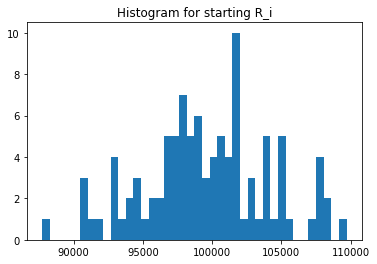

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([205026.15838291, 296934.55696897, 196945.55696897, 196933.55696897,
       294087.54670838, 194092.54670838, 297106.02504613, 197106.02504613,
       303601.92959212, 203609.92959212, 200984.52646098, 203600.92959212,
       309918.50560268, 203790.10004113, 303791.10004113, 209918.50560268,
       203351.1181547 , 288822.78007047, 188834.78007047, 209929.50560268,
       303338.1181547 , 203338.1181547 , 194086.54670838, 203791.10004113,
       309527.93714272, 209526.93714272, 205202.81539571, 199865.15747294,
       299866.15747294, 319395.93685308, 209536.93714272, 219410.93685308,
       305196.81539571, 205195.81539571, 199871.15747294, 200972.52646098,
       191788.48203475, 194076.18998545, 300973.52646098, 294077.18998545,
       197112.02504613, 291786.48203475, 191786.48203475, 219394.93685308,
       194085.18998545, 297757.3262912 , 197767.3262912 , 198161.14904027,
       300677.00043986, 200676.00043986, 196752.08507313, 181093.23198214,
       197756.3262912 , 2

In [24]:
experiments.UNI_Si.unique()

array([10000., 15077., 15152., 15073., 14911., 14763., 14907., 15295.,
       14917., 14772., 15003., 14557., 14873., 14975., 15214., 15056.,
       14983., 15082., 15046., 15368., 14646., 15522., 15284., 14972.,
       15055., 15137., 14762., 15121., 15178., 14776., 15460., 14914.,
       15028., 14919., 14818., 14951., 14957., 15126., 15183., 14742.,
       15116., 15075., 15206., 15383., 14849., 15314., 14798., 15134.,
       14948., 14748., 15271., 14644., 15131., 15343., 14918., 15097.,
       15172., 15514., 14935., 15118., 15163., 14866., 14630., 14811.,
       14620., 14910., 14926., 15117., 14939., 14755., 14840., 15058.,
       15699., 14633., 14877., 15034., 14978., 14998., 14623., 15008.,
       14672., 15142., 15259., 14922., 14977., 15379., 15450., 15307.,
       15232., 15365., 14801., 15098., 15018., 15501.])

In [25]:
experiments.UNI_Qj.unique()

array([186343.73391167, 204791.876189  , 200998.37529304, 195031.15132434,
       191614.63365474, 195587.05094042, 208744.40896725, 194419.88053961,
       188441.83084705, 190341.8112956 , 192986.85715615, 185419.76972955,
       189660.44333427, 200686.37690415, 219542.94563521, 185088.22211692,
       191115.19735429, 208022.66364409, 214522.21598615, 187929.95325289,
       229118.86602761, 186469.66319719, 202151.08681853, 208063.69890848,
       211920.45422335, 223133.84398135, 206351.53773943, 206670.25609393,
       205951.74767121, 190492.66705225, 188012.49689319, 202950.44665176,
       204789.41521803, 204785.7844915 , 202990.12488772, 205284.77391127,
       184563.46180497, 202519.09770342, 202286.14708989, 204880.30497205,
       188069.6857884 , 213499.33358316, 207264.36600799, 197779.18894769,
       207967.97701738, 187229.61370074, 201853.72420072, 202614.14280178,
       202334.60821917, 189579.06400207, 191713.89053362, 216105.28442607,
       191019.37219365, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 93171.86695584, 102395.9380945 , 100499.18764652,  97515.57566217,
        95807.31682737,  97793.52547021, 104372.20448362,  97209.94026981,
        94220.91542352,  95170.9056478 ,  96493.42857807,  92709.88486477,
        94830.22166713, 100343.18845208, 109771.47281761,  92544.11105846,
        95557.59867715, 104011.33182204, 107261.10799307,  93964.97662644,
       114559.43301381,  93234.8315986 , 101075.54340927, 104031.84945424,
       105960.22711168, 111566.92199068, 103175.76886971, 103335.12804697,
       102975.87383561,  95246.33352613,  94006.2484466 , 101475.22332588,
       102394.70760902, 102392.89224575, 101495.06244386, 102642.38695564,
        92281.73090249, 101259.54885171, 101143.07354494, 102440.15248603,
        94034.8428942 , 106749.66679158, 103632.18300399,  98889.59447385,
       103983.98850869,  93614.80685037, 100926.86210036, 101307.07140089,
       101167.30410958,  94789.53200103,  95856.94526681, 108052.64221304,
        95509.68609682,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 93171.86695584,  97515.57566217, 102395.9380945 ,  95807.31682737,
       104372.20448362,  97209.94026981,  94220.91542352, 100499.18764652,
        96493.42857807,  94830.22166713,  97793.52547021,  92544.11105846,
       109771.47281761, 100343.18845208, 107261.10799307,  93964.97662644,
        95557.59867715, 104011.33182204,  93234.8315986 , 104031.84945424,
       105960.22711168, 111566.92199068, 103335.12804697,  95170.9056478 ,
       103175.76886971, 102975.87383561,  95246.33352613,  92709.88486477,
       101075.54340927, 101495.06244386, 102392.89224575,  92281.73090249,
       101259.54885171, 101143.07354494, 106749.66679158, 103983.98850869,
       103632.18300399,  93614.80685037,  94006.2484466 ,  98889.59447385,
       100926.86210036, 102642.38695564, 101307.07140089, 101167.30410958,
       108052.64221304,  95856.94526681,  96161.77841487,  95509.68609682,
       101475.22332588,  94789.53200103, 102440.15248603, 101746.23127726,
       104148.80135547,  

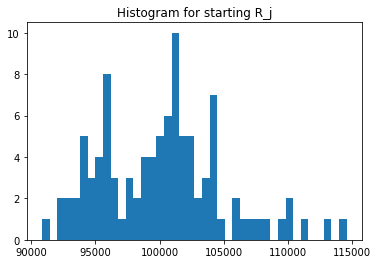

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([102513.07919145,  94767.77848448,  93767.77848448, ...,
       103515.59194111,  90228.2063905 , 106575.63996678])

In [31]:
experiments.UNI_ji.unique()

array([ 93171.86695584, 106648.9380945 , 107781.9380945 , ...,
        99438.54885171, 103344.06244386,  87891.74823262])

In [32]:
experiments.UNI_Sij.unique()

array([9.55133498e+09, 1.00825982e+10, 9.75277014e+09, 9.61045375e+09,
       9.75322938e+09, 9.82690594e+09, 1.09548286e+10, 9.90521173e+09,
       9.57935182e+09, 8.98516991e+09, 1.01089863e+10, 9.51184021e+09,
       9.47662859e+09, 1.10073937e+10, 1.05263423e+10, 8.98030424e+09,
       9.44855983e+09, 1.03050865e+10, 1.07623651e+10, 9.24390254e+09,
       1.03728544e+10, 8.68279379e+09, 9.75912118e+09, 1.11936729e+10,
       1.00261481e+10, 1.12187017e+10, 1.02049428e+10, 1.08497181e+10,
       1.00212465e+10, 9.29928643e+09, 9.18671664e+09, 1.06840008e+10,
       9.71234151e+09, 1.07185270e+10, 9.29361933e+09, 1.04419994e+10,
       9.17499907e+09, 1.02912704e+10, 1.04944996e+10, 9.98212826e+09,
       9.49644205e+09, 1.07667696e+10, 1.01066199e+10, 9.49741331e+09,
       1.00310180e+10, 9.86927693e+09, 9.94197045e+09, 9.40923039e+09,
       1.04307196e+10, 1.02054559e+10, 9.33527612e+09, 1.01658022e+10,
       9.95170756e+09, 9.71706418e+09, 9.98071364e+09, 9.74610495e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


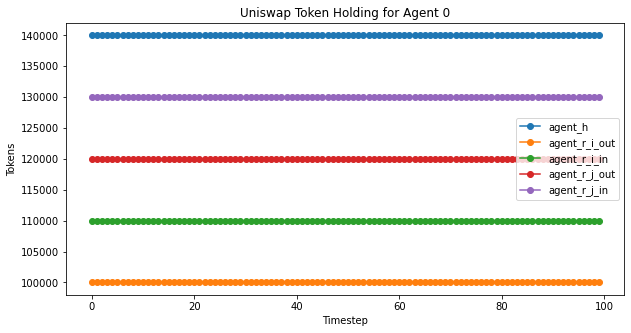

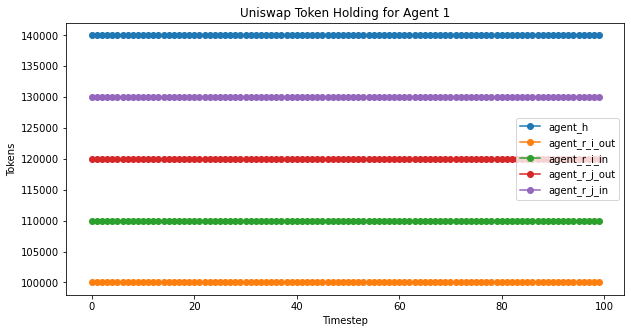

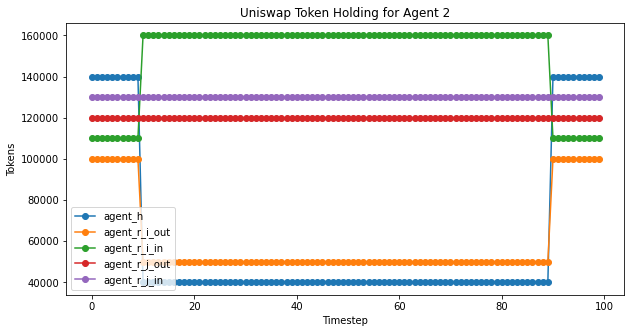

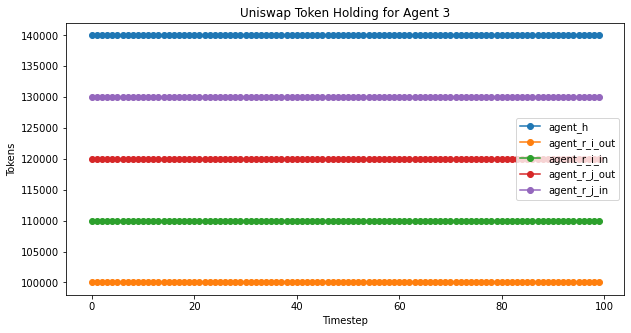

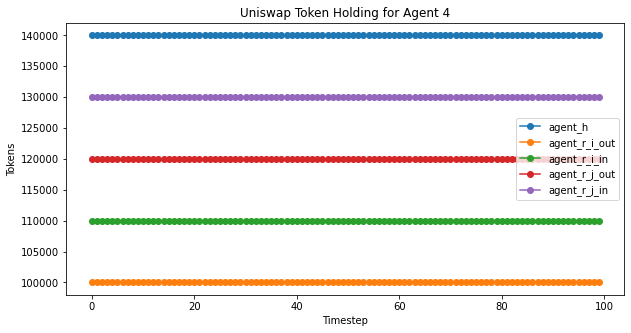

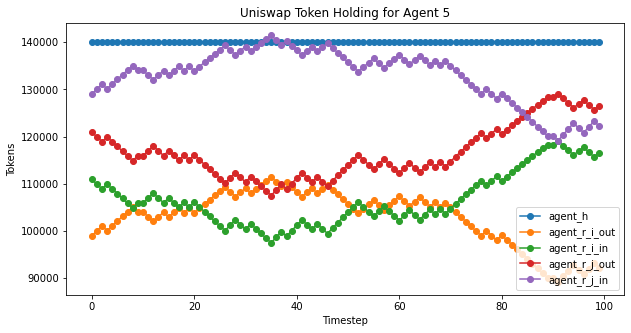

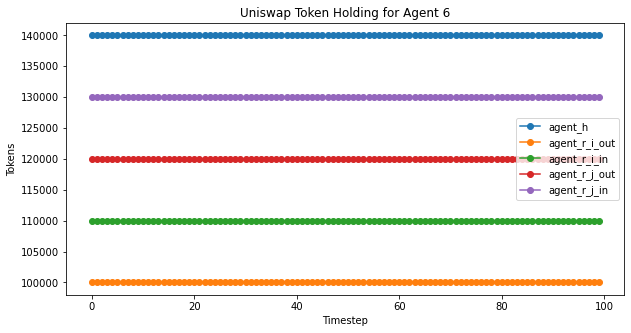

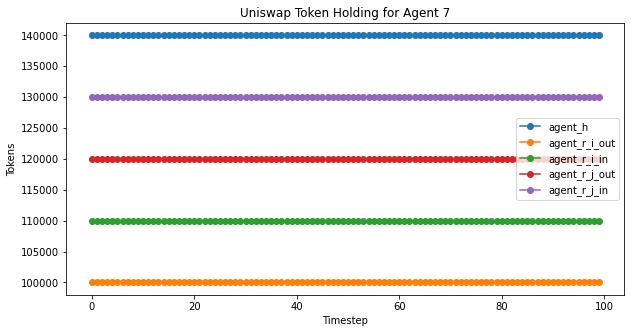

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


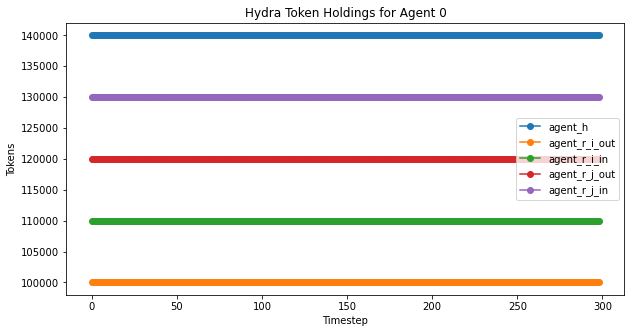

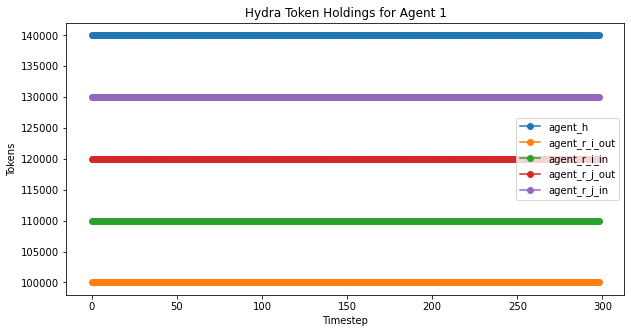

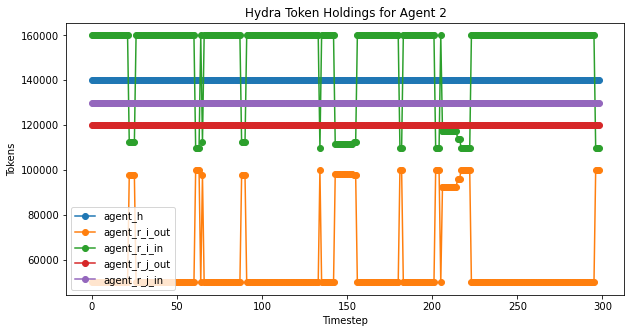

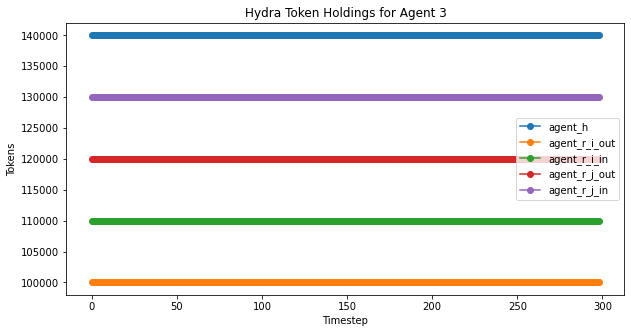

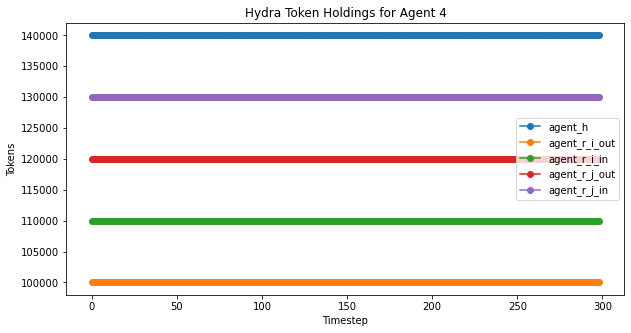

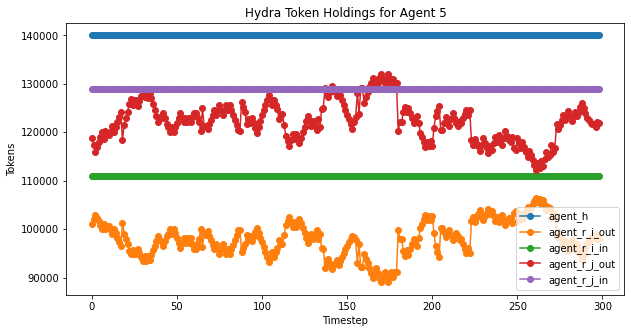

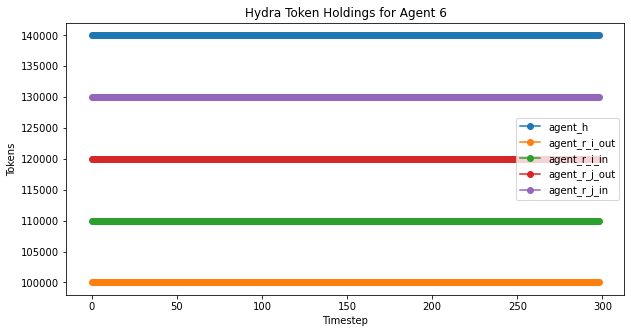

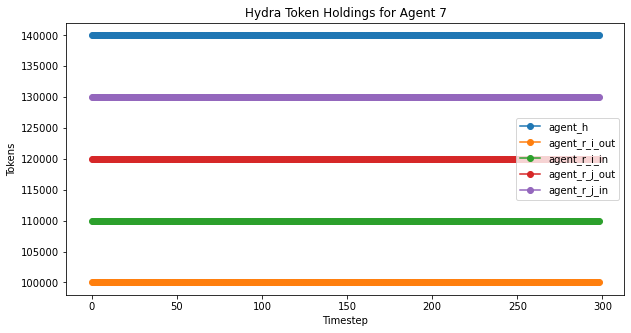

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

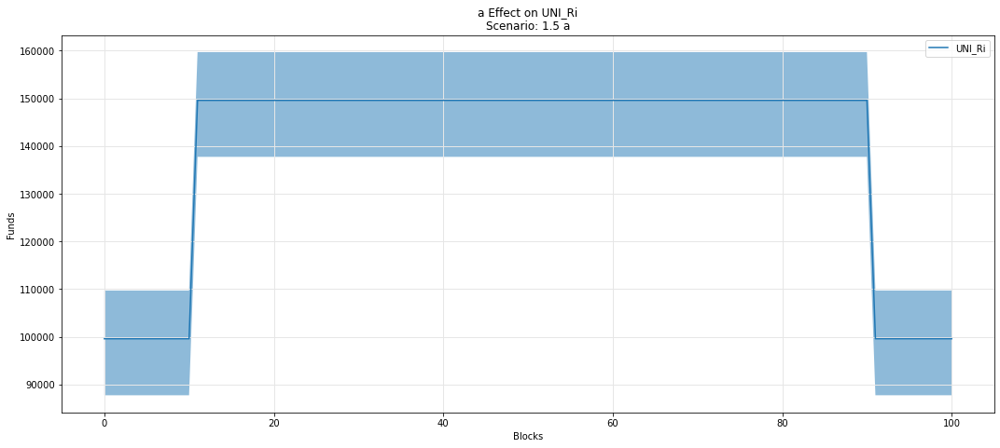

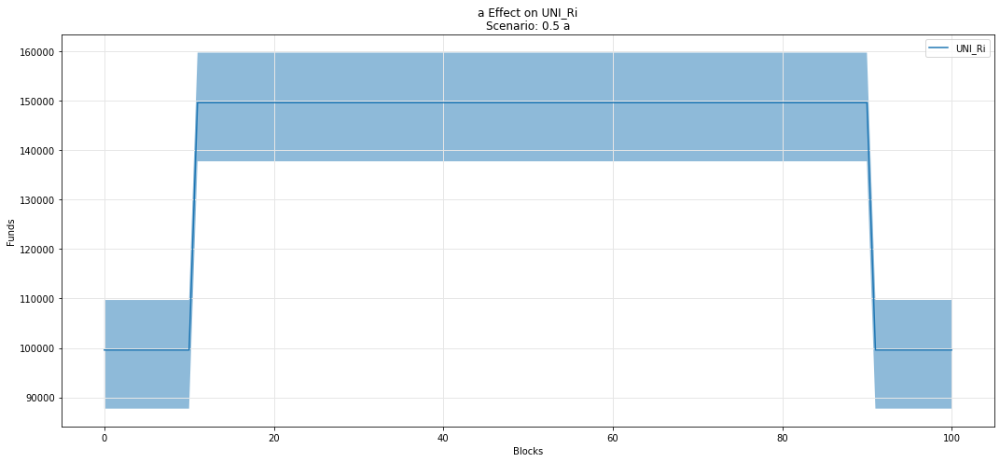

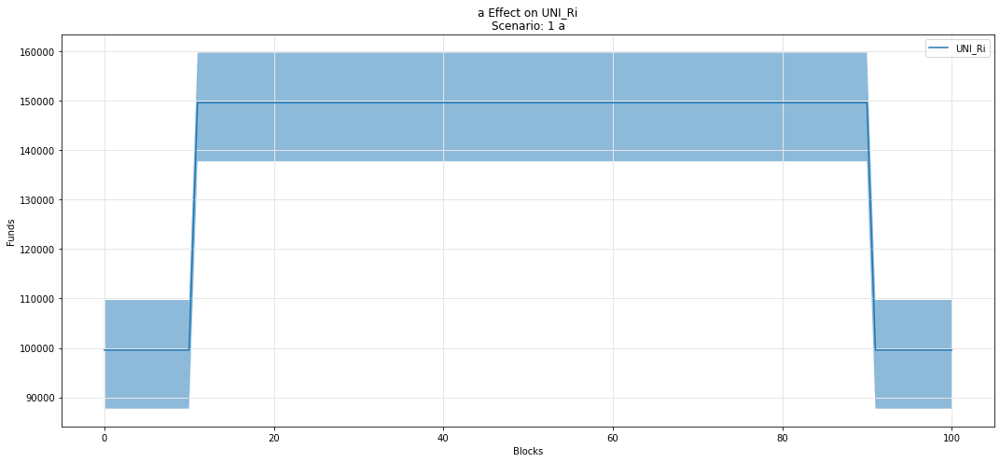

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

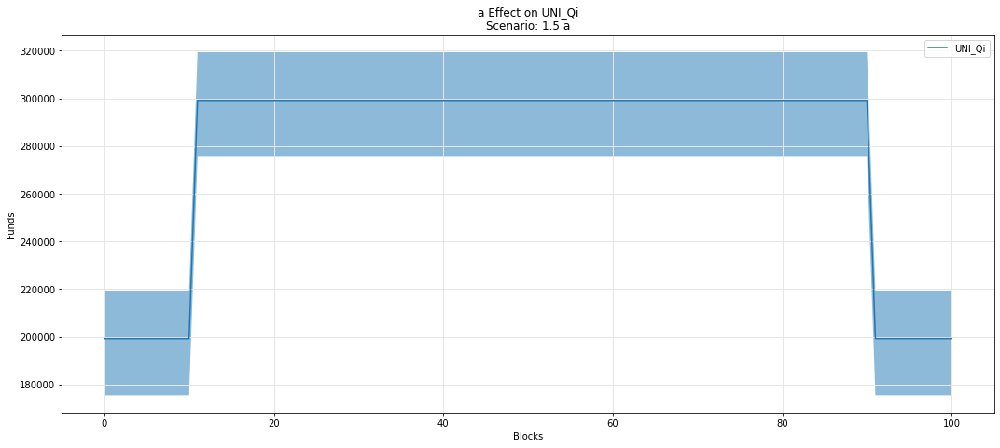

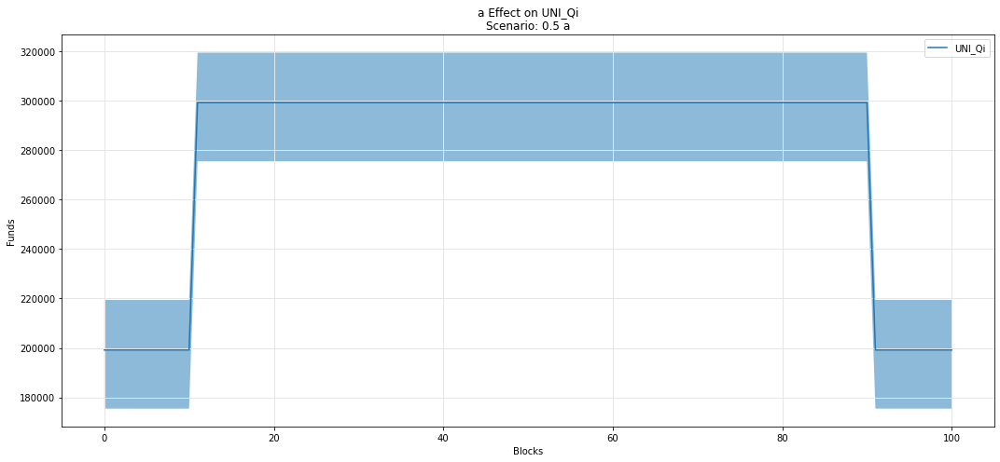

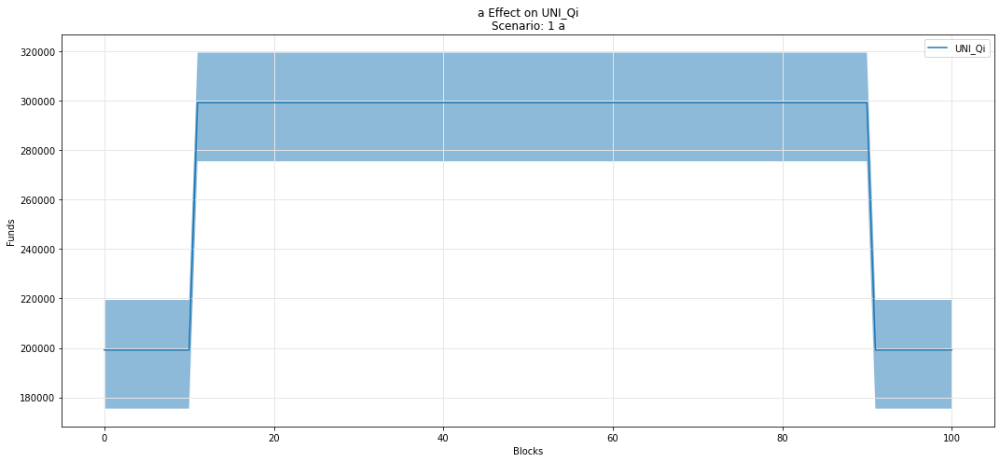

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

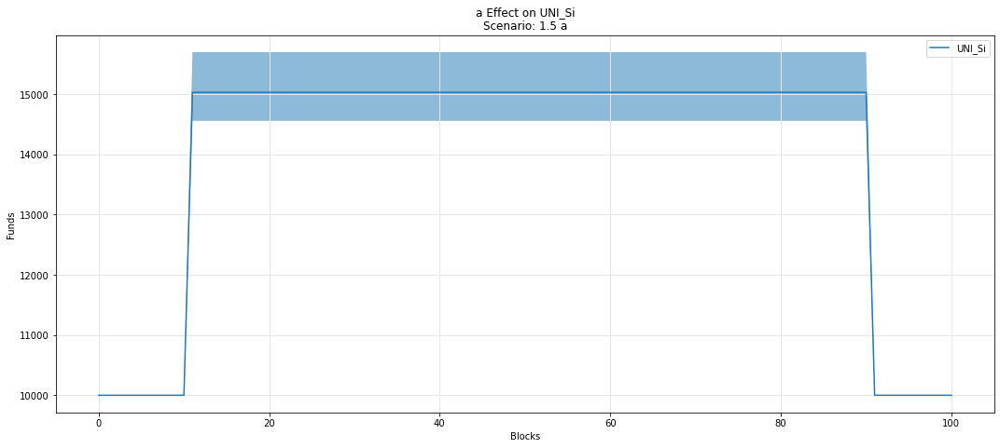

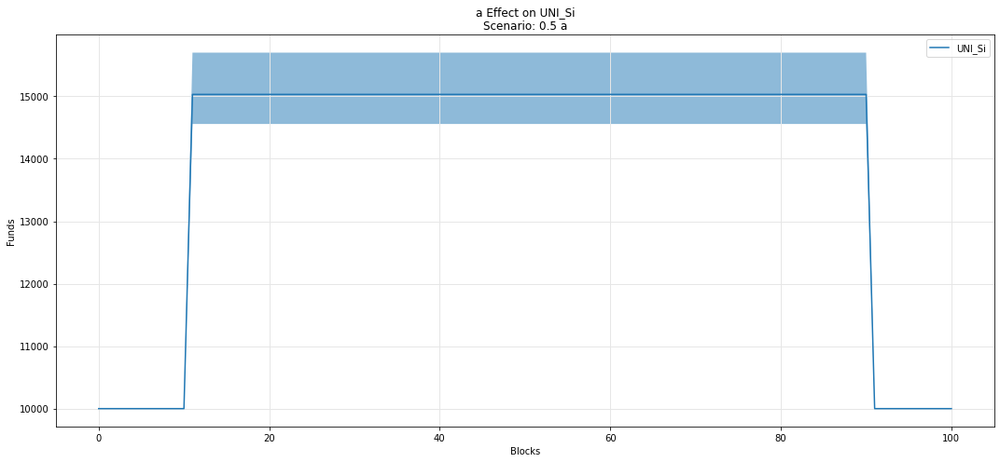

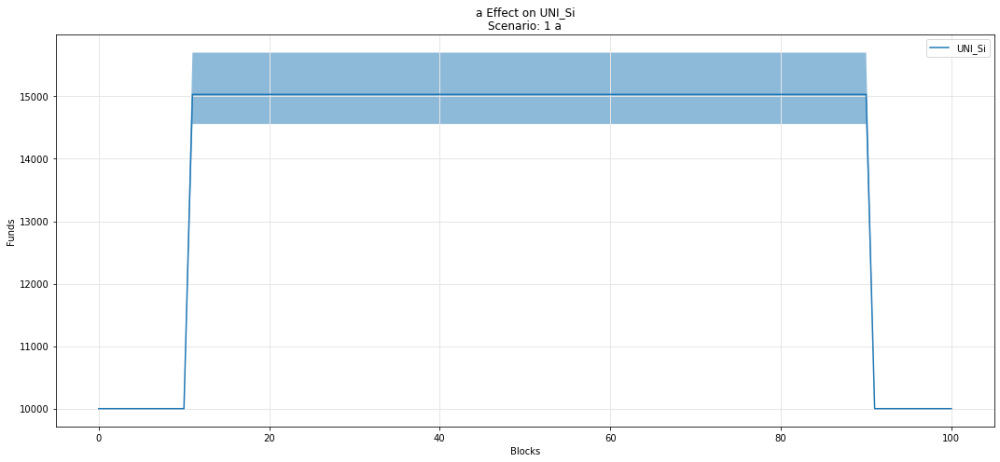

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

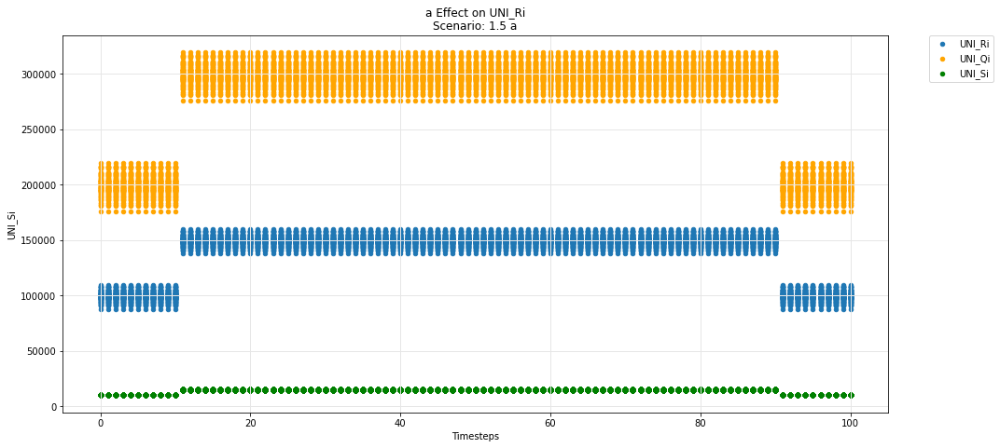

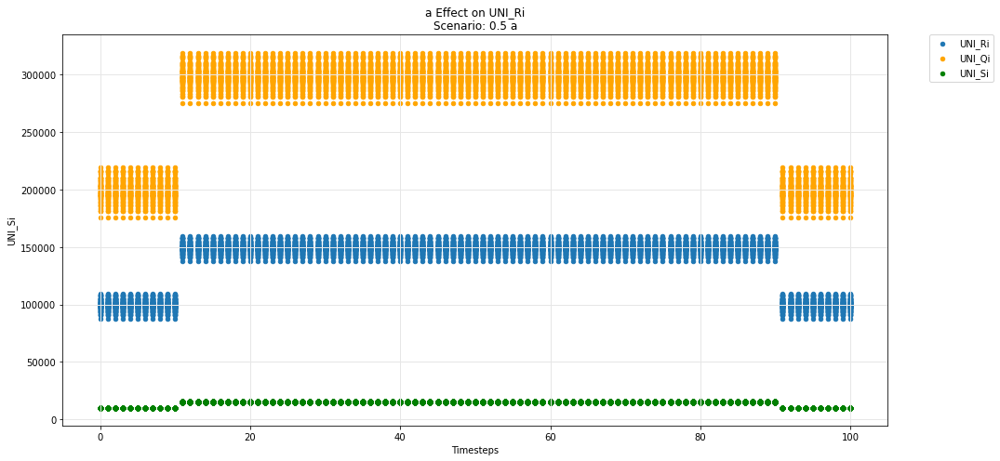

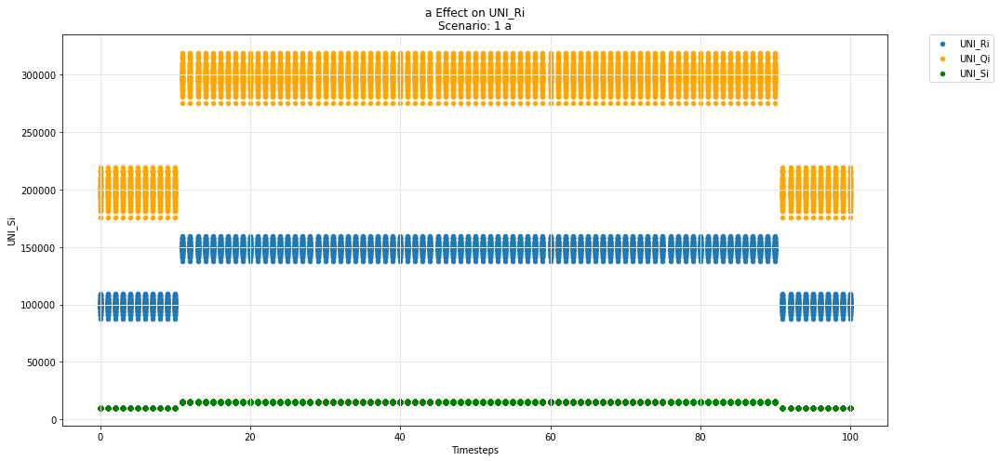

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

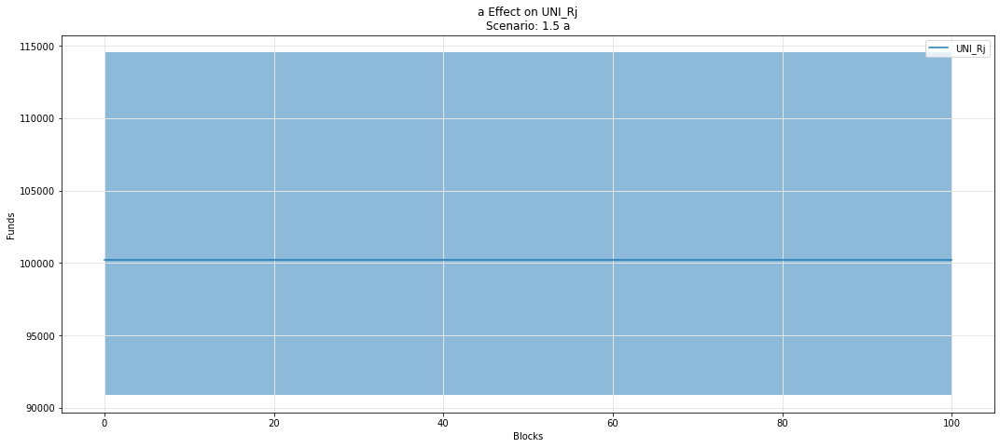

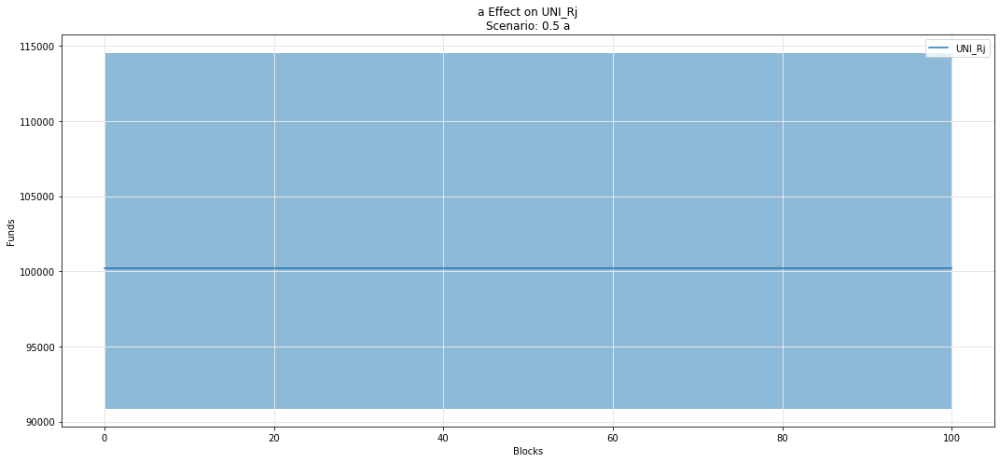

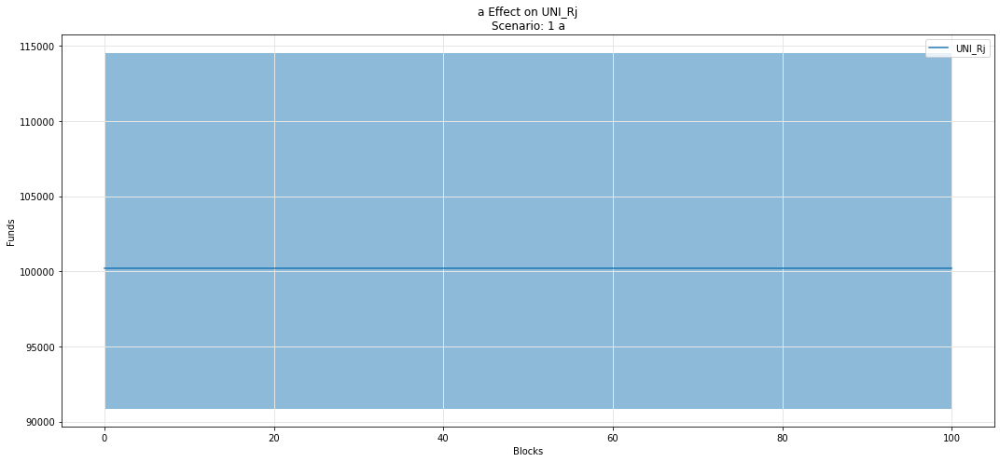

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

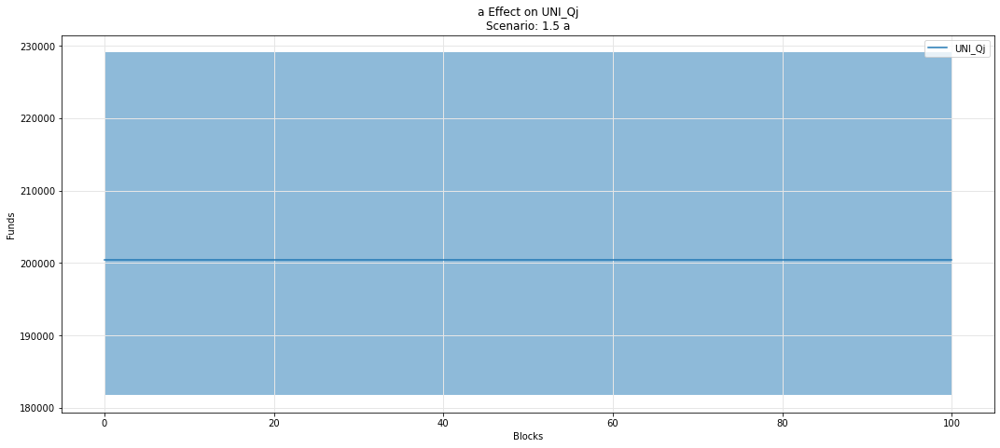

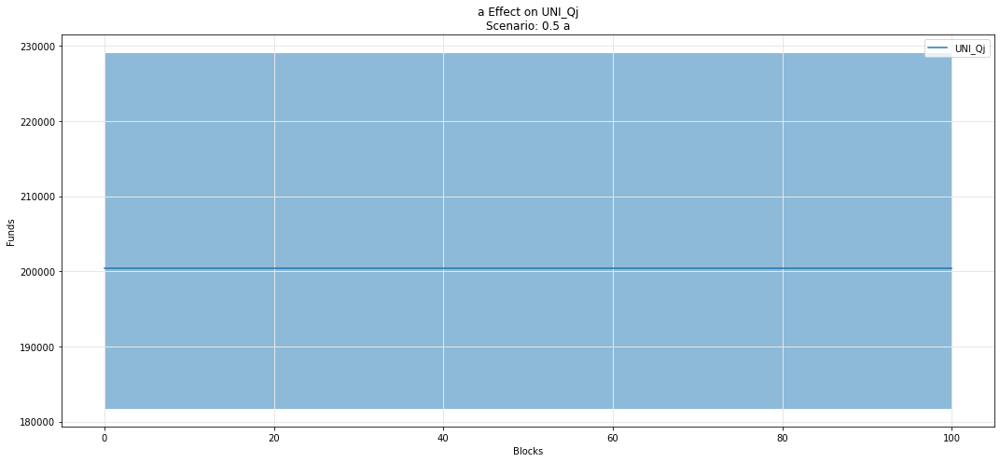

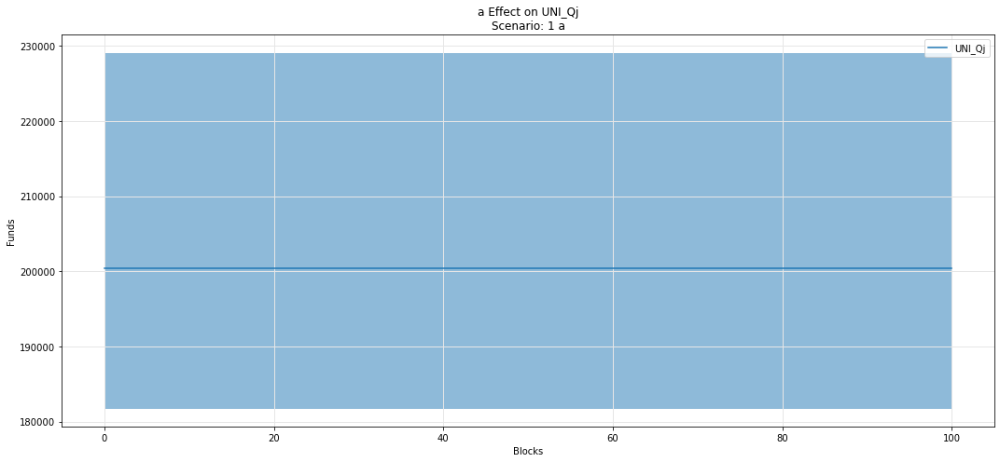

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

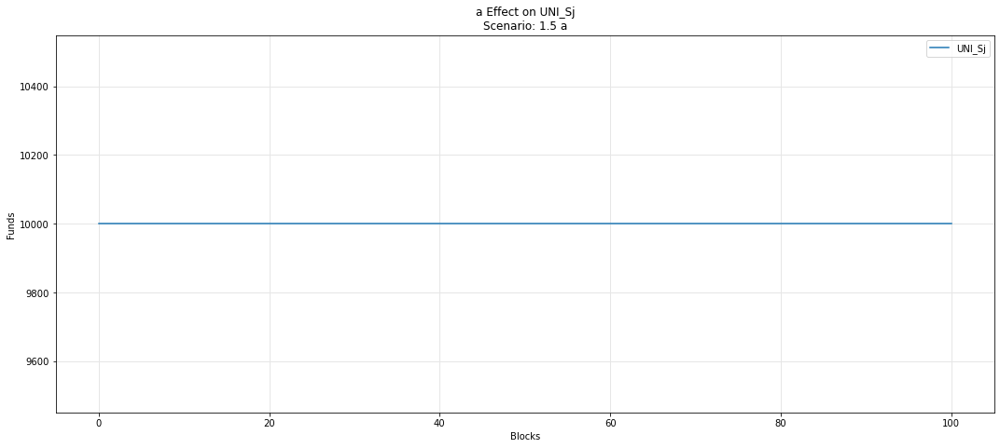

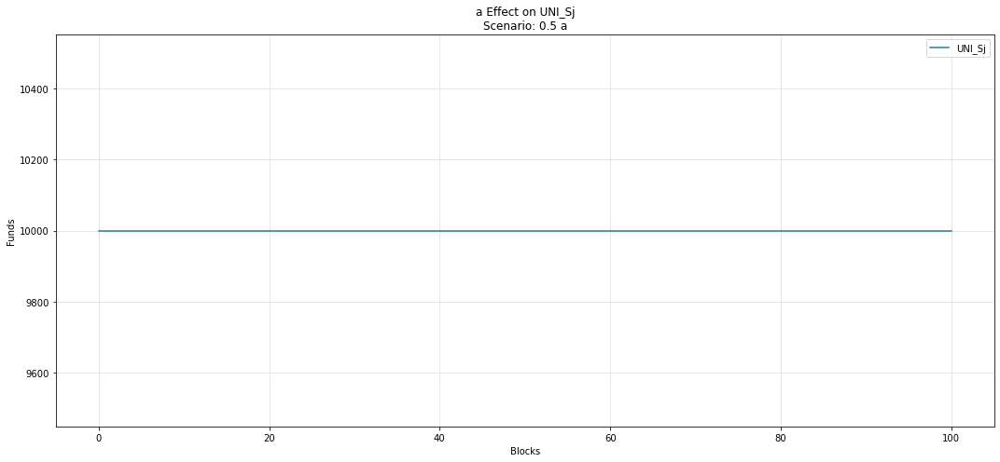

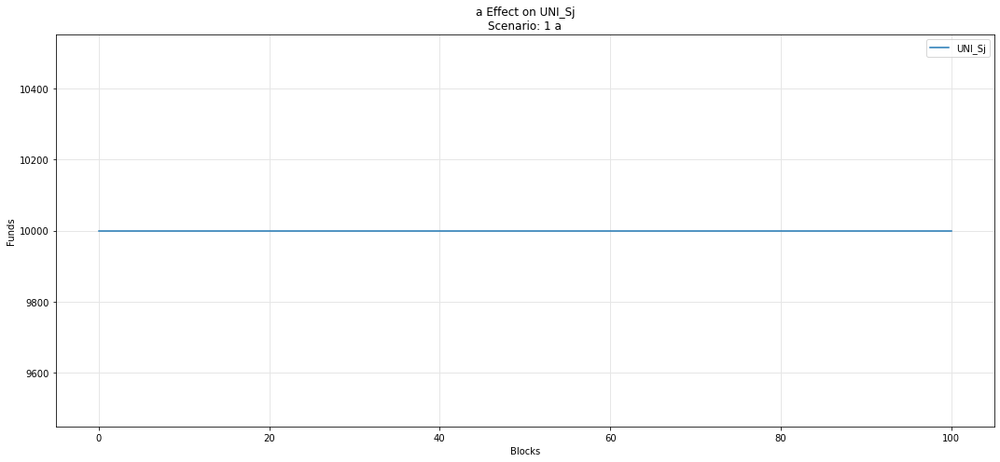

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

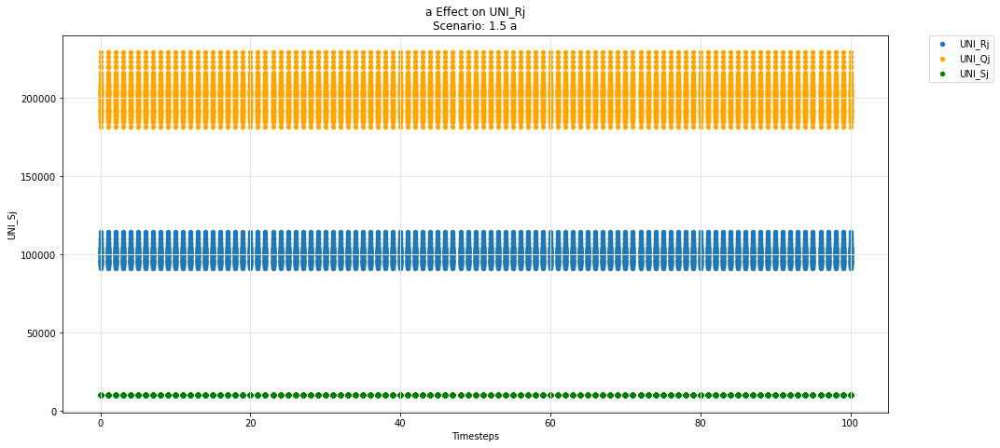

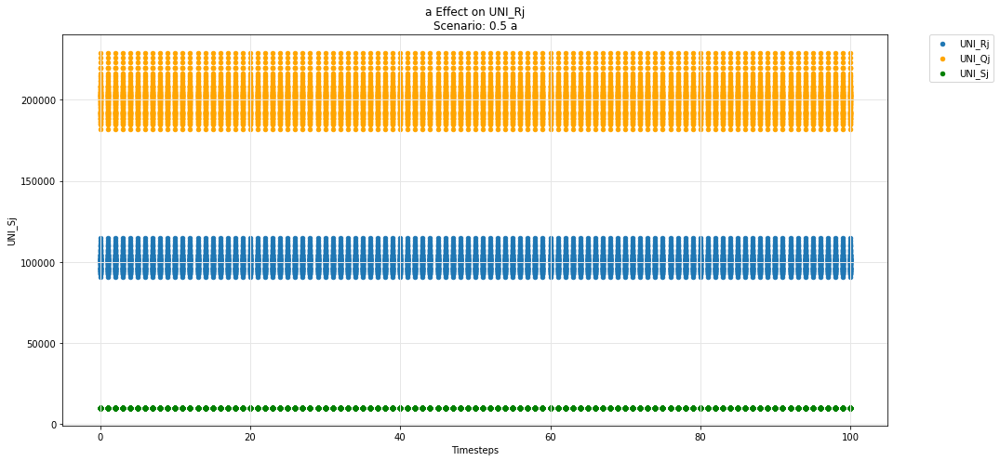

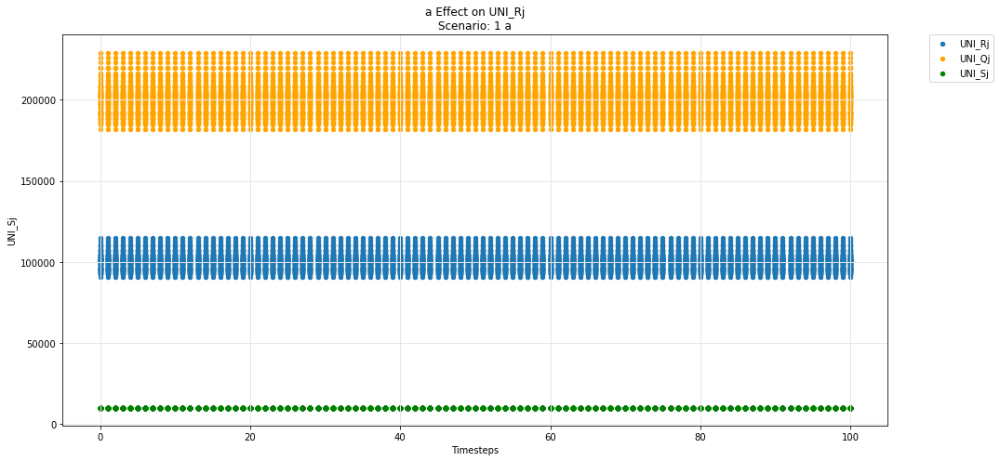

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

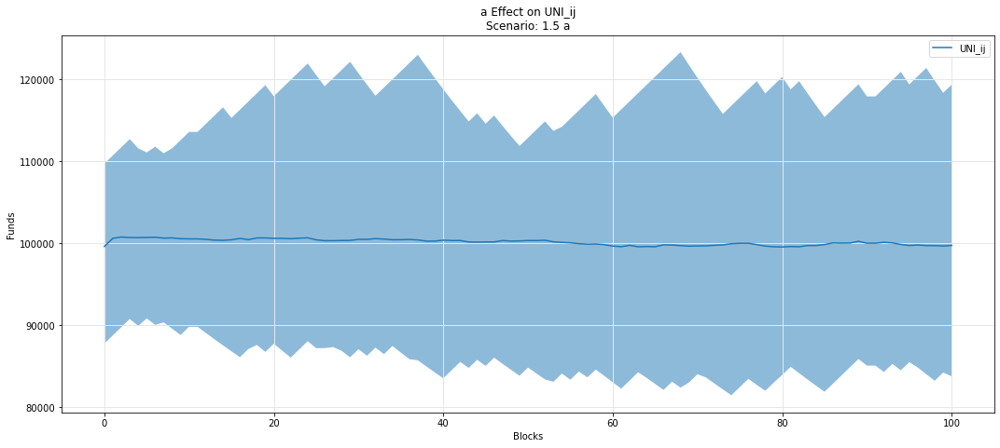

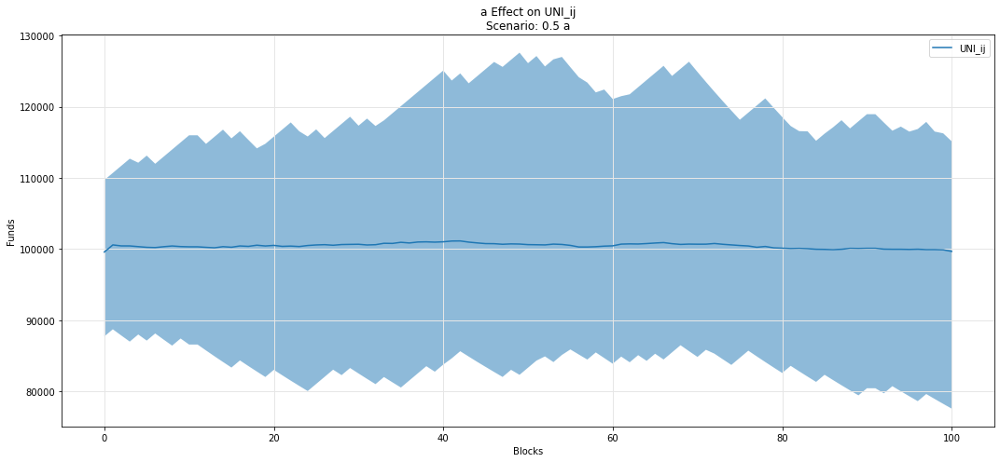

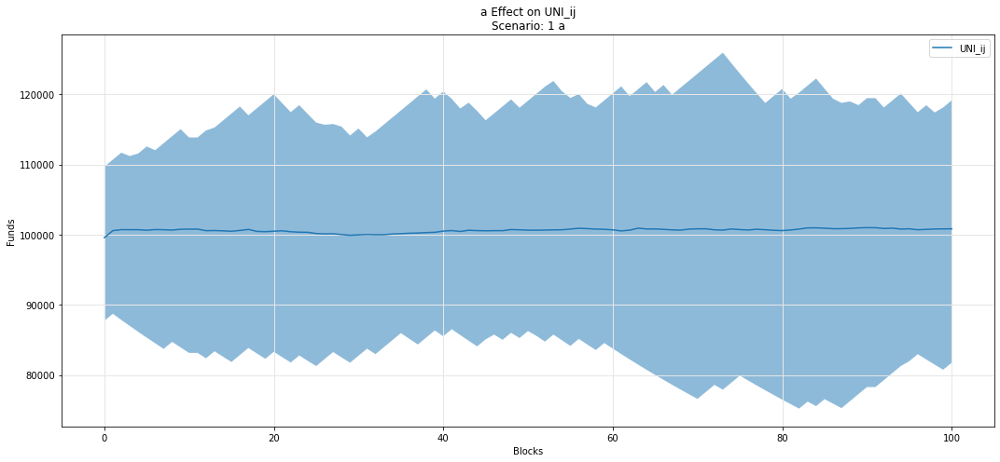

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

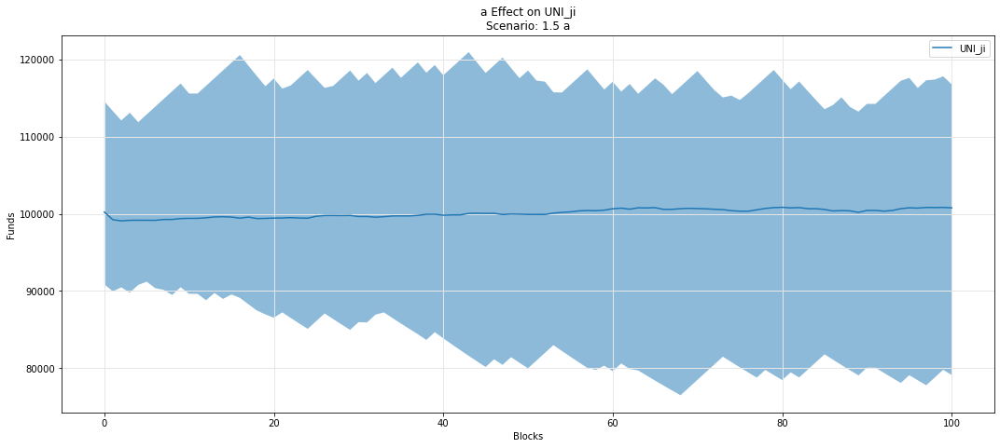

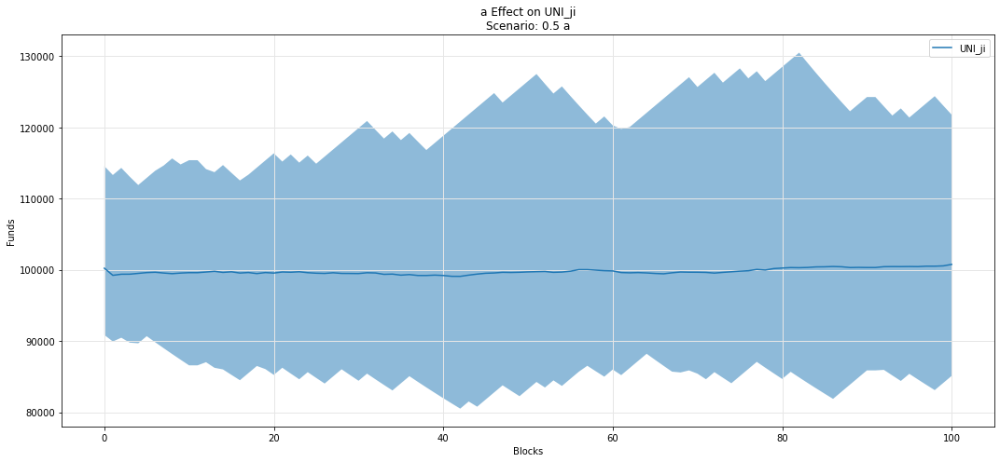

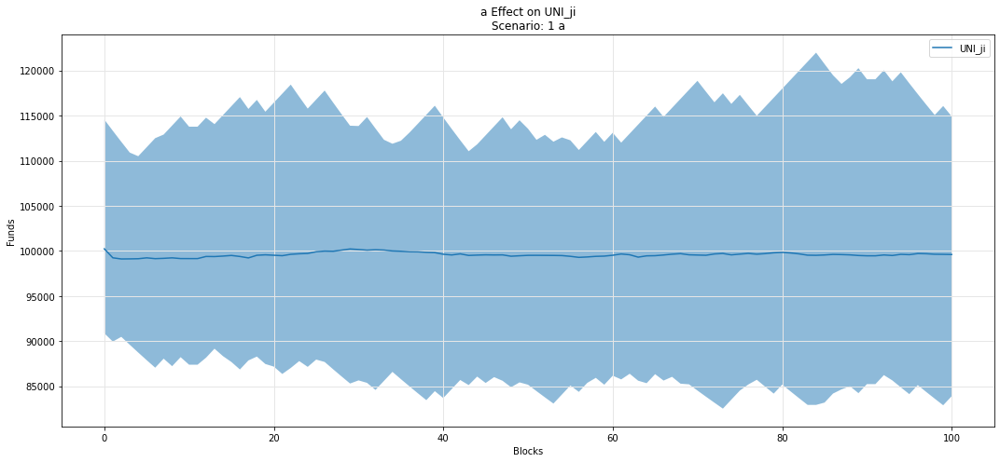

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

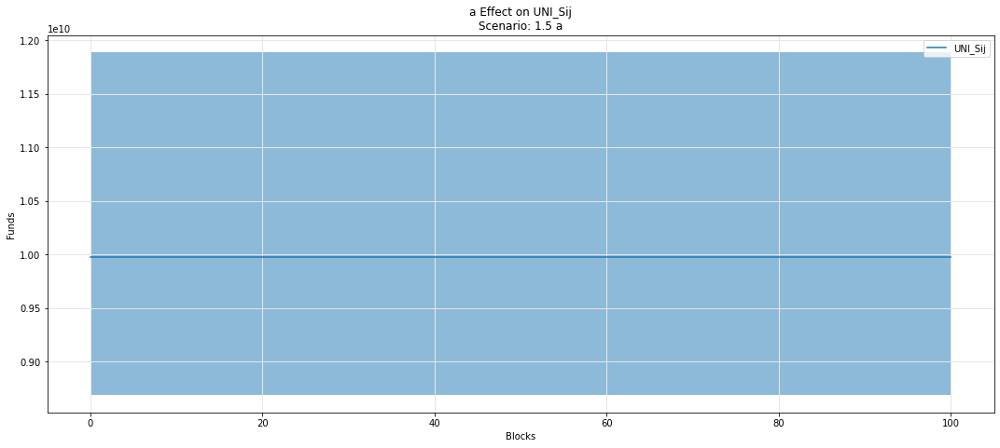

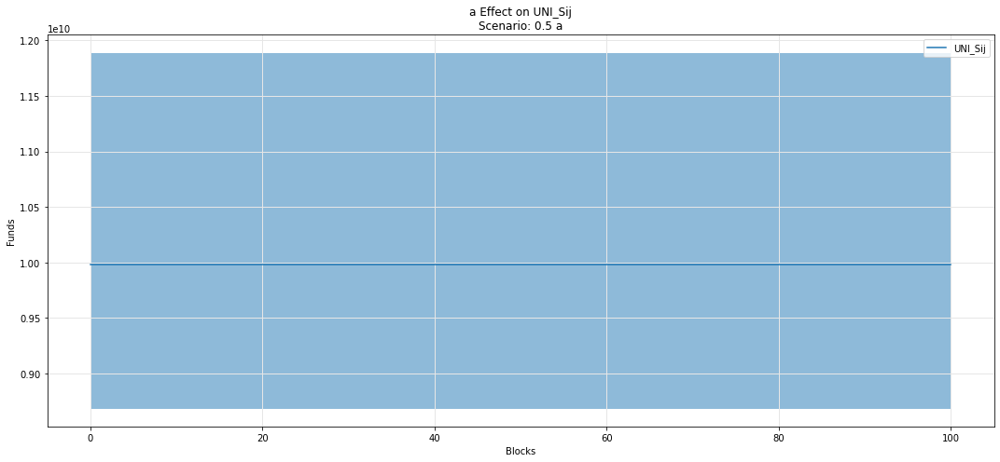

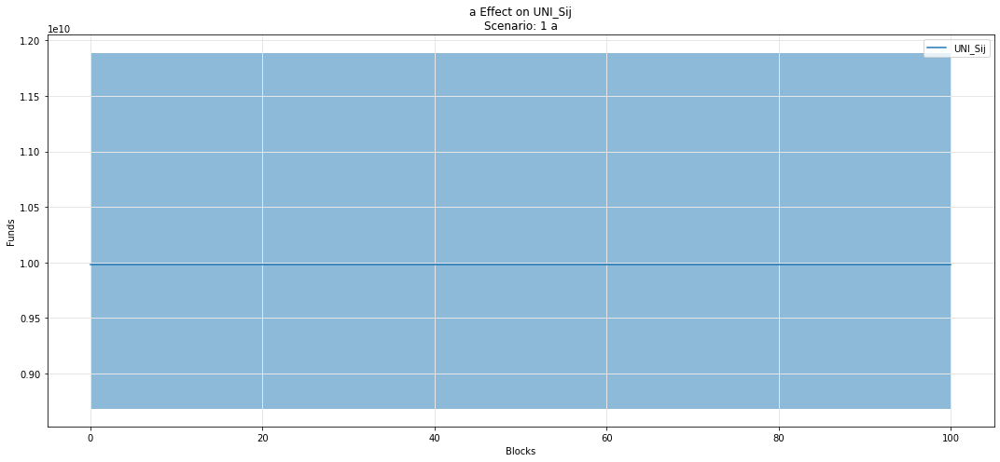

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

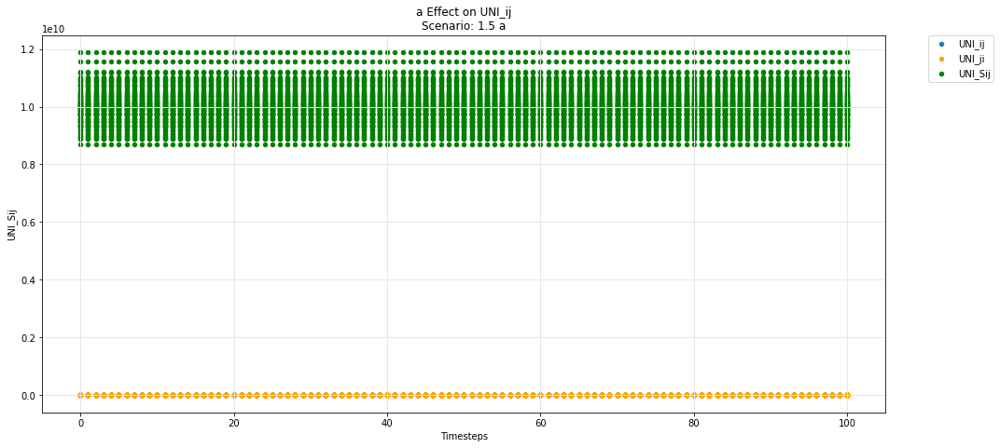

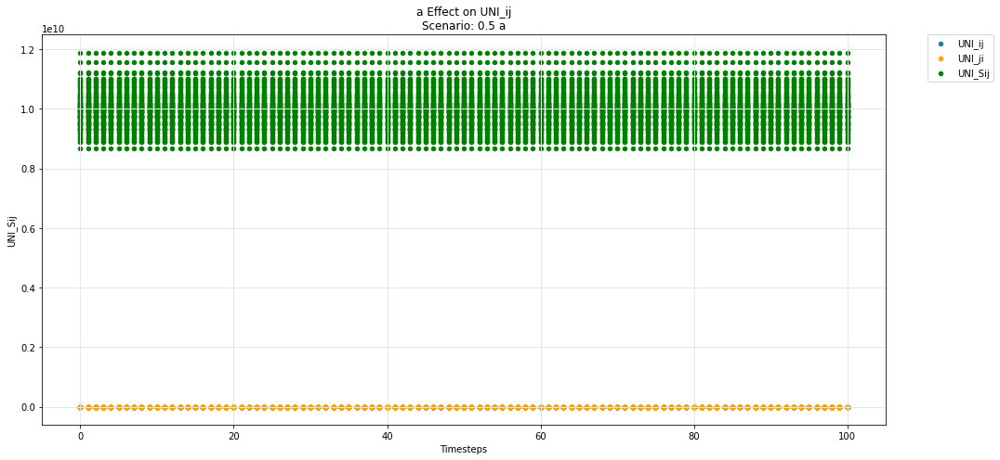

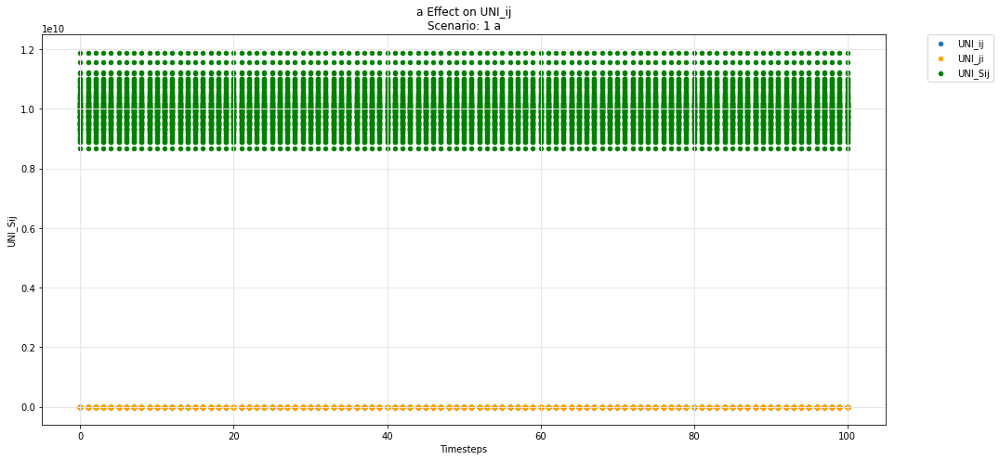

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

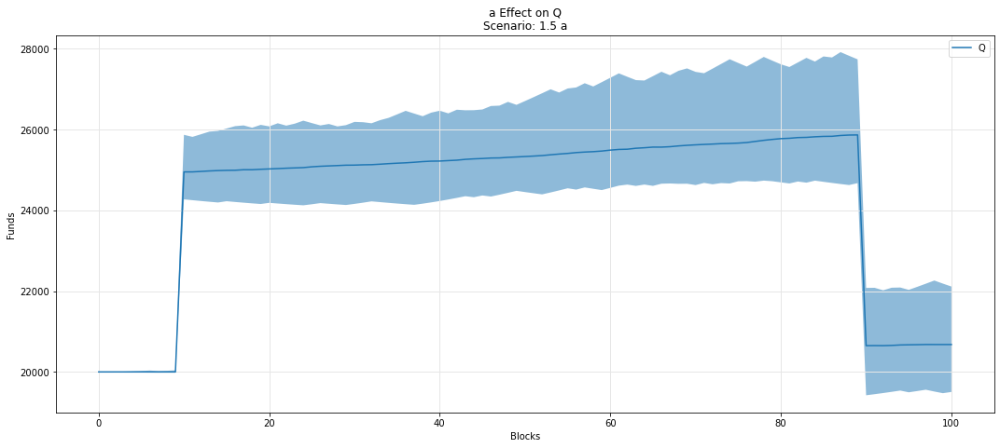

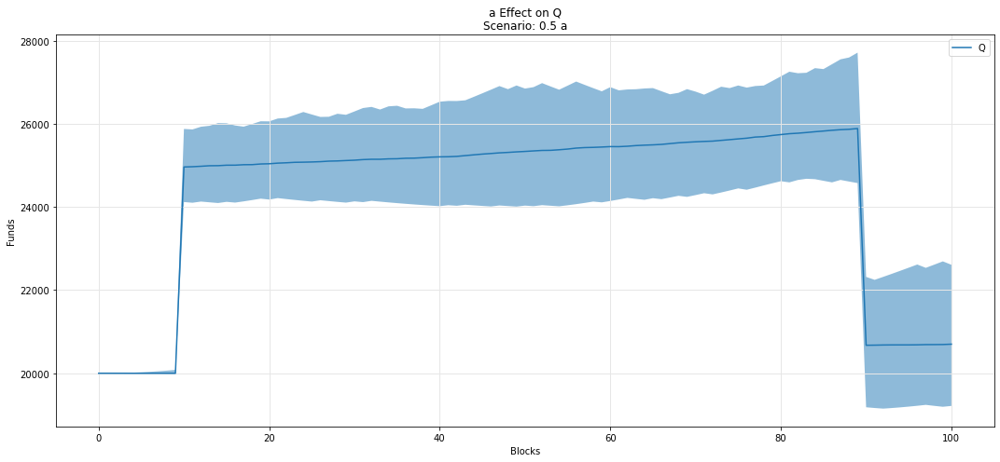

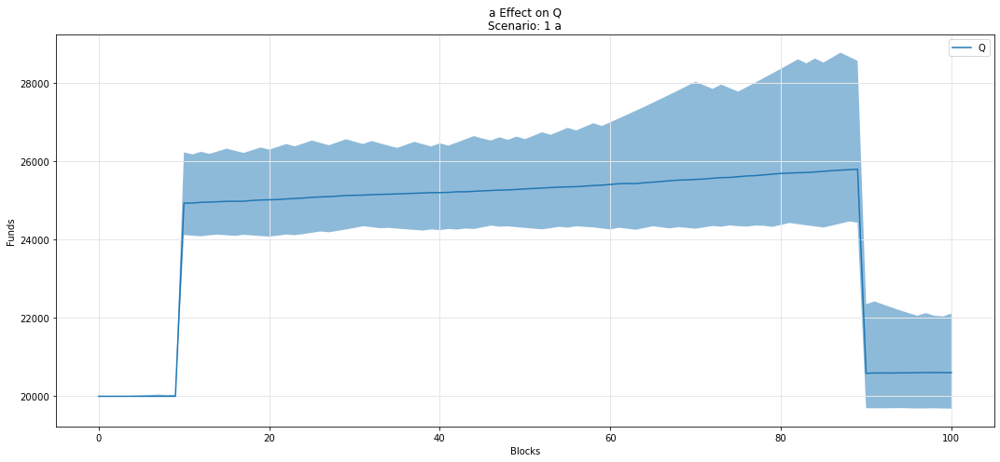

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

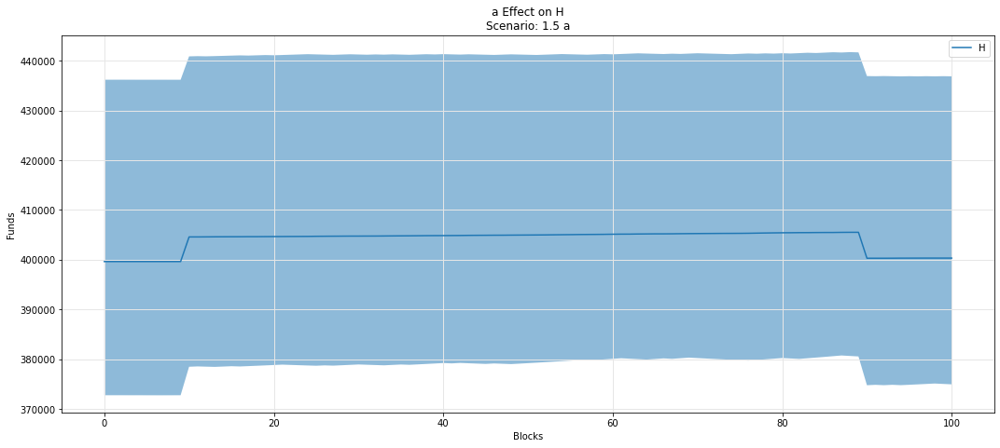

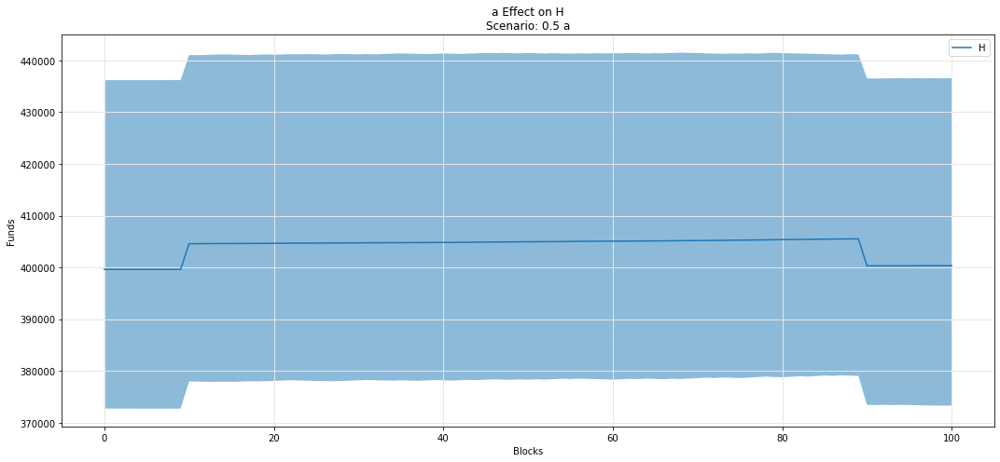

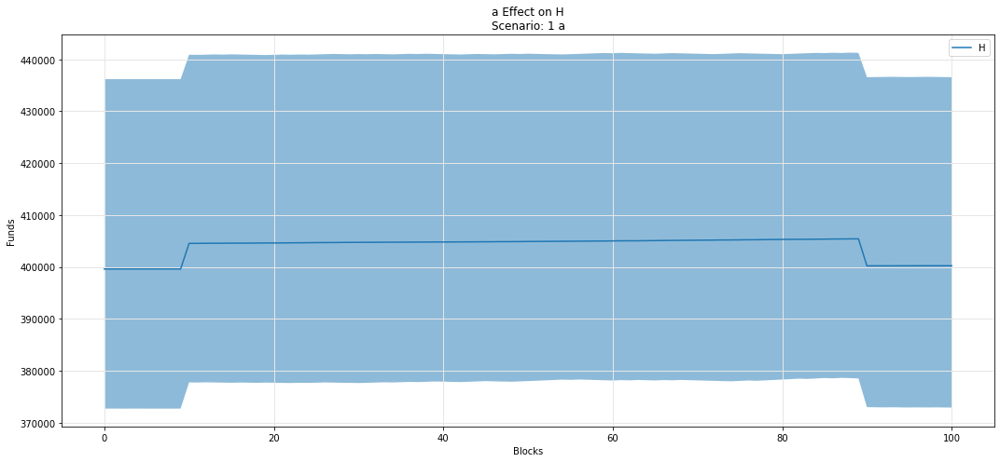

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

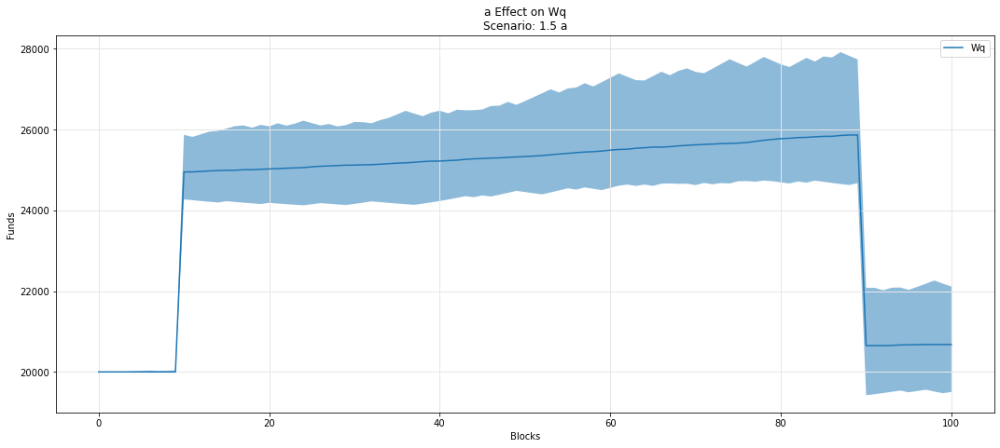

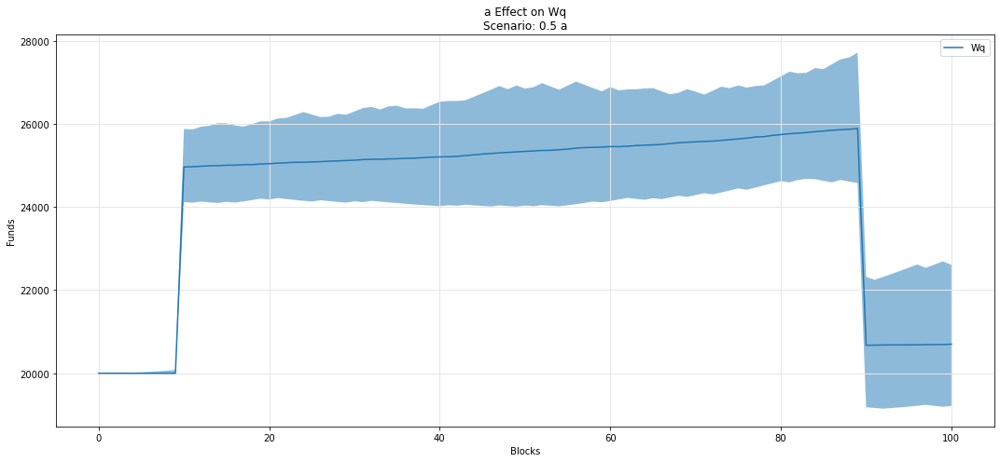

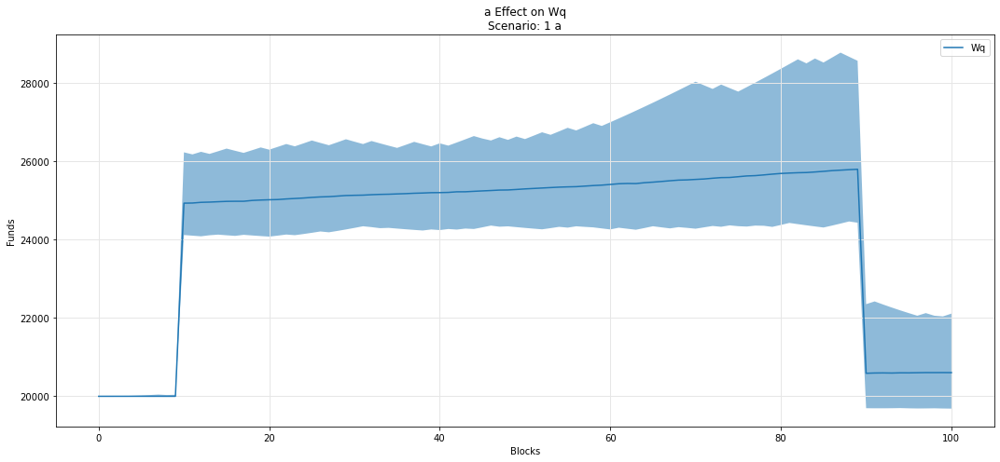

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

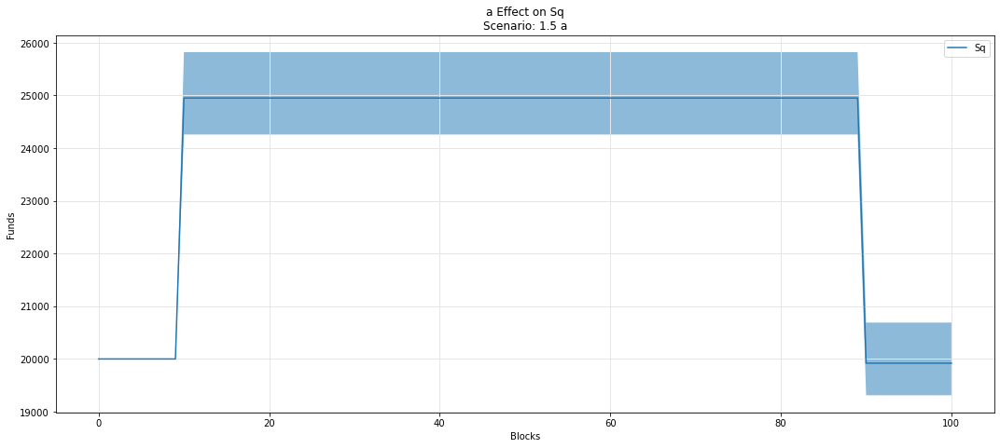

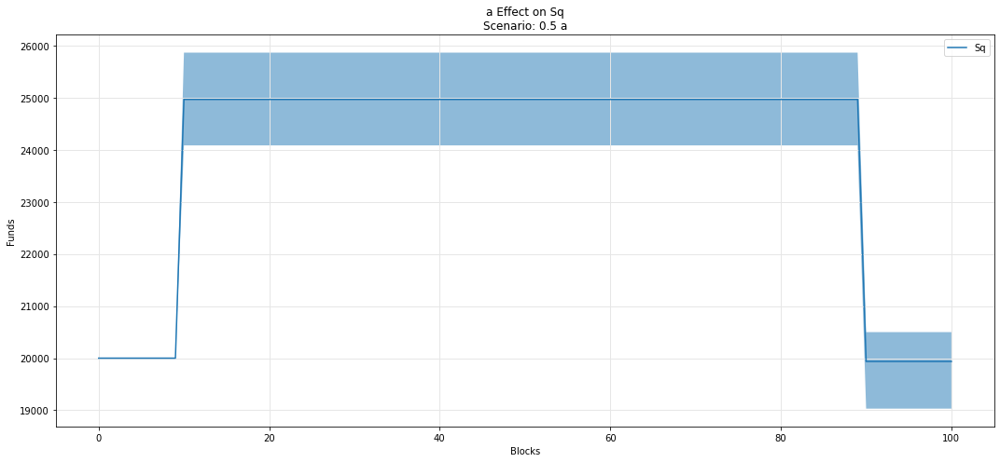

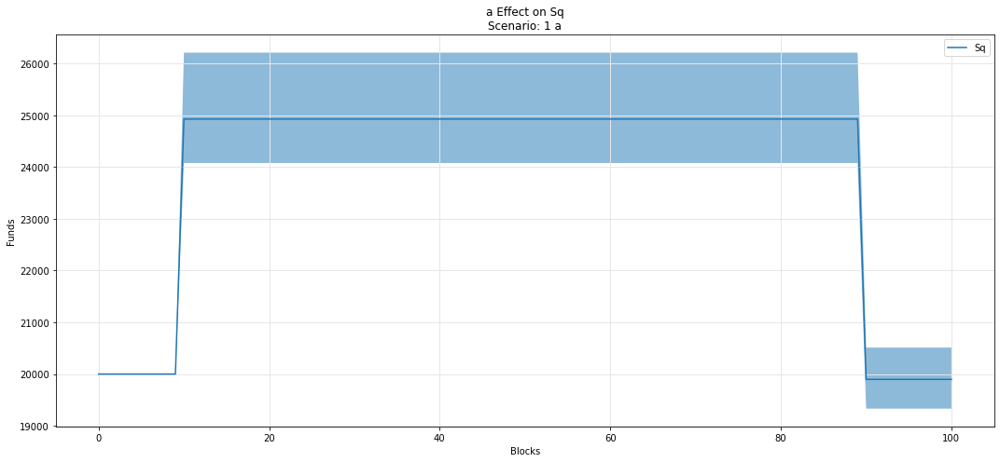

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

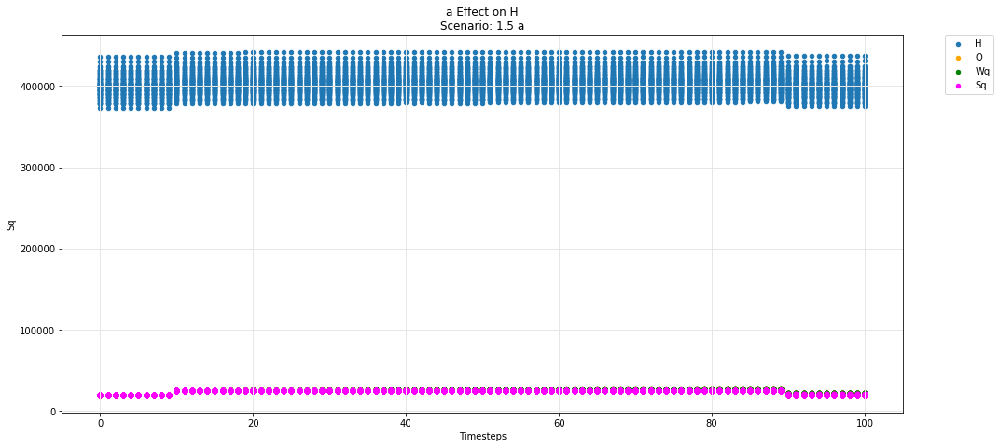

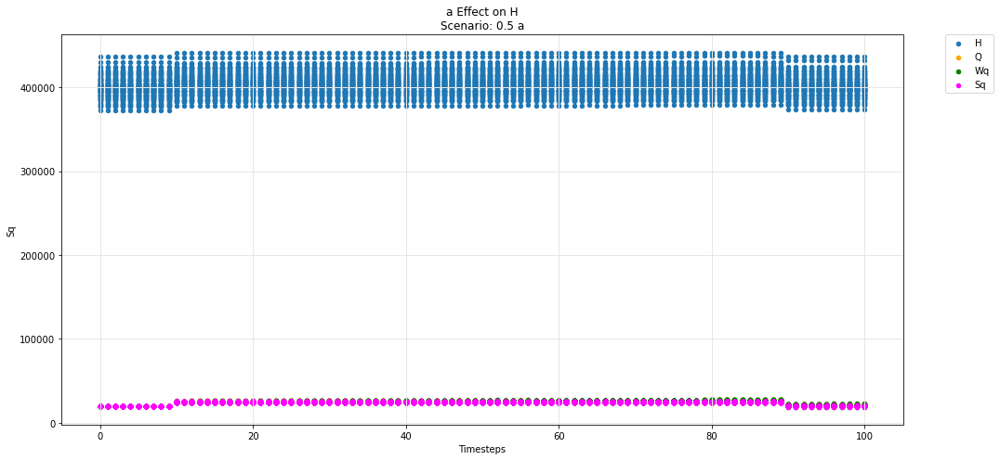

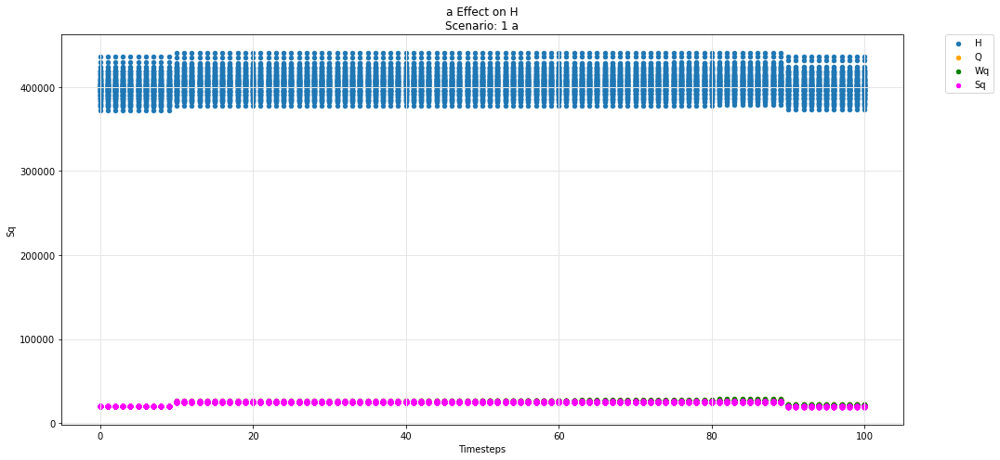

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

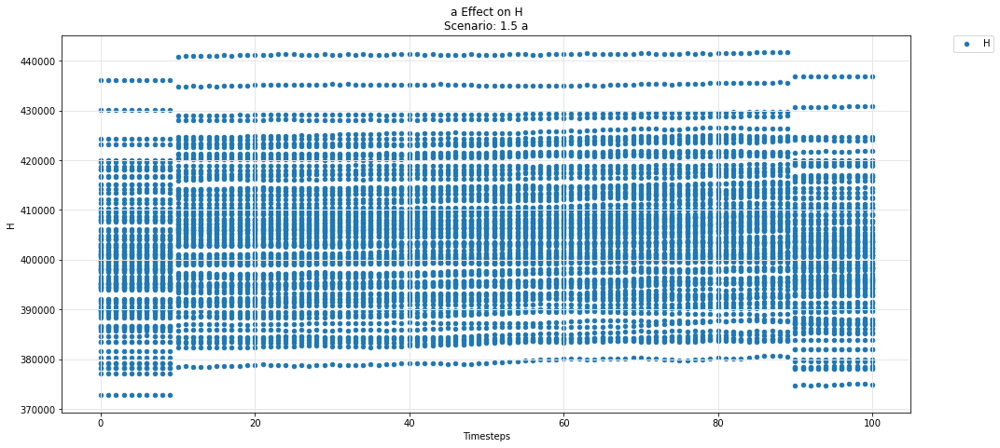

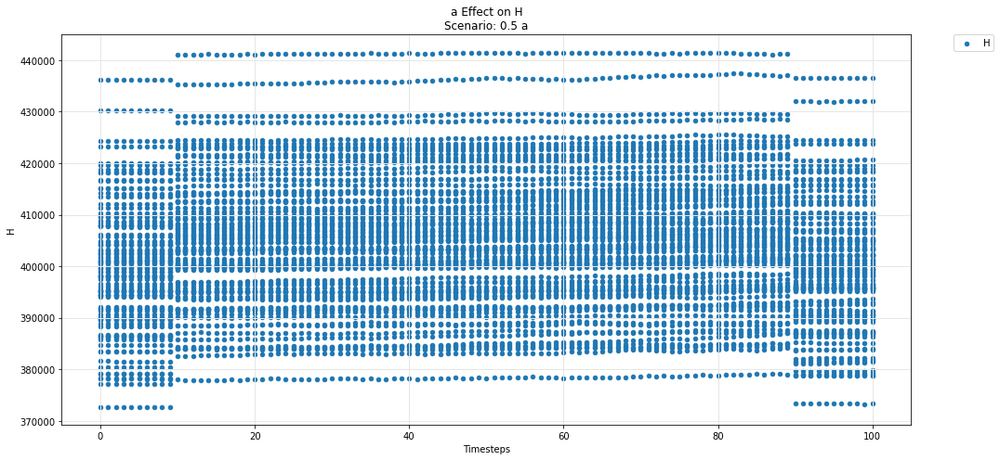

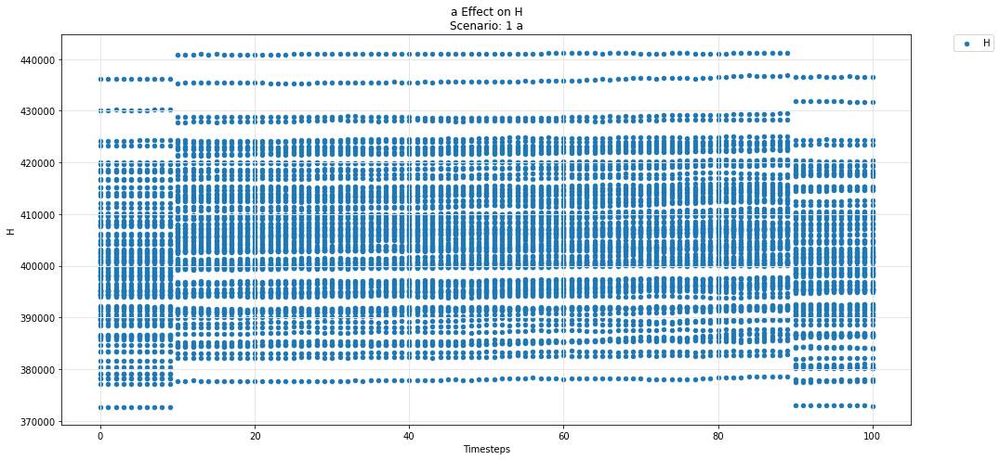

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

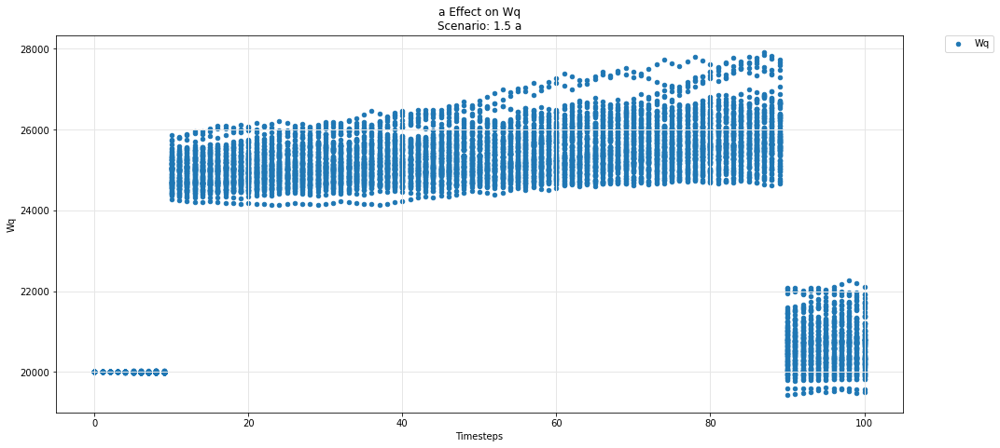

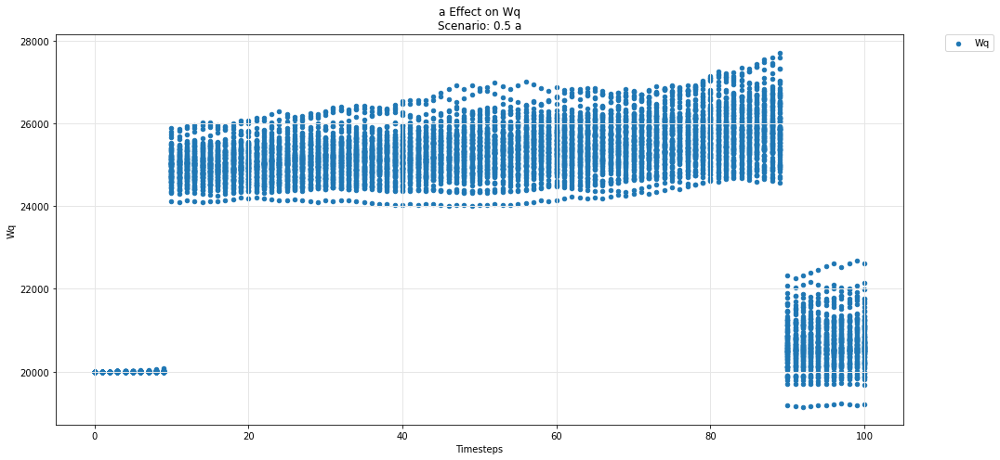

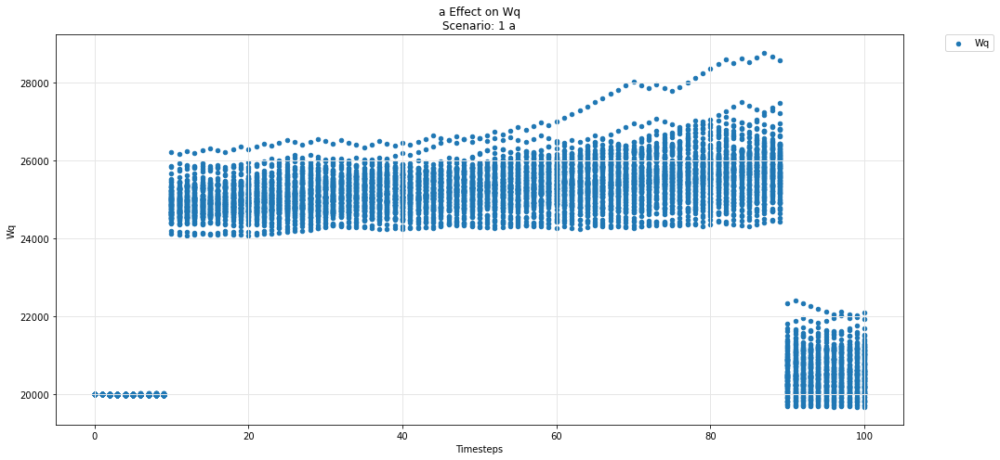

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

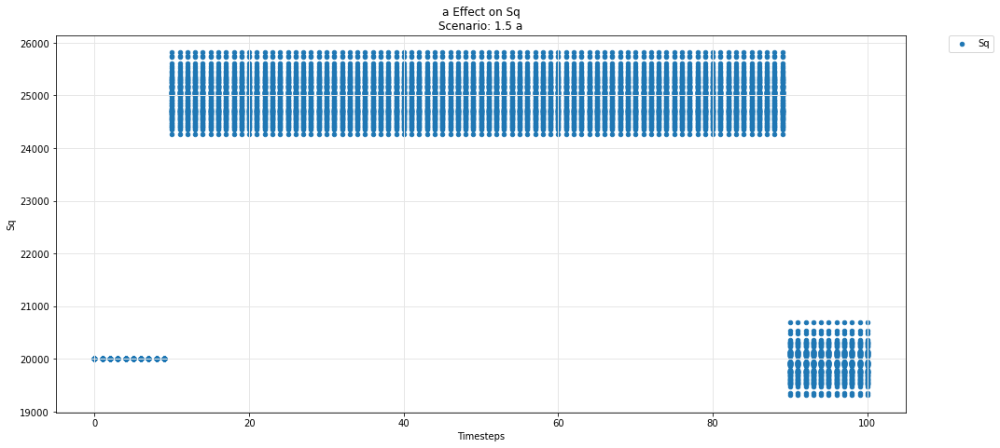

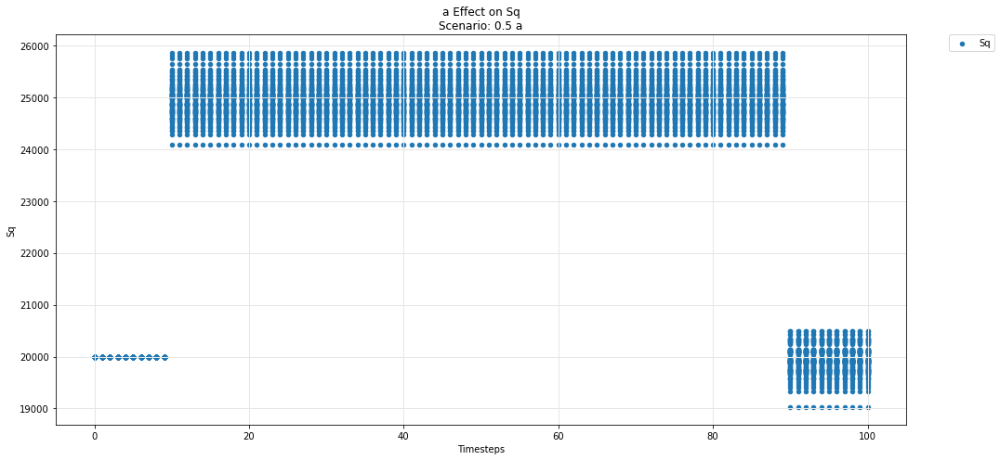

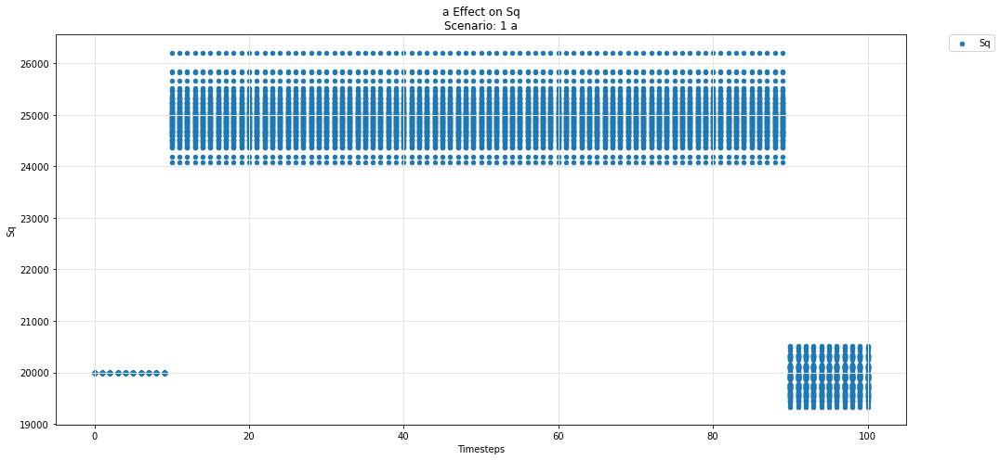

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

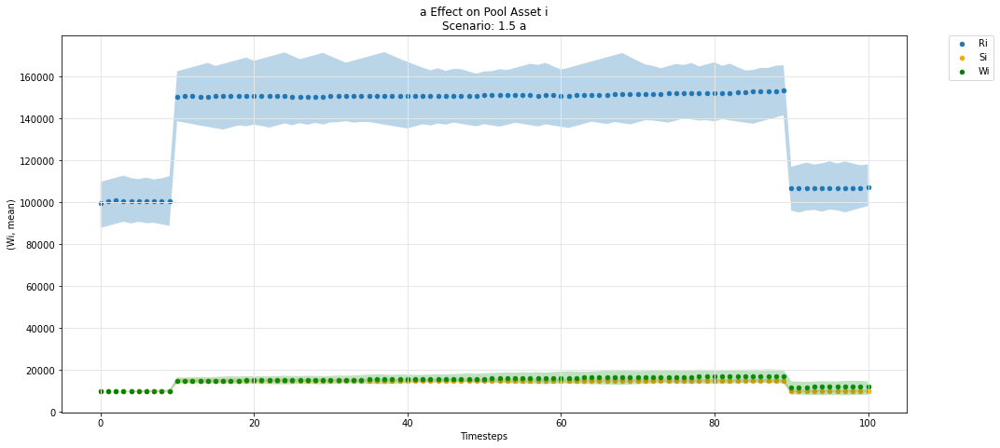

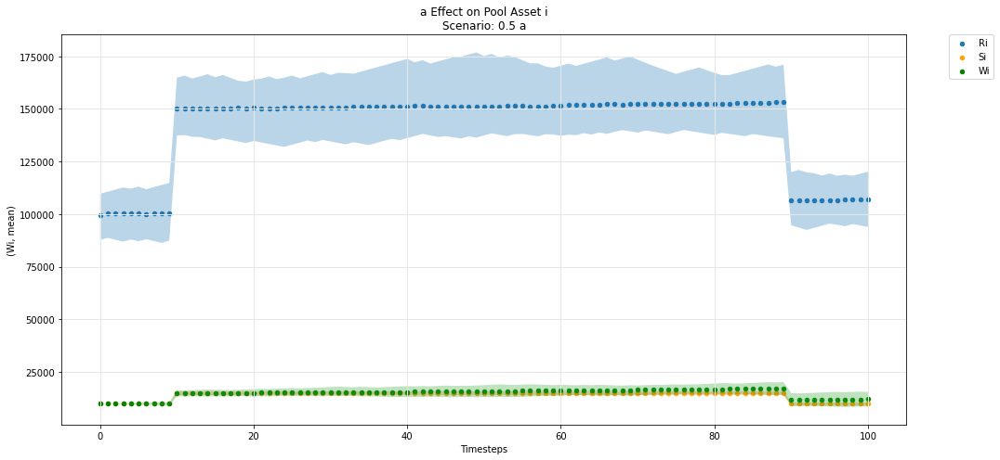

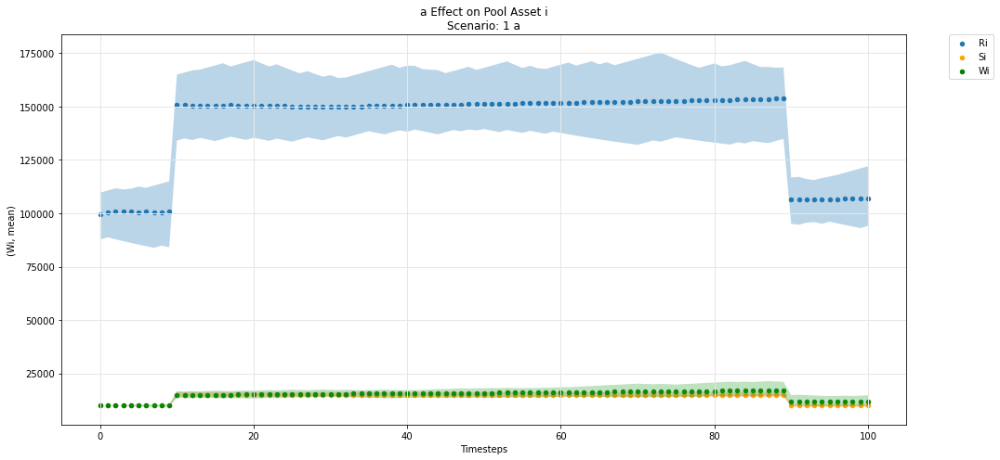

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

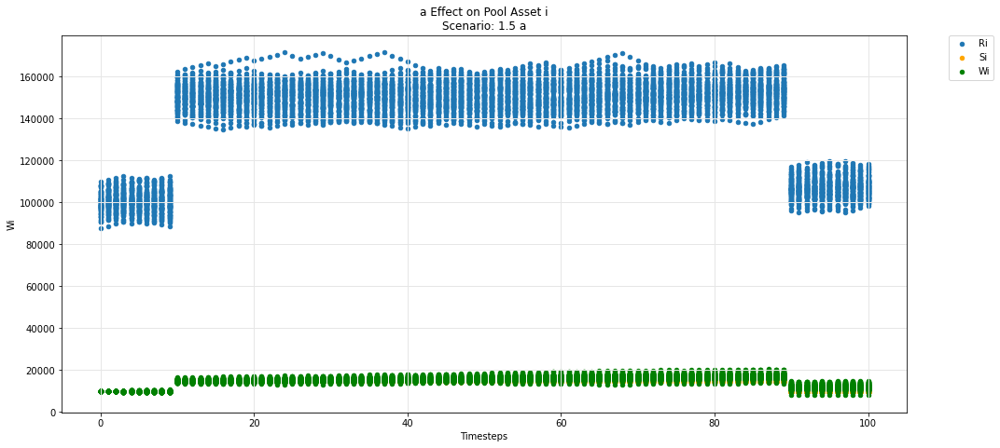

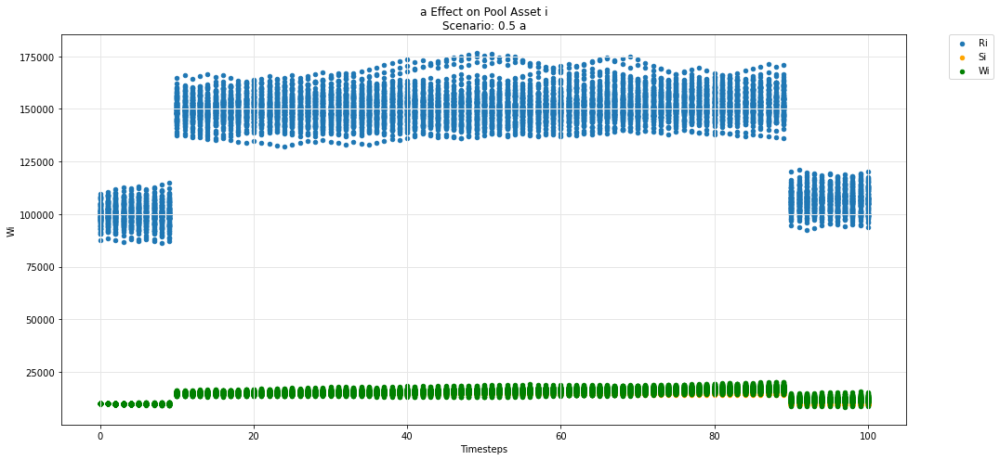

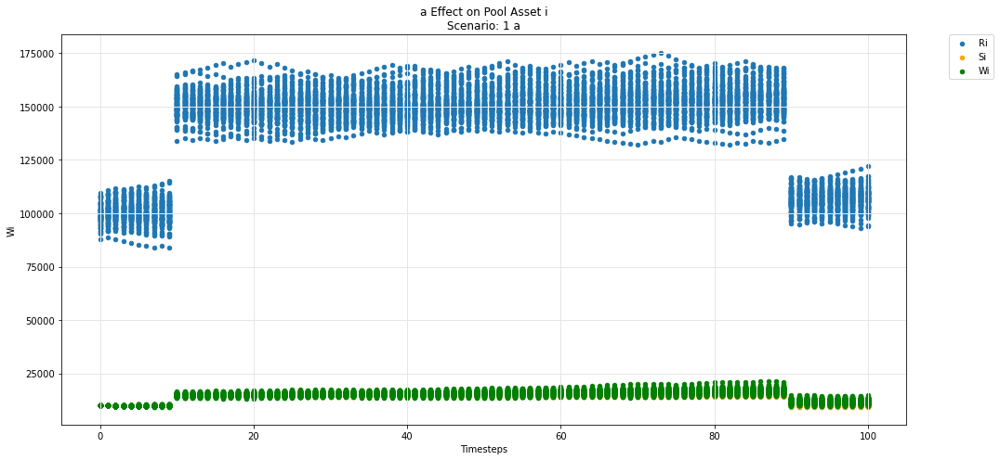

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

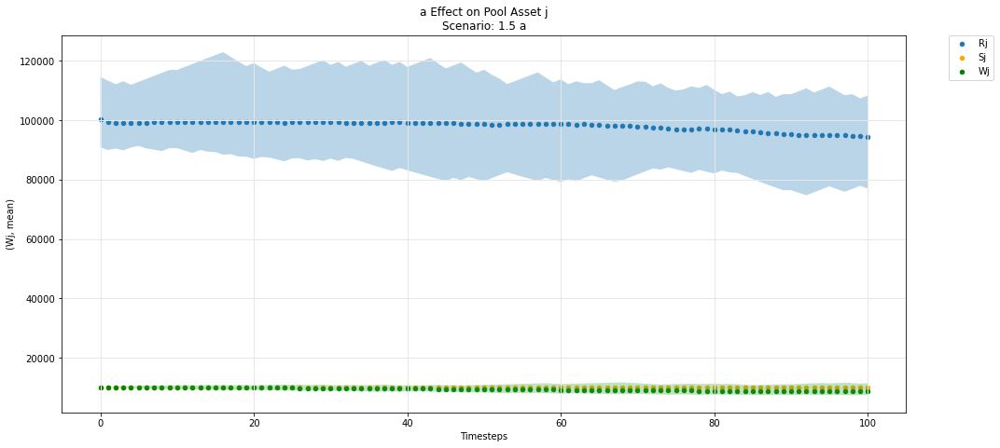

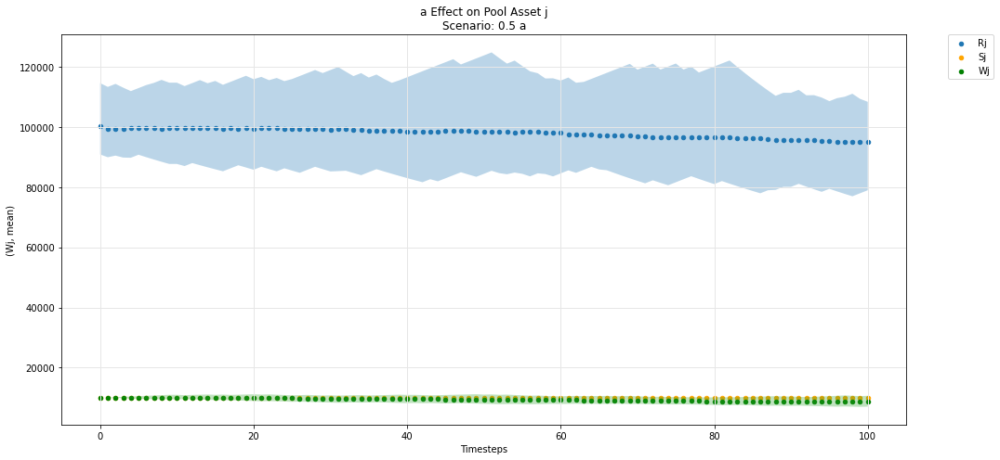

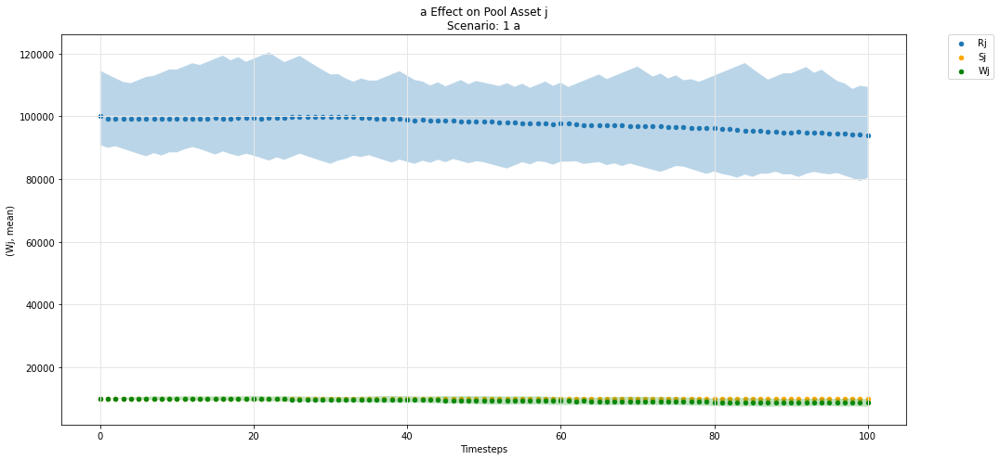

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

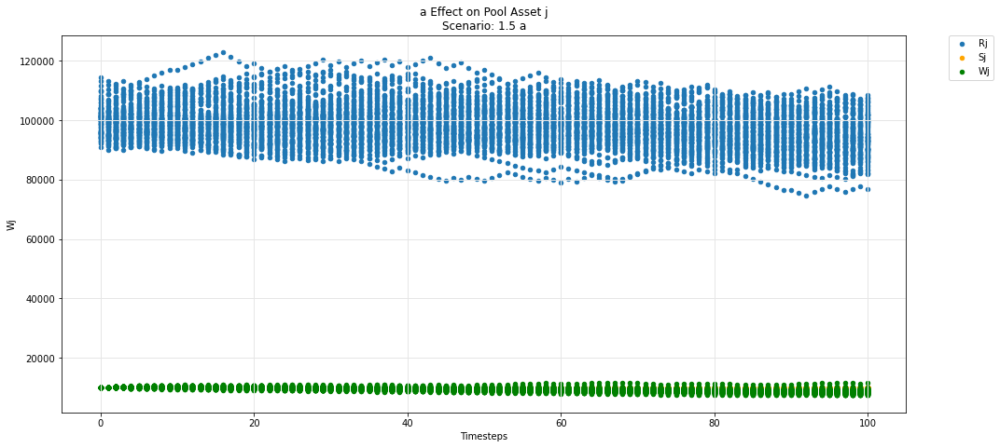

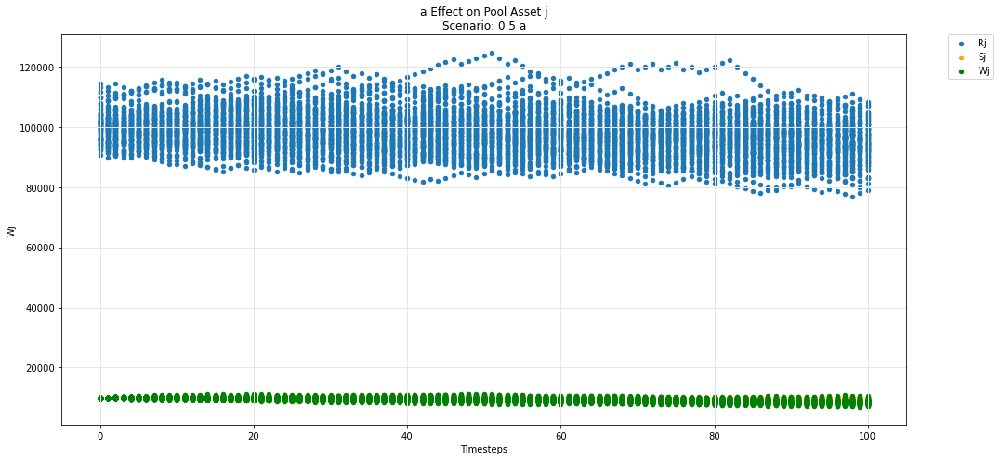

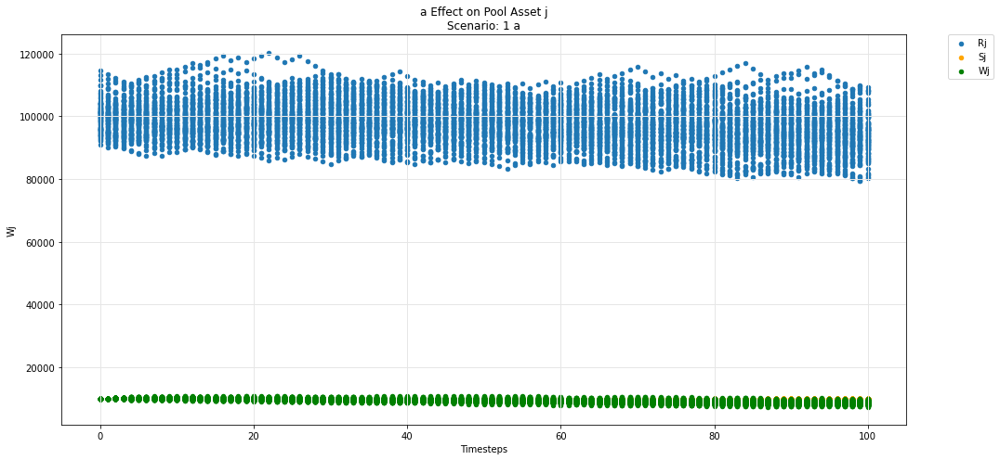

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

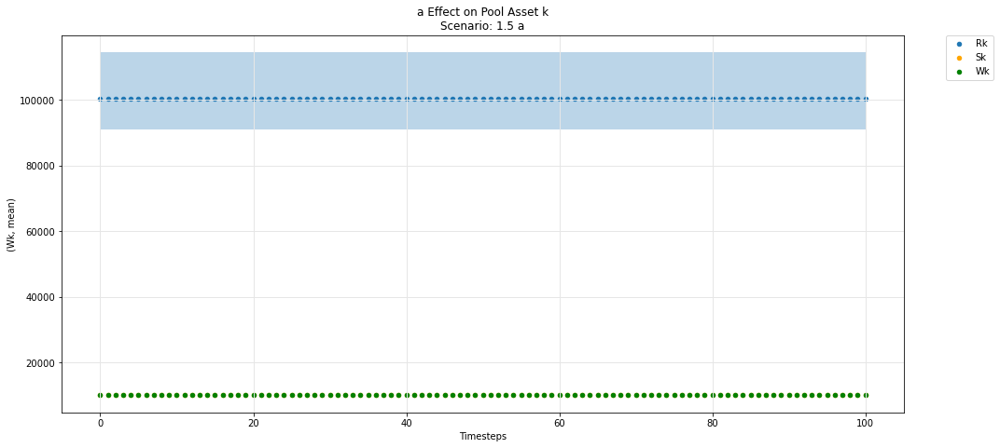

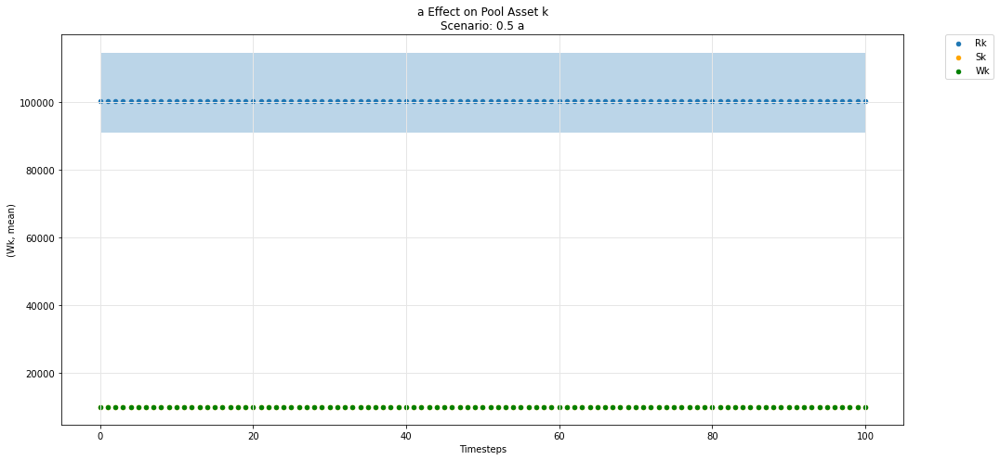

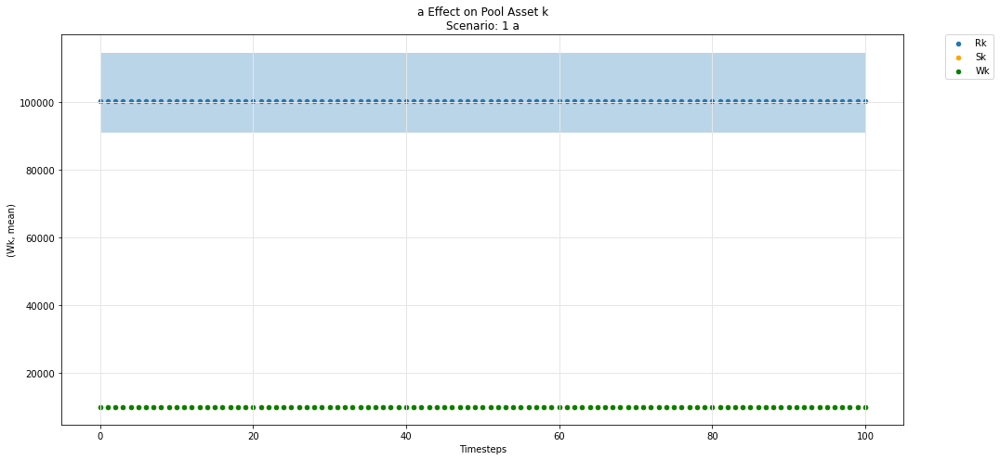

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

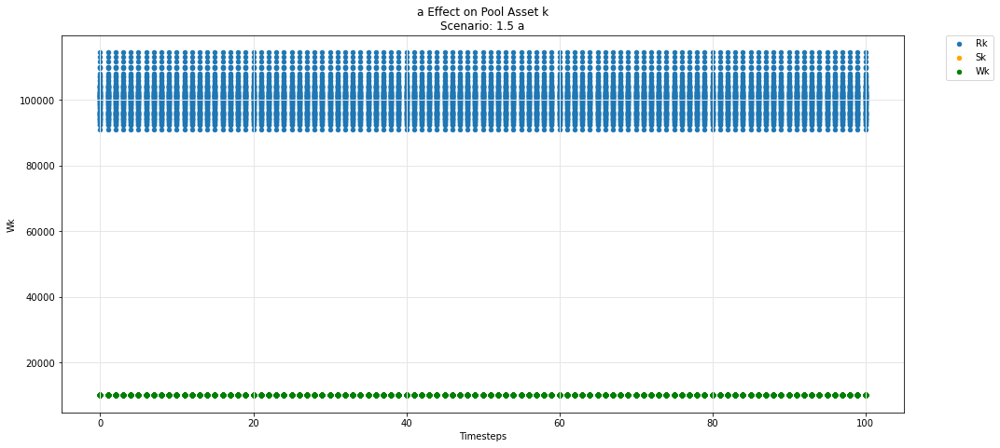

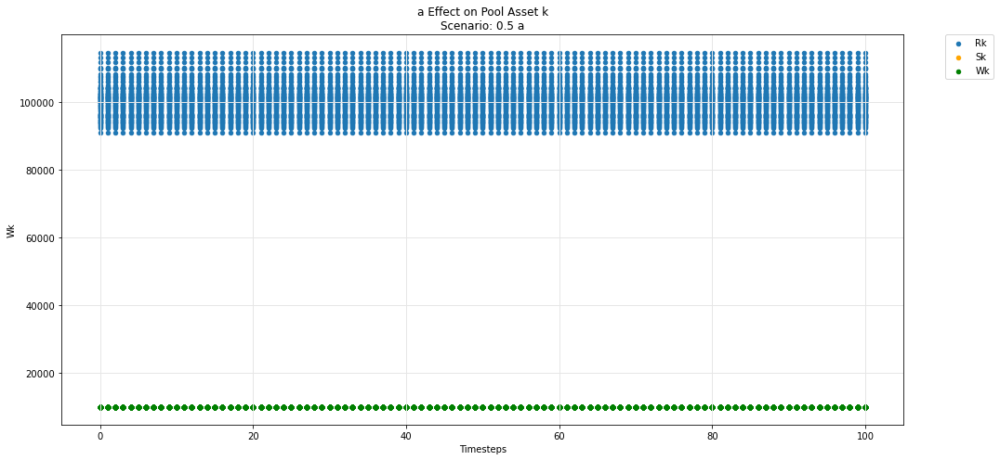

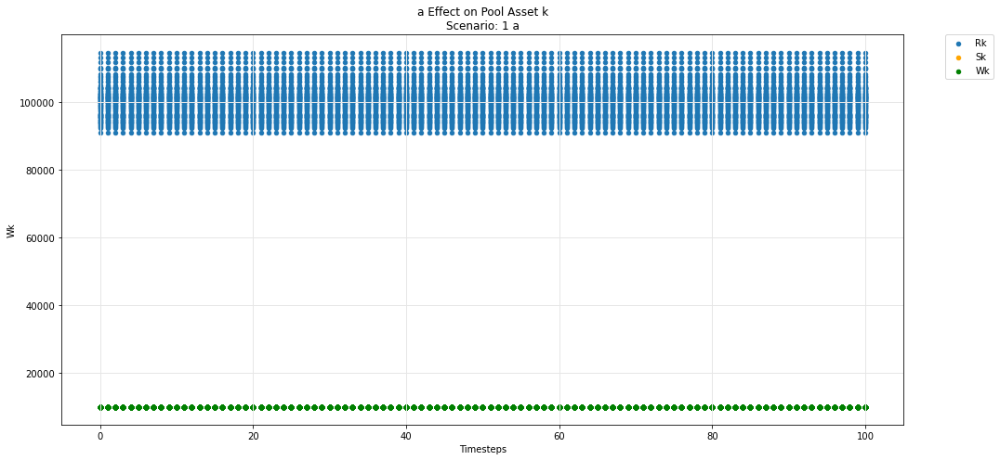

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

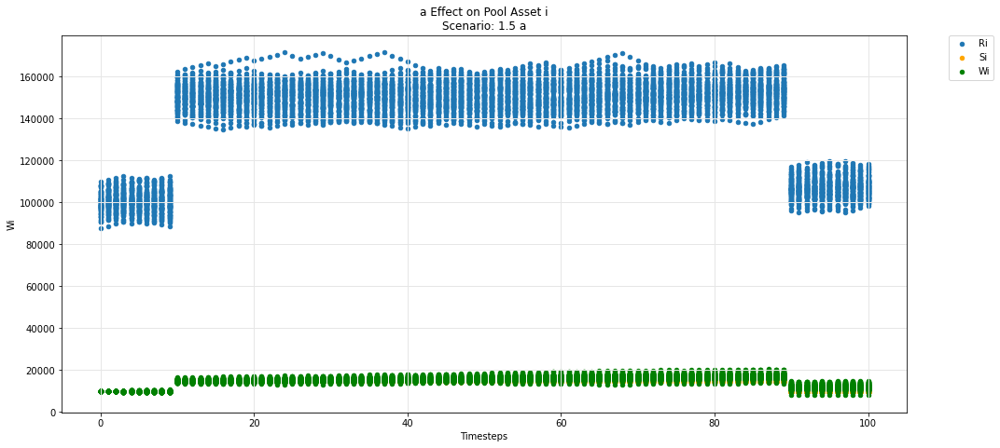

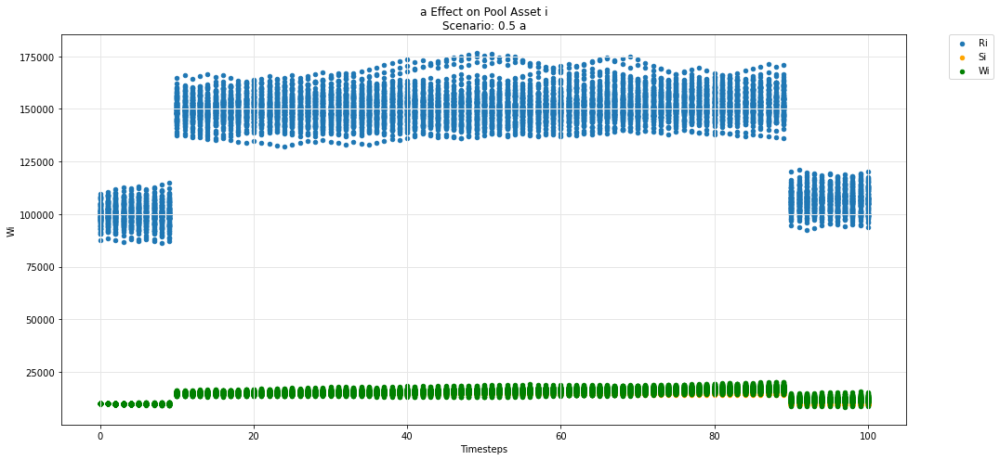

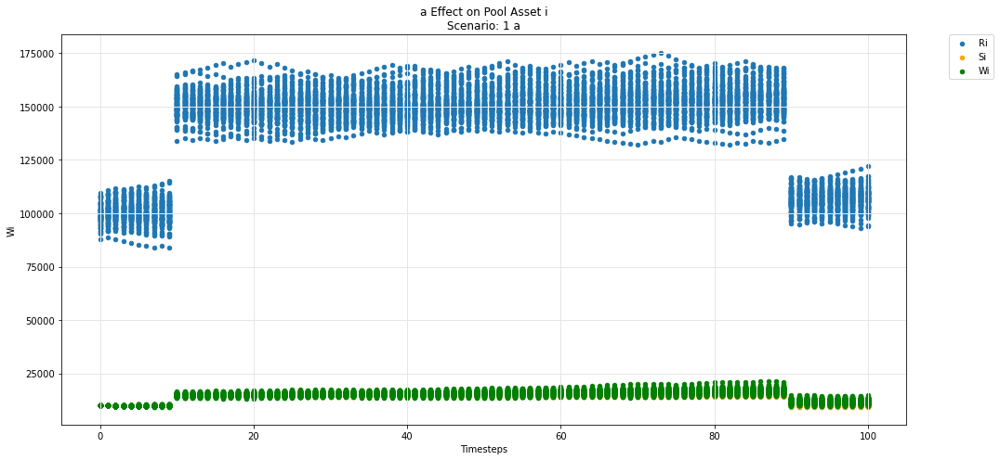

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

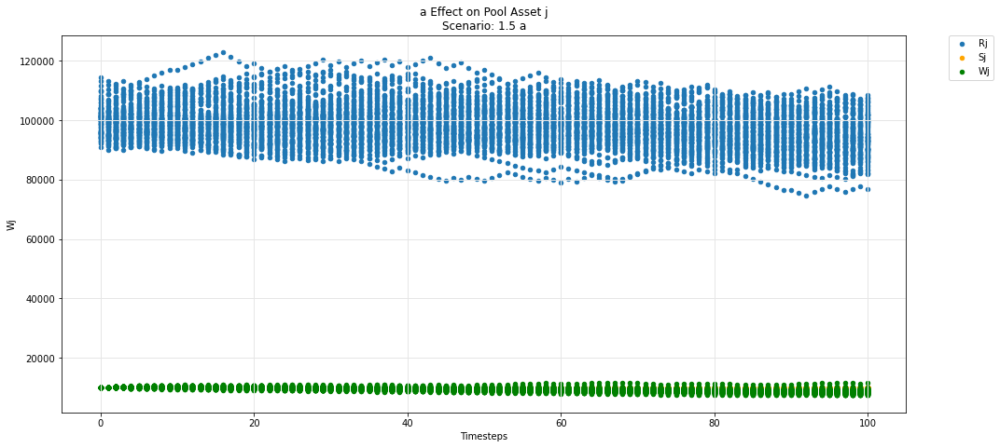

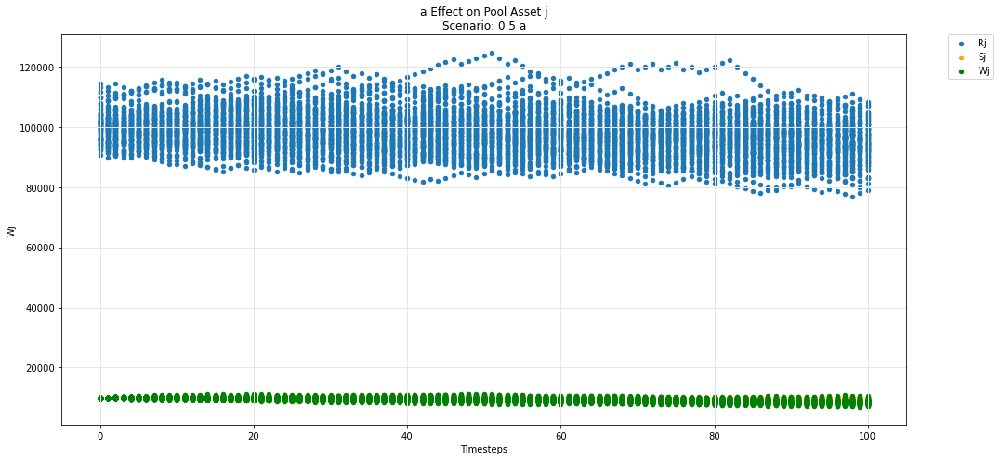

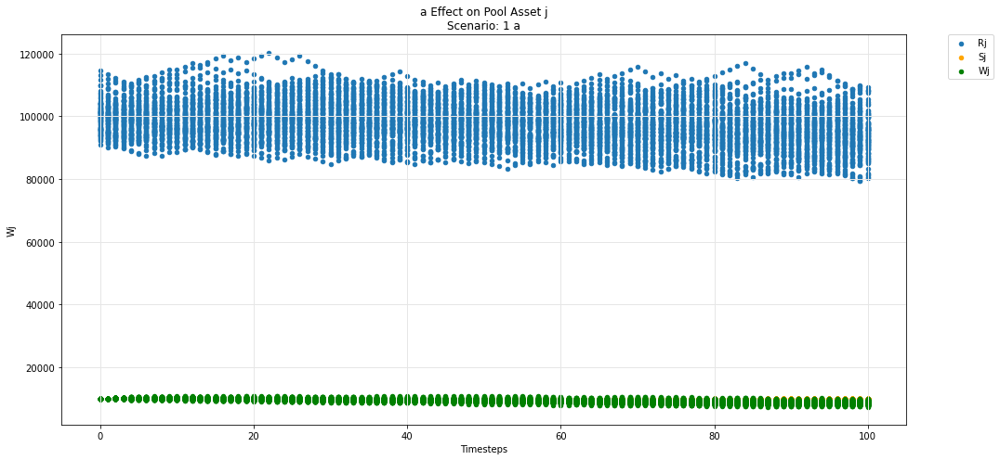

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

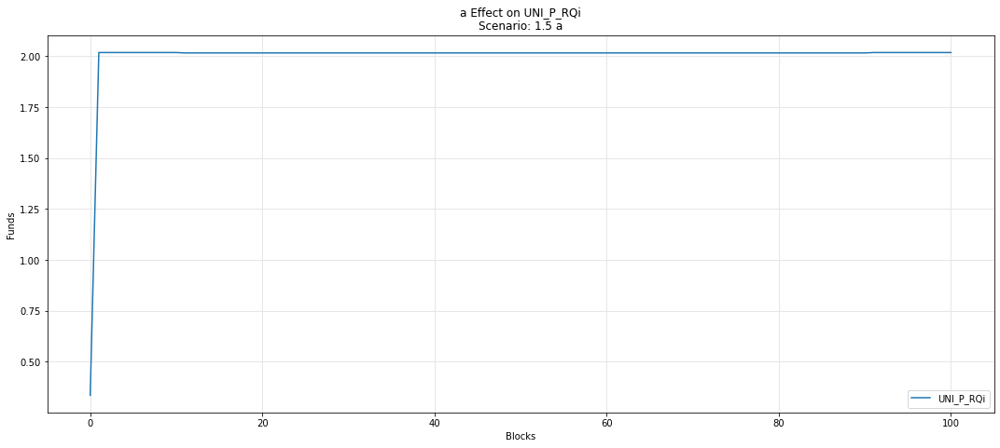

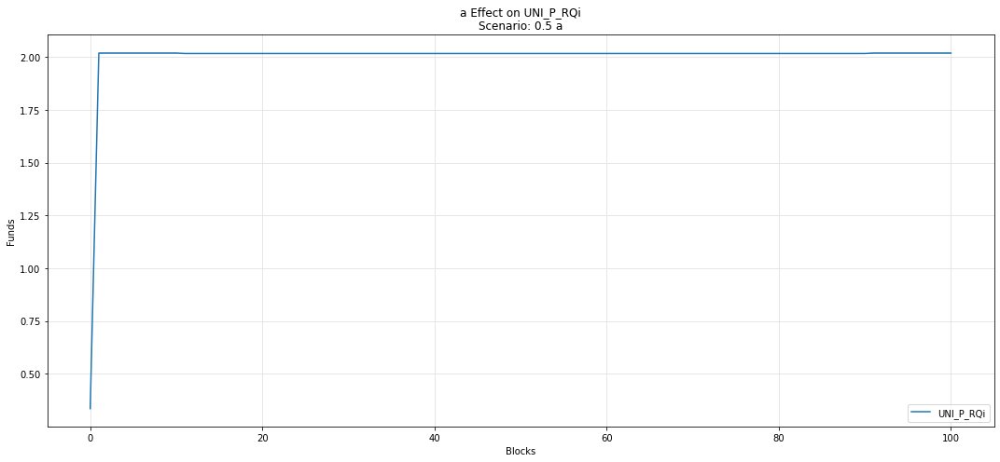

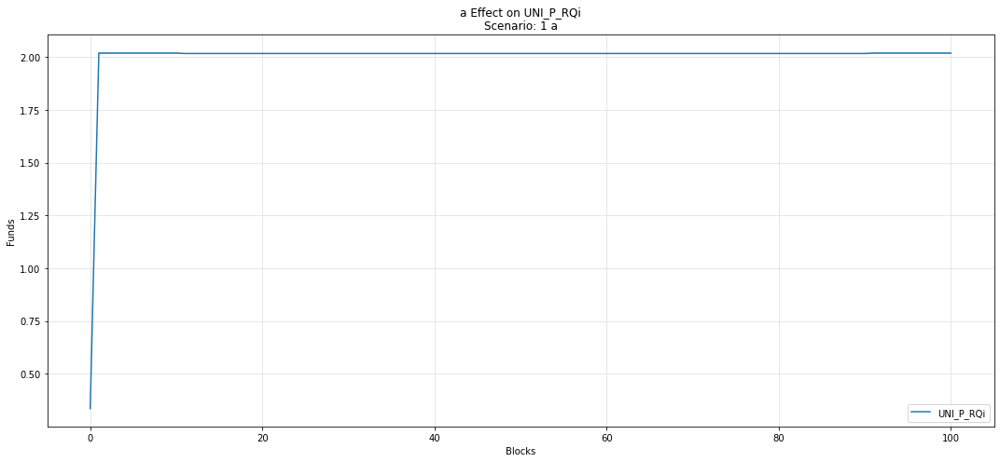

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

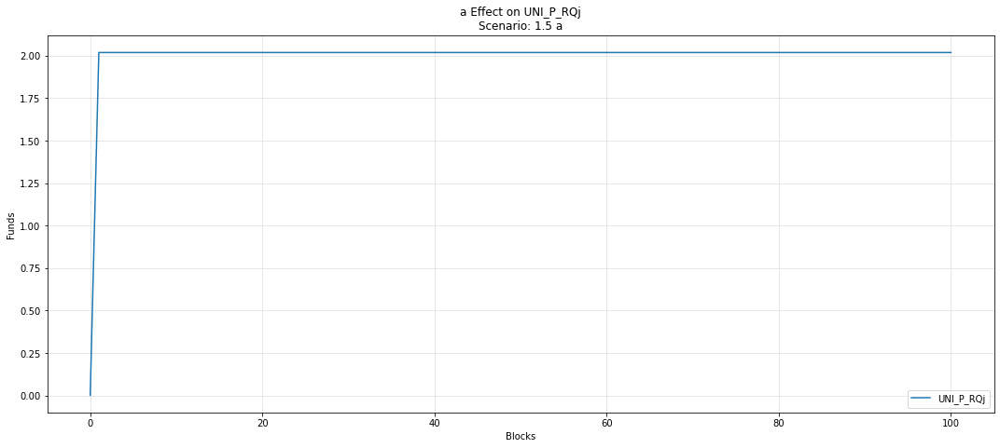

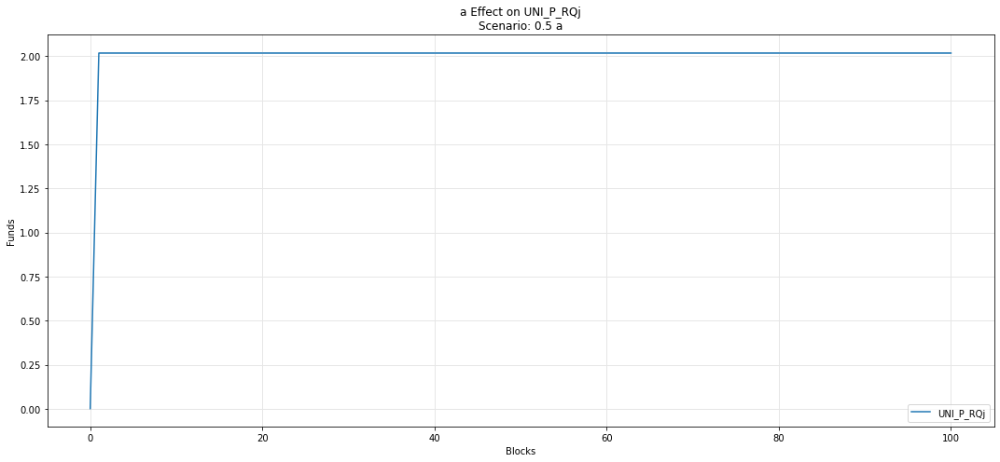

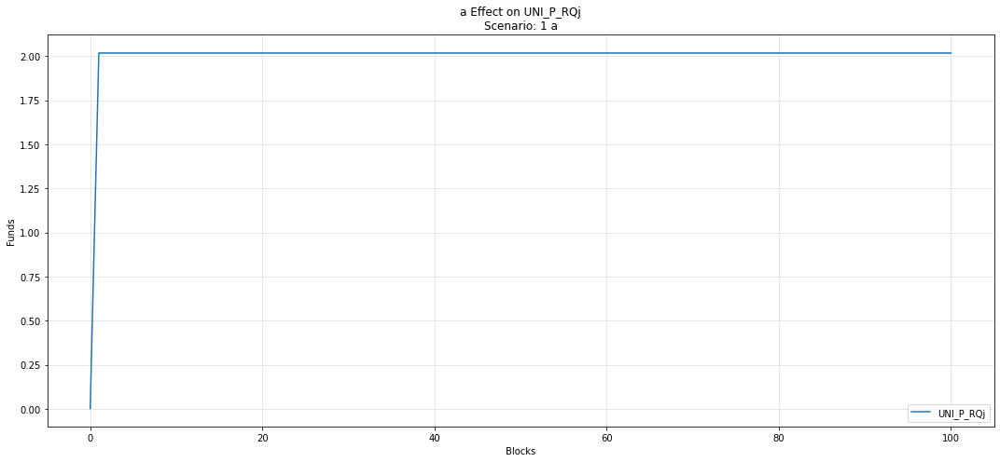

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

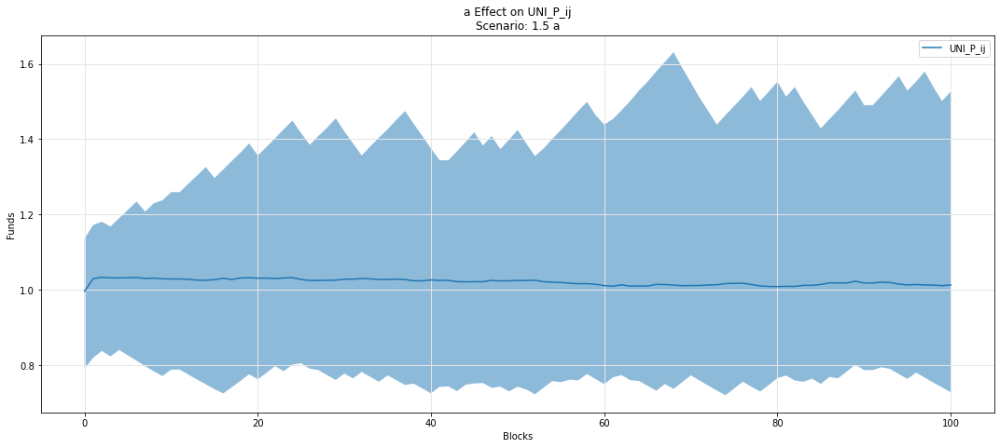

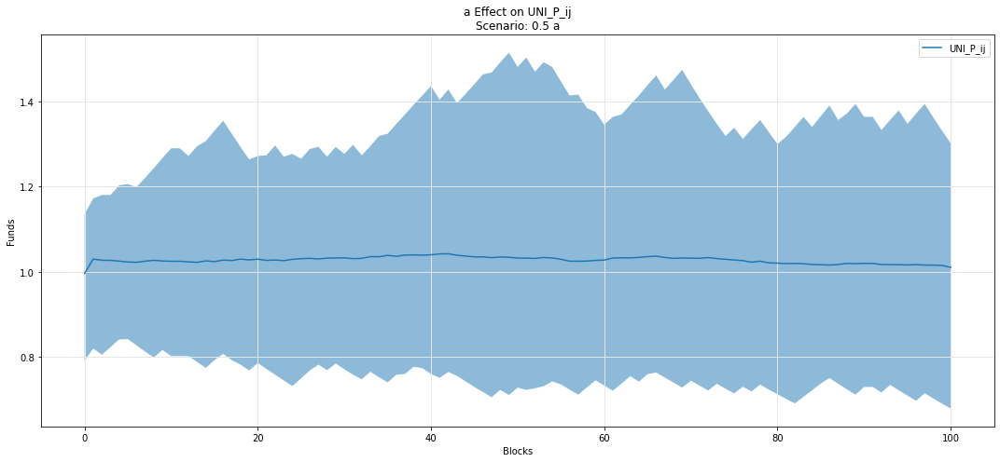

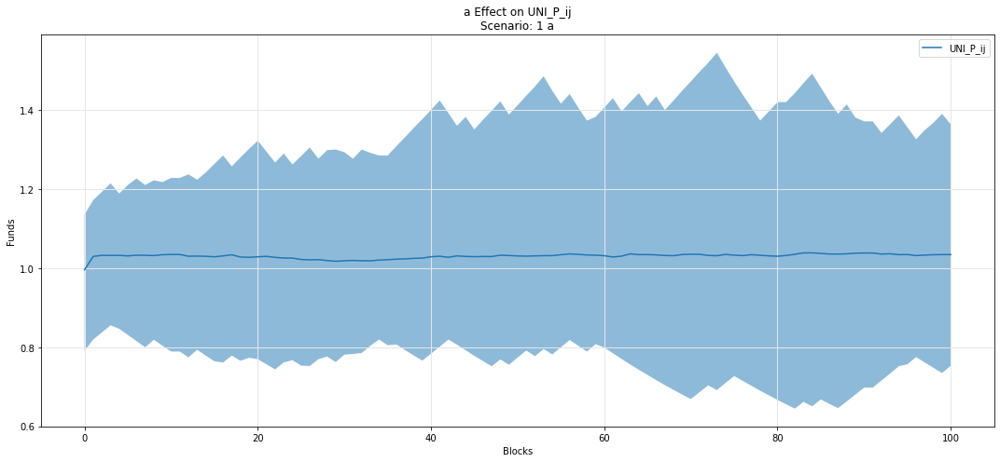

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

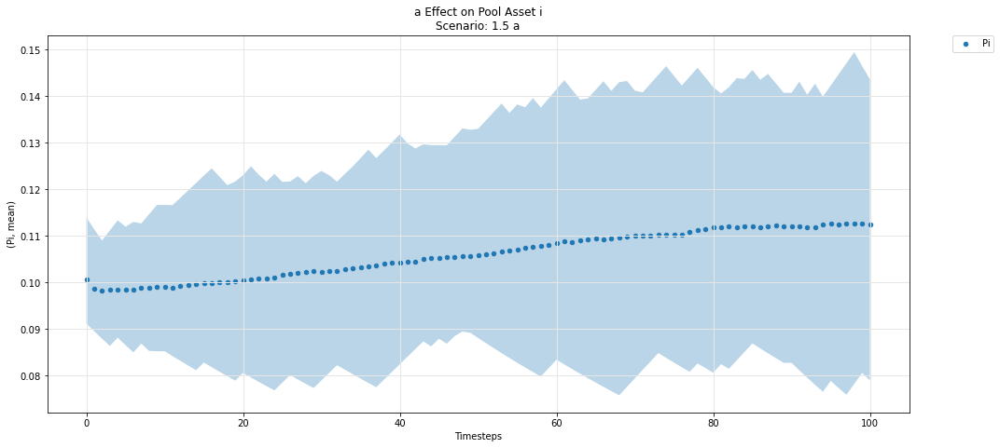

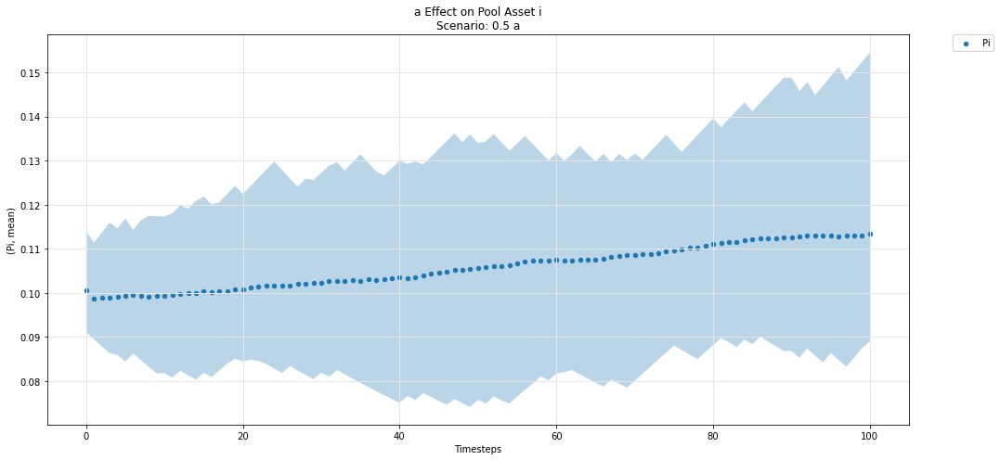

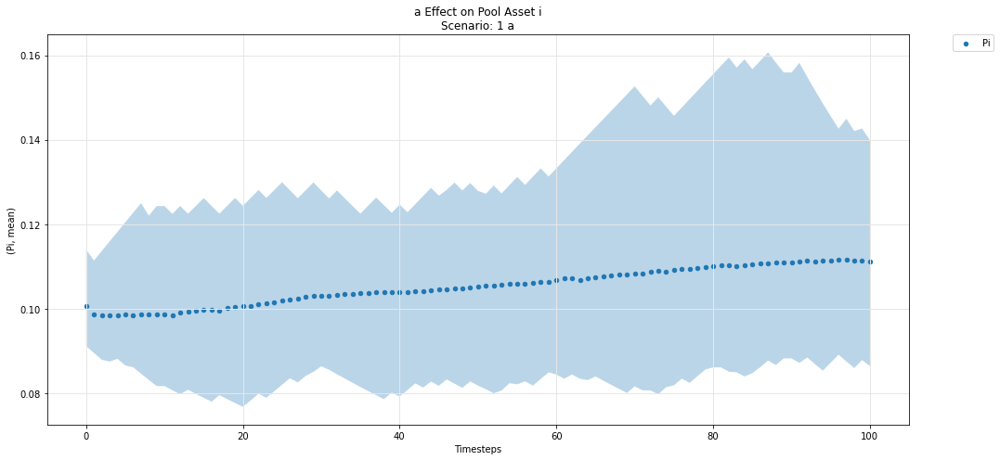

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

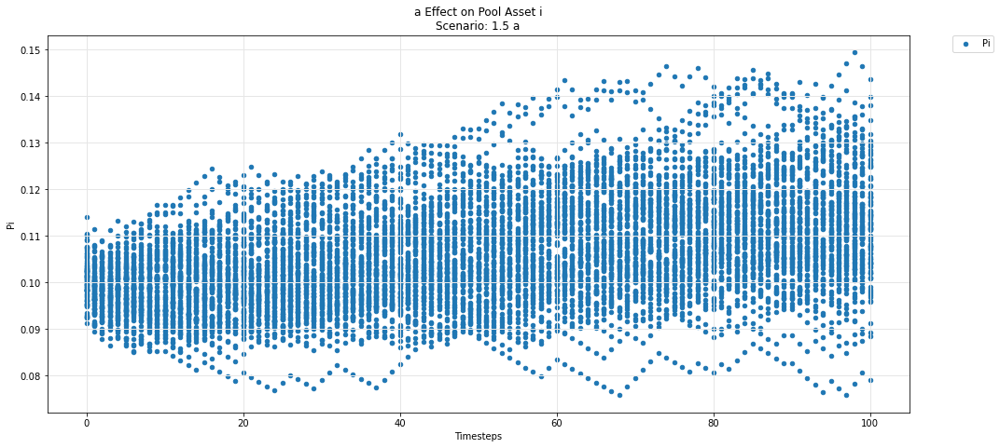

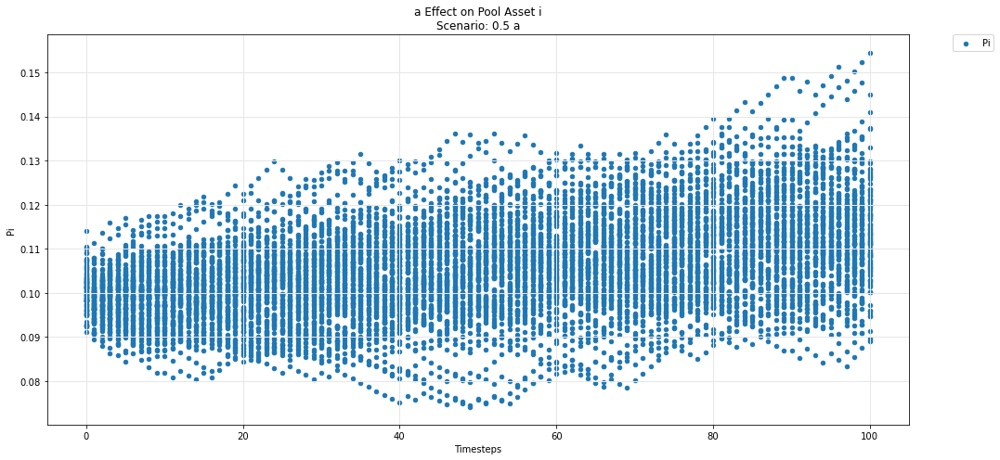

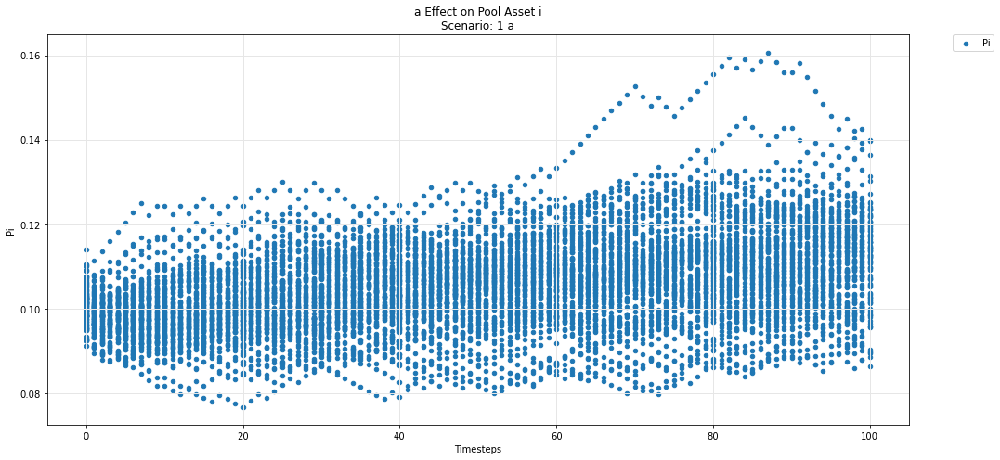

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

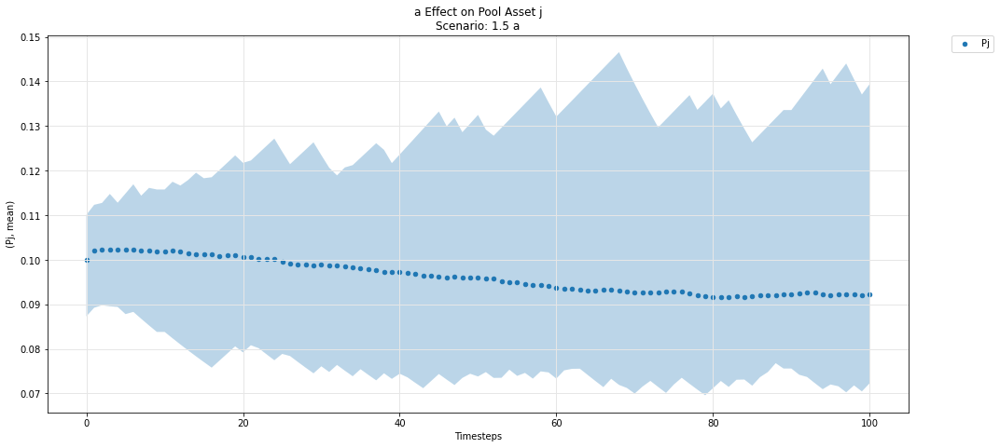

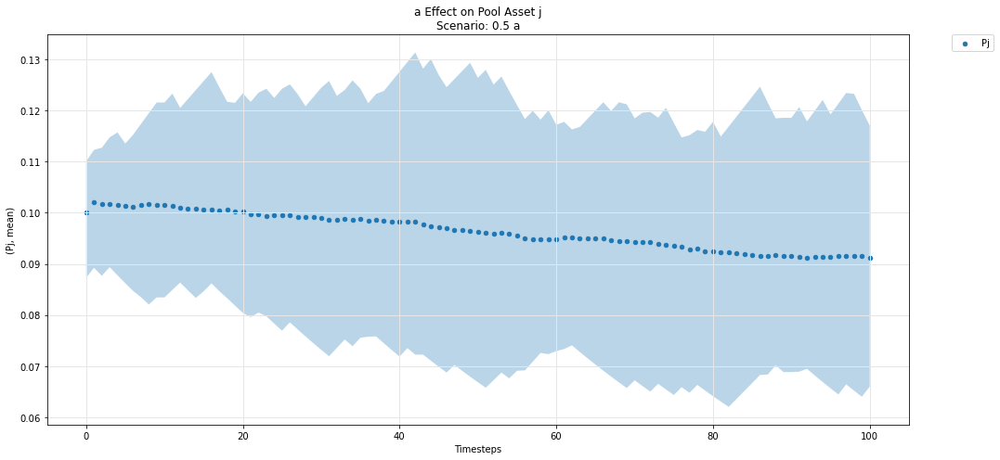

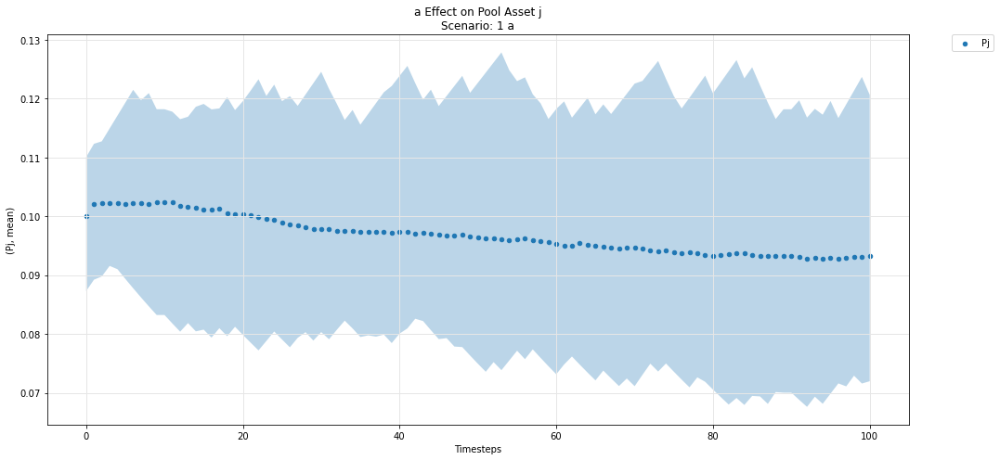

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

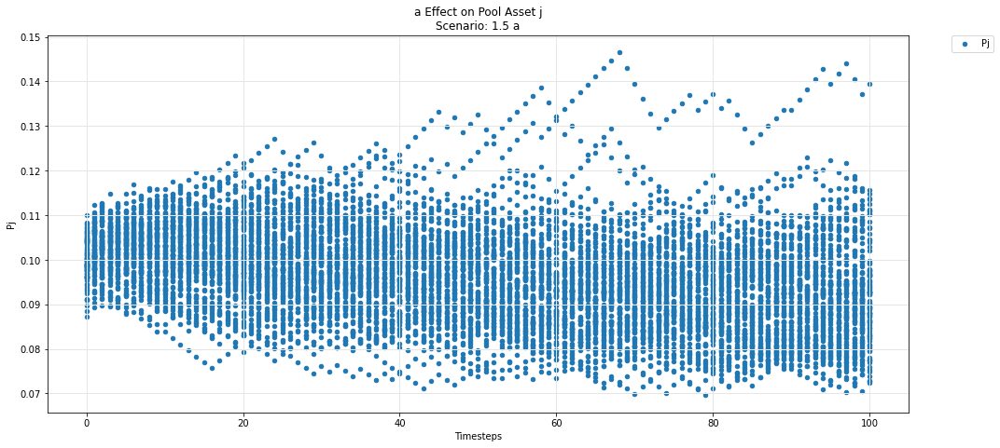

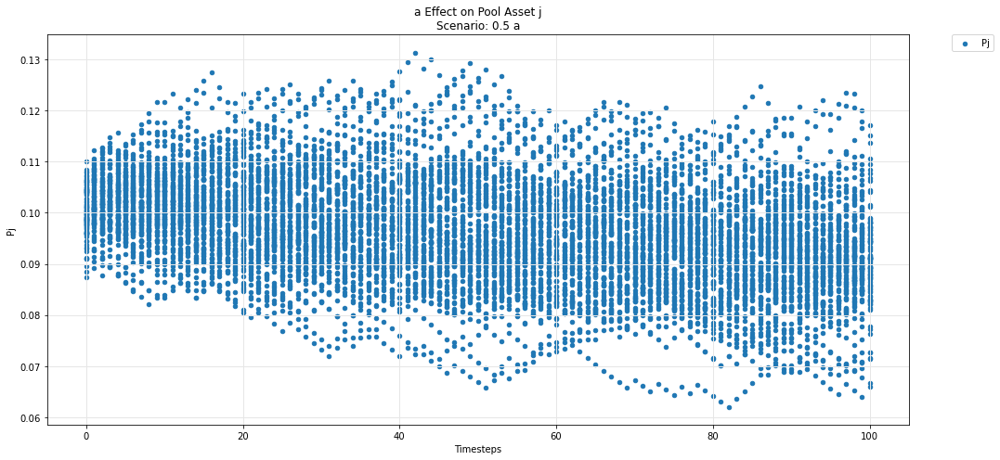

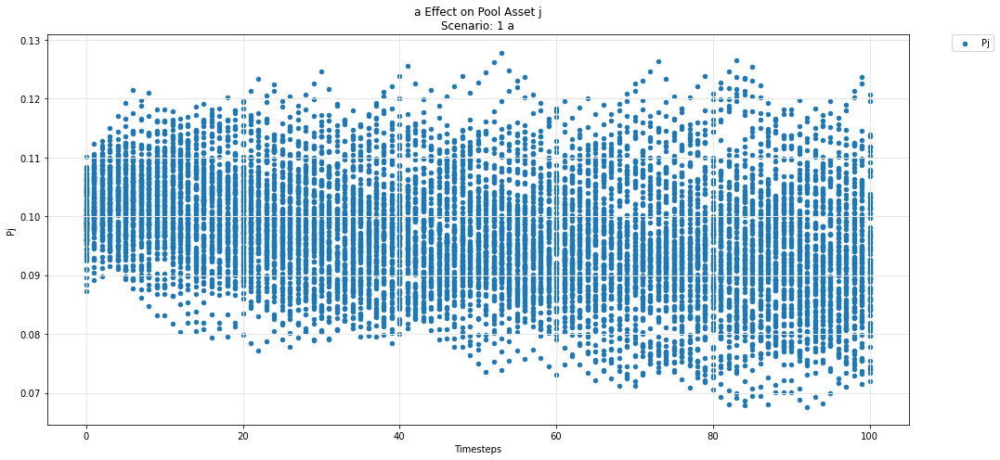

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

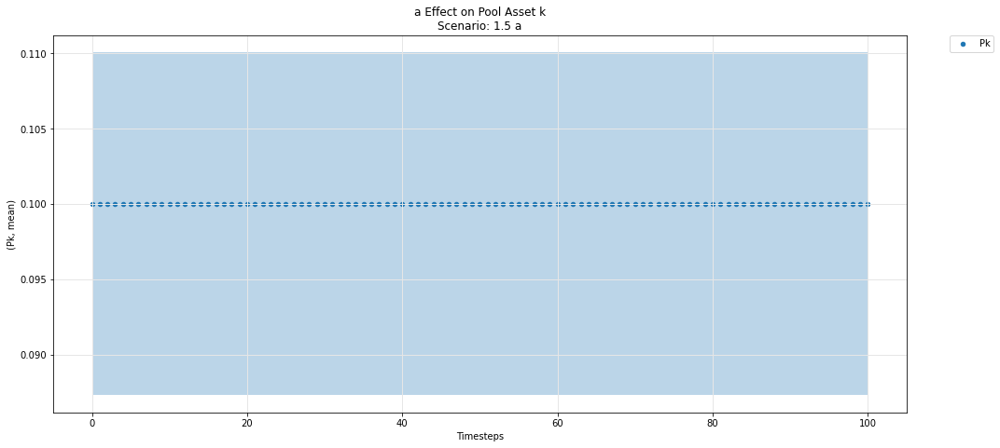

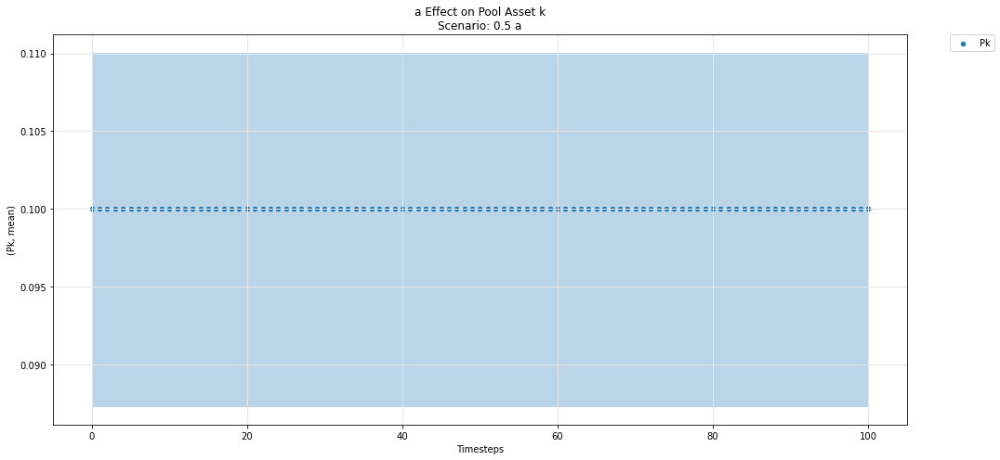

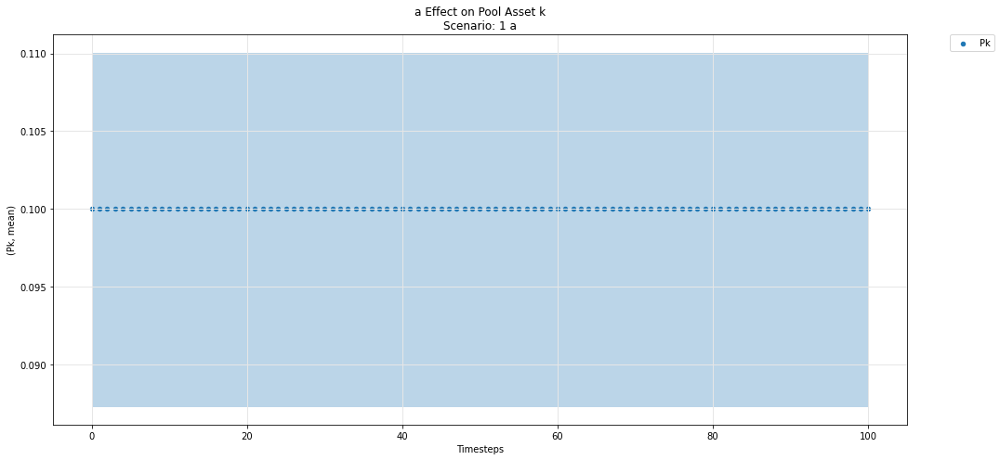

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

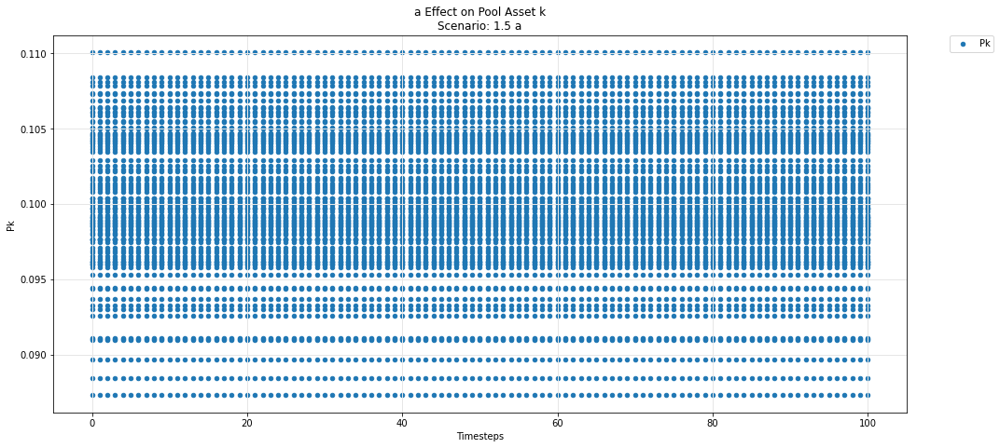

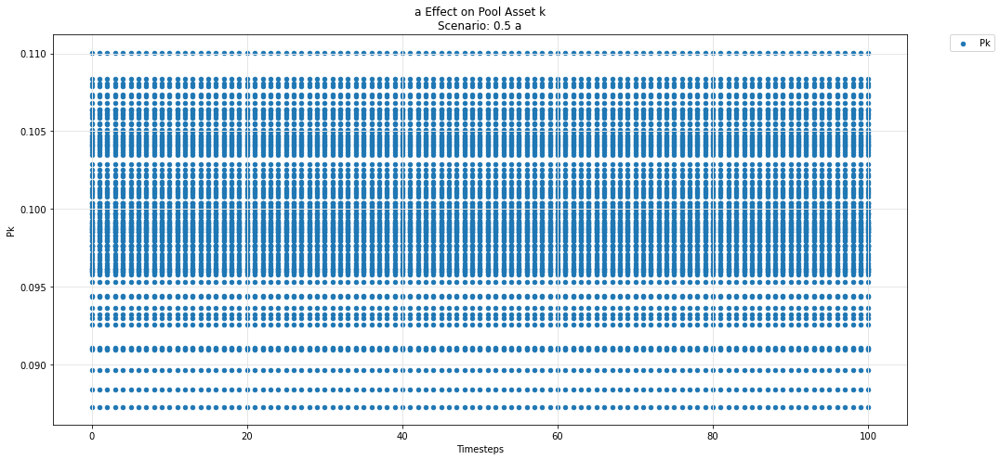

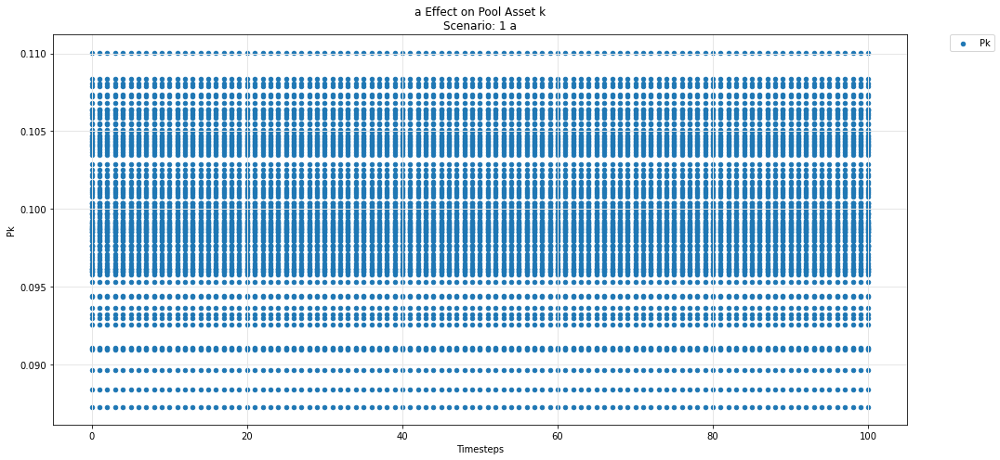

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')